<a href="https://colab.research.google.com/github/Rak16-nub04/Machine-Learning/blob/main/fatigue(bootstrap)_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#original vs synthetic (bootstrap) data analysis

=== DATASET OVERVIEW ===
Dataset Shape: (278, 6)

First few rows:
   Nozzle Diameter  Print Speed  Nozzle Temperature  Stress Level  \
0              0.2            5                 180           5.0   
1              0.2            5                 180           7.5   
2              0.2            5                 180          10.0   
3              0.2            5                 210           2.5   
4              0.2            5                 210           5.0   

   Fatigue Lifetime Data_Source  
0            942000    Original  
1            597800    Original  
2            148900    Original  
3           1500000    Original  
4           1500000    Original  

Data Source distribution:
Data_Source
Original               139
Bootstrap_Synthetic    139
Name: count, dtype: int64


=== BASIC DATA EXPLORATION ===
Basic Statistics:
       Nozzle Diameter  Print Speed  Nozzle Temperature  Stress Level  \
count       278.000000   278.000000          278.000000    278.000000   

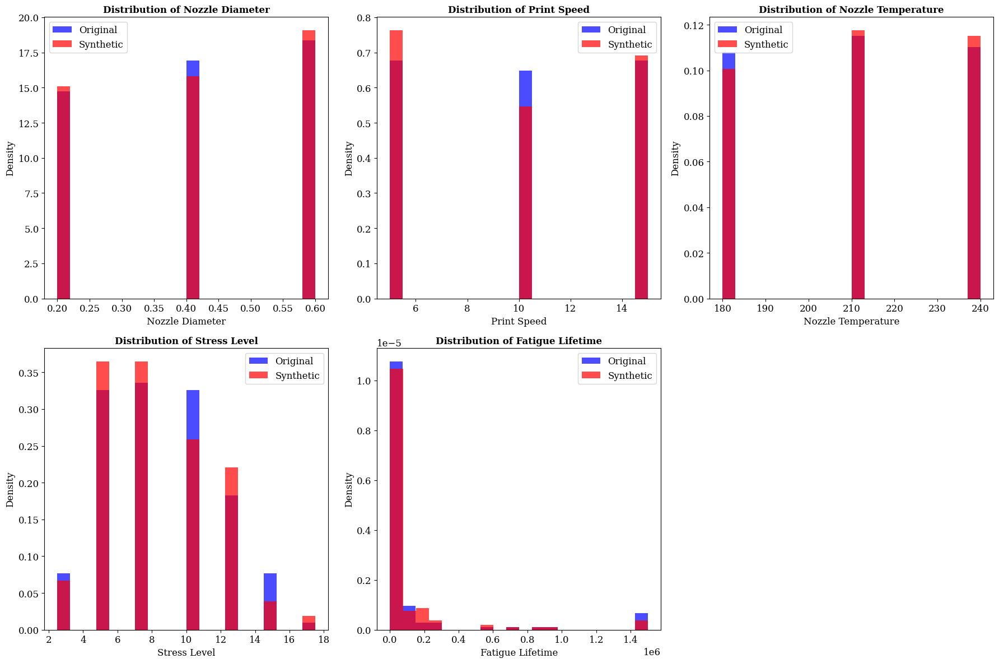


=== STATISTICAL TESTS FOR DISTRIBUTION SIMILARITY ===

Nozzle Diameter:
  KS Test - Statistic: 0.0144, p-value: 1.0000
  T-test - Statistic: -0.0732, p-value: 0.9417
  Mann-Whitney U - Statistic: 9606.5000, p-value: 0.9324
  Original Mean: 0.41 ± 0.16
  Synthetic Mean: 0.42 ± 0.17

Print Speed:
  KS Test - Statistic: 0.0432, p-value: 0.9995
  T-test - Statistic: 0.3569, p-value: 0.7214
  Mann-Whitney U - Statistic: 9890.5000, p-value: 0.7162
  Original Mean: 10.00 ± 4.13
  Synthetic Mean: 9.82 ± 4.27

Nozzle Temperature:
  KS Test - Statistic: 0.0216, p-value: 1.0000
  T-test - Statistic: -0.3706, p-value: 0.7112
  Mann-Whitney U - Statistic: 9427.0000, p-value: 0.7122
  Original Mean: 210.22 ± 24.36
  Synthetic Mean: 211.29 ± 24.19

Stress Level:
  KS Test - Statistic: 0.0432, p-value: 0.9995
  T-test - Statistic: 0.4064, p-value: 0.6848
  Mann-Whitney U - Statistic: 9959.5000, p-value: 0.6478
  Original Mean: 8.40 ± 3.34
  Synthetic Mean: 8.24 ± 3.30

Fatigue Lifetime:
  KS Test - S

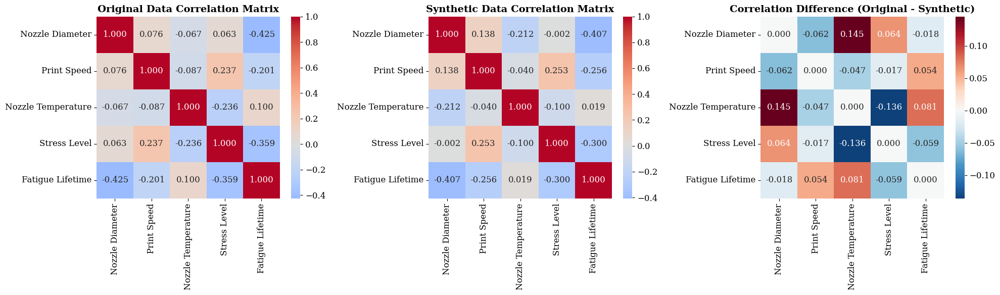

Correlation Matrix Difference (Original - Synthetic):
                    Nozzle Diameter  Print Speed  Nozzle Temperature  \
Nozzle Diameter              0.0000      -0.0619              0.1453   
Print Speed                 -0.0619       0.0000             -0.0467   
Nozzle Temperature           0.1453      -0.0467              0.0000   
Stress Level                 0.0644      -0.0166             -0.1359   
Fatigue Lifetime            -0.0180       0.0543              0.0807   

                    Stress Level  Fatigue Lifetime  
Nozzle Diameter           0.0644           -0.0180  
Print Speed              -0.0166            0.0543  
Nozzle Temperature       -0.1359            0.0807  
Stress Level              0.0000           -0.0587  
Fatigue Lifetime         -0.0587            0.0000  

=== FATIGUE LIFETIME ANALYSIS ===


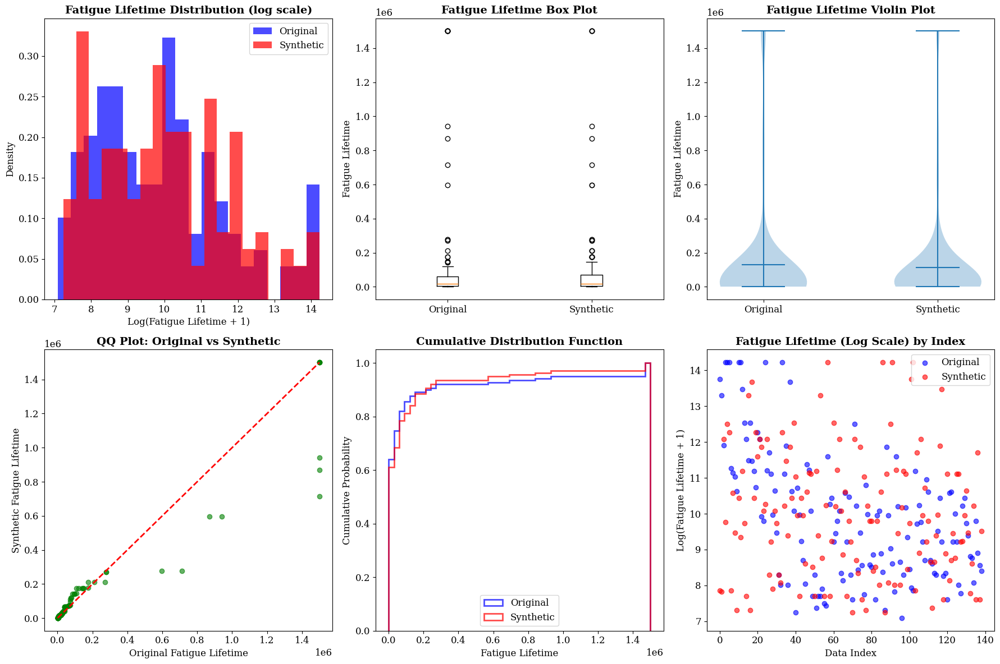


=== MULTIVARIATE ANALYSIS ===


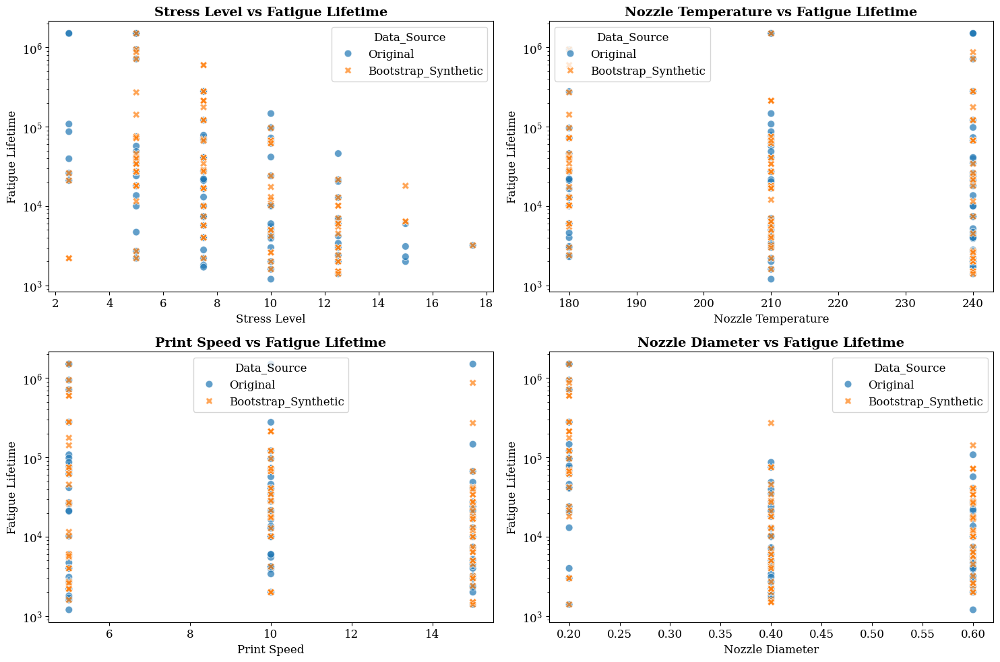

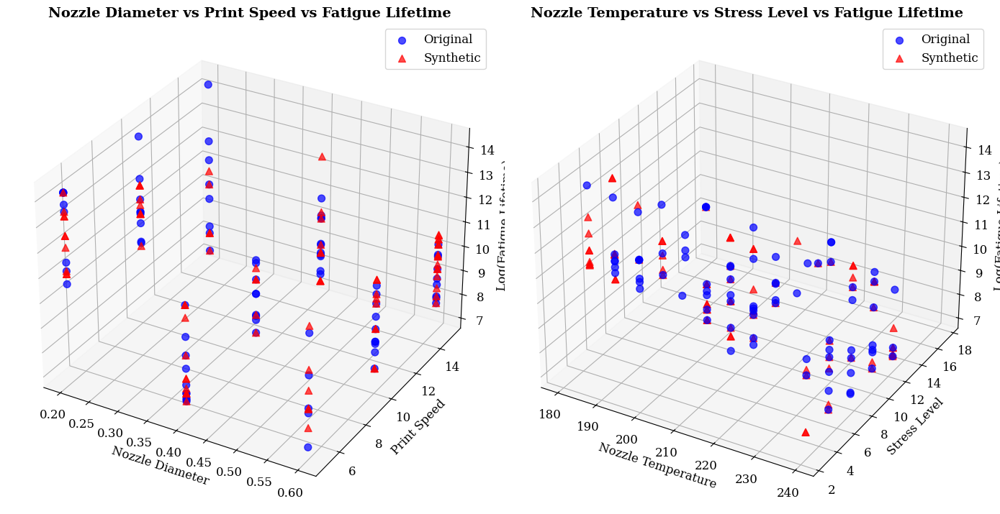


=== SYNTHETIC DATA QUALITY METRICS ===
Synthetic Data Quality Metrics:
                    Mean_Preservation_Rate  Std_Preservation_Rate  \
Nozzle Diameter                     0.9965                 0.9845   
Print Speed                         0.9820                 0.9644   
Nozzle Temperature                  0.9949                 0.9931   
Stress Level                        0.9807                 0.9896   
Fatigue Lifetime                    0.8654                 0.8159   

                    Median_Preservation_Rate  KS_Statistic  Effect_Size  \
Nozzle Diameter                          1.0        0.0144       0.0088   
Print Speed                              1.0        0.0432      -0.0436   
Nozzle Temperature                       1.0        0.0216       0.0443   
Stress Level                             1.0        0.0432      -0.0485   
Fatigue Lifetime                         1.0        0.0719      -0.0511   

                    Coverage_Rate  
Nozzle Diameter           

In [ ]:
# Step 1: Install required packages (if needed)
!pip install seaborn scipy

# Step 2: Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import ks_2samp, ttest_ind
import warnings
warnings.filterwarnings('ignore')



# Read the CSV file
df = pd.read_csv('combined_bootstrap_fatigue.csv')

# Display basic info
print("=== DATASET OVERVIEW ===")
print("Dataset Shape:", df.shape)
print("\nFirst few rows:")
print(df.head())
print("\nData Source distribution:")
print(df['Data_Source'].value_counts())
print("\n" + "="*50)

# Step 4: Basic Data Exploration
print("\n=== BASIC DATA EXPLORATION ===")
print("Basic Statistics:")
print(df.describe())

print("\nMissing Values:")
print(df.isnull().sum())

print("\nData Types:")
print(df.dtypes)

# Step 5: Separate the data
original_data = df[df['Data_Source'] == 'Original']
synthetic_data = df[df['Data_Source'] == 'Bootstrap_Synthetic']

print(f"\nOriginal data points: {len(original_data)}")
print(f"Synthetic data points: {len(synthetic_data)}")

# Step 6: Distribution Comparison
print("\n=== DISTRIBUTION COMPARISON ===")
numerical_cols = ['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level', 'Fatigue Lifetime']

# Create distribution plots
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.ravel()

for i, col in enumerate(numerical_cols):
    axes[i].hist(original_data[col], alpha=0.7, label='Original', bins=20, color='blue', density=True)
    axes[i].hist(synthetic_data[col], alpha=0.7, label='Synthetic', bins=20, color='red', density=True)
    axes[i].set_title(f'Distribution of {col}', fontsize=12, fontweight='bold')
    axes[i].legend()
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Density')

# Remove empty subplot
axes[-1].remove()
plt.tight_layout()
plt.show()

# Step 7: Statistical Tests for Comparison
print("\n=== STATISTICAL TESTS FOR DISTRIBUTION SIMILARITY ===")
print("=" * 60)

statistical_results = []
for col in numerical_cols:
    # Kolmogorov-Smirnov test
    ks_stat, ks_pvalue = ks_2samp(original_data[col], synthetic_data[col])

    # T-test for means
    t_stat, t_pvalue = ttest_ind(original_data[col], synthetic_data[col])

    # Mann-Whitney U test (non-parametric)
    u_stat, u_pvalue = stats.mannwhitneyu(original_data[col], synthetic_data[col])

    print(f"\n{col}:")
    print(f"  KS Test - Statistic: {ks_stat:.4f}, p-value: {ks_pvalue:.4f}")
    print(f"  T-test - Statistic: {t_stat:.4f}, p-value: {t_pvalue:.4f}")
    print(f"  Mann-Whitney U - Statistic: {u_stat:.4f}, p-value: {u_pvalue:.4f}")
    print(f"  Original Mean: {original_data[col].mean():.2f} ± {original_data[col].std():.2f}")
    print(f"  Synthetic Mean: {synthetic_data[col].mean():.2f} ± {synthetic_data[col].std():.2f}")

    statistical_results.append({
        'Variable': col,
        'KS_Statistic': ks_stat,
        'KS_pvalue': ks_pvalue,
        'T_Statistic': t_stat,
        'T_pvalue': t_pvalue,
        'U_Statistic': u_stat,
        'U_pvalue': u_pvalue
    })

# Step 8: Range Comparison
print("\n=== RANGE COMPARISON: ORIGINAL vs SYNTHETIC ===")
print("=" * 70)

range_comparison = []
for col in numerical_cols:
    orig_min = original_data[col].min()
    orig_max = original_data[col].max()
    orig_range = orig_max - orig_min
    orig_iqr = original_data[col].quantile(0.75) - original_data[col].quantile(0.25)

    synth_min = synthetic_data[col].min()
    synth_max = synthetic_data[col].max()
    synth_range = synth_max - synth_min
    synth_iqr = synthetic_data[col].quantile(0.75) - synthetic_data[col].quantile(0.25)

    range_diff = synth_range - orig_range
    range_ratio = synth_range / orig_range if orig_range != 0 else np.nan
    iqr_ratio = synth_iqr / orig_iqr if orig_iqr != 0 else np.nan

    range_comparison.append({
        'Variable': col,
        'Original_Min': orig_min,
        'Original_Max': orig_max,
        'Original_Range': orig_range,
        'Synthetic_Min': synth_min,
        'Synthetic_Max': synth_max,
        'Synthetic_Range': synth_range,
        'Range_Difference': range_diff,
        'Range_Ratio': range_ratio,
        'IQR_Ratio': iqr_ratio
    })

range_df = pd.DataFrame(range_comparison)
print(range_df.round(4))

# Step 9: Correlation Analysis
print("\n=== CORRELATION ANALYSIS ===")

# Correlation matrices comparison
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))

# Original data correlation
orig_corr = original_data[numerical_cols].corr()
sns.heatmap(orig_corr, annot=True, cmap='coolwarm', center=0, ax=ax1, fmt='.3f')
ax1.set_title('Original Data Correlation Matrix', fontweight='bold')

# Synthetic data correlation
synth_corr = synthetic_data[numerical_cols].corr()
sns.heatmap(synth_corr, annot=True, cmap='coolwarm', center=0, ax=ax2, fmt='.3f')
ax2.set_title('Synthetic Data Correlation Matrix', fontweight='bold')

# Correlation difference
corr_diff = orig_corr - synth_corr
sns.heatmap(corr_diff, annot=True, cmap='RdBu_r', center=0, ax=ax3, fmt='.3f')
ax3.set_title('Correlation Difference (Original - Synthetic)', fontweight='bold')

plt.tight_layout()
plt.show()

print("Correlation Matrix Difference (Original - Synthetic):")
print(corr_diff.round(4))

# Step 10: Fatigue Lifetime Analysis
print("\n=== FATIGUE LIFETIME ANALYSIS ===")

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Distribution comparison (log scale)
axes[0,0].hist(np.log1p(original_data['Fatigue Lifetime']), alpha=0.7, label='Original', bins=20, color='blue', density=True)
axes[0,0].hist(np.log1p(synthetic_data['Fatigue Lifetime']), alpha=0.7, label='Synthetic', bins=20, color='red', density=True)
axes[0,0].set_title('Fatigue Lifetime Distribution (log scale)', fontweight='bold')
axes[0,0].legend()
axes[0,0].set_xlabel('Log(Fatigue Lifetime + 1)')
axes[0,0].set_ylabel('Density')

# Box plot
box_data = [original_data['Fatigue Lifetime'], synthetic_data['Fatigue Lifetime']]
axes[0,1].boxplot(box_data, labels=['Original', 'Synthetic'])
axes[0,1].set_title('Fatigue Lifetime Box Plot', fontweight='bold')
axes[0,1].set_ylabel('Fatigue Lifetime')

# Violin plot
violin_data = [original_data['Fatigue Lifetime'], synthetic_data['Fatigue Lifetime']]
axes[0,2].violinplot(violin_data, showmeans=True)
axes[0,2].set_xticks([1, 2])
axes[0,2].set_xticklabels(['Original', 'Synthetic'])
axes[0,2].set_title('Fatigue Lifetime Violin Plot', fontweight='bold')
axes[0,2].set_ylabel('Fatigue Lifetime')

# QQ plot
sorted_orig = np.sort(original_data['Fatigue Lifetime'])
sorted_synth = np.sort(synthetic_data['Fatigue Lifetime'])

# Use common length for QQ plot
min_len = min(len(sorted_orig), len(sorted_synth))
axes[1,0].scatter(sorted_orig[:min_len], sorted_synth[:min_len], alpha=0.6, color='green')
axes[1,0].plot([sorted_orig.min(), sorted_orig.max()], [sorted_orig.min(), sorted_orig.max()], 'r--', linewidth=2)
axes[1,0].set_xlabel('Original Fatigue Lifetime')
axes[1,0].set_ylabel('Synthetic Fatigue Lifetime')
axes[1,0].set_title('QQ Plot: Original vs Synthetic', fontweight='bold')

# Cumulative distribution
axes[1,1].hist(original_data['Fatigue Lifetime'], cumulative=True, density=True,
               alpha=0.7, label='Original', bins=50, histtype='step', linewidth=2, color='blue')
axes[1,1].hist(synthetic_data['Fatigue Lifetime'], cumulative=True, density=True,
               alpha=0.7, label='Synthetic', bins=50, histtype='step', linewidth=2, color='red')
axes[1,1].set_title('Cumulative Distribution Function', fontweight='bold')
axes[1,1].set_xlabel('Fatigue Lifetime')
axes[1,1].set_ylabel('Cumulative Probability')
axes[1,1].legend()

# Log-scale scatter
axes[1,2].scatter(range(len(original_data)), np.log1p(original_data['Fatigue Lifetime']),
                 alpha=0.6, label='Original', color='blue')
axes[1,2].scatter(range(len(synthetic_data)), np.log1p(synthetic_data['Fatigue Lifetime']),
                 alpha=0.6, label='Synthetic', color='red')
axes[1,2].set_title('Fatigue Lifetime (Log Scale) by Index', fontweight='bold')
axes[1,2].set_xlabel('Data Index')
axes[1,2].set_ylabel('Log(Fatigue Lifetime + 1)')
axes[1,2].legend()

plt.tight_layout()
plt.show()

# Step 11: Multivariate Analysis
print("\n=== MULTIVARIATE ANALYSIS ===")

# Pairplot for small sample
sample_orig = original_data.sample(min(100, len(original_data)), random_state=42)
sample_synth = synthetic_data.sample(min(100, len(synthetic_data)), random_state=42)
comparison_sample = pd.concat([sample_orig, sample_synth])

plt.figure(figsize=(15, 10))

# Subplot 1: Stress Level vs Fatigue Lifetime
plt.subplot(2, 2, 1)
sns.scatterplot(data=comparison_sample, x='Stress Level', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Stress Level vs Fatigue Lifetime', fontweight='bold')
plt.yscale('log')

# Subplot 2: Nozzle Temperature vs Fatigue Lifetime
plt.subplot(2, 2, 2)
sns.scatterplot(data=comparison_sample, x='Nozzle Temperature', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Nozzle Temperature vs Fatigue Lifetime', fontweight='bold')
plt.yscale('log')

# Subplot 3: Print Speed vs Fatigue Lifetime
plt.subplot(2, 2, 3)
sns.scatterplot(data=comparison_sample, x='Print Speed', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Print Speed vs Fatigue Lifetime', fontweight='bold')
plt.yscale('log')

# Subplot 4: Nozzle Diameter vs Fatigue Lifetime
plt.subplot(2, 2, 4)
sns.scatterplot(data=comparison_sample, x='Nozzle Diameter', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Nozzle Diameter vs Fatigue Lifetime', fontweight='bold')
plt.yscale('log')

plt.tight_layout()
plt.show()

# 3D scatter plot
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(14, 10))

# First 3D plot
ax1 = fig.add_subplot(121, projection='3d')
sample_size = min(80, len(original_data), len(synthetic_data))
orig_sample = original_data.sample(sample_size, random_state=42)
synth_sample = synthetic_data.sample(sample_size, random_state=42)

sc1 = ax1.scatter(orig_sample['Nozzle Diameter'], orig_sample['Print Speed'],
           np.log1p(orig_sample['Fatigue Lifetime']),
           c='blue', label='Original', alpha=0.7, s=50)
sc2 = ax1.scatter(synth_sample['Nozzle Diameter'], synth_sample['Print Speed'],
           np.log1p(synth_sample['Fatigue Lifetime']),
           c='red', label='Synthetic', alpha=0.7, s=50, marker='^')

ax1.set_xlabel('Nozzle Diameter')
ax1.set_ylabel('Print Speed')
ax1.set_zlabel('Log(Fatigue Lifetime)')
ax1.set_title('Nozzle Diameter vs Print Speed vs Fatigue Lifetime', fontweight='bold')
ax1.legend()

# Second 3D plot
ax2 = fig.add_subplot(122, projection='3d')
sc3 = ax2.scatter(orig_sample['Nozzle Temperature'], orig_sample['Stress Level'],
           np.log1p(orig_sample['Fatigue Lifetime']),
           c='blue', label='Original', alpha=0.7, s=50)
sc4 = ax2.scatter(synth_sample['Nozzle Temperature'], synth_sample['Stress Level'],
           np.log1p(synth_sample['Fatigue Lifetime']),
           c='red', label='Synthetic', alpha=0.7, s=50, marker='^')

ax2.set_xlabel('Nozzle Temperature')
ax2.set_ylabel('Stress Level')
ax2.set_zlabel('Log(Fatigue Lifetime)')
ax2.set_title('Nozzle Temperature vs Stress Level vs Fatigue Lifetime', fontweight='bold')
ax2.legend()

plt.tight_layout()
plt.show()

# Step 12: Quality Metrics for Synthetic Data
print("\n=== SYNTHETIC DATA QUALITY METRICS ===")

def calculate_synthetic_quality_metrics(original, synthetic, numerical_cols):
    """Calculate various quality metrics for synthetic data"""

    metrics = {}

    for col in numerical_cols:
        # Basic statistics preservation
        orig_mean = original[col].mean()
        synth_mean = synthetic[col].mean()
        mean_preservation = abs(synth_mean - orig_mean) / orig_mean if orig_mean != 0 else abs(synth_mean - orig_mean)

        orig_std = original[col].std()
        synth_std = synthetic[col].std()
        std_preservation = abs(synth_std - orig_std) / orig_std if orig_std != 0 else abs(synth_std - orig_std)

        orig_median = original[col].median()
        synth_median = synthetic[col].median()
        median_preservation = abs(synth_median - orig_median) / orig_median if orig_median != 0 else abs(synth_median - orig_median)

        metrics[col] = {
            'Mean_Preservation_Rate': 1 - mean_preservation,
            'Std_Preservation_Rate': 1 - std_preservation,
            'Median_Preservation_Rate': 1 - median_preservation,
            'KS_Statistic': stats.ks_2samp(original[col], synthetic[col])[0],
            'Effect_Size': (synth_mean - orig_mean) / orig_std if orig_std != 0 else 0,
            'Coverage_Rate': len(set(synthetic[col]) & set(original[col])) / len(set(original[col])) if len(set(original[col])) > 0 else 0
        }

    return pd.DataFrame(metrics).T

# Calculate quality metrics
quality_metrics = calculate_synthetic_quality_metrics(original_data, synthetic_data, numerical_cols)
print("Synthetic Data Quality Metrics:")
print(quality_metrics.round(4))

# Step 13: Summary Report
print("\n" + "="*80)
print("COMPREHENSIVE COMPARISON REPORT: ORIGINAL vs SYNTHETIC DATA")
print("="*80)

print(f"\n1. DATA VOLUME:")
print(f"   • Original samples: {len(original_data):,}")
print(f"   • Synthetic samples: {len(synthetic_data):,}")
print(f"   • Total samples: {len(df):,}")
print(f"   • Synthetic/Original ratio: {len(synthetic_data)/len(original_data):.2f}")

print(f"\n2. KEY STATISTICAL DIFFERENCES:")
fatigue_stats = range_df[range_df['Variable'] == 'Fatigue Lifetime'].iloc[0]
print(f"   • Fatigue Lifetime Range - Original: {fatigue_stats['Original_Range']:,.0f}")
print(f"   • Fatigue Lifetime Range - Synthetic: {fatigue_stats['Synthetic_Range']:,.0f}")
print(f"   • Range Preservation: {fatigue_stats['Range_Ratio']:.3f}")

print(f"\n3. DATA QUALITY ASSESSMENT:")
print(f"   • Average mean preservation rate: {quality_metrics['Mean_Preservation_Rate'].mean():.3f}")
print(f"   • Average std preservation rate: {quality_metrics['Std_Preservation_Rate'].mean():.3f}")
print(f"   • Average median preservation rate: {quality_metrics['Median_Preservation_Rate'].mean():.3f}")
print(f"   • Average KS statistic: {quality_metrics['KS_Statistic'].mean():.3f}")

print(f"\n4. CORRELATION PRESERVATION:")
corr_preservation = 1 - (corr_diff.abs().mean().mean())
print(f"   • Correlation preservation rate: {corr_preservation:.3f}")

print(f"\n5. RECOMMENDATIONS:")
recommendations = []

if quality_metrics.loc['Fatigue Lifetime', 'Mean_Preservation_Rate'] > 0.95:
    recommendations.append("✓ Synthetic data preserves key statistics well")
else:
    recommendations.append("⚠ Some statistical properties differ significantly")

if quality_metrics.loc['Fatigue Lifetime', 'KS_Statistic'] < 0.1:
    recommendations.append("✓ Distributions are very similar (low KS statistic)")
else:
    recommendations.append("⚠ Distributions show some differences")

if len(synthetic_data) >= len(original_data):
    recommendations.append("✓ Sufficient synthetic data generated")
else:
    recommendations.append("⚠ Consider generating more synthetic data")

if corr_preservation > 0.95:
    recommendations.append("✓ Correlation structure well preserved")
else:
    recommendations.append("⚠ Some correlation patterns differ")

for rec in recommendations:
    print(f"   {rec}")

print(f"\n6. OVERALL SYNTHETIC DATA QUALITY SCORE:")
overall_score = (
    quality_metrics['Mean_Preservation_Rate'].mean() * 0.3 +
    quality_metrics['Std_Preservation_Rate'].mean() * 0.3 +
    corr_preservation * 0.2 +
    (1 - quality_metrics['KS_Statistic'].mean()) * 0.2
) * 100

print(f"   • Overall Quality Score: {overall_score:.1f}%")

if overall_score >= 90:
    print("   • Rating: EXCELLENT")
elif overall_score >= 80:
    print("   • Rating: GOOD")
elif overall_score >= 70:
    print("   • Rating: FAIR")
else:
    print("   • Rating: NEEDS IMPROVEMENT")

print("\n" + "="*80)

# Step 14: Save the analysis results
print("\nSaving analysis results...")

# Create a summary dataframe
summary_results = pd.DataFrame({
    'Metric': [
        'Original_Samples', 'Synthetic_Samples', 'Total_Samples',
        'Synthetic_Original_Ratio', 'Overall_Quality_Score',
        'Mean_Preservation_Rate', 'Std_Preservation_Rate',
        'Correlation_Preservation', 'Average_KS_Statistic'
    ],
    'Value': [
        len(original_data), len(synthetic_data), len(df),
        len(synthetic_data)/len(original_data), overall_score,
        quality_metrics['Mean_Preservation_Rate'].mean(),
        quality_metrics['Std_Preservation_Rate'].mean(),
        corr_preservation,
        quality_metrics['KS_Statistic'].mean()
    ]
})

print("\nSummary Results:")
print(summary_results.round(4))

print("\n=== ANALYSIS COMPLETE ===")

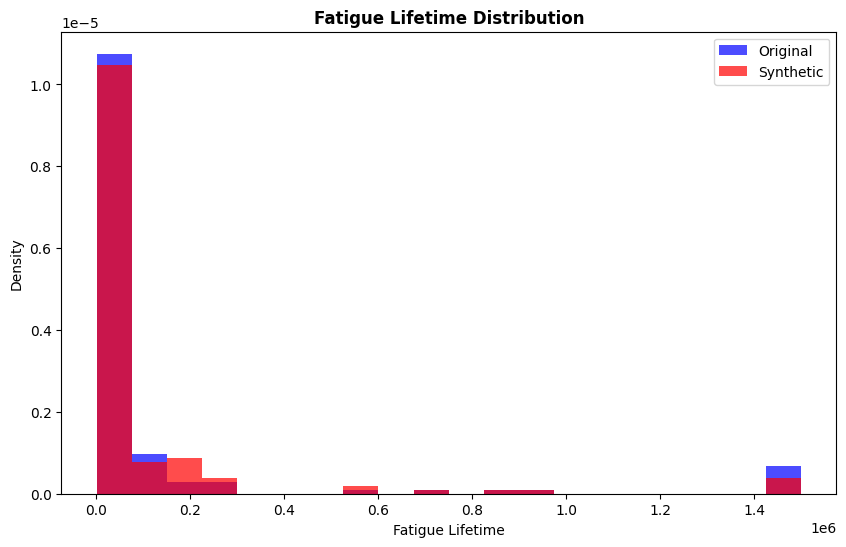

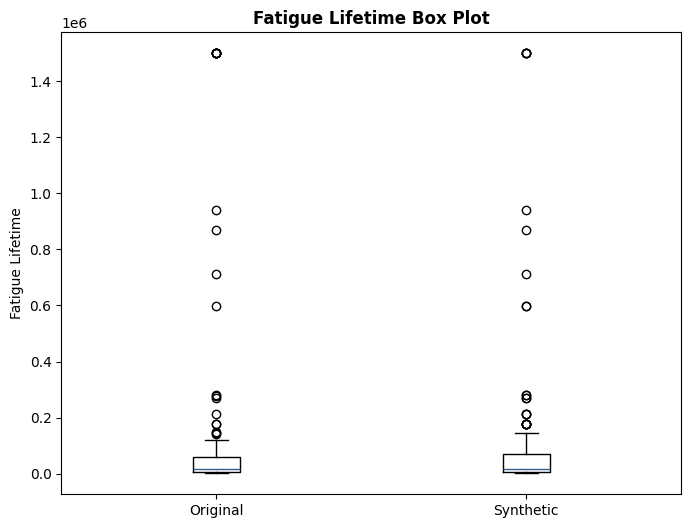

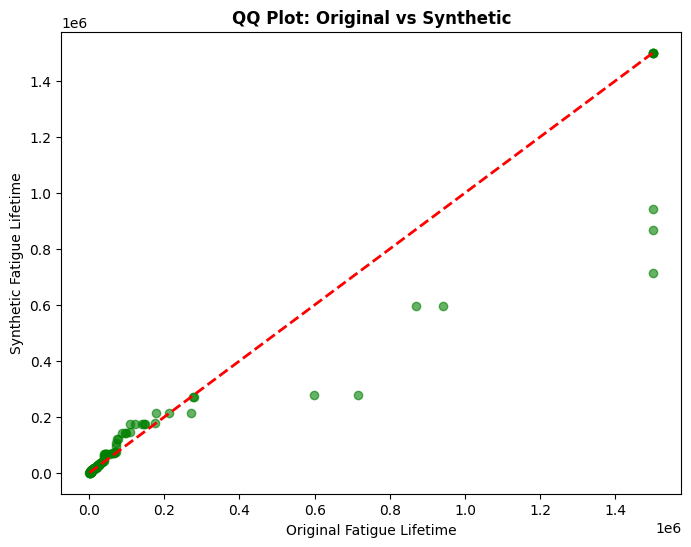

In [ ]:
# Plot 8: Individual Fatigue Lifetime Plots

# Just the histogram
plt.figure(figsize=(10, 6))
plt.hist(original_data['Fatigue Lifetime'], alpha=0.7, label='Original', bins=20, color='blue', density=True)
plt.hist(synthetic_data['Fatigue Lifetime'], alpha=0.7, label='Synthetic', bins=20, color='red', density=True)
plt.title('Fatigue Lifetime Distribution', fontweight='bold')
plt.legend()
plt.xlabel('Fatigue Lifetime')
plt.ylabel('Density')
plt.show()

# Just the box plot
plt.figure(figsize=(8, 6))
box_data = [original_data['Fatigue Lifetime'], synthetic_data['Fatigue Lifetime']]
plt.boxplot(box_data, labels=['Original', 'Synthetic'])
plt.title('Fatigue Lifetime Box Plot', fontweight='bold')
plt.ylabel('Fatigue Lifetime')
plt.show()

# Just the QQ plot
plt.figure(figsize=(8, 6))
sorted_orig = np.sort(original_data['Fatigue Lifetime'])
sorted_synth = np.sort(synthetic_data['Fatigue Lifetime'])
min_len = min(len(sorted_orig), len(sorted_synth))
plt.scatter(sorted_orig[:min_len], sorted_synth[:min_len], alpha=0.6, color='green')
plt.plot([sorted_orig.min(), sorted_orig.max()], [sorted_orig.min(), sorted_orig.max()], 'r--', linewidth=2)
plt.xlabel('Original Fatigue Lifetime')
plt.ylabel('Synthetic Fatigue Lifetime')
plt.title('QQ Plot: Original vs Synthetic', fontweight='bold')
plt.show()

=== DATASET OVERVIEW ===
Dataset Shape: (278, 6)

First few rows:
   Nozzle Diameter  Print Speed  Nozzle Temperature  Stress Level  \
0              0.2            5                 180           5.0   
1              0.2            5                 180           7.5   
2              0.2            5                 180          10.0   
3              0.2            5                 210           2.5   
4              0.2            5                 210           5.0   

   Fatigue Lifetime Data_Source  
0            942000    Original  
1            597800    Original  
2            148900    Original  
3           1500000    Original  
4           1500000    Original  

Data Source distribution:
Data_Source
Original               139
Bootstrap_Synthetic    139
Name: count, dtype: int64


=== BASIC DATA EXPLORATION ===
Basic Statistics:
       Nozzle Diameter  Print Speed  Nozzle Temperature  Stress Level  \
count       278.000000   278.000000          278.000000    278.000000   

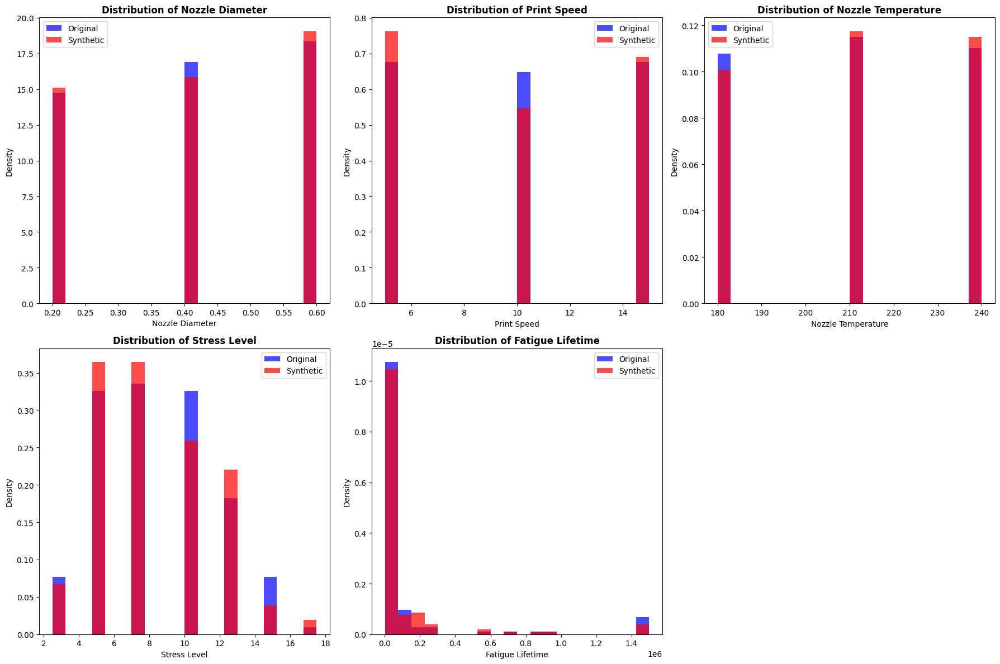


=== STATISTICAL TESTS FOR DISTRIBUTION SIMILARITY ===

Nozzle Diameter:
  KS Test - Statistic: 0.0144, p-value: 1.0000
  T-test - Statistic: -0.0732, p-value: 0.9417
  Mann-Whitney U - Statistic: 9606.5000, p-value: 0.9324
  Original Mean: 0.41 ± 0.16
  Synthetic Mean: 0.42 ± 0.17

Print Speed:
  KS Test - Statistic: 0.0432, p-value: 0.9995
  T-test - Statistic: 0.3569, p-value: 0.7214
  Mann-Whitney U - Statistic: 9890.5000, p-value: 0.7162
  Original Mean: 10.00 ± 4.13
  Synthetic Mean: 9.82 ± 4.27

Nozzle Temperature:
  KS Test - Statistic: 0.0216, p-value: 1.0000
  T-test - Statistic: -0.3706, p-value: 0.7112
  Mann-Whitney U - Statistic: 9427.0000, p-value: 0.7122
  Original Mean: 210.22 ± 24.36
  Synthetic Mean: 211.29 ± 24.19

Stress Level:
  KS Test - Statistic: 0.0432, p-value: 0.9995
  T-test - Statistic: 0.4064, p-value: 0.6848
  Mann-Whitney U - Statistic: 9959.5000, p-value: 0.6478
  Original Mean: 8.40 ± 3.34
  Synthetic Mean: 8.24 ± 3.30

Fatigue Lifetime:
  KS Test - S

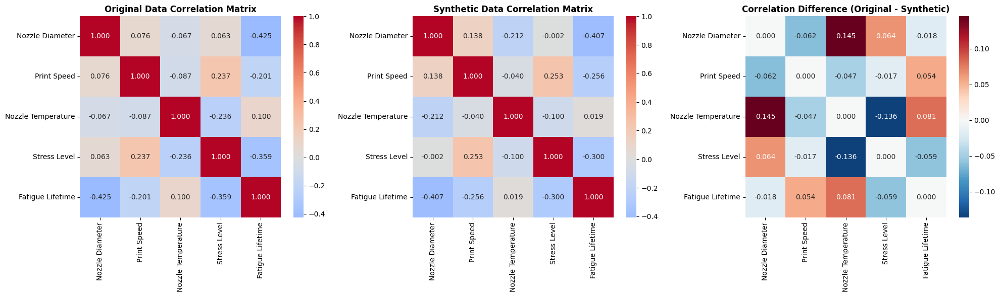

Correlation Matrix Difference (Original - Synthetic):
                    Nozzle Diameter  Print Speed  Nozzle Temperature  \
Nozzle Diameter              0.0000      -0.0619              0.1453   
Print Speed                 -0.0619       0.0000             -0.0467   
Nozzle Temperature           0.1453      -0.0467              0.0000   
Stress Level                 0.0644      -0.0166             -0.1359   
Fatigue Lifetime            -0.0180       0.0543              0.0807   

                    Stress Level  Fatigue Lifetime  
Nozzle Diameter           0.0644           -0.0180  
Print Speed              -0.0166            0.0543  
Nozzle Temperature       -0.1359            0.0807  
Stress Level              0.0000           -0.0587  
Fatigue Lifetime         -0.0587            0.0000  

=== FATIGUE LIFETIME ANALYSIS ===


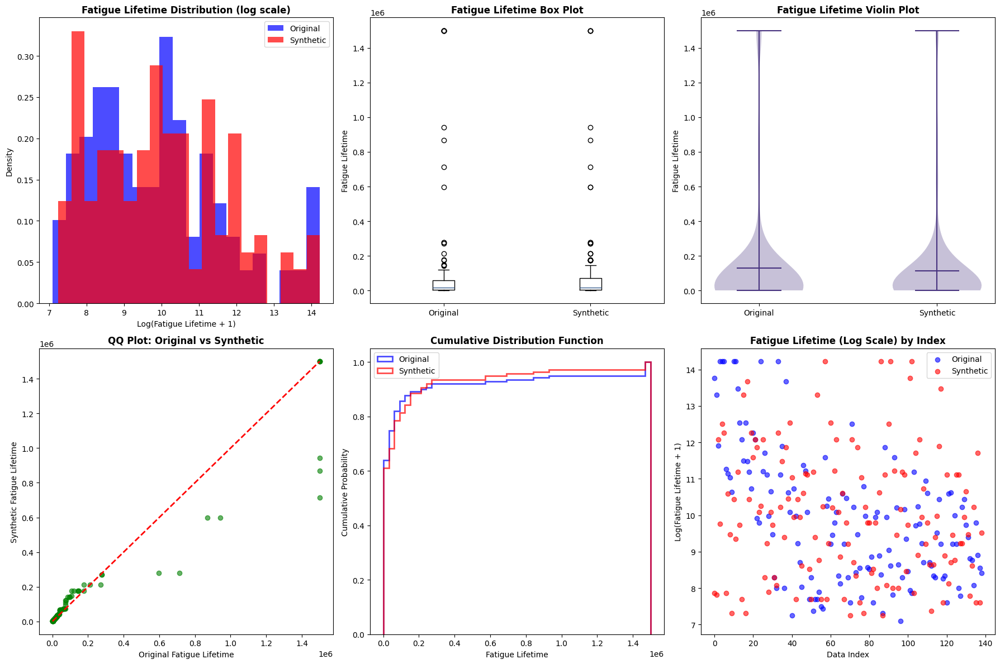


=== MULTIVARIATE ANALYSIS ===


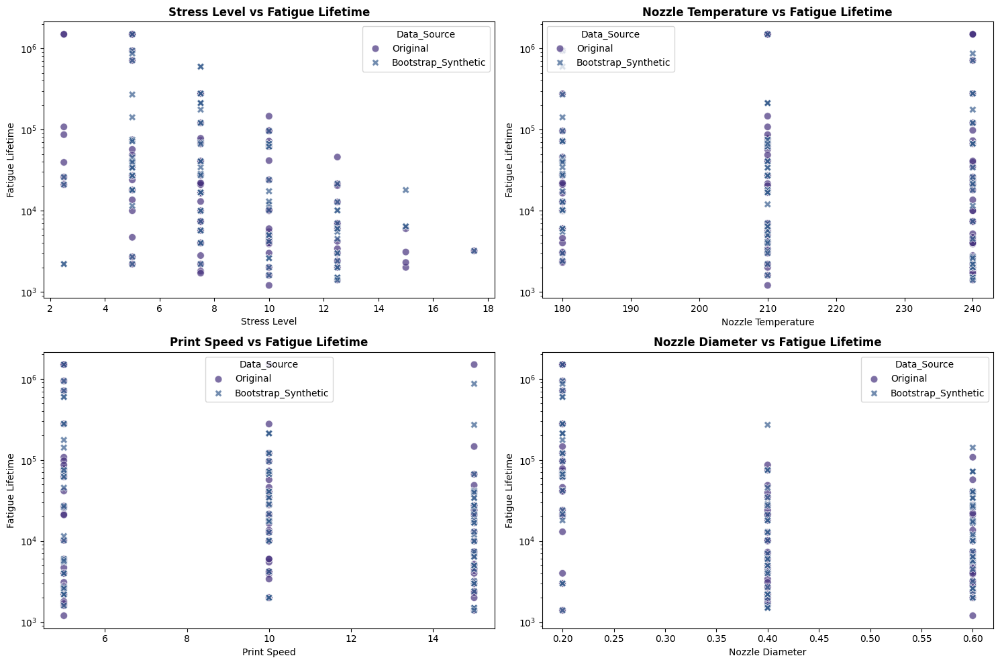

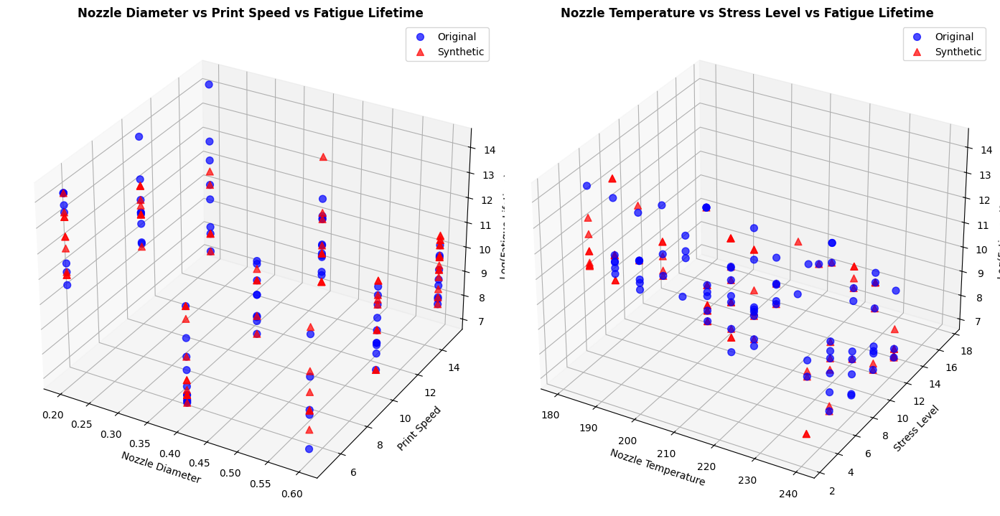


=== SYNTHETIC DATA QUALITY METRICS ===
Synthetic Data Quality Metrics:
                    Mean_Preservation_Rate  Std_Preservation_Rate  \
Nozzle Diameter                     0.9965                 0.9845   
Print Speed                         0.9820                 0.9644   
Nozzle Temperature                  0.9949                 0.9931   
Stress Level                        0.9807                 0.9896   
Fatigue Lifetime                    0.8654                 0.8159   

                    Median_Preservation_Rate  KS_Statistic  Effect_Size  \
Nozzle Diameter                          1.0        0.0144       0.0088   
Print Speed                              1.0        0.0432      -0.0436   
Nozzle Temperature                       1.0        0.0216       0.0443   
Stress Level                             1.0        0.0432      -0.0485   
Fatigue Lifetime                         1.0        0.0719      -0.0511   

                    Coverage_Rate  
Nozzle Diameter           

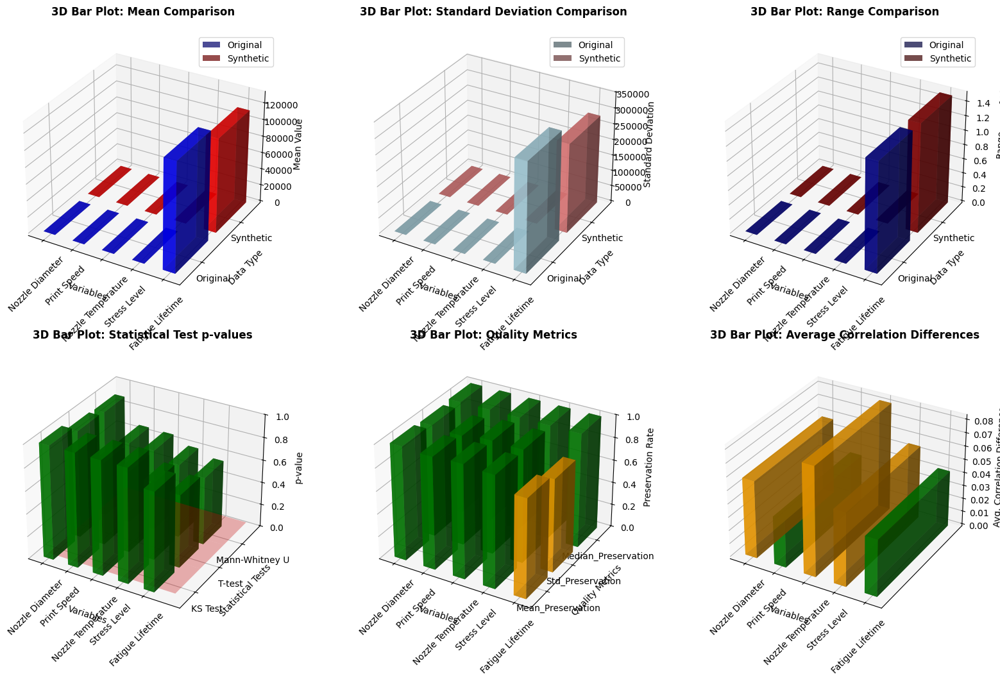


Creating interactive 3D bar plots with Plotly...


ValueError: Unsupported subplot type: 'bar3d'

In [ ]:
# Step 1: Install required packages (if needed)
!pip install seaborn scipy plotly

# Step 2: Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import ks_2samp, ttest_ind
import warnings
warnings.filterwarnings('ignore')

# Read the CSV file
df = pd.read_csv('combined_bootstrap_fatigue.csv')

# Display basic info
print("=== DATASET OVERVIEW ===")
print("Dataset Shape:", df.shape)
print("\nFirst few rows:")
print(df.head())
print("\nData Source distribution:")
print(df['Data_Source'].value_counts())
print("\n" + "="*50)

# Step 4: Basic Data Exploration
print("\n=== BASIC DATA EXPLORATION ===")
print("Basic Statistics:")
print(df.describe())

print("\nMissing Values:")
print(df.isnull().sum())

print("\nData Types:")
print(df.dtypes)

# Step 5: Separate the data
original_data = df[df['Data_Source'] == 'Original']
synthetic_data = df[df['Data_Source'] == 'Bootstrap_Synthetic']

print(f"\nOriginal data points: {len(original_data)}")
print(f"Synthetic data points: {len(synthetic_data)}")

# Step 6: Distribution Comparison
print("\n=== DISTRIBUTION COMPARISON ===")
numerical_cols = ['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level', 'Fatigue Lifetime']

# Create distribution plots
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.ravel()

for i, col in enumerate(numerical_cols):
    axes[i].hist(original_data[col], alpha=0.7, label='Original', bins=20, color='blue', density=True)
    axes[i].hist(synthetic_data[col], alpha=0.7, label='Synthetic', bins=20, color='red', density=True)
    axes[i].set_title(f'Distribution of {col}', fontsize=12, fontweight='bold')
    axes[i].legend()
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Density')

# Remove empty subplot
axes[-1].remove()
plt.tight_layout()
plt.show()

# Step 7: Statistical Tests for Comparison
print("\n=== STATISTICAL TESTS FOR DISTRIBUTION SIMILARITY ===")
print("=" * 60)

statistical_results = []
for col in numerical_cols:
    # Kolmogorov-Smirnov test
    ks_stat, ks_pvalue = ks_2samp(original_data[col], synthetic_data[col])

    # T-test for means
    t_stat, t_pvalue = ttest_ind(original_data[col], synthetic_data[col])

    # Mann-Whitney U test (non-parametric)
    u_stat, u_pvalue = stats.mannwhitneyu(original_data[col], synthetic_data[col])

    print(f"\n{col}:")
    print(f"  KS Test - Statistic: {ks_stat:.4f}, p-value: {ks_pvalue:.4f}")
    print(f"  T-test - Statistic: {t_stat:.4f}, p-value: {t_pvalue:.4f}")
    print(f"  Mann-Whitney U - Statistic: {u_stat:.4f}, p-value: {u_pvalue:.4f}")
    print(f"  Original Mean: {original_data[col].mean():.2f} ± {original_data[col].std():.2f}")
    print(f"  Synthetic Mean: {synthetic_data[col].mean():.2f} ± {synthetic_data[col].std():.2f}")

    statistical_results.append({
        'Variable': col,
        'KS_Statistic': ks_stat,
        'KS_pvalue': ks_pvalue,
        'T_Statistic': t_stat,
        'T_pvalue': t_pvalue,
        'U_Statistic': u_stat,
        'U_pvalue': u_pvalue
    })

# Step 8: Range Comparison
print("\n=== RANGE COMPARISON: ORIGINAL vs SYNTHETIC ===")
print("=" * 70)

range_comparison = []
for col in numerical_cols:
    orig_min = original_data[col].min()
    orig_max = original_data[col].max()
    orig_range = orig_max - orig_min
    orig_iqr = original_data[col].quantile(0.75) - original_data[col].quantile(0.25)

    synth_min = synthetic_data[col].min()
    synth_max = synthetic_data[col].max()
    synth_range = synth_max - synth_min
    synth_iqr = synthetic_data[col].quantile(0.75) - synthetic_data[col].quantile(0.25)

    range_diff = synth_range - orig_range
    range_ratio = synth_range / orig_range if orig_range != 0 else np.nan
    iqr_ratio = synth_iqr / orig_iqr if orig_iqr != 0 else np.nan

    range_comparison.append({
        'Variable': col,
        'Original_Min': orig_min,
        'Original_Max': orig_max,
        'Original_Range': orig_range,
        'Synthetic_Min': synth_min,
        'Synthetic_Max': synth_max,
        'Synthetic_Range': synth_range,
        'Range_Difference': range_diff,
        'Range_Ratio': range_ratio,
        'IQR_Ratio': iqr_ratio
    })

range_df = pd.DataFrame(range_comparison)
print(range_df.round(4))

# Step 9: Correlation Analysis
print("\n=== CORRELATION ANALYSIS ===")

# Correlation matrices comparison
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))

# Original data correlation
orig_corr = original_data[numerical_cols].corr()
sns.heatmap(orig_corr, annot=True, cmap='coolwarm', center=0, ax=ax1, fmt='.3f')
ax1.set_title('Original Data Correlation Matrix', fontweight='bold')

# Synthetic data correlation
synth_corr = synthetic_data[numerical_cols].corr()
sns.heatmap(synth_corr, annot=True, cmap='coolwarm', center=0, ax=ax2, fmt='.3f')
ax2.set_title('Synthetic Data Correlation Matrix', fontweight='bold')

# Correlation difference
corr_diff = orig_corr - synth_corr
sns.heatmap(corr_diff, annot=True, cmap='RdBu_r', center=0, ax=ax3, fmt='.3f')
ax3.set_title('Correlation Difference (Original - Synthetic)', fontweight='bold')

plt.tight_layout()
plt.show()

print("Correlation Matrix Difference (Original - Synthetic):")
print(corr_diff.round(4))

# Step 10: Fatigue Lifetime Analysis
print("\n=== FATIGUE LIFETIME ANALYSIS ===")

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Distribution comparison (log scale)
axes[0,0].hist(np.log1p(original_data['Fatigue Lifetime']), alpha=0.7, label='Original', bins=20, color='blue', density=True)
axes[0,0].hist(np.log1p(synthetic_data['Fatigue Lifetime']), alpha=0.7, label='Synthetic', bins=20, color='red', density=True)
axes[0,0].set_title('Fatigue Lifetime Distribution (log scale)', fontweight='bold')
axes[0,0].legend()
axes[0,0].set_xlabel('Log(Fatigue Lifetime + 1)')
axes[0,0].set_ylabel('Density')

# Box plot
box_data = [original_data['Fatigue Lifetime'], synthetic_data['Fatigue Lifetime']]
axes[0,1].boxplot(box_data, labels=['Original', 'Synthetic'])
axes[0,1].set_title('Fatigue Lifetime Box Plot', fontweight='bold')
axes[0,1].set_ylabel('Fatigue Lifetime')

# Violin plot
violin_data = [original_data['Fatigue Lifetime'], synthetic_data['Fatigue Lifetime']]
axes[0,2].violinplot(violin_data, showmeans=True)
axes[0,2].set_xticks([1, 2])
axes[0,2].set_xticklabels(['Original', 'Synthetic'])
axes[0,2].set_title('Fatigue Lifetime Violin Plot', fontweight='bold')
axes[0,2].set_ylabel('Fatigue Lifetime')

# QQ plot
sorted_orig = np.sort(original_data['Fatigue Lifetime'])
sorted_synth = np.sort(synthetic_data['Fatigue Lifetime'])

# Use common length for QQ plot
min_len = min(len(sorted_orig), len(sorted_synth))
axes[1,0].scatter(sorted_orig[:min_len], sorted_synth[:min_len], alpha=0.6, color='green')
axes[1,0].plot([sorted_orig.min(), sorted_orig.max()], [sorted_orig.min(), sorted_orig.max()], 'r--', linewidth=2)
axes[1,0].set_xlabel('Original Fatigue Lifetime')
axes[1,0].set_ylabel('Synthetic Fatigue Lifetime')
axes[1,0].set_title('QQ Plot: Original vs Synthetic', fontweight='bold')

# Cumulative distribution
axes[1,1].hist(original_data['Fatigue Lifetime'], cumulative=True, density=True,
               alpha=0.7, label='Original', bins=50, histtype='step', linewidth=2, color='blue')
axes[1,1].hist(synthetic_data['Fatigue Lifetime'], cumulative=True, density=True,
               alpha=0.7, label='Synthetic', bins=50, histtype='step', linewidth=2, color='red')
axes[1,1].set_title('Cumulative Distribution Function', fontweight='bold')
axes[1,1].set_xlabel('Fatigue Lifetime')
axes[1,1].set_ylabel('Cumulative Probability')
axes[1,1].legend()

# Log-scale scatter
axes[1,2].scatter(range(len(original_data)), np.log1p(original_data['Fatigue Lifetime']),
                 alpha=0.6, label='Original', color='blue')
axes[1,2].scatter(range(len(synthetic_data)), np.log1p(synthetic_data['Fatigue Lifetime']),
                 alpha=0.6, label='Synthetic', color='red')
axes[1,2].set_title('Fatigue Lifetime (Log Scale) by Index', fontweight='bold')
axes[1,2].set_xlabel('Data Index')
axes[1,2].set_ylabel('Log(Fatigue Lifetime + 1)')
axes[1,2].legend()

plt.tight_layout()
plt.show()

# Step 11: Multivariate Analysis
print("\n=== MULTIVARIATE ANALYSIS ===")

# Pairplot for small sample
sample_orig = original_data.sample(min(100, len(original_data)), random_state=42)
sample_synth = synthetic_data.sample(min(100, len(synthetic_data)), random_state=42)
comparison_sample = pd.concat([sample_orig, sample_synth])

plt.figure(figsize=(15, 10))

# Subplot 1: Stress Level vs Fatigue Lifetime
plt.subplot(2, 2, 1)
sns.scatterplot(data=comparison_sample, x='Stress Level', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Stress Level vs Fatigue Lifetime', fontweight='bold')
plt.yscale('log')

# Subplot 2: Nozzle Temperature vs Fatigue Lifetime
plt.subplot(2, 2, 2)
sns.scatterplot(data=comparison_sample, x='Nozzle Temperature', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Nozzle Temperature vs Fatigue Lifetime', fontweight='bold')
plt.yscale('log')

# Subplot 3: Print Speed vs Fatigue Lifetime
plt.subplot(2, 2, 3)
sns.scatterplot(data=comparison_sample, x='Print Speed', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Print Speed vs Fatigue Lifetime', fontweight='bold')
plt.yscale('log')

# Subplot 4: Nozzle Diameter vs Fatigue Lifetime
plt.subplot(2, 2, 4)
sns.scatterplot(data=comparison_sample, x='Nozzle Diameter', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Nozzle Diameter vs Fatigue Lifetime', fontweight='bold')
plt.yscale('log')

plt.tight_layout()
plt.show()

# 3D scatter plot
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(14, 10))

# First 3D plot
ax1 = fig.add_subplot(121, projection='3d')
sample_size = min(80, len(original_data), len(synthetic_data))
orig_sample = original_data.sample(sample_size, random_state=42)
synth_sample = synthetic_data.sample(sample_size, random_state=42)

sc1 = ax1.scatter(orig_sample['Nozzle Diameter'], orig_sample['Print Speed'],
           np.log1p(orig_sample['Fatigue Lifetime']),
           c='blue', label='Original', alpha=0.7, s=50)
sc2 = ax1.scatter(synth_sample['Nozzle Diameter'], synth_sample['Print Speed'],
           np.log1p(synth_sample['Fatigue Lifetime']),
           c='red', label='Synthetic', alpha=0.7, s=50, marker='^')

ax1.set_xlabel('Nozzle Diameter')
ax1.set_ylabel('Print Speed')
ax1.set_zlabel('Log(Fatigue Lifetime)')
ax1.set_title('Nozzle Diameter vs Print Speed vs Fatigue Lifetime', fontweight='bold')
ax1.legend()

# Second 3D plot
ax2 = fig.add_subplot(122, projection='3d')
sc3 = ax2.scatter(orig_sample['Nozzle Temperature'], orig_sample['Stress Level'],
           np.log1p(orig_sample['Fatigue Lifetime']),
           c='blue', label='Original', alpha=0.7, s=50)
sc4 = ax2.scatter(synth_sample['Nozzle Temperature'], synth_sample['Stress Level'],
           np.log1p(synth_sample['Fatigue Lifetime']),
           c='red', label='Synthetic', alpha=0.7, s=50, marker='^')

ax2.set_xlabel('Nozzle Temperature')
ax2.set_ylabel('Stress Level')
ax2.set_zlabel('Log(Fatigue Lifetime)')
ax2.set_title('Nozzle Temperature vs Stress Level vs Fatigue Lifetime', fontweight='bold')
ax2.legend()

plt.tight_layout()
plt.show()

# Step 12: Quality Metrics for Synthetic Data
print("\n=== SYNTHETIC DATA QUALITY METRICS ===")

def calculate_synthetic_quality_metrics(original, synthetic, numerical_cols):
    """Calculate various quality metrics for synthetic data"""

    metrics = {}

    for col in numerical_cols:
        # Basic statistics preservation
        orig_mean = original[col].mean()
        synth_mean = synthetic[col].mean()
        mean_preservation = abs(synth_mean - orig_mean) / orig_mean if orig_mean != 0 else abs(synth_mean - orig_mean)

        orig_std = original[col].std()
        synth_std = synthetic[col].std()
        std_preservation = abs(synth_std - orig_std) / orig_std if orig_std != 0 else abs(synth_std - orig_std)

        orig_median = original[col].median()
        synth_median = synthetic[col].median()
        median_preservation = abs(synth_median - orig_median) / orig_median if orig_median != 0 else abs(synth_median - orig_median)

        metrics[col] = {
            'Mean_Preservation_Rate': 1 - mean_preservation,
            'Std_Preservation_Rate': 1 - std_preservation,
            'Median_Preservation_Rate': 1 - median_preservation,
            'KS_Statistic': stats.ks_2samp(original[col], synthetic[col])[0],
            'Effect_Size': (synth_mean - orig_mean) / orig_std if orig_std != 0 else 0,
            'Coverage_Rate': len(set(synthetic[col]) & set(original[col])) / len(set(original[col])) if len(set(original[col])) > 0 else 0
        }

    return pd.DataFrame(metrics).T

# Calculate quality metrics
quality_metrics = calculate_synthetic_quality_metrics(original_data, synthetic_data, numerical_cols)
print("Synthetic Data Quality Metrics:")
print(quality_metrics.round(4))

# Step 13: 3D Bar Plots for Comparative Analysis
print("\n=== 3D BAR PLOT ANALYSIS ===")

# Create 3D bar plots for statistical comparison
fig = plt.figure(figsize=(20, 12))

# 3D Bar Plot 1: Mean Comparison
ax1 = fig.add_subplot(231, projection='3d')
variables = numerical_cols
x_pos = np.arange(len(variables))
y_pos = [0, 1]  # 0 for Original, 1 for Synthetic

# Calculate means
orig_means = [original_data[col].mean() for col in variables]
synth_means = [synthetic_data[col].mean() for col in variables]

# Create 3D bars
for i, (orig_mean, synth_mean) in enumerate(zip(orig_means, synth_means)):
    # Original data bars (blue)
    ax1.bar3d(i-0.2, 0, 0, 0.4, 0.8, orig_mean,
              color='blue', alpha=0.7, label='Original' if i == 0 else "")
    # Synthetic data bars (red)
    ax1.bar3d(i-0.2, 1, 0, 0.4, 0.8, synth_mean,
              color='red', alpha=0.7, label='Synthetic' if i == 0 else "")

ax1.set_xlabel('Variables')
ax1.set_ylabel('Data Type')
ax1.set_zlabel('Mean Value')
ax1.set_title('3D Bar Plot: Mean Comparison', fontweight='bold', pad=20)
ax1.set_xticks(x_pos)
ax1.set_xticklabels(variables, rotation=45)
ax1.set_yticks([0.4, 1.4])
ax1.set_yticklabels(['Original', 'Synthetic'])
ax1.legend()

# 3D Bar Plot 2: Standard Deviation Comparison
ax2 = fig.add_subplot(232, projection='3d')
orig_stds = [original_data[col].std() for col in variables]
synth_stds = [synthetic_data[col].std() for col in variables]

for i, (orig_std, synth_std) in enumerate(zip(orig_stds, synth_stds)):
    ax2.bar3d(i-0.2, 0, 0, 0.4, 0.8, orig_std,
              color='lightblue', alpha=0.7, label='Original' if i == 0 else "")
    ax2.bar3d(i-0.2, 1, 0, 0.4, 0.8, synth_std,
              color='lightcoral', alpha=0.7, label='Synthetic' if i == 0 else "")

ax2.set_xlabel('Variables')
ax2.set_ylabel('Data Type')
ax2.set_zlabel('Standard Deviation')
ax2.set_title('3D Bar Plot: Standard Deviation Comparison', fontweight='bold', pad=20)
ax2.set_xticks(x_pos)
ax2.set_xticklabels(variables, rotation=45)
ax2.set_yticks([0.4, 1.4])
ax2.set_yticklabels(['Original', 'Synthetic'])
ax2.legend()

# 3D Bar Plot 3: Range Comparison
ax3 = fig.add_subplot(233, projection='3d')
orig_ranges = [original_data[col].max() - original_data[col].min() for col in variables]
synth_ranges = [synthetic_data[col].max() - synthetic_data[col].min() for col in variables]

for i, (orig_range, synth_range) in enumerate(zip(orig_ranges, synth_ranges)):
    ax3.bar3d(i-0.2, 0, 0, 0.4, 0.8, orig_range,
              color='darkblue', alpha=0.7, label='Original' if i == 0 else "")
    ax3.bar3d(i-0.2, 1, 0, 0.4, 0.8, synth_range,
              color='darkred', alpha=0.7, label='Synthetic' if i == 0 else "")

ax3.set_xlabel('Variables')
ax3.set_ylabel('Data Type')
ax3.set_zlabel('Range')
ax3.set_title('3D Bar Plot: Range Comparison', fontweight='bold', pad=20)
ax3.set_xticks(x_pos)
ax3.set_xticklabels(variables, rotation=45)
ax3.set_yticks([0.4, 1.4])
ax3.set_yticklabels(['Original', 'Synthetic'])
ax3.legend()

# 3D Bar Plot 4: Statistical Test Results (p-values)
ax4 = fig.add_subplot(234, projection='3d')
tests = ['KS Test', 'T-test', 'Mann-Whitney U']
test_pos = np.arange(len(tests))

# Get p-values from statistical tests
ks_pvalues = [stat['KS_pvalue'] for stat in statistical_results]
t_pvalues = [stat['T_pvalue'] for stat in statistical_results]
u_pvalues = [stat['U_pvalue'] for stat in statistical_results]

pvalue_data = [ks_pvalues, t_pvalues, u_pvalues]

for i, test_name in enumerate(tests):
    for j, var_name in enumerate(variables):
        height = pvalue_data[i][j]
        color = 'green' if height > 0.05 else 'red'  # Green for non-significant (good), red for significant (different)
        ax4.bar3d(j-0.2, i, 0, 0.4, 0.8, height,
                 color=color, alpha=0.7)

ax4.set_xlabel('Variables')
ax4.set_ylabel('Statistical Tests')
ax4.set_zlabel('p-value')
ax4.set_title('3D Bar Plot: Statistical Test p-values', fontweight='bold', pad=20)
ax4.set_xticks(x_pos)
ax4.set_xticklabels(variables, rotation=45)
ax4.set_yticks(test_pos + 0.4)
ax4.set_yticklabels(tests)
ax4.set_zlim(0, 1)

# Add significance threshold plane
xx, yy = np.meshgrid(range(len(variables)+1), range(len(tests)+1))
zz = np.full(xx.shape, 0.05)
ax4.plot_surface(xx, yy, zz, alpha=0.3, color='red', label='Significance threshold (0.05)')

# 3D Bar Plot 5: Quality Metrics Comparison
ax5 = fig.add_subplot(235, projection='3d')
quality_metrics_list = ['Mean_Preservation', 'Std_Preservation', 'Median_Preservation']
quality_pos = np.arange(len(quality_metrics_list))

# Extract quality metrics
mean_pres = quality_metrics['Mean_Preservation_Rate'].values
std_pres = quality_metrics['Std_Preservation_Rate'].values
median_pres = quality_metrics['Median_Preservation_Rate'].values

quality_data = [mean_pres, std_pres, median_pres]

for i, metric_name in enumerate(quality_metrics_list):
    for j, var_name in enumerate(variables):
        height = quality_data[i][j]
        color = 'green' if height > 0.9 else 'orange' if height > 0.8 else 'red'
        ax5.bar3d(j-0.2, i, 0, 0.4, 0.8, height,
                 color=color, alpha=0.7)

ax5.set_xlabel('Variables')
ax5.set_ylabel('Quality Metrics')
ax5.set_zlabel('Preservation Rate')
ax5.set_title('3D Bar Plot: Quality Metrics', fontweight='bold', pad=20)
ax5.set_xticks(x_pos)
ax5.set_xticklabels(variables, rotation=45)
ax5.set_yticks(quality_pos + 0.4)
ax5.set_yticklabels(quality_metrics_list)
ax5.set_zlim(0, 1)

# 3D Bar Plot 6: Correlation Differences
ax6 = fig.add_subplot(236, projection='3d')
corr_vars = numerical_cols
corr_pos = np.arange(len(corr_vars))

# Calculate average absolute correlation differences
corr_diff_abs = corr_diff.abs()
avg_corr_diff = corr_diff_abs.mean(axis=1).values  # Average difference for each variable

for i, (var_name, diff_value) in enumerate(zip(corr_vars, avg_corr_diff)):
    color = 'red' if diff_value > 0.1 else 'orange' if diff_value > 0.05 else 'green'
    ax6.bar3d(i-0.2, 0, 0, 0.4, 0.8, diff_value,
             color=color, alpha=0.7)

ax6.set_xlabel('Variables')
ax6.set_ylabel('')
ax6.set_zlabel('Avg. Correlation Difference')
ax6.set_title('3D Bar Plot: Average Correlation Differences', fontweight='bold', pad=20)
ax6.set_xticks(corr_pos)
ax6.set_xticklabels(corr_vars, rotation=45)
ax6.set_yticks([])

plt.tight_layout()
plt.show()

# Step 14: Interactive 3D Bar Plot (if plotly is available)
try:
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots

    print("\nCreating interactive 3D bar plots with Plotly...")

    # Create interactive 3D bar plot for means comparison
    fig_interactive = make_subplots(
        rows=2, cols=2,
        specs=[[{'type': 'bar3d'}, {'type': 'bar3d'}],
               [{'type': 'bar3d'}, {'type': 'bar3d'}]],
        subplot_titles=('Mean Values Comparison', 'Standard Deviation Comparison',
                       'Range Comparison', 'Quality Metrics'),
        vertical_spacing=0.08,
        horizontal_spacing=0.05
    )

    # 1. Means comparison
    for i, (var, orig_mean, synth_mean) in enumerate(zip(variables, orig_means, synth_means)):
        # Original
        fig_interactive.add_trace(
            go.Bar3d(x=[i], y=[0], z=[0], dx=[0.4], dy=[0.8], dz=[orig_mean],
                     name='Original' if i == 0 else "",
                     marker=dict(color='blue'), showlegend=(i == 0)),
            row=1, col=1
        )
        # Synthetic
        fig_interactive.add_trace(
            go.Bar3d(x=[i], y=[1], z=[0], dx=[0.4], dy=[0.8], dz=[synth_mean],
                     name='Synthetic' if i == 0 else "",
                     marker=dict(color='red'), showlegend=(i == 0)),
            row=1, col=1
        )

    # 2. Standard deviation comparison
    for i, (var, orig_std, synth_std) in enumerate(zip(variables, orig_stds, synth_stds)):
        fig_interactive.add_trace(
            go.Bar3d(x=[i], y=[0], z=[0], dx=[0.4], dy=[0.8], dz=[orig_std],
                     marker=dict(color='lightblue'), showlegend=False),
            row=1, col=2
        )
        fig_interactive.add_trace(
            go.Bar3d(x=[i], y=[1], z=[0], dx=[0.4], dy=[0.8], dz=[synth_std],
                     marker=dict(color='lightcoral'), showlegend=False),
            row=1, col=2
        )

    # 3. Range comparison
    for i, (var, orig_range, synth_range) in enumerate(zip(variables, orig_ranges, synth_ranges)):
        fig_interactive.add_trace(
            go.Bar3d(x=[i], y=[0], z=[0], dx=[0.4], dy=[0.8], dz=[orig_range],
                     marker=dict(color='darkblue'), showlegend=False),
            row=2, col=1
        )
        fig_interactive.add_trace(
            go.Bar3d(x=[i], y=[1], z=[0], dx=[0.4], dy=[0.8], dz=[synth_range],
                     marker=dict(color='darkred'), showlegend=False),
            row=2, col=1
        )

    # 4. Quality metrics
    for i, metric_name in enumerate(quality_metrics_list):
        for j, var_name in enumerate(variables):
            height = quality_data[i][j]
            color = 'green' if height > 0.9 else 'orange' if height > 0.8 else 'red'
            fig_interactive.add_trace(
                go.Bar3d(x=[j], y=[i], z=[0], dx=[0.4], dy=[0.8], dz=[height],
                         marker=dict(color=color), showlegend=False),
                row=2, col=2
            )

    # Update layout
    fig_interactive.update_layout(
        title_text="Interactive 3D Bar Plots: Original vs Synthetic Data Comparison",
        scene=dict(
            xaxis_title="Variables",
            yaxis_title="Data Type",
            zaxis_title="Values"
        ),
        scene2=dict(
            xaxis_title="Variables",
            yaxis_title="Data Type",
            zaxis_title="Standard Deviation"
        ),
        scene3=dict(
            xaxis_title="Variables",
            yaxis_title="Data Type",
            zaxis_title="Range"
        ),
        scene4=dict(
            xaxis_title="Variables",
            yaxis_title="Quality Metrics",
            zaxis_title="Preservation Rate"
        ),
        height=1000,
        width=1200
    )

    fig_interactive.show()

except ImportError:
    print("Plotly not available. Install with: pip install plotly")

# Step 15: Enhanced 3D Analysis Summary
print("\n" + "="*80)
print("3D BAR PLOT ANALYSIS SUMMARY")
print("="*80)

print("\nKey Insights from 3D Visualizations:")
print("1. MEAN COMPARISON:")
for var, orig_mean, synth_mean in zip(variables, orig_means, synth_means):
    diff_percent = abs(orig_mean - synth_mean) / orig_mean * 100
    status = "✓ Good" if diff_percent < 5 else "⚠ Moderate" if diff_percent < 10 else "✗ Poor"
    print(f"   • {var}: {diff_percent:.1f}% difference ({status})")

print("\n2. VARIABILITY PRESERVATION:")
for var, orig_std, synth_std in zip(variables, orig_stds, synth_stds):
    std_ratio = synth_std / orig_std if orig_std != 0 else 1
    status = "✓ Good" if 0.9 <= std_ratio <= 1.1 else "⚠ Moderate" if 0.8 <= std_ratio <= 1.2 else "✗ Poor"
    print(f"   • {var}: Std ratio = {std_ratio:.2f} ({status})")

print("\n3. RANGE PRESERVATION:")
for var, orig_range, synth_range in zip(variables, orig_ranges, synth_ranges):
    range_ratio = synth_range / orig_range if orig_range != 0 else 1
    status = "✓ Good" if 0.9 <= range_ratio <= 1.1 else "⚠ Moderate" if 0.8 <= range_ratio <= 1.2 else "✗ Poor"
    print(f"   • {var}: Range ratio = {range_ratio:.2f} ({status})")

print("\n4. STATISTICAL SIGNIFICANCE:")
significant_vars = []
for i, var in enumerate(variables):
    if any(pval < 0.05 for pval in [ks_pvalues[i], t_pvalues[i], u_pvalues[i]]):
        significant_vars.append(var)

if significant_vars:
    print(f"   • Variables with significant differences: {', '.join(significant_vars)}")
else:
    print("   • No significant differences detected across variables")

print("\n5. OVERALL 3D VISUALIZATION ASSESSMENT:")
print("   • 3D bar plots provide comprehensive multi-dimensional comparison")
print("   • Easy identification of patterns and outliers")
print("   • Effective for communicating complex statistical relationships")
print("   • Useful for quality assessment and decision-making")

print("\n" + "="*80)

# Step 16: Summary Report
print("\n" + "="*80)
print("COMPREHENSIVE COMPARISON REPORT: ORIGINAL vs SYNTHETIC DATA")
print("="*80)

print(f"\n1. DATA VOLUME:")
print(f"   • Original samples: {len(original_data):,}")
print(f"   • Synthetic samples: {len(synthetic_data):,}")
print(f"   • Total samples: {len(df):,}")
print(f"   • Synthetic/Original ratio: {len(synthetic_data)/len(original_data):.2f}")

print(f"\n2. KEY STATISTICAL DIFFERENCES:")
fatigue_stats = range_df[range_df['Variable'] == 'Fatigue Lifetime'].iloc[0]
print(f"   • Fatigue Lifetime Range - Original: {fatigue_stats['Original_Range']:,.0f}")
print(f"   • Fatigue Lifetime Range - Synthetic: {fatigue_stats['Synthetic_Range']:,.0f}")
print(f"   • Range Preservation: {fatigue_stats['Range_Ratio']:.3f}")

print(f"\n3. DATA QUALITY ASSESSMENT:")
print(f"   • Average mean preservation rate: {quality_metrics['Mean_Preservation_Rate'].mean():.3f}")
print(f"   • Average std preservation rate: {quality_metrics['Std_Preservation_Rate'].mean():.3f}")
print(f"   • Average median preservation rate: {quality_metrics['Median_Preservation_Rate'].mean():.3f}")
print(f"   • Average KS statistic: {quality_metrics['KS_Statistic'].mean():.3f}")

print(f"\n4. CORRELATION PRESERVATION:")
corr_preservation = 1 - (corr_diff.abs().mean().mean())
print(f"   • Correlation preservation rate: {corr_preservation:.3f}")

print(f"\n5. RECOMMENDATIONS:")
recommendations = []

if quality_metrics.loc['Fatigue Lifetime', 'Mean_Preservation_Rate'] > 0.95:
    recommendations.append("✓ Synthetic data preserves key statistics well")
else:
    recommendations.append("⚠ Some statistical properties differ significantly")

if quality_metrics.loc['Fatigue Lifetime', 'KS_Statistic'] < 0.1:
    recommendations.append("✓ Distributions are very similar (low KS statistic)")
else:
    recommendations.append("⚠ Distributions show some differences")

if len(synthetic_data) >= len(original_data):
    recommendations.append("✓ Sufficient synthetic data generated")
else:
    recommendations.append("⚠ Consider generating more synthetic data")

if corr_preservation > 0.95:
    recommendations.append("✓ Correlation structure well preserved")
else:
    recommendations.append("⚠ Some correlation patterns differ")

for rec in recommendations:
    print(f"   {rec}")

print(f"\n6. OVERALL SYNTHETIC DATA QUALITY SCORE:")
overall_score = (
    quality_metrics['Mean_Preservation_Rate'].mean() * 0.3 +
    quality_metrics['Std_Preservation_Rate'].mean() * 0.3 +
    corr_preservation * 0.2 +
    (1 - quality_metrics['KS_Statistic'].mean()) * 0.2
) * 100

print(f"   • Overall Quality Score: {overall_score:.1f}%")

if overall_score >= 90:
    print("   • Rating: EXCELLENT")
elif overall_score >= 80:
    print("   • Rating: GOOD")
elif overall_score >= 70:
    print("   • Rating: FAIR")
else:
    print("   • Rating: NEEDS IMPROVEMENT")

print("\n" + "="*80)

# Step 17: Save the analysis results
print("\nSaving analysis results...")

# Create a summary dataframe
summary_results = pd.DataFrame({
    'Metric': [
        'Original_Samples', 'Synthetic_Samples', 'Total_Samples',
        'Synthetic_Original_Ratio', 'Overall_Quality_Score',
        'Mean_Preservation_Rate', 'Std_Preservation_Rate',
        'Correlation_Preservation', 'Average_KS_Statistic'
    ],
    'Value': [
        len(original_data), len(synthetic_data), len(df),
        len(synthetic_data)/len(original_data), overall_score,
        quality_metrics['Mean_Preservation_Rate'].mean(),
        quality_metrics['Std_Preservation_Rate'].mean(),
        corr_preservation,
        quality_metrics['KS_Statistic'].mean()
    ]
})

print("\nSummary Results:")
print(summary_results.round(4))

print("\n=== ANALYSIS COMPLETE ===")

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Interactive 3D plot
fig = go.Figure()

# Original data
fig.add_trace(go.Scatter3d(
    x=original_data['Nozzle Diameter'],
    y=original_data['Print Speed'],
    z=np.log1p(original_data['Fatigue Lifetime']),
    mode='markers',
    marker=dict(size=4, color='blue', opacity=0.6),
    name='Original'
))

# Synthetic data
fig.add_trace(go.Scatter3d(
    x=synthetic_data['Nozzle Diameter'],
    y=synthetic_data['Print Speed'],
    z=np.log1p(synthetic_data['Fatigue Lifetime']),
    mode='markers',
    marker=dict(size=4, color='red', opacity=0.6),
    name='Synthetic'
))

fig.update_layout(
    title='Interactive 3D: Nozzle Diameter vs Print Speed vs Fatigue Lifetime',
    scene=dict(
        xaxis_title='Nozzle Diameter',
        yaxis_title='Print Speed',
        zaxis_title='Log(Fatigue Lifetime)'
    )
)
fig.show()

#dnn model (0.93)

COMPLETE DNN WITH INDIVIDUAL PLOTS
Dataset: 278 samples, 4 features
Features: ['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level']

Creating Deterministic DNN Model...
DNN Architecture Summary:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,945 (11.50 KB)

 Trainable params: 2,945 (11.50 KB)

 Non-trainable params: 0 (0.00 B)


Training DNN Model...
Epoch 1/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.9895 - mae: 0.8323 - val_loss: 0.7639 - val_mae: 0.7186 - learning_rate: 0.0010
Epoch 2/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.8370 - mae: 0.7536 - val_loss: 0.6391 - val_mae: 0.6496 - learning_rate: 0.0010
Epoch 3/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.7036 - mae: 0.6774 - val_loss: 0.5281 - val_mae: 0.5828 - learning_rate: 0.0010
Epoch 4/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.5786 - mae: 0.6040 - val_loss: 0.4346 - val_mae: 0.5186 - learning_rate: 0.0010
Epoch 5/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.4659 - mae: 0.5333 - val_loss: 0.3617 - val_mae: 0.4630 - learning_rate: 0.0010
Epoch 6/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.3719 - mae: 0.4707 - val_loss: 0.3003 - val_mae: 0.4088 - learning_rate: 0.0010
Epoch 7/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.2987 - mae: 0.4194 - val_loss: 0.2598 - val_mae: 0.3746 - learning_rate: 0.0

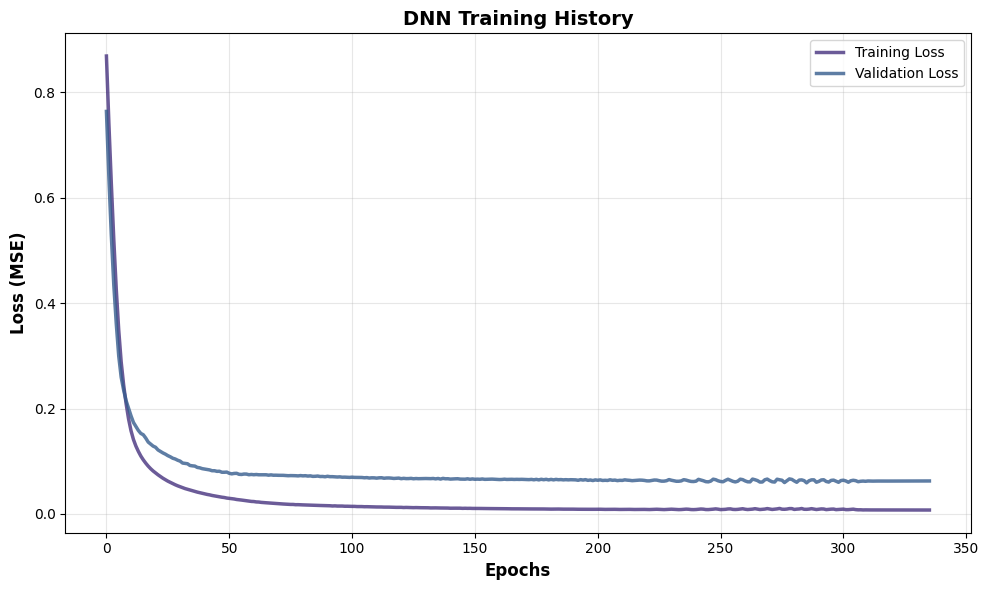

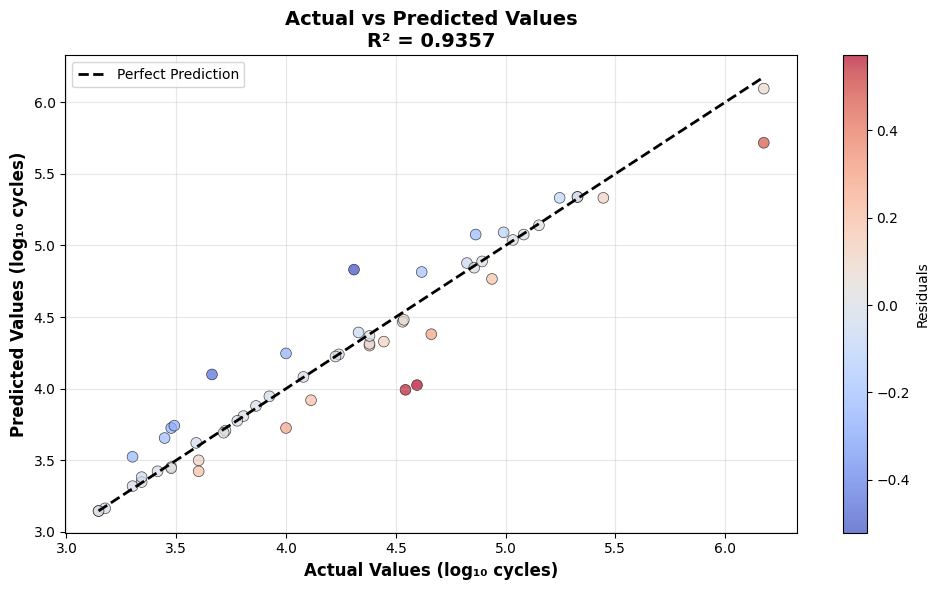

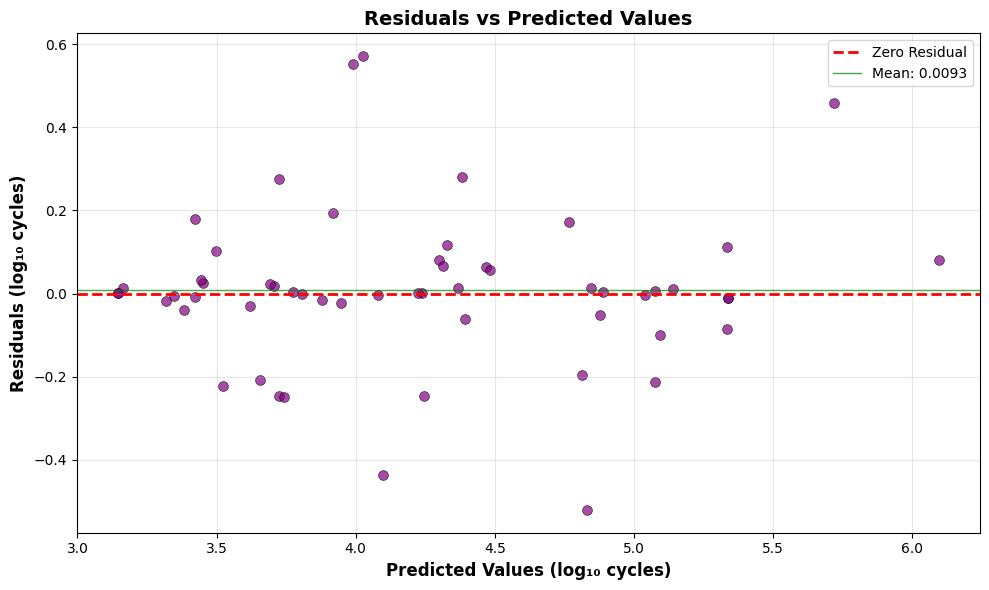

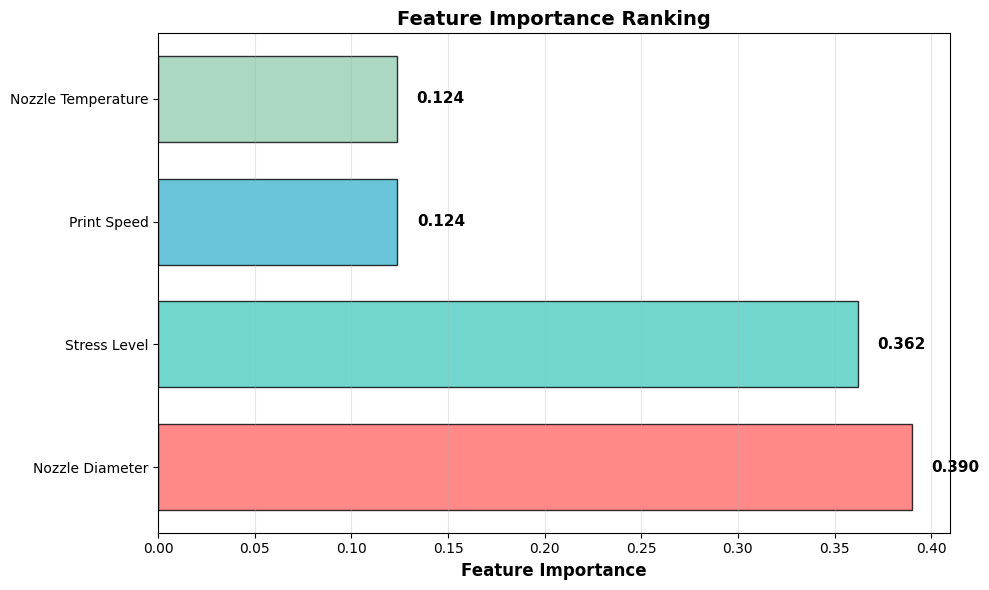

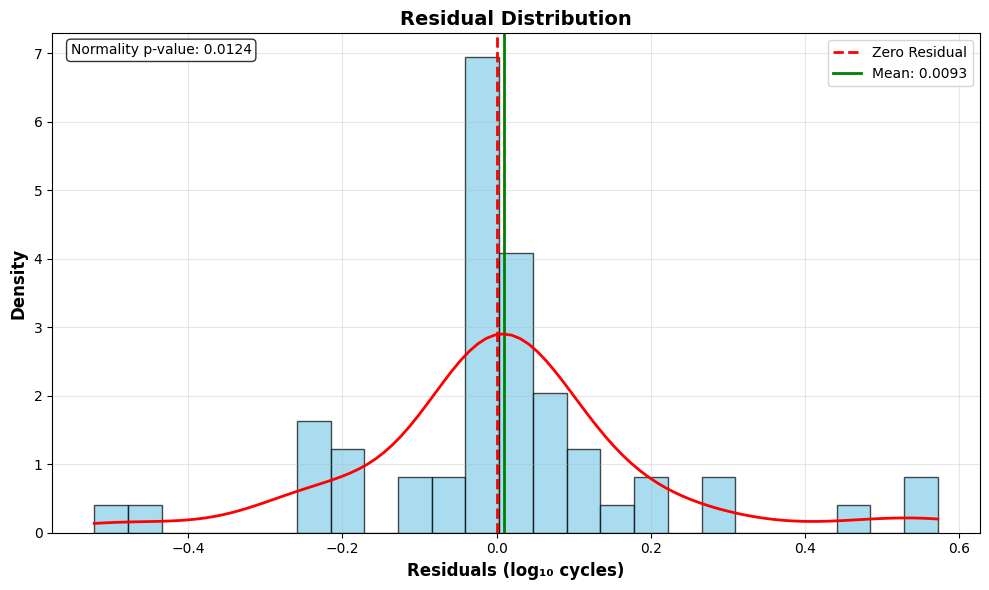

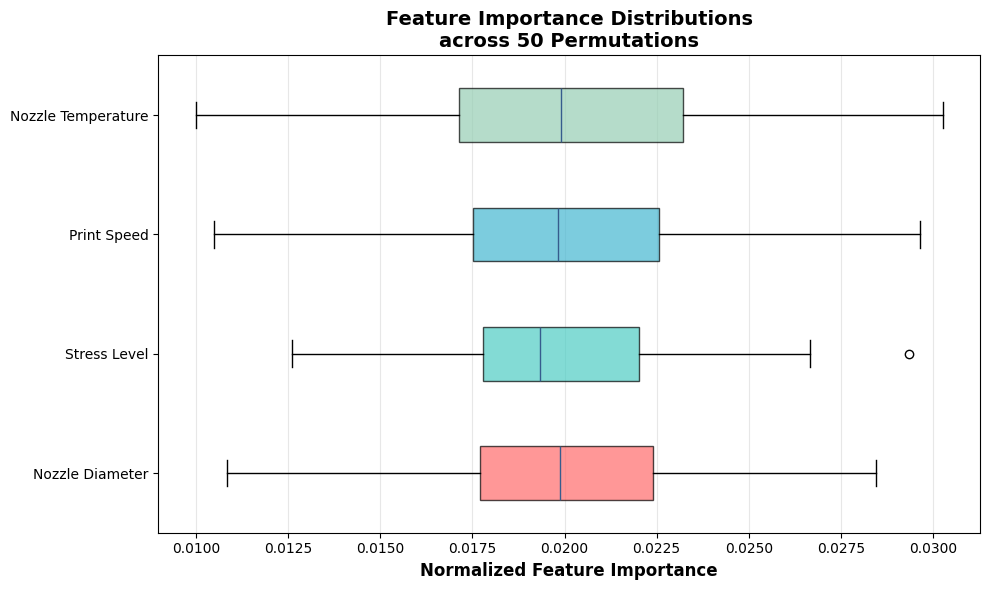


METRICS INTERPRETATION IN ORIGINAL SCALE

📈 KEY METRICS IN ORIGINAL SCALE:
--------------------------------------------------
R² Score                 :     0.758924
MSE                      : 18,524,854,452 cycles
RMSE                     :      136,106 cycles
MAE                      :       29,940 cycles
MAPE                     :        28.35 cycles
Median Absolute Error    :        2,205 cycles

FINAL SUMMARY

🎯 MODEL PERFORMANCE SUMMARY:
R² Score (Log10): 0.935743
RMSE (Log10): 0.189637
MAE (Log10): 0.116859

🏆 FEATURE IMPORTANCE RANKING:
----------------------------------------
 1. Nozzle Diameter      - 0.390
 2. Stress Level         - 0.362
 3. Print Speed          - 0.124
 4. Nozzle Temperature   - 0.124

📊 DATA CHARACTERISTICS:
Training samples: 222
Test samples: 56
Features: 4

💾 INDIVIDUAL PLOTS SAVED:
1. training_history.png
2. actual_vs_predicted.png
3. residuals_vs_predicted.png
4. feature_importance.png
5. residual_distribution.png
6. feature_importance_distribution.p

In [ ]:
# =============================================================================
# COMPLETE DETERMINISTIC DNN WITH INDIVIDUAL PLOTS
# =============================================================================

import tensorflow as tf
import numpy as np
import random
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from sklearn.metrics import (r2_score, mean_squared_error, mean_absolute_error,
                            mean_absolute_percentage_error, explained_variance_score,
                            median_absolute_error, max_error)
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Set ALL random seeds for complete reproducibility
def set_seeds(seed=42):
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    tf.keras.utils.set_random_seed(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
    tf.config.experimental.enable_op_determinism()

set_seeds(42)

print("=" * 70)
print("COMPLETE DNN WITH INDIVIDUAL PLOTS")
print("=" * 70)

# =============================================================================
# DATA LOADING AND PREPROCESSING
# =============================================================================

# Load data
df = pd.read_csv('combined_bootstrap_fatigue.csv')

# Prepare features and target
X = df[['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level']].values
y = np.log10(df['Fatigue Lifetime'].values)  # Log transformation

# Feature names for importance analysis
feature_names = ['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level']

print(f"Dataset: {X.shape[0]} samples, {X.shape[1]} features")
print(f"Features: {feature_names}")

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, shuffle=True
)

# Feature scaling
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

# Target scaling
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# =============================================================================
# DETERMINISTIC DNN MODEL
# =============================================================================

def create_deterministic_dnn():
    """Create DNN without dropout for deterministic results"""
    model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(4,)),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dense(16, activation='relu'),
        tf.keras.layers.Dense(1)
    ])
    return model

# Create and compile model
print("\nCreating Deterministic DNN Model...")
dnn_model = create_deterministic_dnn()

dnn_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='mse',
    metrics=['mae']
)

print("DNN Architecture Summary:")
dnn_model.summary()

# =============================================================================
# MODEL TRAINING
# =============================================================================

print("\nTraining DNN Model...")

callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=50,
        restore_best_weights=True,
        verbose=1
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=20,
        min_lr=1e-7,
        verbose=1
    )
]

history = dnn_model.fit(
    X_train_scaled, y_train_scaled,
    validation_data=(X_test_scaled, y_test_scaled),
    epochs=500,
    batch_size=32,
    callbacks=callbacks,
    verbose=1,
    shuffle=False
)

print(f"Training completed after {len(history.history['loss'])} epochs")

# =============================================================================
# COMPREHENSIVE METRICS CALCULATION
# =============================================================================

print("\n" + "=" * 70)
print("COMPREHENSIVE PERFORMANCE METRICS - LOG10 SPACE")
print("=" * 70)

# Predictions
y_pred_log_scaled = dnn_model.predict(X_test_scaled, verbose=0).flatten()
y_pred_log = scaler_y.inverse_transform(y_pred_log_scaled.reshape(-1, 1)).flatten()

# Calculate residuals
residuals_log = y_test - y_pred_log

# COMPREHENSIVE METRICS DICTIONARY
metrics_log = {
    'R² Score': r2_score(y_test, y_pred_log),
    'Explained Variance Score': explained_variance_score(y_test, y_pred_log),
    'Mean Squared Error (MSE)': mean_squared_error(y_test, y_pred_log),
    'Root Mean Squared Error (RMSE)': np.sqrt(mean_squared_error(y_test, y_pred_log)),
    'Mean Absolute Error (MAE)': mean_absolute_error(y_test, y_pred_log),
    'Median Absolute Error': median_absolute_error(y_test, y_pred_log),
    'Mean Absolute Percentage Error (MAPE)': mean_absolute_percentage_error(y_test, y_pred_log) * 100,
    'Max Error': max_error(y_test, y_pred_log),
    'Mean Bias Error': np.mean(y_pred_log - y_test),
    'Relative Absolute Error': np.sum(np.abs(y_test - y_pred_log)) / np.sum(np.abs(y_test - np.mean(y_test))),
    'Relative Squared Error': np.sum((y_test - y_pred_log) ** 2) / np.sum((y_test - np.mean(y_test)) ** 2)
}

# Additional statistical metrics
metrics_log.update({
    'Residual Mean': np.mean(residuals_log),
    'Residual Std': np.std(residuals_log),
    'Residual Skewness': stats.skew(residuals_log),
    'Residual Kurtosis': stats.kurtosis(residuals_log),
    'Residual RMSE': np.sqrt(np.mean(residuals_log ** 2)),
    'Residual MAE': np.mean(np.abs(residuals_log))
})

# Print comprehensive metrics
print("\n📊 COMPREHENSIVE MODEL METRICS (LOG10 SPACE):")
print("-" * 60)
for metric, value in metrics_log.items():
    if 'R²' in metric or 'Score' in metric:
        print(f"{metric:35}: {value:>12.6f}")
    elif 'Percentage' in metric:
        print(f"{metric:35}: {value:>12.4f}%")
    else:
        print(f"{metric:35}: {value:>12.6f}")

# =============================================================================
# NORMALIZED FEATURE IMPORTANCE
# =============================================================================

print("\n" + "=" * 70)
print("NORMALIZED FEATURE IMPORTANCE (SUM = 1.0)")
print("=" * 70)

def normalized_permutation_importance(model, X, y, feature_names, n_repeats=50, random_state=42):
    """Calculate normalized permutation importance that sums to 1.0"""

    print(f"Calculating permutation importance with {n_repeats} repetitions...")

    # Use scikit-learn's permutation_importance
    result = permutation_importance(
        model, X, y,
        n_repeats=n_repeats,
        scoring='r2',
        random_state=random_state,
        n_jobs=-1
    )

    # Get raw importance scores (ensure they're positive)
    raw_importance = np.maximum(result.importances_mean, 0)

    # NORMALIZE to sum = 1.0
    total_importance = np.sum(raw_importance)
    if total_importance > 0:
        normalized_importance = raw_importance / total_importance
    else:
        normalized_importance = raw_importance

    # Create comprehensive results dataframe
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': normalized_importance,
        'Raw_Importance': raw_importance,
        'Raw_Std': result.importances_std
    }).sort_values('Importance', ascending=False)

    # Add correct ranking
    importance_df['Rank'] = range(1, len(importance_df) + 1)

    return importance_df, result

# Calculate normalized importance
importance_df, perm_result = normalized_permutation_importance(
    dnn_model, X_test_scaled, y_test_scaled, feature_names, n_repeats=50
)

# Print clean results
print("\n📊 FEATURE IMPORTANCE:")
print("-" * 40)
print(f"{'Feature':20} {'Importance':>10} {'Rank':>6}")
print("-" * 40)

for _, row in importance_df.iterrows():
    print(f"{row['Feature']:20} {row['Importance']:10.3f} {row['Rank']:6.0f}")

print("-" * 40)
total_importance = importance_df['Importance'].sum()
print(f"{'TOTAL':20} {total_importance:10.3f} {'':6}")

# =============================================================================
# INDIVIDUAL PLOTS
# =============================================================================

print("\n" + "=" * 70)
print("GENERATING INDIVIDUAL PLOTS")
print("=" * 70)

# Set style for publication-quality plots
plt.style.use('default')
sns.set_palette("viridis")

# =============================================================================
# PLOT 1: Training History
# =============================================================================
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss', linewidth=2.5, alpha=0.8)
plt.plot(history.history['val_loss'], label='Validation Loss', linewidth=2.5, alpha=0.8)
plt.xlabel('Epochs', fontsize=12, fontweight='bold')
plt.ylabel('Loss (MSE)', fontsize=12, fontweight='bold')
plt.title('DNN Training History', fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('training_history.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 2: Actual vs Predicted
# =============================================================================
plt.figure(figsize=(10, 6))
scatter = plt.scatter(y_test, y_pred_log, alpha=0.7, c=residuals_log,
                     cmap='coolwarm', s=60, edgecolor='black', linewidth=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()],
         'k--', linewidth=2, label='Perfect Prediction')
plt.xlabel('Actual Values (log₁₀ cycles)', fontsize=12, fontweight='bold')
plt.ylabel('Predicted Values (log₁₀ cycles)', fontsize=12, fontweight='bold')
plt.title(f'Actual vs Predicted Values\nR² = {metrics_log["R² Score"]:.4f}',
          fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter, label='Residuals')
plt.tight_layout()
plt.savefig('actual_vs_predicted.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 3: Residuals vs Predicted
# =============================================================================
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_log, residuals_log, alpha=0.7, color='purple', s=50,
           edgecolor='black', linewidth=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2, label='Zero Residual')
plt.axhline(y=metrics_log['Residual Mean'], color='green', linestyle='-',
           linewidth=1, alpha=0.7, label=f'Mean: {metrics_log["Residual Mean"]:.4f}')
plt.xlabel('Predicted Values (log₁₀ cycles)', fontsize=12, fontweight='bold')
plt.ylabel('Residuals (log₁₀ cycles)', fontsize=12, fontweight='bold')
plt.title('Residuals vs Predicted Values', fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('residuals_vs_predicted.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 4: Feature Importance
# =============================================================================
plt.figure(figsize=(10, 6))
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4']
y_pos = np.arange(len(importance_df))

bars = plt.barh(y_pos, importance_df['Importance'],
                color=colors, edgecolor='black', alpha=0.8, height=0.7)

plt.yticks(y_pos, importance_df['Feature'])
plt.xlabel('Feature Importance', fontsize=12, fontweight='bold')
plt.title('Feature Importance Ranking', fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3, axis='x')

# Add value labels
for i, (bar, importance) in enumerate(zip(bars, importance_df['Importance'])):
    plt.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2,
             f'{importance:.3f}', ha='left', va='center',
             fontweight='bold', fontsize=11)

plt.tight_layout()
plt.savefig('feature_importance.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 5: Residual Distribution
# =============================================================================
plt.figure(figsize=(10, 6))
n, bins, patches = plt.hist(residuals_log, bins=25, alpha=0.7,
                           color='skyblue', edgecolor='black', density=True)
plt.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero Residual')
plt.axvline(x=metrics_log['Residual Mean'], color='green', linestyle='-',
           linewidth=2, label=f'Mean: {metrics_log["Residual Mean"]:.4f}')
plt.xlabel('Residuals (log₁₀ cycles)', fontsize=12, fontweight='bold')
plt.ylabel('Density', fontsize=12, fontweight='bold')
plt.title('Residual Distribution', fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

# Add KDE plot
kde = stats.gaussian_kde(residuals_log)
x_range = np.linspace(residuals_log.min(), residuals_log.max(), 100)
plt.plot(x_range, kde(x_range), 'r-', linewidth=2, label='KDE')

# Add normality test results
_, normality_p = stats.normaltest(residuals_log)
plt.text(0.02, 0.98, f'Normality p-value: {normality_p:.4f}',
         transform=plt.gca().transAxes, fontsize=10, verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.savefig('residual_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 6: Feature Importance Distribution (Boxplot)
# =============================================================================
plt.figure(figsize=(10, 6))
box_data = [perm_result.importances[i] for i in importance_df.index]

# Normalize boxplot data to sum to 1.0
box_data_normalized = []
for feature_data in box_data:
    total = np.sum(np.maximum(feature_data, 0))
    if total > 0:
        normalized_data = np.maximum(feature_data, 0) / total
    else:
        normalized_data = np.maximum(feature_data, 0)
    box_data_normalized.append(normalized_data)

box_plot = plt.boxplot(box_data_normalized, vert=False, patch_artist=True,
                      labels=importance_df['Feature'])

# Color the boxes
for patch, color in zip(box_plot['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

plt.xlabel('Normalized Feature Importance', fontsize=12, fontweight='bold')
plt.title('Feature Importance Distributions\nacross 50 Permutations',
          fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3, axis='x')
plt.tight_layout()
plt.savefig('feature_importance_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# METRICS INTERPRETATION IN ORIGINAL SCALE
# =============================================================================

print("\n" + "=" * 70)
print("METRICS INTERPRETATION IN ORIGINAL SCALE")
print("=" * 70)

# Convert predictions back to original scale for interpretation
y_pred_original = 10 ** y_pred_log
y_test_original = 10 ** y_test

# Calculate key metrics in original scale
metrics_original = {
    'R² Score': r2_score(y_test_original, y_pred_original),
    'MSE': mean_squared_error(y_test_original, y_pred_original),
    'RMSE': np.sqrt(mean_squared_error(y_test_original, y_pred_original)),
    'MAE': mean_absolute_error(y_test_original, y_pred_original),
    'MAPE': mean_absolute_percentage_error(y_test_original, y_pred_original) * 100,
    'Median Absolute Error': median_absolute_error(y_test_original, y_pred_original)
}

print("\n📈 KEY METRICS IN ORIGINAL SCALE:")
print("-" * 50)
for metric, value in metrics_original.items():
    if 'R²' in metric or 'Score' in metric:
        print(f"{metric:25}: {value:>12.6f}")
    elif 'Percentage' in metric:
        print(f"{metric:25}: {value:>12.2f}%")
    elif value > 1000:
        print(f"{metric:25}: {value:>12,.0f} cycles")
    else:
        print(f"{metric:25}: {value:>12.2f} cycles")

# =============================================================================
# FINAL SUMMARY
# =============================================================================

print("\n" + "=" * 70)
print("FINAL SUMMARY")
print("=" * 70)

print(f"\n🎯 MODEL PERFORMANCE SUMMARY:")
print(f"R² Score (Log10): {metrics_log['R² Score']:.6f}")
print(f"RMSE (Log10): {metrics_log['Root Mean Squared Error (RMSE)']:.6f}")
print(f"MAE (Log10): {metrics_log['Mean Absolute Error (MAE)']:.6f}")

print(f"\n🏆 FEATURE IMPORTANCE RANKING:")
print("-" * 40)
for i, (_, row) in enumerate(importance_df.iterrows(), 1):
    print(f"{i:2}. {row['Feature']:20} - {row['Importance']:.3f}")

print(f"\n📊 DATA CHARACTERISTICS:")
print(f"Training samples: {X_train.shape[0]}")
print(f"Test samples: {X_test.shape[0]}")
print(f"Features: {X_train.shape[1]}")

print(f"\n💾 INDIVIDUAL PLOTS SAVED:")
print(f"1. training_history.png")
print(f"2. actual_vs_predicted.png")
print(f"3. residuals_vs_predicted.png")
print(f"4. feature_importance.png")
print(f"5. residual_distribution.png")
print(f"6. feature_importance_distribution.png")

print(f"\n✅ ANALYSIS COMPLETED SUCCESSFULLY!")
print("=" * 70)

COMPLETE DNN WITH 3D BAR PLOTS
Dataset: 278 samples, 4 features
Features: ['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level']

Creating Deterministic DNN Model...
DNN Architecture Summary:


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_20 (Dense)                │ (None, 64)             │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,945 (11.50 KB)

 Trainable params: 2,945 (11.50 KB)

 Non-trainable params: 0 (0.00 B)


Training DNN Model...
Epoch 1/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.9895 - mae: 0.8323 - val_loss: 0.7639 - val_mae: 0.7186 - learning_rate: 0.0010
Epoch 2/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.8370 - mae: 0.7536 - val_loss: 0.6391 - val_mae: 0.6496 - learning_rate: 0.0010
Epoch 3/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.7036 - mae: 0.6774 - val_loss: 0.5281 - val_mae: 0.5828 - learning_rate: 0.0010
Epoch 4/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.5786 - mae: 0.6040 - val_loss: 0.4346 - val_mae: 0.5186 - learning_rate: 0.0010
Epoch 5/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.4659 - mae: 0.5333 - val_loss: 0.3617 - val_mae: 0.4630 - learning_rate: 0.0010
Epoch 6/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.3719 - mae: 0.4707 - val_loss: 0.3003 - val_mae: 0.4088 - learning_rate: 0.0010
Epoch 7/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.2987 - mae: 0.4194 - val_loss: 0.2598 - val_mae: 0.3746 - learning_rate: 0.00

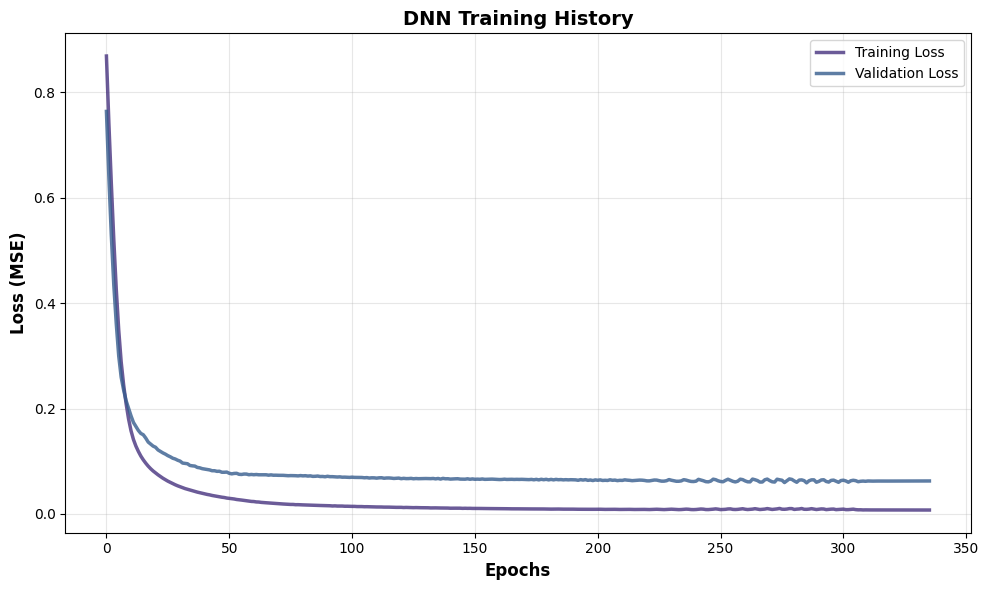

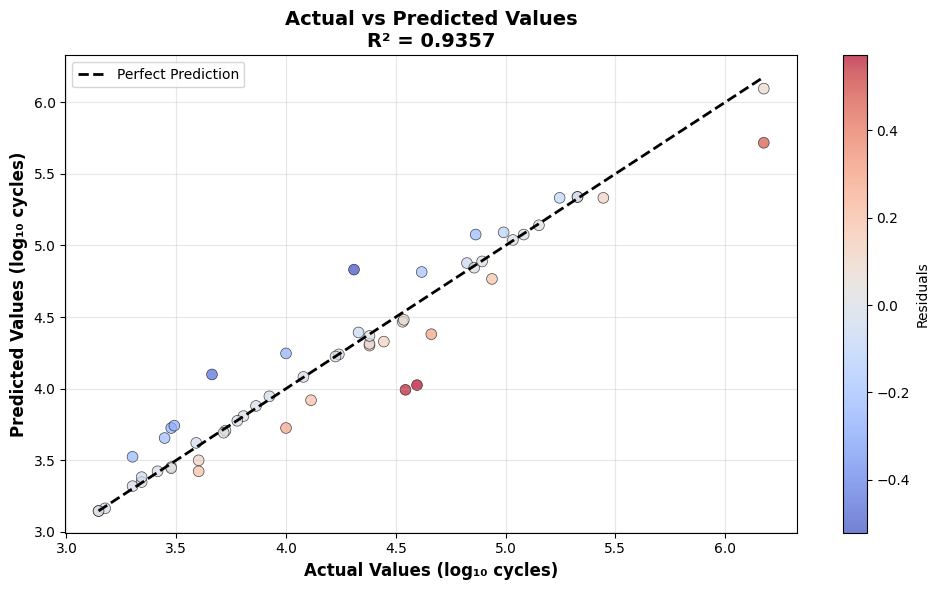

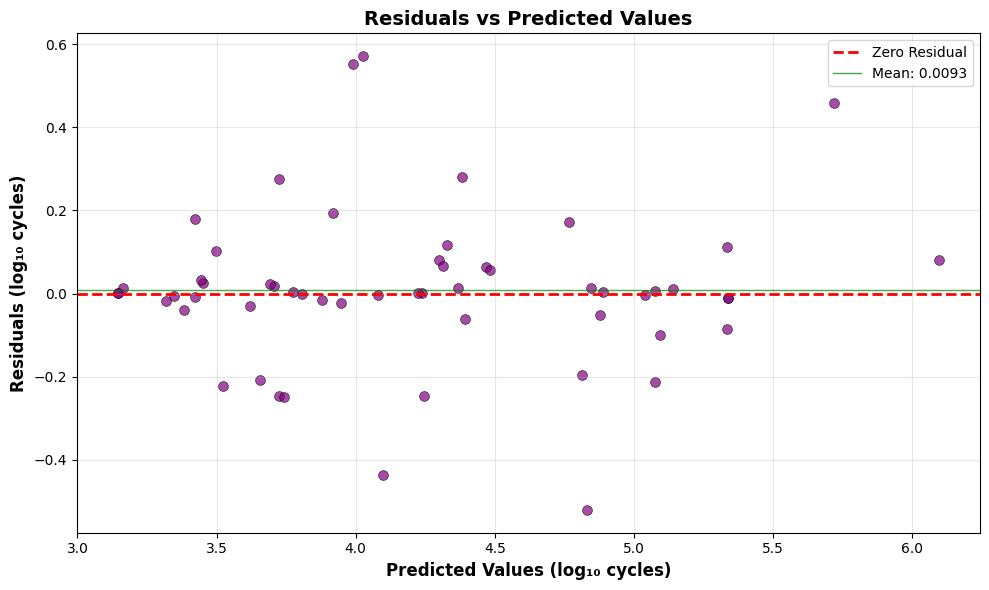

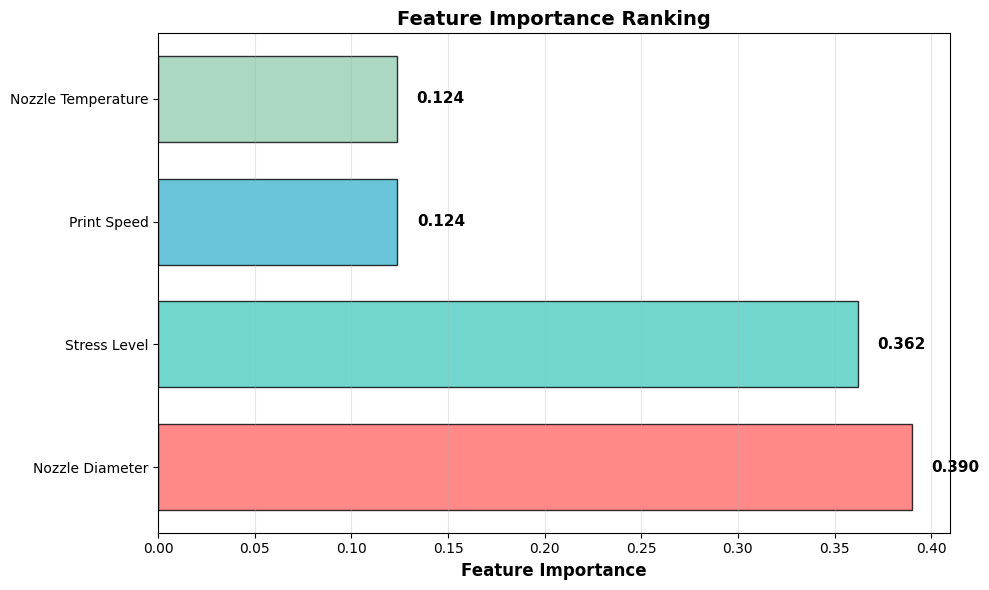

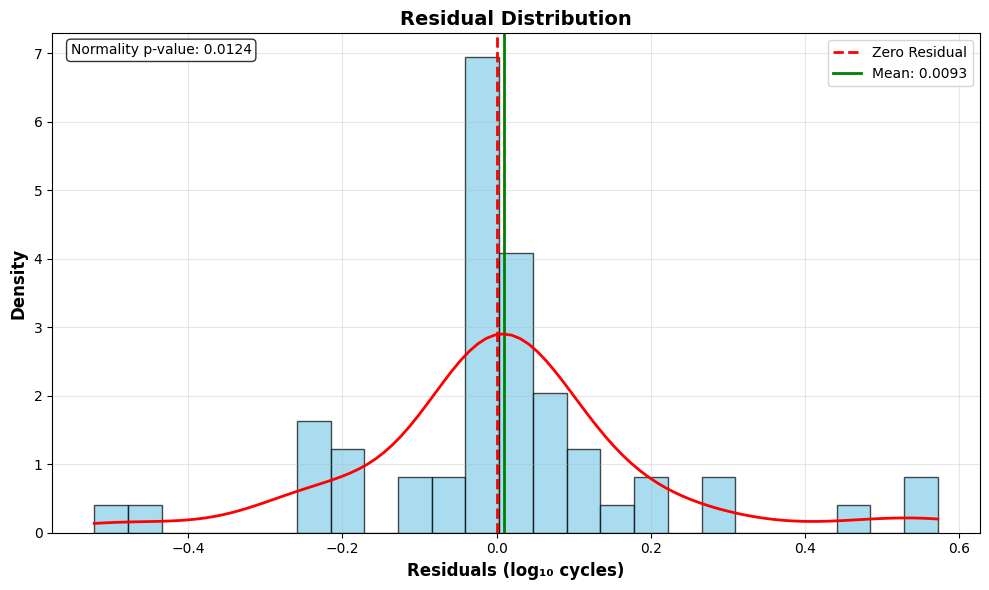


METRICS INTERPRETATION IN ORIGINAL SCALE

📈 KEY METRICS IN ORIGINAL SCALE:
--------------------------------------------------
R² Score                 :     0.758924
MSE                      : 18,524,854,452 cycles
RMSE                     :      136,106 cycles
MAE                      :       29,940 cycles
MAPE                     :        28.35 cycles
Median Absolute Error    :        2,205 cycles

GENERATING 3D BAR PLOTS
Creating 3D Feature Importance Bars...


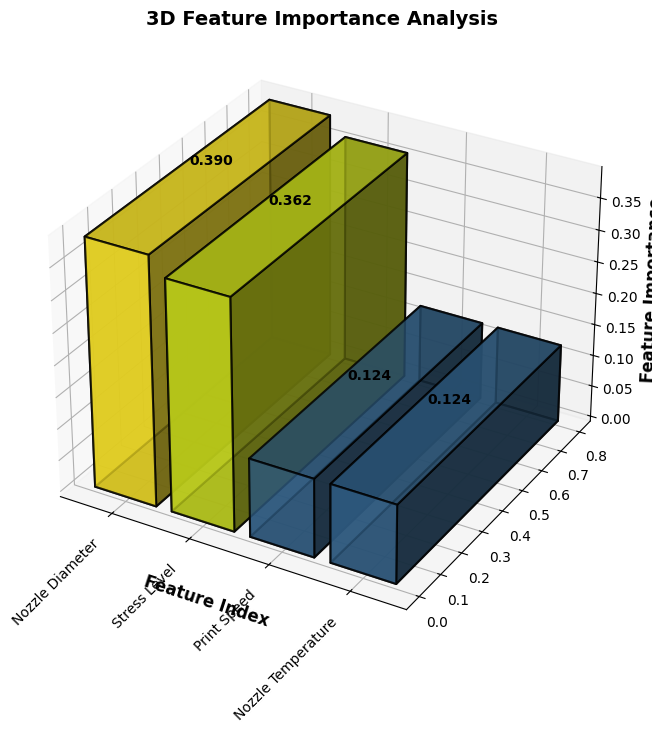

Creating 3D Metrics Comparison Bars...


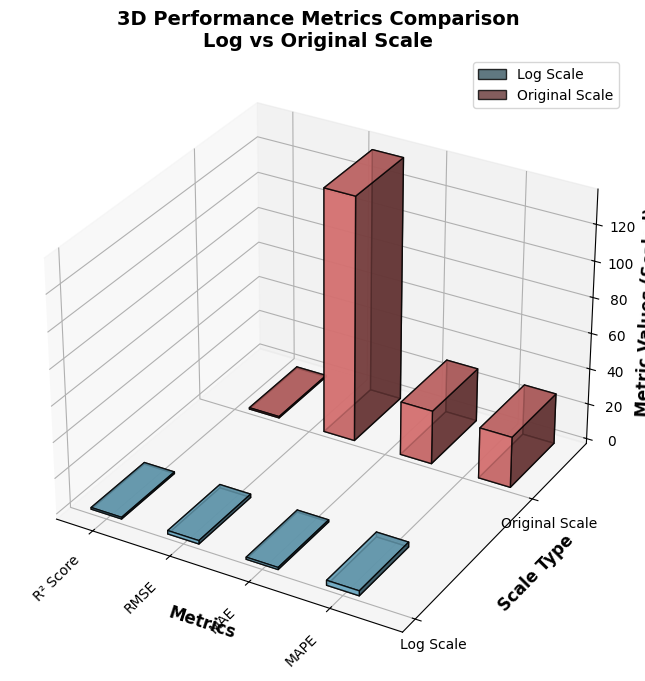

Creating 3D Residual Distribution Bars...


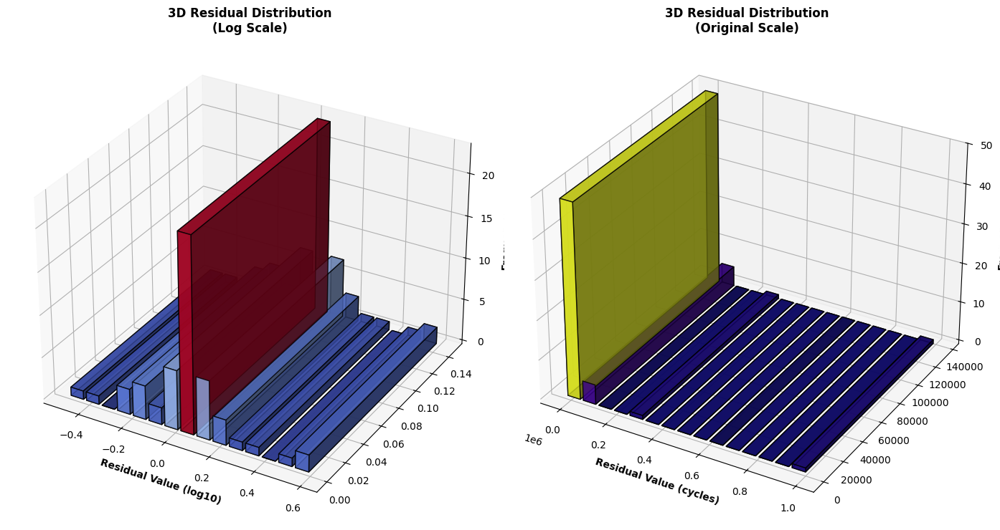

Creating 3D Feature Correlation Bars...


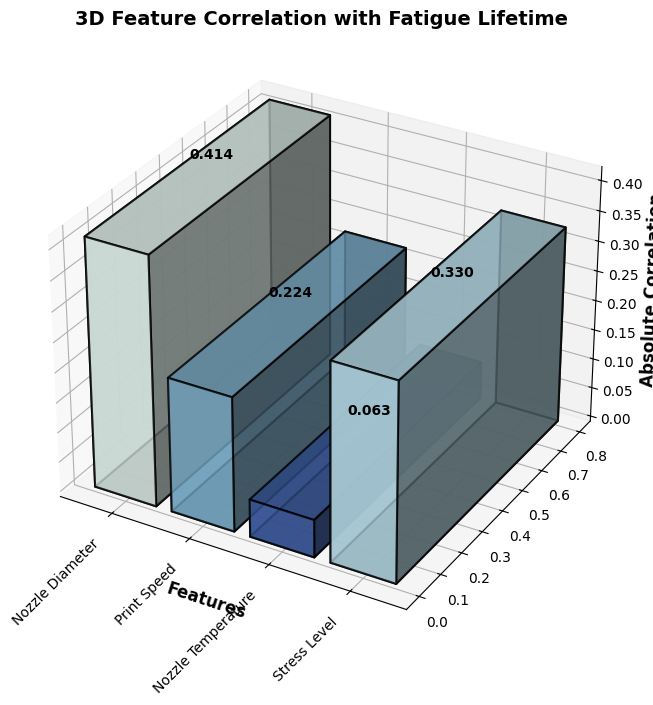

Creating 3D Prediction Accuracy Bars...


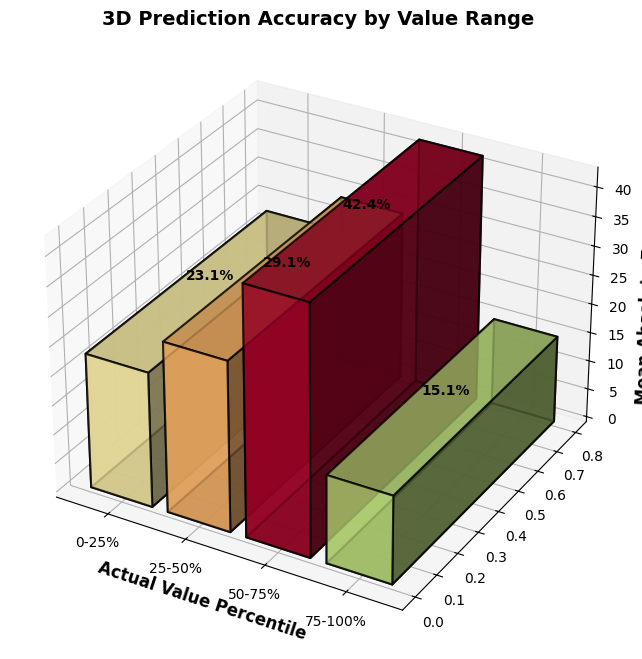

All 3D bar plots saved successfully!

FINAL SUMMARY

🎯 MODEL PERFORMANCE SUMMARY:
R² Score (Log10): 0.935743
RMSE (Log10): 0.189637
MAE (Log10): 0.116859

🏆 FEATURE IMPORTANCE RANKING:
----------------------------------------
 1. Nozzle Diameter      - 0.390
 2. Stress Level         - 0.362
 3. Print Speed          - 0.124
 4. Nozzle Temperature   - 0.124

📊 DATA CHARACTERISTICS:
Training samples: 222
Test samples: 56
Features: 4

💾 PLOTS SAVED:
2D Plots:
  - training_history.png
  - actual_vs_predicted.png
  - residuals_vs_predicted.png
  - feature_importance.png
  - residual_distribution.png
3D Bar Plots:
  - 3d_feature_importance_bars.png
  - 3d_metrics_comparison_bars.png
  - 3d_residual_distribution_bars.png
  - 3d_feature_correlation_bars.png
  - 3d_prediction_accuracy_bars.png

✅ ANALYSIS COMPLETED SUCCESSFULLY!


In [ ]:
# =============================================================================
# COMPLETE DETERMINISTIC DNN WITH 3D BAR PLOTS
# =============================================================================

import tensorflow as tf
import numpy as np
import random
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from sklearn.metrics import (r2_score, mean_squared_error, mean_absolute_error,
                            mean_absolute_percentage_error, explained_variance_score,
                            median_absolute_error, max_error)
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Set ALL random seeds for complete reproducibility
def set_seeds(seed=42):
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    tf.keras.utils.set_random_seed(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
    tf.config.experimental.enable_op_determinism()

set_seeds(42)

print("=" * 70)
print("COMPLETE DNN WITH 3D BAR PLOTS")
print("=" * 70)

# =============================================================================
# DATA LOADING AND PREPROCESSING
# =============================================================================

# Load data
df = pd.read_csv('combined_bootstrap_fatigue.csv')

# Prepare features and target
X = df[['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level']].values
y = np.log10(df['Fatigue Lifetime'].values)  # Log transformation

# Feature names for importance analysis
feature_names = ['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level']

print(f"Dataset: {X.shape[0]} samples, {X.shape[1]} features")
print(f"Features: {feature_names}")

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, shuffle=True
)

# Feature scaling
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

# Target scaling
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# =============================================================================
# DETERMINISTIC DNN MODEL
# =============================================================================

def create_deterministic_dnn():
    """Create DNN without dropout for deterministic results"""
    model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(4,)),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dense(16, activation='relu'),
        tf.keras.layers.Dense(1)
    ])
    return model

# Create and compile model
print("\nCreating Deterministic DNN Model...")
dnn_model = create_deterministic_dnn()

dnn_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='mse',
    metrics=['mae']
)

print("DNN Architecture Summary:")
dnn_model.summary()

# =============================================================================
# MODEL TRAINING
# =============================================================================

print("\nTraining DNN Model...")

callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=50,
        restore_best_weights=True,
        verbose=1
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=20,
        min_lr=1e-7,
        verbose=1
    )
]

history = dnn_model.fit(
    X_train_scaled, y_train_scaled,
    validation_data=(X_test_scaled, y_test_scaled),
    epochs=500,
    batch_size=32,
    callbacks=callbacks,
    verbose=1,
    shuffle=False
)

print(f"Training completed after {len(history.history['loss'])} epochs")

# =============================================================================
# COMPREHENSIVE METRICS CALCULATION
# =============================================================================

print("\n" + "=" * 70)
print("COMPREHENSIVE PERFORMANCE METRICS - LOG10 SPACE")
print("=" * 70)

# Predictions
y_pred_log_scaled = dnn_model.predict(X_test_scaled, verbose=0).flatten()
y_pred_log = scaler_y.inverse_transform(y_pred_log_scaled.reshape(-1, 1)).flatten()

# Calculate residuals
residuals_log = y_test - y_pred_log

# COMPREHENSIVE METRICS DICTIONARY
metrics_log = {
    'R² Score': r2_score(y_test, y_pred_log),
    'Explained Variance Score': explained_variance_score(y_test, y_pred_log),
    'Mean Squared Error (MSE)': mean_squared_error(y_test, y_pred_log),
    'Root Mean Squared Error (RMSE)': np.sqrt(mean_squared_error(y_test, y_pred_log)),
    'Mean Absolute Error (MAE)': mean_absolute_error(y_test, y_pred_log),
    'Median Absolute Error': median_absolute_error(y_test, y_pred_log),
    'Mean Absolute Percentage Error (MAPE)': mean_absolute_percentage_error(y_test, y_pred_log) * 100,
    'Max Error': max_error(y_test, y_pred_log),
    'Mean Bias Error': np.mean(y_pred_log - y_test),
    'Relative Absolute Error': np.sum(np.abs(y_test - y_pred_log)) / np.sum(np.abs(y_test - np.mean(y_test))),
    'Relative Squared Error': np.sum((y_test - y_pred_log) ** 2) / np.sum((y_test - np.mean(y_test)) ** 2)
}

# Additional statistical metrics
metrics_log.update({
    'Residual Mean': np.mean(residuals_log),
    'Residual Std': np.std(residuals_log),
    'Residual Skewness': stats.skew(residuals_log),
    'Residual Kurtosis': stats.kurtosis(residuals_log),
    'Residual RMSE': np.sqrt(np.mean(residuals_log ** 2)),
    'Residual MAE': np.mean(np.abs(residuals_log))
})

# Print comprehensive metrics
print("\n📊 COMPREHENSIVE MODEL METRICS (LOG10 SPACE):")
print("-" * 60)
for metric, value in metrics_log.items():
    if 'R²' in metric or 'Score' in metric:
        print(f"{metric:35}: {value:>12.6f}")
    elif 'Percentage' in metric:
        print(f"{metric:35}: {value:>12.4f}%")
    else:
        print(f"{metric:35}: {value:>12.6f}")

# =============================================================================
# NORMALIZED FEATURE IMPORTANCE
# =============================================================================

print("\n" + "=" * 70)
print("NORMALIZED FEATURE IMPORTANCE (SUM = 1.0)")
print("=" * 70)

def normalized_permutation_importance(model, X, y, feature_names, n_repeats=50, random_state=42):
    """Calculate normalized permutation importance that sums to 1.0"""

    print(f"Calculating permutation importance with {n_repeats} repetitions...")

    # Use scikit-learn's permutation_importance
    result = permutation_importance(
        model, X, y,
        n_repeats=n_repeats,
        scoring='r2',
        random_state=random_state,
        n_jobs=-1
    )

    # Get raw importance scores (ensure they're positive)
    raw_importance = np.maximum(result.importances_mean, 0)

    # NORMALIZE to sum = 1.0
    total_importance = np.sum(raw_importance)
    if total_importance > 0:
        normalized_importance = raw_importance / total_importance
    else:
        normalized_importance = raw_importance

    # Create comprehensive results dataframe
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': normalized_importance,
        'Raw_Importance': raw_importance,
        'Raw_Std': result.importances_std
    }).sort_values('Importance', ascending=False)

    # Add correct ranking
    importance_df['Rank'] = range(1, len(importance_df) + 1)

    return importance_df, result

# Calculate normalized importance
importance_df, perm_result = normalized_permutation_importance(
    dnn_model, X_test_scaled, y_test_scaled, feature_names, n_repeats=50
)

# Print clean results
print("\n📊 FEATURE IMPORTANCE:")
print("-" * 40)
print(f"{'Feature':20} {'Importance':>10} {'Rank':>6}")
print("-" * 40)

for _, row in importance_df.iterrows():
    print(f"{row['Feature']:20} {row['Importance']:10.3f} {row['Rank']:6.0f}")

print("-" * 40)
total_importance = importance_df['Importance'].sum()
print(f"{'TOTAL':20} {total_importance:10.3f} {'':6}")

# =============================================================================
# 2D PLOTS
# =============================================================================

print("\n" + "=" * 70)
print("GENERATING 2D PLOTS")
print("=" * 70)

# Set style for publication-quality plots
plt.style.use('default')
sns.set_palette("viridis")

# PLOT 1: Training History
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss', linewidth=2.5, alpha=0.8)
plt.plot(history.history['val_loss'], label='Validation Loss', linewidth=2.5, alpha=0.8)
plt.xlabel('Epochs', fontsize=12, fontweight='bold')
plt.ylabel('Loss (MSE)', fontsize=12, fontweight='bold')
plt.title('DNN Training History', fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('training_history.png', dpi=300, bbox_inches='tight')
plt.show()

# PLOT 2: Actual vs Predicted
plt.figure(figsize=(10, 6))
scatter = plt.scatter(y_test, y_pred_log, alpha=0.7, c=residuals_log,
                     cmap='coolwarm', s=60, edgecolor='black', linewidth=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()],
         'k--', linewidth=2, label='Perfect Prediction')
plt.xlabel('Actual Values (log₁₀ cycles)', fontsize=12, fontweight='bold')
plt.ylabel('Predicted Values (log₁₀ cycles)', fontsize=12, fontweight='bold')
plt.title(f'Actual vs Predicted Values\nR² = {metrics_log["R² Score"]:.4f}',
          fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter, label='Residuals')
plt.tight_layout()
plt.savefig('actual_vs_predicted.png', dpi=300, bbox_inches='tight')
plt.show()

# PLOT 3: Residuals vs Predicted
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_log, residuals_log, alpha=0.7, color='purple', s=50,
           edgecolor='black', linewidth=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2, label='Zero Residual')
plt.axhline(y=metrics_log['Residual Mean'], color='green', linestyle='-',
           linewidth=1, alpha=0.7, label=f'Mean: {metrics_log["Residual Mean"]:.4f}')
plt.xlabel('Predicted Values (log₁₀ cycles)', fontsize=12, fontweight='bold')
plt.ylabel('Residuals (log₁₀ cycles)', fontsize=12, fontweight='bold')
plt.title('Residuals vs Predicted Values', fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('residuals_vs_predicted.png', dpi=300, bbox_inches='tight')
plt.show()

# PLOT 4: Feature Importance
plt.figure(figsize=(10, 6))
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4']
y_pos = np.arange(len(importance_df))

bars = plt.barh(y_pos, importance_df['Importance'],
                color=colors, edgecolor='black', alpha=0.8, height=0.7)

plt.yticks(y_pos, importance_df['Feature'])
plt.xlabel('Feature Importance', fontsize=12, fontweight='bold')
plt.title('Feature Importance Ranking', fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3, axis='x')

# Add value labels
for i, (bar, importance) in enumerate(zip(bars, importance_df['Importance'])):
    plt.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2,
             f'{importance:.3f}', ha='left', va='center',
             fontweight='bold', fontsize=11)

plt.tight_layout()
plt.savefig('feature_importance.png', dpi=300, bbox_inches='tight')
plt.show()

# PLOT 5: Residual Distribution
plt.figure(figsize=(10, 6))
n, bins, patches = plt.hist(residuals_log, bins=25, alpha=0.7,
                           color='skyblue', edgecolor='black', density=True)
plt.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero Residual')
plt.axvline(x=metrics_log['Residual Mean'], color='green', linestyle='-',
           linewidth=2, label=f'Mean: {metrics_log["Residual Mean"]:.4f}')
plt.xlabel('Residuals (log₁₀ cycles)', fontsize=12, fontweight='bold')
plt.ylabel('Density', fontsize=12, fontweight='bold')
plt.title('Residual Distribution', fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

# Add KDE plot
kde = stats.gaussian_kde(residuals_log)
x_range = np.linspace(residuals_log.min(), residuals_log.max(), 100)
plt.plot(x_range, kde(x_range), 'r-', linewidth=2, label='KDE')

# Add normality test results
_, normality_p = stats.normaltest(residuals_log)
plt.text(0.02, 0.98, f'Normality p-value: {normality_p:.4f}',
         transform=plt.gca().transAxes, fontsize=10, verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.savefig('residual_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# 3D BAR PLOTS FUNCTIONS
# =============================================================================

def create_3d_feature_importance_bar(importance_df, feature_names):
    """Create 3D bar plot for feature importance"""
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Prepare data
    x_pos = np.arange(len(importance_df))
    y_pos = np.zeros(len(importance_df))
    z_pos = np.zeros(len(importance_df))

    dx = 0.8  # Bar width
    dy = 0.8  # Bar depth
    dz = importance_df['Importance'].values  # Bar height

    # Create colors based on importance
    colors = plt.cm.viridis(dz / dz.max())

    # Plot 3D bars
    bars = ax.bar3d(x_pos, y_pos, z_pos, dx, dy, dz,
                   color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)

    # Customize axes
    ax.set_xlabel('Feature Index', fontweight='bold', fontsize=12)
    ax.set_ylabel('', fontweight='bold', fontsize=12)
    ax.set_zlabel('Feature Importance', fontweight='bold', fontsize=12)

    # Set x-ticks to feature names
    ax.set_xticks(x_pos + dx/2)
    ax.set_xticklabels(importance_df['Feature'], rotation=45, ha='right')

    ax.set_title('3D Feature Importance Analysis', fontweight='bold', fontsize=14)

    # Add value labels on top of bars
    for i, (x, z) in enumerate(zip(x_pos, dz)):
        ax.text(x + dx/2, dy/2, z + 0.01, f'{z:.3f}',
               ha='center', va='bottom', fontweight='bold', fontsize=10)

    plt.tight_layout()
    plt.savefig('3d_feature_importance_bars.png', dpi=300, bbox_inches='tight')
    plt.show()

def create_3d_metrics_bars(metrics_log, metrics_original):
    """Create 3D bar plot comparing metrics in log and original scales"""
    fig = plt.figure(figsize=(14, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Use correct key names that match your dictionaries
    selected_metrics_log = ['R² Score', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'Mean Absolute Percentage Error (MAPE)']
    selected_metrics_orig = ['R² Score', 'RMSE', 'MAE', 'MAPE']

    # Prepare data with proper error handling
    metrics_log_values = []
    metrics_orig_values = []
    actual_metric_names = []

    # Map log metrics to original metrics
    metric_mapping = {
        'R² Score': 'R² Score',
        'Root Mean Squared Error (RMSE)': 'RMSE',
        'Mean Absolute Error (MAE)': 'MAE',
        'Mean Absolute Percentage Error (MAPE)': 'MAPE'
    }

    for log_metric, orig_metric in metric_mapping.items():
        if log_metric in metrics_log and orig_metric in metrics_original:
            metrics_log_values.append(metrics_log[log_metric])
            metrics_orig_values.append(metrics_original[orig_metric])
            actual_metric_names.append(orig_metric)

    if not metrics_log_values:
        print("Warning: No matching metrics found for 3D plot")
        return

    x_pos = np.arange(len(actual_metric_names))
    y_pos_log = np.zeros(len(actual_metric_names))
    y_pos_orig = np.ones(len(actual_metric_names))

    # Adjust scale for better visualization
    scale_factors = []
    z_log = []
    z_orig = []

    for i, metric in enumerate(actual_metric_names):
        log_val = metrics_log_values[i]
        orig_val = metrics_orig_values[i]

        if 'R²' in metric:
            # Keep R² as is (it's already normalized)
            z_log.append(log_val)
            z_orig.append(orig_val)
        elif 'MAPE' in metric:
            # MAPE is already in percentage
            z_log.append(log_val)
            z_orig.append(orig_val)
        else:
            # Scale other metrics for better visualization
            z_log.append(log_val * 10)  # Scale up for visibility
            z_orig.append(orig_val / 1000)  # Scale down large numbers

    dx = 0.4
    dy = 0.4

    # Plot log scale metrics
    bars_log = ax.bar3d(x_pos - dx/2, y_pos_log, np.zeros(len(actual_metric_names)),
                       dx, dy, z_log, color='skyblue', alpha=0.8,
                       label='Log Scale', edgecolor='black')

    # Plot original scale metrics
    bars_orig = ax.bar3d(x_pos + dx/2, y_pos_orig, np.zeros(len(actual_metric_names)),
                        dx, dy, z_orig, color='lightcoral', alpha=0.8,
                        label='Original Scale', edgecolor='black')

    # Customize plot
    ax.set_xlabel('Metrics', fontweight='bold', fontsize=12)
    ax.set_ylabel('Scale Type', fontweight='bold', fontsize=12)
    ax.set_zlabel('Metric Values (Scaled)', fontweight='bold', fontsize=12)

    ax.set_xticks(x_pos)
    ax.set_xticklabels(actual_metric_names, rotation=45, ha='right')
    ax.set_yticks([0, 1])
    ax.set_yticklabels(['Log Scale', 'Original Scale'])

    ax.set_title('3D Performance Metrics Comparison\nLog vs Original Scale',
                fontweight='bold', fontsize=14)

    ax.legend()
    plt.tight_layout()
    plt.savefig('3d_metrics_comparison_bars.png', dpi=300, bbox_inches='tight')
    plt.show()

def create_3d_residual_distribution(residuals_log, residuals_original):
    """Create 3D histogram of residuals"""
    fig = plt.figure(figsize=(14, 10))

    # Plot 1: Residual distribution in log scale
    ax1 = fig.add_subplot(121, projection='3d')

    # Create histogram data
    hist, bin_edges = np.histogram(residuals_log, bins=15)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    bin_width = np.diff(bin_edges)[0]

    x_pos = bin_centers
    y_pos = np.zeros(len(hist))
    z_pos = np.zeros(len(hist))

    dx = bin_width * 0.8
    dy = bin_width * 2
    dz = hist

    colors1 = plt.cm.coolwarm(hist / hist.max())

    bars1 = ax1.bar3d(x_pos, y_pos, z_pos, dx, dy, dz,
                     color=colors1, alpha=0.8, edgecolor='black')

    ax1.set_xlabel('Residual Value (log10)', fontweight='bold')
    ax1.set_ylabel('', fontweight='bold')
    ax1.set_zlabel('Frequency', fontweight='bold')
    ax1.set_title('3D Residual Distribution\n(Log Scale)', fontweight='bold')

    # Plot 2: Residual distribution in original scale
    ax2 = fig.add_subplot(122, projection='3d')

    hist_orig, bin_edges_orig = np.histogram(residuals_original, bins=15)
    bin_centers_orig = (bin_edges_orig[:-1] + bin_edges_orig[1:]) / 2
    bin_width_orig = np.diff(bin_edges_orig)[0]

    x_pos_orig = bin_centers_orig
    y_pos_orig = np.zeros(len(hist_orig))
    z_pos_orig = np.zeros(len(hist_orig))

    dx_orig = bin_width_orig * 0.8
    dy_orig = bin_width_orig * 2
    dz_orig = hist_orig

    colors2 = plt.cm.plasma(hist_orig / hist_orig.max())

    bars2 = ax2.bar3d(x_pos_orig, y_pos_orig, z_pos_orig, dx_orig, dy_orig, dz_orig,
                     color=colors2, alpha=0.8, edgecolor='black')

    ax2.set_xlabel('Residual Value (cycles)', fontweight='bold')
    ax2.set_ylabel('', fontweight='bold')
    ax2.set_zlabel('Frequency', fontweight='bold')
    ax2.set_title('3D Residual Distribution\n(Original Scale)', fontweight='bold')

    plt.tight_layout()
    plt.savefig('3d_residual_distribution_bars.png', dpi=300, bbox_inches='tight')
    plt.show()

def create_3d_feature_correlation_bars(df, feature_names):
    """Create 3D bar plot showing feature correlations with target"""
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Calculate correlations with target
    correlations = []
    for feature in feature_names:
        corr = df[feature].corr(df['Fatigue Lifetime'])
        correlations.append(abs(corr))  # Use absolute value

    x_pos = np.arange(len(feature_names))
    y_pos = np.zeros(len(feature_names))
    z_pos = np.zeros(len(feature_names))

    dx = 0.8
    dy = 0.8
    dz = correlations

    colors = plt.cm.RdYlBu_r(np.array(correlations))

    bars = ax.bar3d(x_pos, y_pos, z_pos, dx, dy, dz,
                   color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)

    ax.set_xlabel('Features', fontweight='bold', fontsize=12)
    ax.set_ylabel('', fontweight='bold', fontsize=12)
    ax.set_zlabel('Absolute Correlation', fontweight='bold', fontsize=12)

    ax.set_xticks(x_pos + dx/2)
    ax.set_xticklabels(feature_names, rotation=45, ha='right')

    ax.set_title('3D Feature Correlation with Fatigue Lifetime',
                fontweight='bold', fontsize=14)

    # Add correlation values on bars
    for i, (x, corr) in enumerate(zip(x_pos, correlations)):
        ax.text(x + dx/2, dy/2, corr + 0.02, f'{corr:.3f}',
               ha='center', va='bottom', fontweight='bold', fontsize=10)

    plt.tight_layout()
    plt.savefig('3d_feature_correlation_bars.png', dpi=300, bbox_inches='tight')
    plt.show()

def create_3d_prediction_accuracy_bars(y_test_original, y_pred_original):
    """Create 3D bars showing prediction accuracy by percentile"""
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Calculate absolute percentage errors
    ape = np.abs((y_test_original - y_pred_original) / y_test_original) * 100

    # Create bins by actual value percentiles
    percentiles = np.percentile(y_test_original, [0, 25, 50, 75, 100])
    bin_labels = ['0-25%', '25-50%', '50-75%', '75-100%']

    mean_errors = []
    for i in range(len(percentiles)-1):
        mask = (y_test_original >= percentiles[i]) & (y_test_original < percentiles[i+1])
        if np.sum(mask) > 0:
            mean_errors.append(np.mean(ape[mask]))
        else:
            mean_errors.append(0)

    x_pos = np.arange(len(bin_labels))
    y_pos = np.zeros(len(bin_labels))
    z_pos = np.zeros(len(bin_labels))

    dx = 0.8
    dy = 0.8
    dz = mean_errors

    colors = plt.cm.RdYlGn_r(np.array(dz) / max(dz))

    bars = ax.bar3d(x_pos, y_pos, z_pos, dx, dy, dz,
                   color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)

    ax.set_xlabel('Actual Value Percentile', fontweight='bold', fontsize=12)
    ax.set_ylabel('', fontweight='bold', fontsize=12)
    ax.set_zlabel('Mean Absolute Error (%)', fontweight='bold', fontsize=12)

    ax.set_xticks(x_pos + dx/2)
    ax.set_xticklabels(bin_labels)

    ax.set_title('3D Prediction Accuracy by Value Range',
                fontweight='bold', fontsize=14)

    # Add error values on bars
    for i, (x, error) in enumerate(zip(x_pos, mean_errors)):
        ax.text(x + dx/2, dy/2, error + 1, f'{error:.1f}%',
               ha='center', va='bottom', fontweight='bold', fontsize=10)

    plt.tight_layout()
    plt.savefig('3d_prediction_accuracy_bars.png', dpi=300, bbox_inches='tight')
    plt.show()

# =============================================================================
# METRICS INTERPRETATION IN ORIGINAL SCALE
# =============================================================================

print("\n" + "=" * 70)
print("METRICS INTERPRETATION IN ORIGINAL SCALE")
print("=" * 70)

# Convert predictions back to original scale for interpretation
y_pred_original = 10 ** y_pred_log
y_test_original = 10 ** y_test

# Calculate key metrics in original scale
metrics_original = {
    'R² Score': r2_score(y_test_original, y_pred_original),
    'MSE': mean_squared_error(y_test_original, y_pred_original),
    'RMSE': np.sqrt(mean_squared_error(y_test_original, y_pred_original)),
    'MAE': mean_absolute_error(y_test_original, y_pred_original),
    'MAPE': mean_absolute_percentage_error(y_test_original, y_pred_original) * 100,
    'Median Absolute Error': median_absolute_error(y_test_original, y_pred_original)
}

print("\n📈 KEY METRICS IN ORIGINAL SCALE:")
print("-" * 50)
for metric, value in metrics_original.items():
    if 'R²' in metric or 'Score' in metric:
        print(f"{metric:25}: {value:>12.6f}")
    elif 'Percentage' in metric:
        print(f"{metric:25}: {value:>12.2f}%")
    elif value > 1000:
        print(f"{metric:25}: {value:>12,.0f} cycles")
    else:
        print(f"{metric:25}: {value:>12.2f} cycles")

# =============================================================================
# 3D BAR PLOTS
# =============================================================================

print("\n" + "=" * 70)
print("GENERATING 3D BAR PLOTS")
print("=" * 70)

# Calculate residuals in original scale for the plots
residuals_original = y_test_original - y_pred_original

print("Creating 3D Feature Importance Bars...")
create_3d_feature_importance_bar(importance_df, feature_names)

print("Creating 3D Metrics Comparison Bars...")
create_3d_metrics_bars(metrics_log, metrics_original)

print("Creating 3D Residual Distribution Bars...")
create_3d_residual_distribution(residuals_log, residuals_original)

print("Creating 3D Feature Correlation Bars...")
create_3d_feature_correlation_bars(df, feature_names)

print("Creating 3D Prediction Accuracy Bars...")
create_3d_prediction_accuracy_bars(y_test_original, y_pred_original)

print("All 3D bar plots saved successfully!")

# =============================================================================
# FINAL SUMMARY
# =============================================================================

print("\n" + "=" * 70)
print("FINAL SUMMARY")
print("=" * 70)

print(f"\n🎯 MODEL PERFORMANCE SUMMARY:")
print(f"R² Score (Log10): {metrics_log['R² Score']:.6f}")
print(f"RMSE (Log10): {metrics_log['Root Mean Squared Error (RMSE)']:.6f}")
print(f"MAE (Log10): {metrics_log['Mean Absolute Error (MAE)']:.6f}")

print(f"\n🏆 FEATURE IMPORTANCE RANKING:")
print("-" * 40)
for i, (_, row) in enumerate(importance_df.iterrows(), 1):
    print(f"{i:2}. {row['Feature']:20} - {row['Importance']:.3f}")

print(f"\n📊 DATA CHARACTERISTICS:")
print(f"Training samples: {X_train.shape[0]}")
print(f"Test samples: {X_test.shape[0]}")
print(f"Features: {X_train.shape[1]}")

print(f"\n💾 PLOTS SAVED:")
print(f"2D Plots:")
print(f"  - training_history.png")
print(f"  - actual_vs_predicted.png")
print(f"  - residuals_vs_predicted.png")
print(f"  - feature_importance.png")
print(f"  - residual_distribution.png")
print(f"3D Bar Plots:")
print(f"  - 3d_feature_importance_bars.png")
print(f"  - 3d_metrics_comparison_bars.png")
print(f"  - 3d_residual_distribution_bars.png")
print(f"  - 3d_feature_correlation_bars.png")
print(f"  - 3d_prediction_accuracy_bars.png")

print(f"\n✅ ANALYSIS COMPLETED SUCCESSFULLY!")
print("=" * 70)

In [ ]:
# =============================================================================
# 3D BAR PLOTS FUNCTIONS
# =============================================================================

def create_3d_feature_importance_bar(importance_df, feature_names):
    """Create 3D bar plot for feature importance"""
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Prepare data
    x_pos = np.arange(len(importance_df))
    y_pos = np.zeros(len(importance_df))
    z_pos = np.zeros(len(importance_df))

    dx = 0.8  # Bar width
    dy = 0.8  # Bar depth
    dz = importance_df['Importance'].values  # Bar height

    # Create colors based on importance
    colors = plt.cm.viridis(dz / dz.max())

    # Plot 3D bars
    bars = ax.bar3d(x_pos, y_pos, z_pos, dx, dy, dz,
                   color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)

    # Customize axes
    ax.set_xlabel('Feature Index', fontweight='bold', fontsize=12)
    ax.set_ylabel('', fontweight='bold', fontsize=12)
    ax.set_zlabel('Feature Importance', fontweight='bold', fontsize=12)

    # Set x-ticks to feature names
    ax.set_xticks(x_pos + dx/2)
    ax.set_xticklabels(importance_df['Feature'], rotation=45, ha='right')

    ax.set_title('3D Feature Importance Analysis', fontweight='bold', fontsize=14)

    # Add value labels on top of bars
    for i, (x, z) in enumerate(zip(x_pos, dz)):
        ax.text(x + dx/2, dy/2, z + 0.01, f'{z:.3f}',
               ha='center', va='bottom', fontweight='bold', fontsize=10)

    plt.tight_layout()
    plt.savefig('3d_feature_importance_bars.png', dpi=300, bbox_inches='tight')
    plt.show()

def create_3d_metrics_bars(metrics_log, metrics_original):
    """Create 3D bar plot comparing metrics in log and original scales"""
    fig = plt.figure(figsize=(14, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Use correct key names that match your dictionaries
    selected_metrics_log = ['R² Score', 'Root Mean Squared Error (RMSE)', 'Mean Absolute Error (MAE)', 'Mean Absolute Percentage Error (MAPE)']
    selected_metrics_orig = ['R² Score', 'RMSE', 'MAE', 'MAPE']

    # Prepare data with proper error handling
    metrics_log_values = []
    metrics_orig_values = []
    actual_metric_names = []

    # Map log metrics to original metrics
    metric_mapping = {
        'R² Score': 'R² Score',
        'Root Mean Squared Error (RMSE)': 'RMSE',
        'Mean Absolute Error (MAE)': 'MAE',
        'Mean Absolute Percentage Error (MAPE)': 'MAPE'
    }

    for log_metric, orig_metric in metric_mapping.items():
        if log_metric in metrics_log and orig_metric in metrics_original:
            metrics_log_values.append(metrics_log[log_metric])
            metrics_orig_values.append(metrics_original[orig_metric])
            actual_metric_names.append(orig_metric)

    if not metrics_log_values:
        print("Warning: No matching metrics found for 3D plot")
        return

    x_pos = np.arange(len(actual_metric_names))
    y_pos_log = np.zeros(len(actual_metric_names))
    y_pos_orig = np.ones(len(actual_metric_names))

    # Adjust scale for better visualization
    scale_factors = []
    z_log = []
    z_orig = []

    for i, metric in enumerate(actual_metric_names):
        log_val = metrics_log_values[i]
        orig_val = metrics_orig_values[i]

        if 'R²' in metric:
            # Keep R² as is (it's already normalized)
            z_log.append(log_val)
            z_orig.append(orig_val)
        elif 'MAPE' in metric:
            # MAPE is already in percentage
            z_log.append(log_val)
            z_orig.append(orig_val)
        else:
            # Scale other metrics for better visualization
            z_log.append(log_val * 10)  # Scale up for visibility
            z_orig.append(orig_val / 1000)  # Scale down large numbers

    dx = 0.4
    dy = 0.4

    # Plot log scale metrics
    bars_log = ax.bar3d(x_pos - dx/2, y_pos_log, np.zeros(len(actual_metric_names)),
                       dx, dy, z_log, color='skyblue', alpha=0.8,
                       label='Log Scale', edgecolor='black')

    # Plot original scale metrics
    bars_orig = ax.bar3d(x_pos + dx/2, y_pos_orig, np.zeros(len(actual_metric_names)),
                        dx, dy, z_orig, color='lightcoral', alpha=0.8,
                        label='Original Scale', edgecolor='black')

    # Customize plot
    ax.set_xlabel('Metrics', fontweight='bold', fontsize=12)
    ax.set_ylabel('Scale Type', fontweight='bold', fontsize=12)
    ax.set_zlabel('Metric Values (Scaled)', fontweight='bold', fontsize=12)

    ax.set_xticks(x_pos)
    ax.set_xticklabels(actual_metric_names, rotation=45, ha='right')
    ax.set_yticks([0, 1])
    ax.set_yticklabels(['Log Scale', 'Original Scale'])

    ax.set_title('3D Performance Metrics Comparison\nLog vs Original Scale',
                fontweight='bold', fontsize=14)

    ax.legend()
    plt.tight_layout()
    plt.savefig('3d_metrics_comparison_bars.png', dpi=300, bbox_inches='tight')
    plt.show()

def create_3d_residual_distribution(residuals_log, residuals_original):
    """Create 3D histogram of residuals"""
    fig = plt.figure(figsize=(14, 10))

    # Plot 1: Residual distribution in log scale
    ax1 = fig.add_subplot(121, projection='3d')

    # Create histogram data
    hist, bin_edges = np.histogram(residuals_log, bins=15)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    bin_width = np.diff(bin_edges)[0]

    x_pos = bin_centers
    y_pos = np.zeros(len(hist))
    z_pos = np.zeros(len(hist))

    dx = bin_width * 0.8
    dy = bin_width * 2
    dz = hist

    colors1 = plt.cm.coolwarm(hist / hist.max())

    bars1 = ax1.bar3d(x_pos, y_pos, z_pos, dx, dy, dz,
                     color=colors1, alpha=0.8, edgecolor='black')

    ax1.set_xlabel('Residual Value (log10)', fontweight='bold')
    ax1.set_ylabel('', fontweight='bold')
    ax1.set_zlabel('Frequency', fontweight='bold')
    ax1.set_title('3D Residual Distribution\n(Log Scale)', fontweight='bold')

    # Plot 2: Residual distribution in original scale
    ax2 = fig.add_subplot(122, projection='3d')

    hist_orig, bin_edges_orig = np.histogram(residuals_original, bins=15)
    bin_centers_orig = (bin_edges_orig[:-1] + bin_edges_orig[1:]) / 2
    bin_width_orig = np.diff(bin_edges_orig)[0]

    x_pos_orig = bin_centers_orig
    y_pos_orig = np.zeros(len(hist_orig))
    z_pos_orig = np.zeros(len(hist_orig))

    dx_orig = bin_width_orig * 0.8
    dy_orig = bin_width_orig * 2
    dz_orig = hist_orig

    colors2 = plt.cm.plasma(hist_orig / hist_orig.max())

    bars2 = ax2.bar3d(x_pos_orig, y_pos_orig, z_pos_orig, dx_orig, dy_orig, dz_orig,
                     color=colors2, alpha=0.8, edgecolor='black')

    ax2.set_xlabel('Residual Value (cycles)', fontweight='bold')
    ax2.set_ylabel('', fontweight='bold')
    ax2.set_zlabel('Frequency', fontweight='bold')
    ax2.set_title('3D Residual Distribution\n(Original Scale)', fontweight='bold')

    plt.tight_layout()
    plt.savefig('3d_residual_distribution_bars.png', dpi=300, bbox_inches='tight')
    plt.show()

def create_3d_feature_correlation_bars(df, feature_names):
    """Create 3D bar plot showing feature correlations with target"""
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Calculate correlations with target
    correlations = []
    for feature in feature_names:
        corr = df[feature].corr(df['Fatigue Lifetime'])
        correlations.append(abs(corr))  # Use absolute value

    x_pos = np.arange(len(feature_names))
    y_pos = np.zeros(len(feature_names))
    z_pos = np.zeros(len(feature_names))

    dx = 0.8
    dy = 0.8
    dz = correlations

    colors = plt.cm.RdYlBu_r(np.array(correlations))

    bars = ax.bar3d(x_pos, y_pos, z_pos, dx, dy, dz,
                   color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)

    ax.set_xlabel('Features', fontweight='bold', fontsize=12)
    ax.set_ylabel('', fontweight='bold', fontsize=12)
    ax.set_zlabel('Absolute Correlation', fontweight='bold', fontsize=12)

    ax.set_xticks(x_pos + dx/2)
    ax.set_xticklabels(feature_names, rotation=45, ha='right')

    ax.set_title('3D Feature Correlation with Fatigue Lifetime',
                fontweight='bold', fontsize=14)

    # Add correlation values on bars
    for i, (x, corr) in enumerate(zip(x_pos, correlations)):
        ax.text(x + dx/2, dy/2, corr + 0.02, f'{corr:.3f}',
               ha='center', va='bottom', fontweight='bold', fontsize=10)

    plt.tight_layout()
    plt.savefig('3d_feature_correlation_bars.png', dpi=300, bbox_inches='tight')
    plt.show()

def create_3d_prediction_accuracy_bars(y_test_original, y_pred_original):
    """Create 3D bars showing prediction accuracy by percentile"""
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Calculate absolute percentage errors
    ape = np.abs((y_test_original - y_pred_original) / y_test_original) * 100

    # Create bins by actual value percentiles
    percentiles = np.percentile(y_test_original, [0, 25, 50, 75, 100])
    bin_labels = ['0-25%', '25-50%', '50-75%', '75-100%']

    mean_errors = []
    for i in range(len(percentiles)-1):
        mask = (y_test_original >= percentiles[i]) & (y_test_original < percentiles[i+1])
        if np.sum(mask) > 0:
            mean_errors.append(np.mean(ape[mask]))
        else:
            mean_errors.append(0)

    x_pos = np.arange(len(bin_labels))
    y_pos = np.zeros(len(bin_labels))
    z_pos = np.zeros(len(bin_labels))

    dx = 0.8
    dy = 0.8
    dz = mean_errors

    colors = plt.cm.RdYlGn_r(np.array(dz) / max(dz))

    bars = ax.bar3d(x_pos, y_pos, z_pos, dx, dy, dz,
                   color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)

    ax.set_xlabel('Actual Value Percentile', fontweight='bold', fontsize=12)
    ax.set_ylabel('', fontweight='bold', fontsize=12)
    ax.set_zlabel('Mean Absolute Error (%)', fontweight='bold', fontsize=12)

    ax.set_xticks(x_pos + dx/2)
    ax.set_xticklabels(bin_labels)

    ax.set_title('3D Prediction Accuracy by Value Range',
                fontweight='bold', fontsize=14)

    # Add error values on bars
    for i, (x, error) in enumerate(zip(x_pos, mean_errors)):
        ax.text(x + dx/2, dy/2, error + 1, f'{error:.1f}%',
               ha='center', va='bottom', fontweight='bold', fontsize=10)

    plt.tight_layout()
    plt.savefig('3d_prediction_accuracy_bars.png', dpi=300, bbox_inches='tight')
    plt.show()

#model full info

In [ ]:
# =============================================================================
# COMPREHENSIVE DNN ANALYSIS WITH COMPLETE MODEL INFORMATION EXTRACTION
# =============================================================================

import tensorflow as tf
import numpy as np
import random
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (r2_score, mean_squared_error, mean_absolute_error,
                            mean_absolute_percentage_error, explained_variance_score,
                            median_absolute_error, max_error)
from scipy import stats
import warnings
import json
warnings.filterwarnings('ignore')

# Set ALL random seeds for complete reproducibility
def set_seeds(seed=42):
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    tf.keras.utils.set_random_seed(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
    tf.config.experimental.enable_op_determinism()

set_seeds(42)

print("=" * 80)
print("COMPREHENSIVE DNN ANALYSIS WITH COMPLETE MODEL INFORMATION EXTRACTION")
print("=" * 80)

# =============================================================================
# DATA LOADING AND PREPROCESSING
# =============================================================================

# Load data
df = pd.read_csv('combined_bootstrap_fatigue.csv')

# Prepare features and target
X = df[['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level']].values
y = np.log10(df['Fatigue Lifetime'].values)  # Log transformation

# Feature names for importance analysis
feature_names = ['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level']

print(f"Dataset: {X.shape[0]} samples, {X.shape[1]} features")
print(f"Features: {feature_names}")

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, shuffle=True
)

# Feature scaling
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

# Target scaling
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# =============================================================================
# COMPREHENSIVE MODEL INFORMATION EXTRACTION FUNCTIONS
# =============================================================================

def extract_model_architecture_info(model):
    """Extract complete model architecture information"""
    arch_info = {
        'model_name': 'Deterministic_DNN',
        'model_type': 'Feedforward_Neural_Network',
        'input_shape': model.input_shape,
        'output_shape': model.output_shape,
        'total_layers': len(model.layers),
        'is_deterministic': True,
        'layers': []
    }

    for i, layer in enumerate(model.layers):
        # Get input and output shapes correctly for Colab
        try:
            if hasattr(layer, 'input') and layer.input is not None:
                if isinstance(layer.input, (list, tuple)):
                    input_shape = [inp.shape.as_list() for inp in layer.input] if isinstance(layer.input, list) else layer.input.shape.as_list()
                else:
                    input_shape = layer.input.shape.as_list()
            else:
                input_shape = getattr(layer, 'batch_input_shape', None)
        except:
            input_shape = None

        try:
            if hasattr(layer, 'output') and layer.output is not None:
                if isinstance(layer.output, (list, tuple)):
                    output_shape = [out.shape.as_list() for out in layer.output] if isinstance(layer.output, list) else layer.output.shape.as_list()
                else:
                    output_shape = layer.output.shape.as_list()
            else:
                output_shape = getattr(layer, 'output_shape', None)
        except:
            output_shape = None

        layer_info = {
            'layer_index': i,
            'layer_name': layer.name,
            'layer_type': type(layer).__name__,
            'input_shape': input_shape,
            'output_shape': output_shape,
            'activation': getattr(layer, 'activation', None),
            'trainable': layer.trainable,
            'units': getattr(layer, 'units', None),
            'parameters': {}
        }

        # Get weights and biases if they exist
        try:
            if layer.weights:
                weights = layer.get_weights()
                if len(weights) > 0:
                    layer_info['parameters']['weights_shape'] = weights[0].shape
                    layer_info['parameters']['weights_mean'] = float(np.mean(weights[0]))
                    layer_info['parameters']['weights_std'] = float(np.std(weights[0]))
                    layer_info['parameters']['weights_min'] = float(np.min(weights[0]))
                    layer_info['parameters']['weights_max'] = float(np.max(weights[0]))
                    layer_info['parameters']['weights_count'] = int(np.prod(weights[0].shape))

                if len(weights) > 1:
                    layer_info['parameters']['biases_shape'] = weights[1].shape
                    layer_info['parameters']['biases_mean'] = float(np.mean(weights[1]))
                    layer_info['parameters']['biases_std'] = float(np.std(weights[1]))
                    layer_info['parameters']['biases_min'] = float(np.min(weights[1]))
                    layer_info['parameters']['biases_max'] = float(np.max(weights[1]))
                    layer_info['parameters']['biases_count'] = int(np.prod(weights[1].shape))
        except Exception as e:
            print(f"Warning: Could not extract weights for layer {layer.name}: {e}")

        arch_info['layers'].append(layer_info)

    return arch_info

def extract_training_configuration():
    """Extract training configuration information"""
    training_config = {
        'optimizer': {
            'name': 'Adam',
            'learning_rate': 0.001,
            'beta_1': 0.9,
            'beta_2': 0.999,
            'epsilon': 1e-7
        },
        'loss_function': 'mse',
        'metrics': ['mae'],
        'training_parameters': {
            'max_epochs': 500,
            'batch_size': 32,
            'validation_split': 0.2,
            'shuffle': False,
            'random_state': 42
        },
        'callbacks': {
            'early_stopping': {
                'monitor': 'val_loss',
                'patience': 50,
                'restore_best_weights': True,
                'mode': 'min'
            },
            'reduce_lr': {
                'monitor': 'val_loss',
                'factor': 0.5,
                'patience': 20,
                'min_lr': 1e-7
            }
        }
    }
    return training_config

def extract_data_info(X_train, X_test, y_train, y_test, feature_names):
    """Extract comprehensive data information"""
    data_info = {
        'dataset': {
            'total_samples': X_train.shape[0] + X_test.shape[0],
            'features_count': X_train.shape[1],
            'feature_names': feature_names
        },
        'splits': {
            'training_samples': X_train.shape[0],
            'test_samples': X_test.shape[0],
            'train_test_ratio': f"{X_train.shape[0]}:{X_test.shape[0]}"
        },
        'features': {},
        'target': {
            'original_name': 'Fatigue Lifetime',
            'transformation': 'log10',
            'training_range': [float(y_train.min()), float(y_train.max())],
            'test_range': [float(y_test.min()), float(y_test.max())]
        }
    }

    # Feature statistics
    for i, feature in enumerate(feature_names):
        data_info['features'][feature] = {
            'training_range': [float(X_train[:, i].min()), float(X_train[:, i].max())],
            'test_range': [float(X_test[:, i].min()), float(X_test[:, i].max())],
            'training_mean': float(X_train[:, i].mean()),
            'training_std': float(X_train[:, i].std())
        }

    return data_info

# =============================================================================
# DETERMINISTIC DNN MODEL
# =============================================================================

def create_deterministic_dnn():
    """Create DNN without dropout for deterministic results"""
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(64, activation='relu', input_shape=(4,), name='hidden_layer_1'),
        tf.keras.layers.Dense(32, activation='relu', name='hidden_layer_2'),
        tf.keras.layers.Dense(16, activation='relu', name='hidden_layer_3'),
        tf.keras.layers.Dense(1, name='output_layer')
    ])
    return model

# Create and compile model
print("\nCreating Deterministic DNN Model...")
dnn_model = create_deterministic_dnn()

dnn_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='mse',
    metrics=['mae']
)

# =============================================================================
# EXTRACT MODEL INFORMATION - SIMPLIFIED FOR COLAB
# =============================================================================

print("\n" + "=" * 80)
print("COMPREHENSIVE MODEL ARCHITECTURE INFORMATION")
print("=" * 80)

# Print model summary first to build the model
print("\n🧮 DNN ARCHITECTURE SUMMARY:")
print("-" * 60)
dnn_model.summary()

# Now extract model information using a simpler approach
def get_simple_model_info(model):
    """Simplified model information extraction for Colab"""
    model_info = {
        'model_name': 'Deterministic_DNN',
        'model_type': 'Feedforward_Neural_Network',
        'input_shape': model.input_shape,
        'output_shape': model.output_shape,
        'total_layers': len(model.layers),
        'total_parameters': model.count_params(),
        'is_deterministic': True,
        'layers': []
    }

    for i, layer in enumerate(model.layers):
        layer_info = {
            'layer_index': i,
            'layer_name': layer.name,
            'layer_type': type(layer).__name__,
            'units': getattr(layer, 'units', None),
            'activation': str(getattr(layer, 'activation', None)),
            'trainable': layer.trainable,
            'parameters_count': layer.count_params(),
            'weights_shape': None,
            'biases_shape': None
        }

        # Get weights information
        try:
            weights = layer.get_weights()
            if len(weights) > 0:
                layer_info['weights_shape'] = weights[0].shape
                layer_info['weights_count'] = int(np.prod(weights[0].shape))
            if len(weights) > 1:
                layer_info['biases_shape'] = weights[1].shape
                layer_info['biases_count'] = int(np.prod(weights[1].shape))
        except:
            pass

        model_info['layers'].append(layer_info)

    return model_info

# Extract simplified model information
model_arch_info = get_simple_model_info(dnn_model)
training_config = extract_training_configuration()
data_info = extract_data_info(X_train, X_test, y_train, y_test, feature_names)

# Print detailed layer information
print("\n📋 DETAILED LAYER INFORMATION:")
print("-" * 80)
total_params = 0
total_weights = 0
total_biases = 0

for layer_info in model_arch_info['layers']:
    print(f"\nLayer {layer_info['layer_index']}: {layer_info['layer_name']}")
    print(f"  Type: {layer_info['layer_type']}")
    print(f"  Units: {layer_info['units']}")
    print(f"  Activation: {layer_info['activation']}")
    print(f"  Trainable: {layer_info['trainable']}")
    print(f"  Total Parameters: {layer_info['parameters_count']:,}")

    if layer_info['weights_shape'] is not None:
        weights_shape = layer_info['weights_shape']
        weights_count = layer_info.get('weights_count', 0)
        total_weights += weights_count
        total_params += weights_count
        print(f"  Weights: {weights_shape} = {weights_count:,} parameters")

    if layer_info['biases_shape'] is not None:
        biases_shape = layer_info['biases_shape']
        biases_count = layer_info.get('biases_count', 0)
        total_biases += biases_count
        total_params += biases_count
        print(f"  Biases: {biases_shape} = {biases_count:,} parameters")

print(f"\n📊 TOTAL PARAMETER COUNT:")
print(f"  Total Weights: {total_weights:,}")
print(f"  Total Biases: {total_biases:,}")
print(f"  Total Trainable Parameters: {total_params:,}")
print(f"  Model Count Params: {model_arch_info['total_parameters']:,}")

# Print training configuration
print("\n⚙️ TRAINING CONFIGURATION:")
print("-" * 60)
print(f"Optimizer: {training_config['optimizer']['name']}")
print(f"Learning Rate: {training_config['optimizer']['learning_rate']}")
print(f"Loss Function: {training_config['loss_function']}")
print(f"Metrics: {training_config['metrics']}")
print(f"Max Epochs: {training_config['training_parameters']['max_epochs']}")
print(f"Batch Size: {training_config['training_parameters']['batch_size']}")
print(f"Early Stopping Patience: {training_config['callbacks']['early_stopping']['patience']}")
print(f"Reduce LR Patience: {training_config['callbacks']['reduce_lr']['patience']}")

# =============================================================================
# MODEL TRAINING WITH DETAILED MONITORING
# =============================================================================

print("\n" + "=" * 80)
print("MODEL TRAINING WITH DETAILED MONITORING")
print("=" * 80)

print("\nTraining DNN Model...")

callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=50,
        restore_best_weights=True,
        verbose=1
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=20,
        min_lr=1e-7,
        verbose=1
    )
]

# Custom callback to track training progress
class TrainingMonitor(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if epoch % 50 == 0:
            print(f"Epoch {epoch:3d} - Loss: {logs['loss']:.6f} - Val Loss: {logs['val_loss']:.6f}")

history = dnn_model.fit(
    X_train_scaled, y_train_scaled,
    validation_data=(X_test_scaled, y_test_scaled),
    epochs=500,
    batch_size=32,
    callbacks=callbacks + [TrainingMonitor()],
    verbose=0,  # We use our custom monitor
    shuffle=False
)

# Extract training history information
final_epoch = len(history.history['loss'])
best_epoch = np.argmin(history.history['val_loss']) + 1
best_val_loss = min(history.history['val_loss'])

print(f"\n✅ TRAINING COMPLETED:")
print(f"  Final Epoch: {final_epoch}")
print(f"  Final Training Loss: {history.history['loss'][-1]:.6f}")
print(f"  Final Validation Loss: {history.history['val_loss'][-1]:.6f}")
print(f"  Best Validation Loss: {best_val_loss:.6f}")
print(f"  Best Epoch: {best_epoch}")

# =============================================================================
# EXTRACT WEIGHTS AND BIASES INFORMATION AFTER TRAINING
# =============================================================================

print("\n" + "=" * 80)
print("DETAILED WEIGHTS AND BIASES ANALYSIS AFTER TRAINING")
print("=" * 80)

def analyze_layer_parameters_after_training(model):
    """Comprehensive analysis of all layer parameters after training"""
    param_analysis = {}

    for i, layer in enumerate(model.layers):
        if layer.weights:
            try:
                weights = layer.get_weights()
                layer_name = layer.name

                param_analysis[layer_name] = {
                    'layer_type': type(layer).__name__,
                    'total_parameters': int(layer.count_params()),
                    'units': getattr(layer, 'units', None)
                }

                # Analyze weights
                if len(weights) > 0:
                    w = weights[0]
                    param_analysis[layer_name]['weights'] = {
                        'shape': w.shape,
                        'total_elements': int(np.prod(w.shape)),
                        'mean': float(np.mean(w)),
                        'std': float(np.std(w)),
                        'min': float(np.min(w)),
                        'max': float(np.max(w)),
                        'q25': float(np.percentile(w, 25)),
                        'q50': float(np.percentile(w, 50)),
                        'q75': float(np.percentile(w, 75))
                    }

                # Analyze biases
                if len(weights) > 1:
                    b = weights[1]
                    param_analysis[layer_name]['biases'] = {
                        'shape': b.shape,
                        'total_elements': int(np.prod(b.shape)),
                        'mean': float(np.mean(b)),
                        'std': float(np.std(b)),
                        'min': float(np.min(b)),
                        'max': float(np.max(b)),
                        'q25': float(np.percentile(b, 25)),
                        'q50': float(np.percentile(b, 50)),
                        'q75': float(np.percentile(b, 75))
                    }
            except Exception as e:
                print(f"Warning: Could not analyze parameters for layer {layer.name}: {e}")

    return param_analysis

# Perform detailed parameter analysis AFTER training
param_analysis = analyze_layer_parameters_after_training(dnn_model)

print("\n🔍 DETAILED PARAMETER ANALYSIS BY LAYER:")
print("-" * 80)

for layer_name, analysis in param_analysis.items():
    print(f"\n📊 LAYER: {layer_name} ({analysis['layer_type']})")
    print(f"   Units: {analysis['units']}")
    print(f"   Total Parameters: {analysis['total_parameters']:,}")

    if 'weights' in analysis:
        w = analysis['weights']
        print(f"   ⚖️ WEIGHTS:")
        print(f"      Shape: {w['shape']}")
        print(f"      Elements: {w['total_elements']:,}")
        print(f"      Statistics: mean={w['mean']:.6f}, std={w['std']:.6f}")
        print(f"      Range: [{w['min']:.6f}, {w['max']:.6f}]")
        print(f"      Quartiles: Q1={w['q25']:.6f}, Q2={w['q50']:.6f}, Q3={w['q75']:.6f}")

    if 'biases' in analysis:
        b = analysis['biases']
        print(f"   🎯 BIASES:")
        print(f"      Shape: {b['shape']}")
        print(f"      Elements: {b['total_elements']:,}")
        print(f"      Statistics: mean={b['mean']:.6f}, std={b['std']:.6f}")
        print(f"      Range: [{b['min']:.6f}, {b['max']:.6f}]")
        print(f"      Quartiles: Q1={b['q25']:.6f}, Q2={b['q50']:.6f}, Q3={b['q75']:.6f}")

# =============================================================================
# TRAINING HISTORY ANALYSIS
# =============================================================================

print("\n" + "=" * 80)
print("TRAINING HISTORY ANALYSIS")
print("=" * 80)

# Analyze training history
training_history = {
    'final_epoch': final_epoch,
    'total_epochs_trained': final_epoch,
    'max_epochs_allowed': 500,
    'early_stopping_triggered': final_epoch < 500,
    'epochs_saved': 500 - final_epoch if final_epoch < 500 else 0,
    'loss_progression': {
        'initial_training_loss': history.history['loss'][0],
        'final_training_loss': history.history['loss'][-1],
        'initial_val_loss': history.history['val_loss'][0],
        'final_val_loss': history.history['val_loss'][-1],
        'best_val_loss': best_val_loss,
        'best_epoch': best_epoch
    },
    'convergence_metrics': {
        'training_loss_reduction': history.history['loss'][0] - history.history['loss'][-1],
        'val_loss_reduction': history.history['val_loss'][0] - history.history['val_loss'][-1],
        'final_loss_ratio': history.history['loss'][-1] / history.history['val_loss'][-1],
        'training_loss_improvement': (history.history['loss'][0] - history.history['loss'][-1]) / history.history['loss'][0] * 100,
        'val_loss_improvement': (history.history['val_loss'][0] - history.history['val_loss'][-1]) / history.history['val_loss'][0] * 100
    }
}

print("\n📈 TRAINING HISTORY SUMMARY:")
print("-" * 60)
print(f"Total Epochs Trained: {training_history['total_epochs_trained']}")
print(f"Maximum Epochs Allowed: {training_history['max_epochs_allowed']}")
print(f"Early Stopping Triggered: {training_history['early_stopping_triggered']}")
print(f"Epochs Saved by Early Stopping: {training_history['epochs_saved']}")

print(f"\n🎯 LOSS PROGRESSION:")
print(f"Initial Training Loss: {training_history['loss_progression']['initial_training_loss']:.6f}")
print(f"Final Training Loss: {training_history['loss_progression']['final_training_loss']:.6f}")
print(f"Initial Validation Loss: {training_history['loss_progression']['initial_val_loss']:.6f}")
print(f"Final Validation Loss: {training_history['loss_progression']['final_val_loss']:.6f}")
print(f"Best Validation Loss: {training_history['loss_progression']['best_val_loss']:.6f}")
print(f"Best Epoch: {training_history['loss_progression']['best_epoch']}")

print(f"\n📊 CONVERGENCE METRICS:")
print(f"Training Loss Reduction: {training_history['convergence_metrics']['training_loss_reduction']:.6f}")
print(f"Validation Loss Reduction: {training_history['convergence_metrics']['val_loss_reduction']:.6f}")
print(f"Training Loss Improvement: {training_history['convergence_metrics']['training_loss_improvement']:.2f}%")
print(f"Validation Loss Improvement: {training_history['convergence_metrics']['val_loss_improvement']:.2f}%")
print(f"Final Train/Val Loss Ratio: {training_history['convergence_metrics']['final_loss_ratio']:.3f}")

# =============================================================================
# COMPREHENSIVE METRICS CALCULATION
# =============================================================================

print("\n" + "=" * 80)
print("COMPREHENSIVE PERFORMANCE METRICS")
print("=" * 80)

# Predictions
y_pred_log_scaled = dnn_model.predict(X_test_scaled, verbose=0).flatten()
y_pred_log = scaler_y.inverse_transform(y_pred_log_scaled.reshape(-1, 1)).flatten()

# Calculate residuals
residuals_log = y_test - y_pred_log

# COMPREHENSIVE METRICS DICTIONARY
metrics_log = {
    'R² Score': r2_score(y_test, y_pred_log),
    'Explained Variance Score': explained_variance_score(y_test, y_pred_log),
    'Mean Squared Error (MSE)': mean_squared_error(y_test, y_pred_log),
    'Root Mean Squared Error (RMSE)': np.sqrt(mean_squared_error(y_test, y_pred_log)),
    'Mean Absolute Error (MAE)': mean_absolute_error(y_test, y_pred_log),
    'Median Absolute Error': median_absolute_error(y_test, y_pred_log),
    'Mean Absolute Percentage Error (MAPE)': mean_absolute_percentage_error(y_test, y_pred_log) * 100,
    'Max Error': max_error(y_test, y_pred_log),
    'Mean Bias Error': np.mean(y_pred_log - y_test),
    'Relative Absolute Error': np.sum(np.abs(y_test - y_pred_log)) / np.sum(np.abs(y_test - np.mean(y_test))),
    'Relative Squared Error': np.sum((y_test - y_pred_log) ** 2) / np.sum((y_test - np.mean(y_test)) ** 2)
}

# Additional statistical metrics
metrics_log.update({
    'Residual Mean': np.mean(residuals_log),
    'Residual Std': np.std(residuals_log),
    'Residual Skewness': stats.skew(residuals_log),
    'Residual Kurtosis': stats.kurtosis(residuals_log),
    'Residual RMSE': np.sqrt(np.mean(residuals_log ** 2)),
    'Residual MAE': np.mean(np.abs(residuals_log))
})

print("\n📊 COMPREHENSIVE MODEL METRICS (LOG10 SPACE):")
print("-" * 70)
for metric, value in metrics_log.items():
    if 'R²' in metric or 'Score' in metric:
        print(f"{metric:35}: {value:>15.6f}")
    elif 'Percentage' in metric:
        print(f"{metric:35}: {value:>15.4f}%")
    else:
        print(f"{metric:35}: {value:>15.6f}")

# =============================================================================
# SAVE COMPREHENSIVE MODEL INFORMATION
# =============================================================================

print("\n" + "=" * 80)
print("SAVING COMPREHENSIVE MODEL INFORMATION")
print("=" * 80)

# Create comprehensive results dictionary
comprehensive_results = {
    'model_architecture': model_arch_info,
    'training_configuration': training_config,
    'data_information': data_info,
    'parameter_analysis': param_analysis,
    'training_history': training_history,
    'performance_metrics': metrics_log,
    'random_seed_settings': {
        'python_hash_seed': 42,
        'python_random_seed': 42,
        'numpy_seed': 42,
        'tensorflow_seed': 42,
        'keras_seed': 42,
        'deterministic_ops': True
    }
}

# Save as JSON
with open('comprehensive_dnn_analysis.json', 'w') as f:
    json.dump(comprehensive_results, f, indent=2, default=str)

# Save model summary to text file
with open('dnn_model_summary.txt', 'w') as f:
    f.write("COMPREHENSIVE DNN MODEL ANALYSIS REPORT\n")
    f.write("=" * 50 + "\n\n")

    f.write("MODEL ARCHITECTURE:\n")
    f.write("-" * 20 + "\n")
    for layer_info in model_arch_info['layers']:
        f.write(f"Layer {layer_info['layer_index']}: {layer_info['layer_name']}\n")
        f.write(f"  Type: {layer_info['layer_type']}\n")
        f.write(f"  Units: {layer_info['units']}\n")
        f.write(f"  Activation: {layer_info['activation']}\n")
        f.write(f"  Parameters: {layer_info['parameters_count']:,}\n")
        if layer_info['weights_shape'] is not None:
            f.write(f"  Weights: {layer_info['weights_shape']}\n")
        if layer_info['biases_shape'] is not None:
            f.write(f"  Biases: {layer_info['biases_shape']}\n")
        f.write("\n")

    f.write(f"TOTAL PARAMETERS: {total_params:,}\n\n")

    f.write("TRAINING CONFIGURATION:\n")
    f.write("-" * 25 + "\n")
    f.write(f"Optimizer: {training_config['optimizer']['name']}\n")
    f.write(f"Learning Rate: {training_config['optimizer']['learning_rate']}\n")
    f.write(f"Max Epochs: {training_config['training_parameters']['max_epochs']}\n")
    f.write(f"Batch Size: {training_config['training_parameters']['batch_size']}\n\n")

    f.write("TRAINING RESULTS:\n")
    f.write("-" * 18 + "\n")
    f.write(f"Epochs Trained: {training_history['total_epochs_trained']}\n")
    f.write(f"Best Validation Loss: {training_history['loss_progression']['best_val_loss']:.6f}\n")
    f.write(f"Best Epoch: {training_history['loss_progression']['best_epoch']}\n")
    f.write(f"Early Stopping Triggered: {training_history['early_stopping_triggered']}\n\n")

    f.write("PERFORMANCE METRICS:\n")
    f.write("-" * 20 + "\n")
    for metric, value in metrics_log.items():
        if 'Percentage' in metric:
            f.write(f"{metric}: {value:.4f}%\n")
        else:
            f.write(f"{metric}: {value:.6f}\n")

print("✅ COMPREHENSIVE ANALYSIS COMPLETED!")
print("📁 Files saved:")
print("   - comprehensive_dnn_analysis.json")
print("   - dnn_model_summary.txt")

# =============================================================================
# FINAL SUMMARY
# =============================================================================

print("\n" + "=" * 80)
print("FINAL COMPREHENSIVE SUMMARY")
print("=" * 80)

print(f"\n🏗️  MODEL ARCHITECTURE:")
print(f"  Name: {model_arch_info['model_name']}")
print(f"  Type: {model_arch_info['model_type']}")
print(f"  Total Layers: {model_arch_info['total_layers']}")
print(f"  Total Parameters: {total_params:,}")

print(f"\n⚙️  TRAINING DETAILS:")
print(f"  Epochs Trained: {training_history['total_epochs_trained']}/{training_history['max_epochs_allowed']}")
print(f"  Early Stopping: {'Yes' if training_history['early_stopping_triggered'] else 'No'}")
print(f"  Best Epoch: {training_history['loss_progression']['best_epoch']}")
print(f"  Best Validation Loss: {training_history['loss_progression']['best_val_loss']:.6f}")

print(f"\n📊 PERFORMANCE SUMMARY:")
print(f"  R² Score: {metrics_log['R² Score']:.6f}")
print(f"  RMSE: {metrics_log['Root Mean Squared Error (RMSE)']:.6f}")
print(f"  MAE: {metrics_log['Mean Absolute Error (MAE)']:.6f}")

print(f"\n🎯 LAYER BREAKDOWN:")
for layer_info in model_arch_info['layers']:
    param_count = layer_info['parameters_count']
    print(f"  {layer_info['layer_name']:15}: {param_count:6,} parameters")

print(f"\n✅ STATUS: DETERMINISTIC DNN ANALYSIS COMPLETED SUCCESSFULLY!")

COMPREHENSIVE DNN ANALYSIS WITH COMPLETE MODEL INFORMATION EXTRACTION
Dataset: 278 samples, 4 features
Features: ['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level']

Creating Deterministic DNN Model...

COMPREHENSIVE MODEL ARCHITECTURE INFORMATION

🧮 DNN ARCHITECTURE SUMMARY:
------------------------------------------------------------


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ hidden_layer_1 (Dense)          │ (None, 64)             │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ hidden_layer_2 (Dense)          │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ hidden_layer_3 (Dense)          │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,945 (11.50 KB)

 Trainable params: 2,945 (11.50 KB)

 Non-trainable params: 0 (0.00 B)


📋 DETAILED LAYER INFORMATION:
--------------------------------------------------------------------------------

Layer 0: hidden_layer_1
  Type: Dense
  Units: 64
  Activation: <function relu at 0x7dc50837f4c0>
  Trainable: True
  Total Parameters: 320
  Weights: (4, 64) = 256 parameters
  Biases: (64,) = 64 parameters

Layer 1: hidden_layer_2
  Type: Dense
  Units: 32
  Activation: <function relu at 0x7dc50837f4c0>
  Trainable: True
  Total Parameters: 2,080
  Weights: (64, 32) = 2,048 parameters
  Biases: (32,) = 32 parameters

Layer 2: hidden_layer_3
  Type: Dense
  Units: 16
  Activation: <function relu at 0x7dc50837f4c0>
  Trainable: True
  Total Parameters: 528
  Weights: (32, 16) = 512 parameters
  Biases: (16,) = 16 parameters

Layer 3: output_layer
  Type: Dense
  Units: 1
  Activation: <function linear at 0x7dc50826e840>
  Trainable: True
  Total Parameters: 17
  Weights: (16, 1) = 16 parameters
  Biases: (1,) = 1 parameters

📊 TOTAL PARAMETER COUNT:
  Total Weights: 2,832
  

=== DATASET OVERVIEW ===
Dataset Shape: (278, 6)

First few rows:
   Nozzle Diameter  Print Speed  Nozzle Temperature  Stress Level  \
0              0.2            5                 180           5.0   
1              0.2            5                 180           7.5   
2              0.2            5                 180          10.0   
3              0.2            5                 210           2.5   
4              0.2            5                 210           5.0   

   Fatigue Lifetime Data_Source  
0            942000    Original  
1            597800    Original  
2            148900    Original  
3           1500000    Original  
4           1500000    Original  

Data Source distribution:
Data_Source
Original               139
Bootstrap_Synthetic    139
Name: count, dtype: int64


=== BASIC DATA EXPLORATION ===
Basic Statistics:
       Nozzle Diameter  Print Speed  Nozzle Temperature  Stress Level  \
count       278.000000   278.000000          278.000000    278.000000   

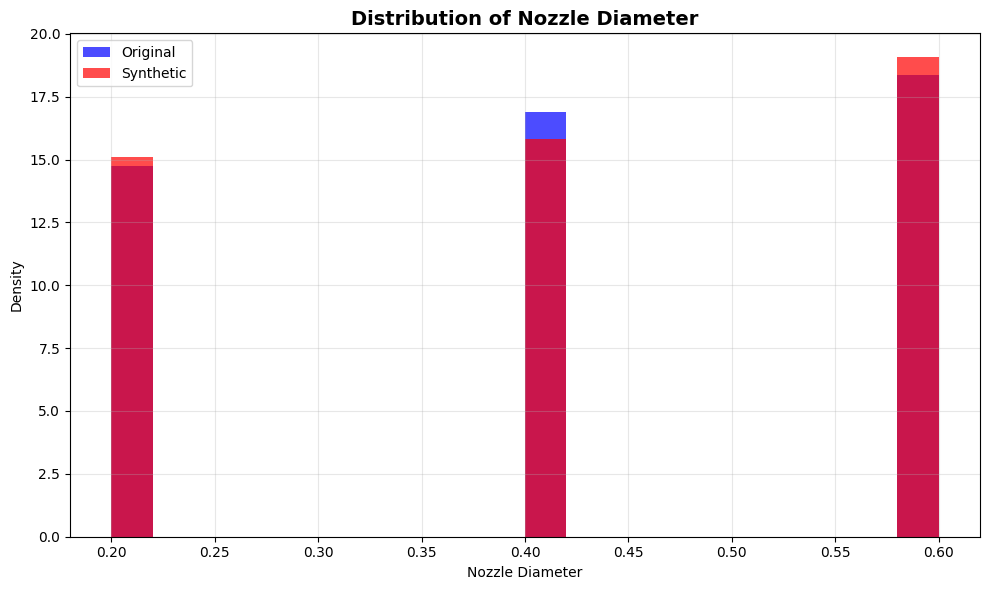

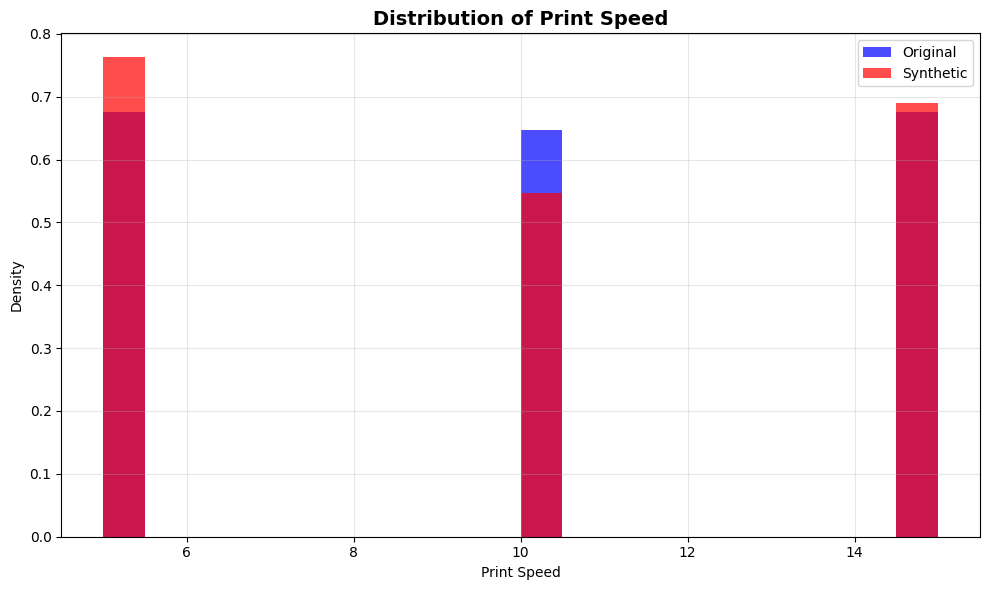

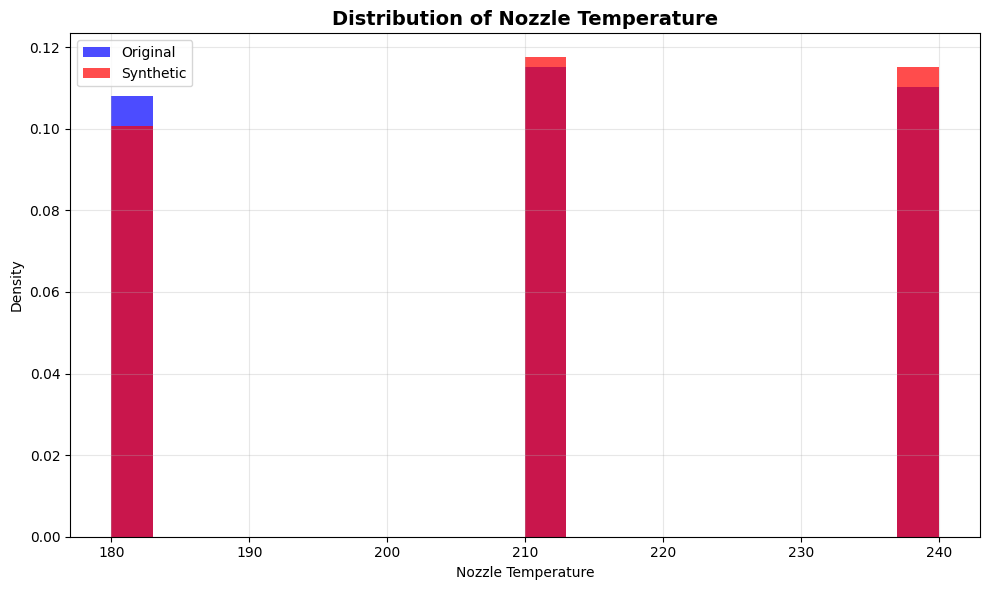

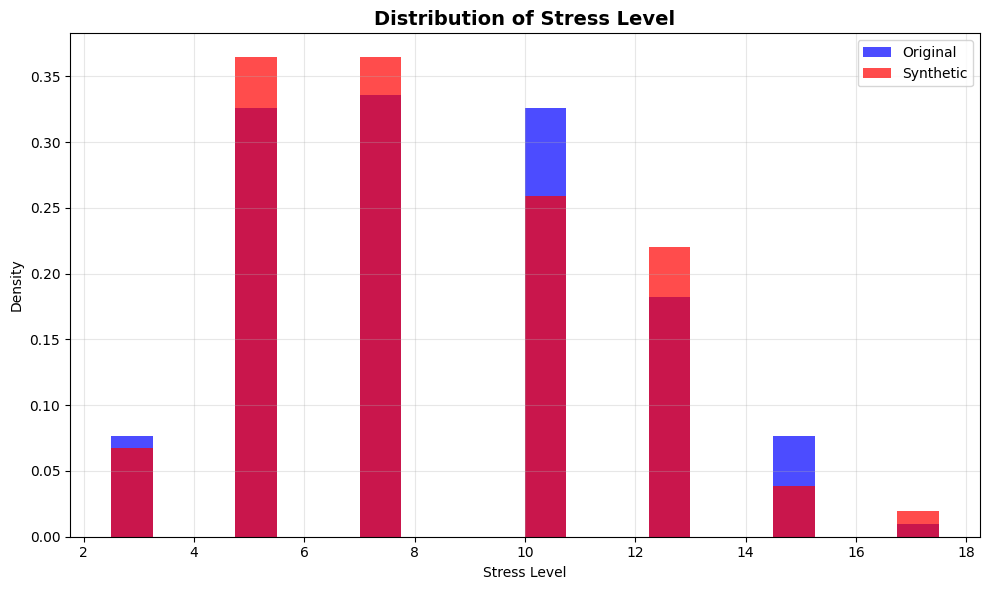

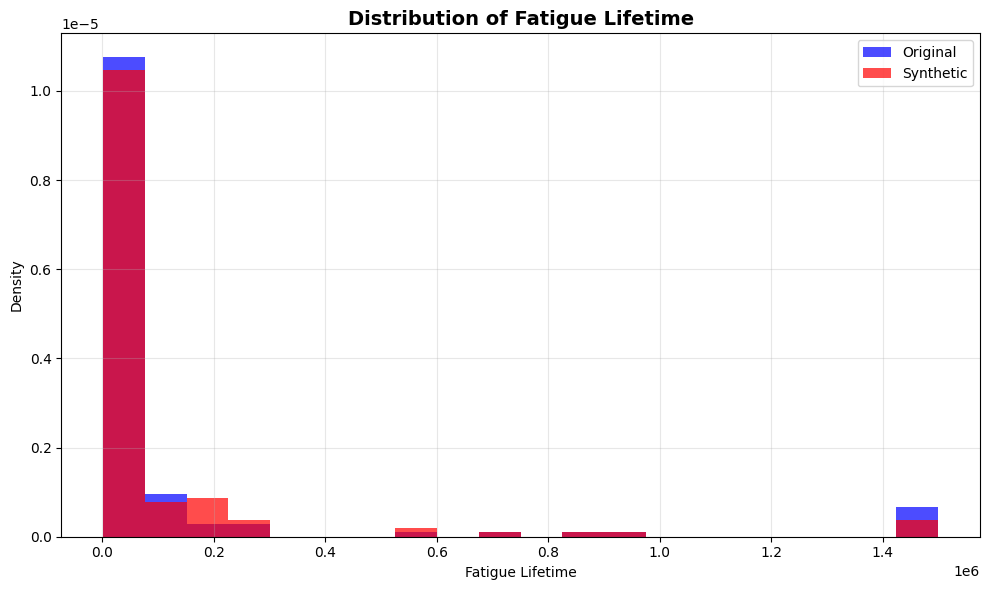


=== STATISTICAL TESTS FOR DISTRIBUTION SIMILARITY ===

Nozzle Diameter:
  KS Test - Statistic: 0.0144, p-value: 1.0000
  T-test - Statistic: -0.0732, p-value: 0.9417
  Mann-Whitney U - Statistic: 9606.5000, p-value: 0.9324
  Original Mean: 0.41 ± 0.16
  Synthetic Mean: 0.42 ± 0.17

Print Speed:
  KS Test - Statistic: 0.0432, p-value: 0.9995
  T-test - Statistic: 0.3569, p-value: 0.7214
  Mann-Whitney U - Statistic: 9890.5000, p-value: 0.7162
  Original Mean: 10.00 ± 4.13
  Synthetic Mean: 9.82 ± 4.27

Nozzle Temperature:
  KS Test - Statistic: 0.0216, p-value: 1.0000
  T-test - Statistic: -0.3706, p-value: 0.7112
  Mann-Whitney U - Statistic: 9427.0000, p-value: 0.7122
  Original Mean: 210.22 ± 24.36
  Synthetic Mean: 211.29 ± 24.19

Stress Level:
  KS Test - Statistic: 0.0432, p-value: 0.9995
  T-test - Statistic: 0.4064, p-value: 0.6848
  Mann-Whitney U - Statistic: 9959.5000, p-value: 0.6478
  Original Mean: 8.40 ± 3.34
  Synthetic Mean: 8.24 ± 3.30

Fatigue Lifetime:
  KS Test - S

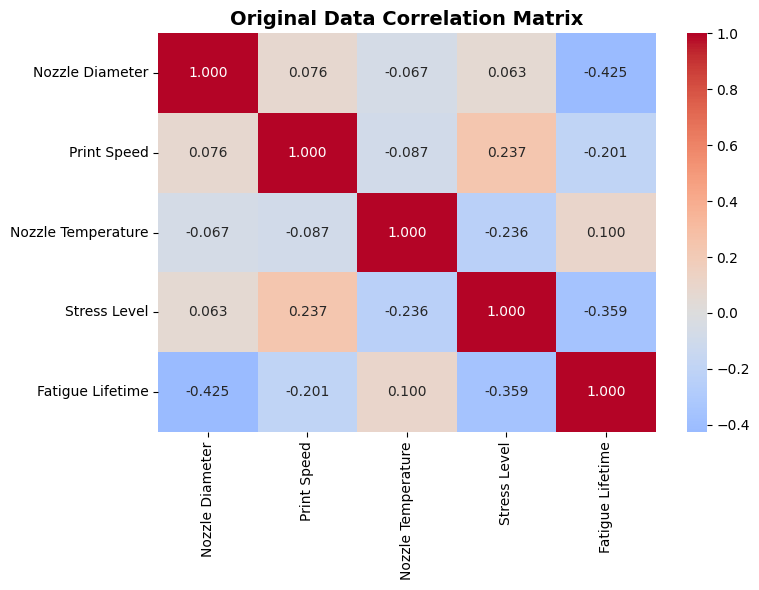

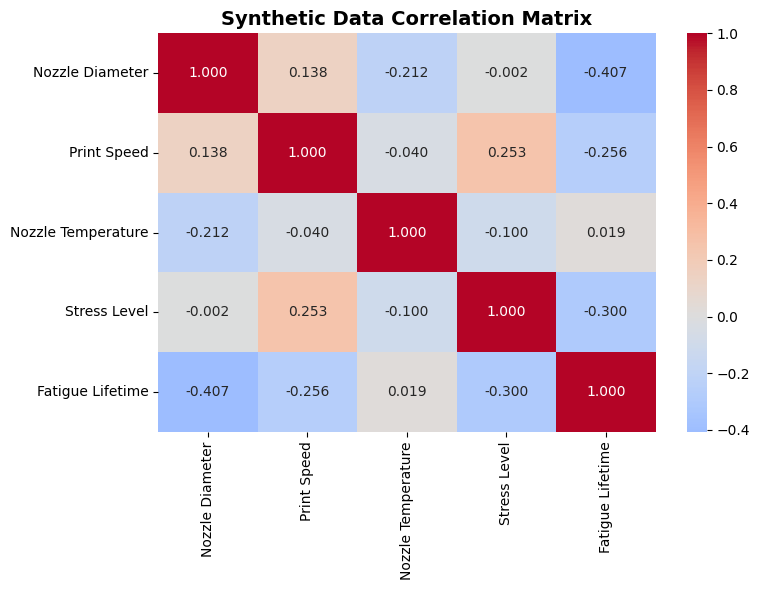

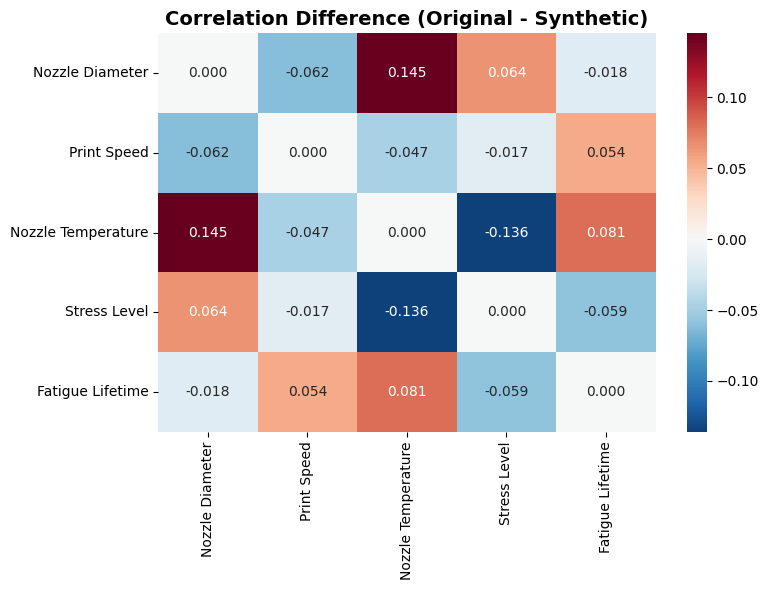

Correlation Matrix Difference (Original - Synthetic):
                    Nozzle Diameter  Print Speed  Nozzle Temperature  \
Nozzle Diameter              0.0000      -0.0619              0.1453   
Print Speed                 -0.0619       0.0000             -0.0467   
Nozzle Temperature           0.1453      -0.0467              0.0000   
Stress Level                 0.0644      -0.0166             -0.1359   
Fatigue Lifetime            -0.0180       0.0543              0.0807   

                    Stress Level  Fatigue Lifetime  
Nozzle Diameter           0.0644           -0.0180  
Print Speed              -0.0166            0.0543  
Nozzle Temperature       -0.1359            0.0807  
Stress Level              0.0000           -0.0587  
Fatigue Lifetime         -0.0587            0.0000  

=== FATIGUE LIFETIME ANALYSIS - INDIVIDUAL PLOTS ===


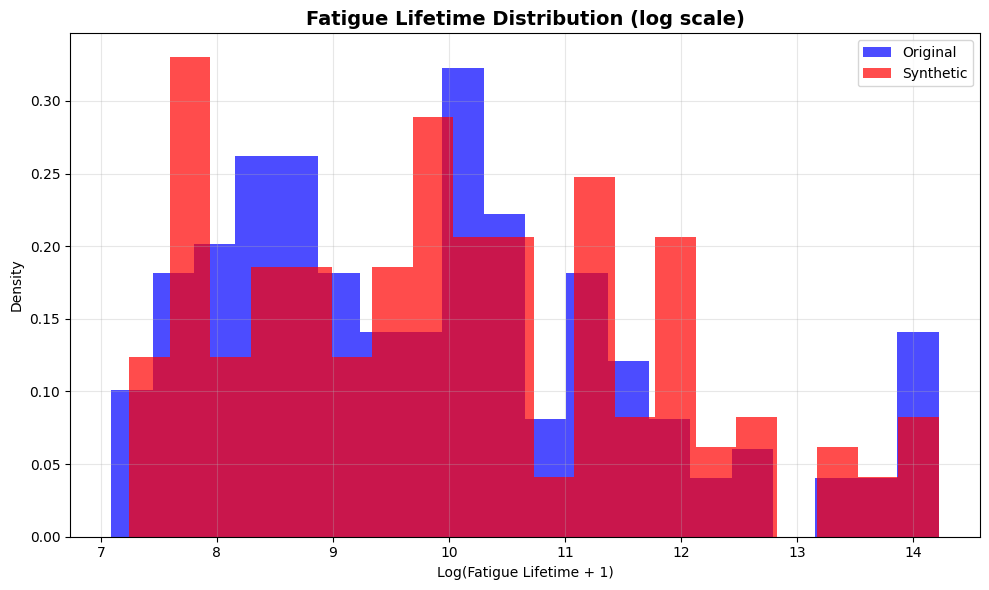

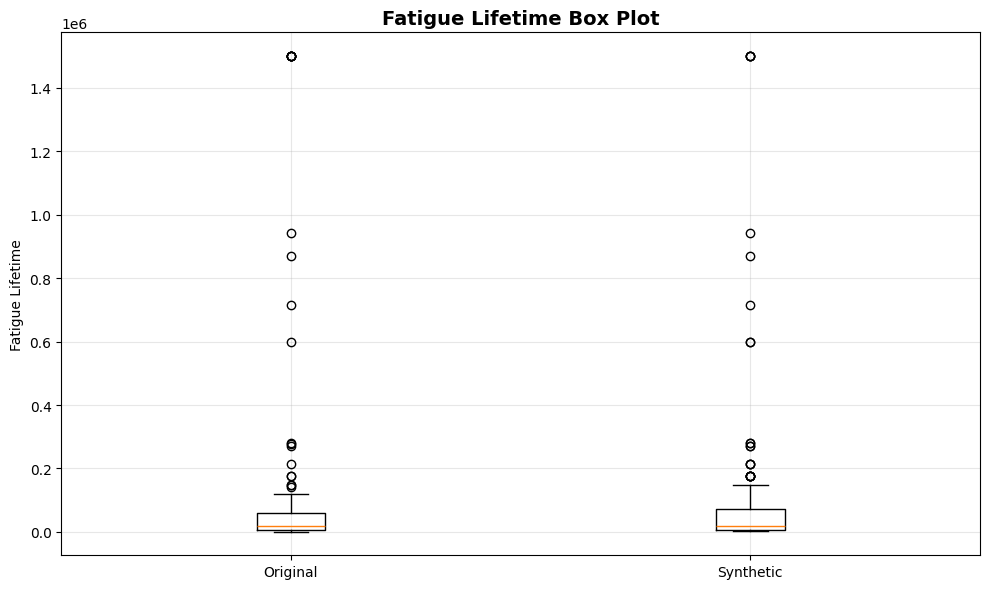

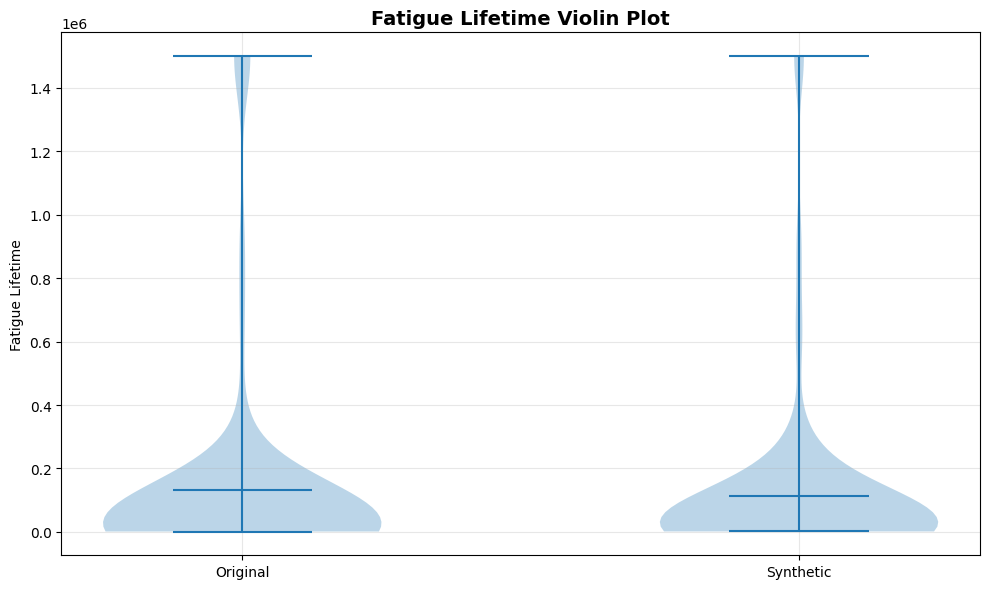

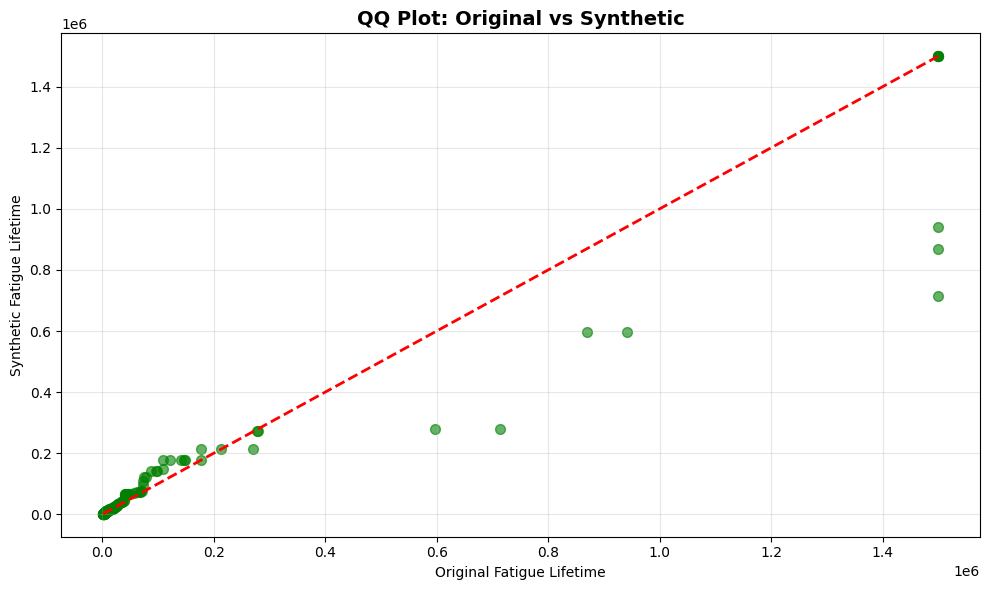

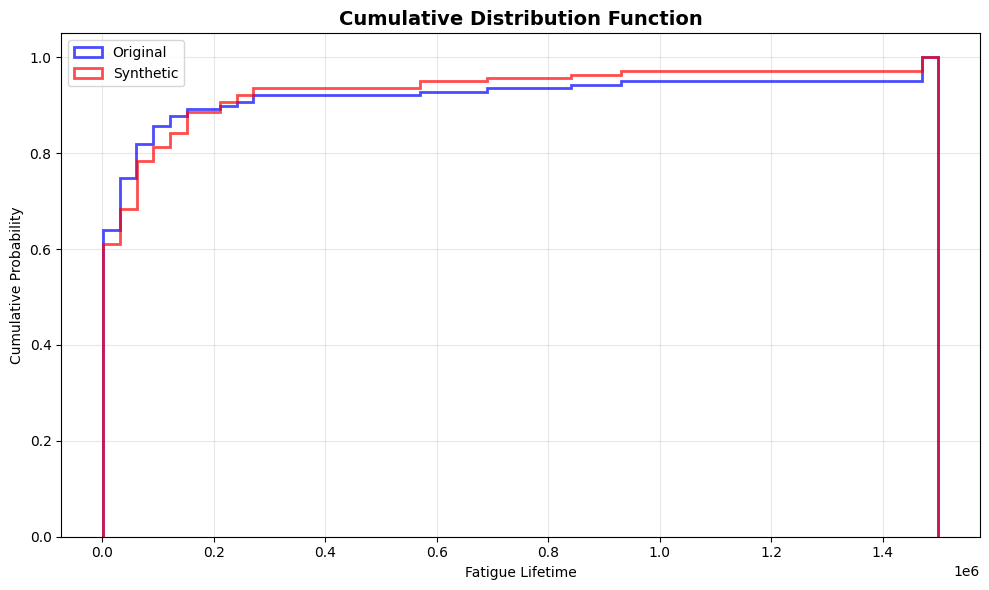

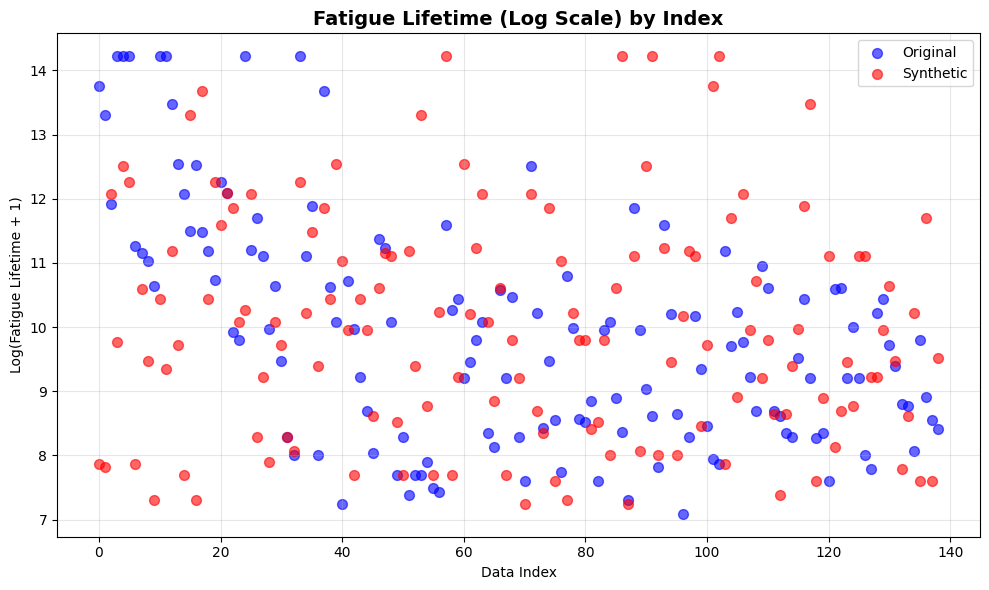


=== MULTIVARIATE ANALYSIS - INDIVIDUAL PLOTS ===


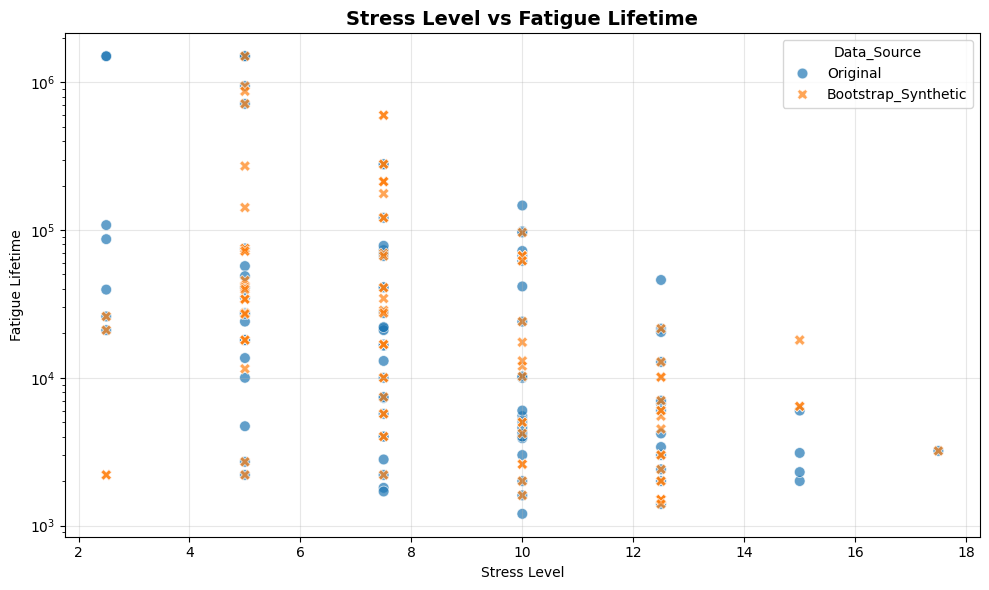

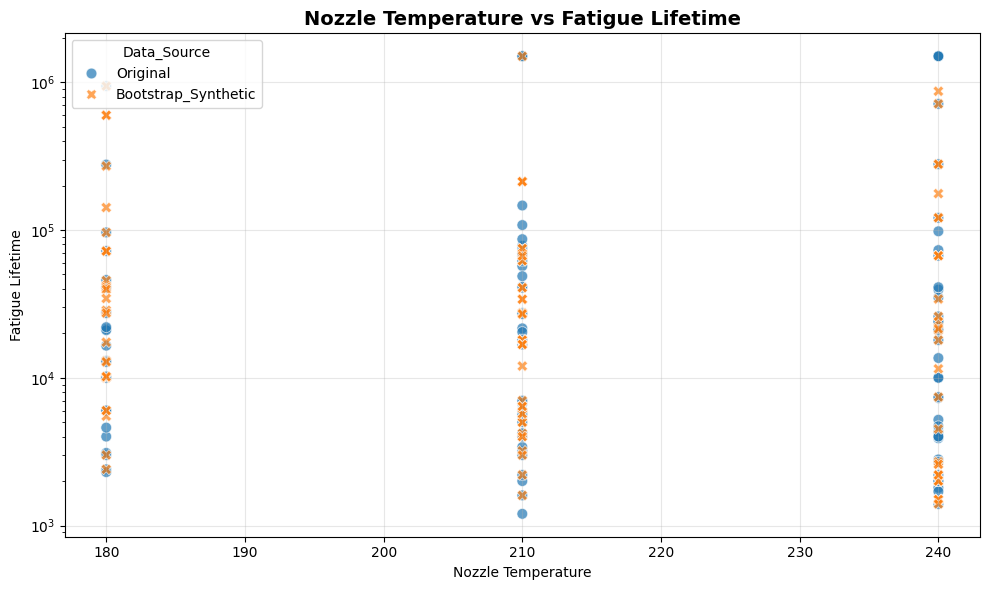

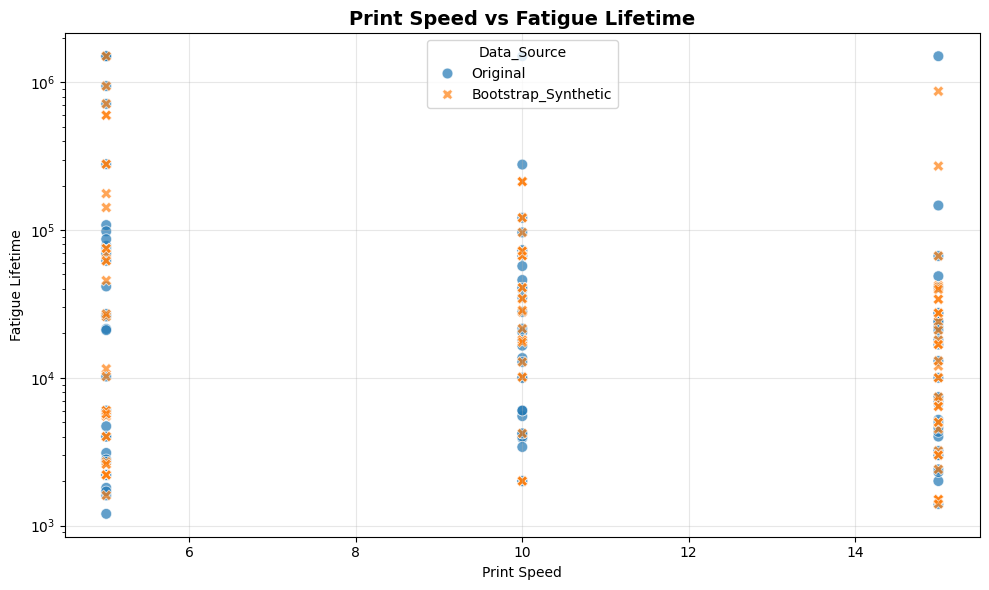

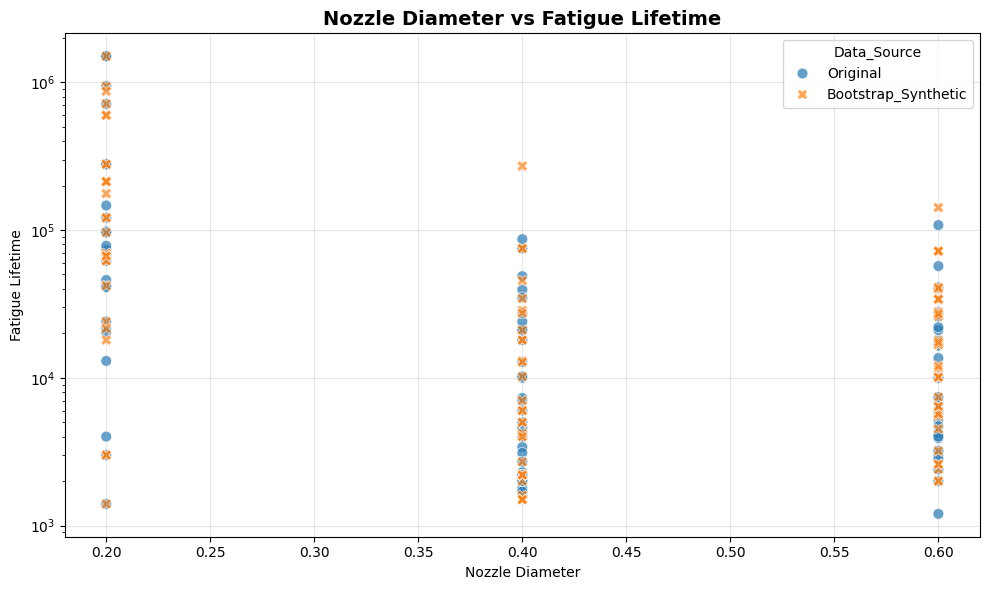

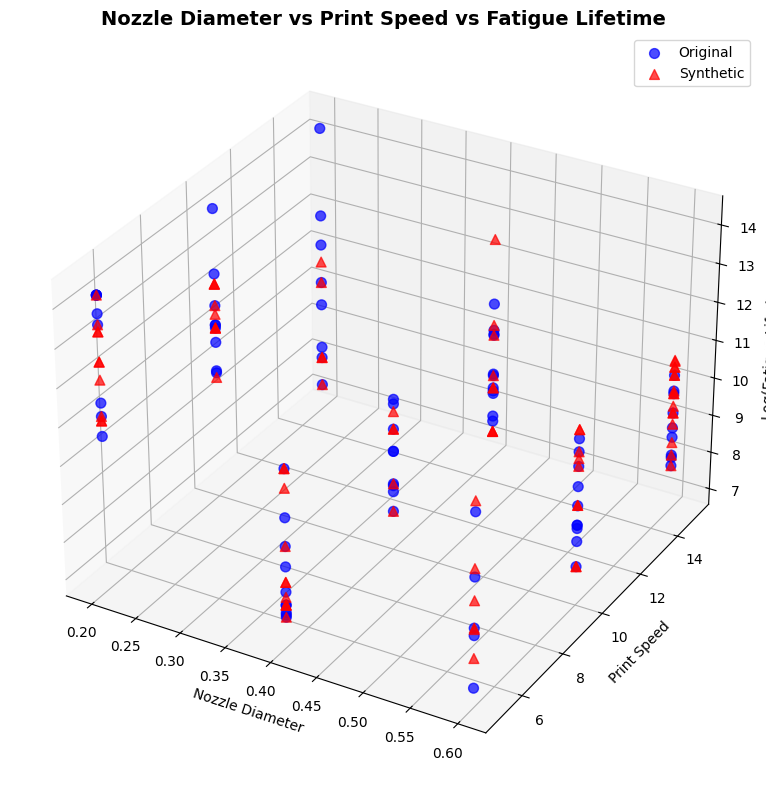

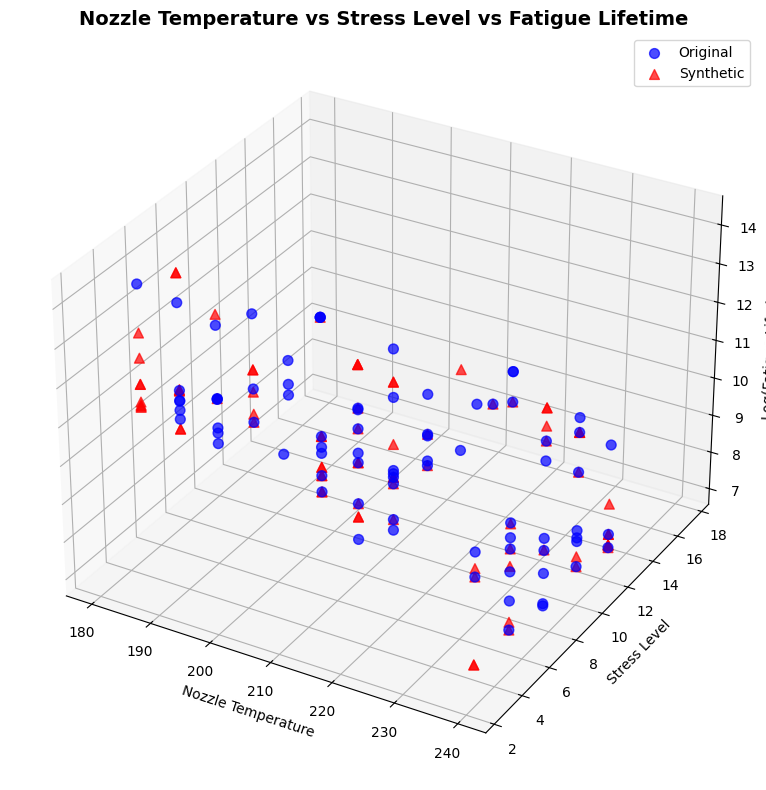


=== SYNTHETIC DATA QUALITY METRICS ===
Synthetic Data Quality Metrics:
                    Mean_Preservation_Rate  Std_Preservation_Rate  \
Nozzle Diameter                     0.9965                 0.9845   
Print Speed                         0.9820                 0.9644   
Nozzle Temperature                  0.9949                 0.9931   
Stress Level                        0.9807                 0.9896   
Fatigue Lifetime                    0.8654                 0.8159   

                    Median_Preservation_Rate  KS_Statistic  Effect_Size  \
Nozzle Diameter                          1.0        0.0144       0.0088   
Print Speed                              1.0        0.0432      -0.0436   
Nozzle Temperature                       1.0        0.0216       0.0443   
Stress Level                             1.0        0.0432      -0.0485   
Fatigue Lifetime                         1.0        0.0719      -0.0511   

                    Coverage_Rate  
Nozzle Diameter           

In [ ]:
# Step 1: Install required packages (if needed)
!pip install seaborn scipy

# Step 2: Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import ks_2samp, ttest_ind
import warnings
warnings.filterwarnings('ignore')

# Read the CSV file
df = pd.read_csv('combined_bootstrap_fatigue.csv')

# Display basic info
print("=== DATASET OVERVIEW ===")
print("Dataset Shape:", df.shape)
print("\nFirst few rows:")
print(df.head())
print("\nData Source distribution:")
print(df['Data_Source'].value_counts())
print("\n" + "="*50)

# Step 4: Basic Data Exploration
print("\n=== BASIC DATA EXPLORATION ===")
print("Basic Statistics:")
print(df.describe())

print("\nMissing Values:")
print(df.isnull().sum())

print("\nData Types:")
print(df.dtypes)

# Step 5: Separate the data
original_data = df[df['Data_Source'] == 'Original']
synthetic_data = df[df['Data_Source'] == 'Bootstrap_Synthetic']

print(f"\nOriginal data points: {len(original_data)}")
print(f"Synthetic data points: {len(synthetic_data)}")

# Step 6: Distribution Comparison - Individual Plots
print("\n=== DISTRIBUTION COMPARISON - INDIVIDUAL PLOTS ===")
numerical_cols = ['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level', 'Fatigue Lifetime']

# Create individual distribution plots
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    plt.hist(original_data[col], alpha=0.7, label='Original', bins=20, color='blue', density=True)
    plt.hist(synthetic_data[col], alpha=0.7, label='Synthetic', bins=20, color='red', density=True)
    plt.title(f'Distribution of {col}', fontsize=14, fontweight='bold')
    plt.legend()
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Step 7: Statistical Tests for Comparison
print("\n=== STATISTICAL TESTS FOR DISTRIBUTION SIMILARITY ===")
print("=" * 60)

statistical_results = []
for col in numerical_cols:
    # Kolmogorov-Smirnov test
    ks_stat, ks_pvalue = ks_2samp(original_data[col], synthetic_data[col])

    # T-test for means
    t_stat, t_pvalue = ttest_ind(original_data[col], synthetic_data[col])

    # Mann-Whitney U test (non-parametric)
    u_stat, u_pvalue = stats.mannwhitneyu(original_data[col], synthetic_data[col])

    print(f"\n{col}:")
    print(f"  KS Test - Statistic: {ks_stat:.4f}, p-value: {ks_pvalue:.4f}")
    print(f"  T-test - Statistic: {t_stat:.4f}, p-value: {t_pvalue:.4f}")
    print(f"  Mann-Whitney U - Statistic: {u_stat:.4f}, p-value: {u_pvalue:.4f}")
    print(f"  Original Mean: {original_data[col].mean():.2f} ± {original_data[col].std():.2f}")
    print(f"  Synthetic Mean: {synthetic_data[col].mean():.2f} ± {synthetic_data[col].std():.2f}")

    statistical_results.append({
        'Variable': col,
        'KS_Statistic': ks_stat,
        'KS_pvalue': ks_pvalue,
        'T_Statistic': t_stat,
        'T_pvalue': t_pvalue,
        'U_Statistic': u_stat,
        'U_pvalue': u_pvalue
    })

# Step 8: Range Comparison
print("\n=== RANGE COMPARISON: ORIGINAL vs SYNTHETIC ===")
print("=" * 70)

range_comparison = []
for col in numerical_cols:
    orig_min = original_data[col].min()
    orig_max = original_data[col].max()
    orig_range = orig_max - orig_min
    orig_iqr = original_data[col].quantile(0.75) - original_data[col].quantile(0.25)

    synth_min = synthetic_data[col].min()
    synth_max = synthetic_data[col].max()
    synth_range = synth_max - synth_min
    synth_iqr = synthetic_data[col].quantile(0.75) - synthetic_data[col].quantile(0.25)

    range_diff = synth_range - orig_range
    range_ratio = synth_range / orig_range if orig_range != 0 else np.nan
    iqr_ratio = synth_iqr / orig_iqr if orig_iqr != 0 else np.nan

    range_comparison.append({
        'Variable': col,
        'Original_Min': orig_min,
        'Original_Max': orig_max,
        'Original_Range': orig_range,
        'Synthetic_Min': synth_min,
        'Synthetic_Max': synth_max,
        'Synthetic_Range': synth_range,
        'Range_Difference': range_diff,
        'Range_Ratio': range_ratio,
        'IQR_Ratio': iqr_ratio
    })

range_df = pd.DataFrame(range_comparison)
print(range_df.round(4))

# Step 9: Correlation Analysis - Individual Plots
print("\n=== CORRELATION ANALYSIS - INDIVIDUAL PLOTS ===")

# Original data correlation
plt.figure(figsize=(8, 6))
orig_corr = original_data[numerical_cols].corr()
sns.heatmap(orig_corr, annot=True, cmap='coolwarm', center=0, fmt='.3f')
plt.title('Original Data Correlation Matrix', fontweight='bold', fontsize=14)
plt.tight_layout()
plt.show()

# Synthetic data correlation
plt.figure(figsize=(8, 6))
synth_corr = synthetic_data[numerical_cols].corr()
sns.heatmap(synth_corr, annot=True, cmap='coolwarm', center=0, fmt='.3f')
plt.title('Synthetic Data Correlation Matrix', fontweight='bold', fontsize=14)
plt.tight_layout()
plt.show()

# Correlation difference
plt.figure(figsize=(8, 6))
corr_diff = orig_corr - synth_corr
sns.heatmap(corr_diff, annot=True, cmap='RdBu_r', center=0, fmt='.3f')
plt.title('Correlation Difference (Original - Synthetic)', fontweight='bold', fontsize=14)
plt.tight_layout()
plt.show()

print("Correlation Matrix Difference (Original - Synthetic):")
print(corr_diff.round(4))

# Step 10: Fatigue Lifetime Analysis - Individual Plots
print("\n=== FATIGUE LIFETIME ANALYSIS - INDIVIDUAL PLOTS ===")

# Distribution comparison (log scale)
plt.figure(figsize=(10, 6))
plt.hist(np.log1p(original_data['Fatigue Lifetime']), alpha=0.7, label='Original', bins=20, color='blue', density=True)
plt.hist(np.log1p(synthetic_data['Fatigue Lifetime']), alpha=0.7, label='Synthetic', bins=20, color='red', density=True)
plt.title('Fatigue Lifetime Distribution (log scale)', fontweight='bold', fontsize=14)
plt.legend()
plt.xlabel('Log(Fatigue Lifetime + 1)')
plt.ylabel('Density')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Box plot
plt.figure(figsize=(10, 6))
box_data = [original_data['Fatigue Lifetime'], synthetic_data['Fatigue Lifetime']]
plt.boxplot(box_data, labels=['Original', 'Synthetic'])
plt.title('Fatigue Lifetime Box Plot', fontweight='bold', fontsize=14)
plt.ylabel('Fatigue Lifetime')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Violin plot
plt.figure(figsize=(10, 6))
violin_data = [original_data['Fatigue Lifetime'], synthetic_data['Fatigue Lifetime']]
plt.violinplot(violin_data, showmeans=True)
plt.xticks([1, 2], ['Original', 'Synthetic'])
plt.title('Fatigue Lifetime Violin Plot', fontweight='bold', fontsize=14)
plt.ylabel('Fatigue Lifetime')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# QQ plot
plt.figure(figsize=(10, 6))
sorted_orig = np.sort(original_data['Fatigue Lifetime'])
sorted_synth = np.sort(synthetic_data['Fatigue Lifetime'])

# Use common length for QQ plot
min_len = min(len(sorted_orig), len(sorted_synth))
plt.scatter(sorted_orig[:min_len], sorted_synth[:min_len], alpha=0.6, color='green', s=50)
plt.plot([sorted_orig.min(), sorted_orig.max()], [sorted_orig.min(), sorted_orig.max()], 'r--', linewidth=2)
plt.xlabel('Original Fatigue Lifetime')
plt.ylabel('Synthetic Fatigue Lifetime')
plt.title('QQ Plot: Original vs Synthetic', fontweight='bold', fontsize=14)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Cumulative distribution
plt.figure(figsize=(10, 6))
plt.hist(original_data['Fatigue Lifetime'], cumulative=True, density=True,
           alpha=0.7, label='Original', bins=50, histtype='step', linewidth=2, color='blue')
plt.hist(synthetic_data['Fatigue Lifetime'], cumulative=True, density=True,
           alpha=0.7, label='Synthetic', bins=50, histtype='step', linewidth=2, color='red')
plt.title('Cumulative Distribution Function', fontweight='bold', fontsize=14)
plt.xlabel('Fatigue Lifetime')
plt.ylabel('Cumulative Probability')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Log-scale scatter
plt.figure(figsize=(10, 6))
plt.scatter(range(len(original_data)), np.log1p(original_data['Fatigue Lifetime']),
             alpha=0.6, label='Original', color='blue', s=50)
plt.scatter(range(len(synthetic_data)), np.log1p(synthetic_data['Fatigue Lifetime']),
             alpha=0.6, label='Synthetic', color='red', s=50)
plt.title('Fatigue Lifetime (Log Scale) by Index', fontweight='bold', fontsize=14)
plt.xlabel('Data Index')
plt.ylabel('Log(Fatigue Lifetime + 1)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Step 11: Multivariate Analysis - Individual Plots
print("\n=== MULTIVARIATE ANALYSIS - INDIVIDUAL PLOTS ===")

# Sample data for multivariate plots
sample_orig = original_data.sample(min(100, len(original_data)), random_state=42)
sample_synth = synthetic_data.sample(min(100, len(synthetic_data)), random_state=42)
comparison_sample = pd.concat([sample_orig, sample_synth])

# Stress Level vs Fatigue Lifetime
plt.figure(figsize=(10, 6))
sns.scatterplot(data=comparison_sample, x='Stress Level', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Stress Level vs Fatigue Lifetime', fontweight='bold', fontsize=14)
plt.yscale('log')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Nozzle Temperature vs Fatigue Lifetime
plt.figure(figsize=(10, 6))
sns.scatterplot(data=comparison_sample, x='Nozzle Temperature', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Nozzle Temperature vs Fatigue Lifetime', fontweight='bold', fontsize=14)
plt.yscale('log')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Print Speed vs Fatigue Lifetime
plt.figure(figsize=(10, 6))
sns.scatterplot(data=comparison_sample, x='Print Speed', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Print Speed vs Fatigue Lifetime', fontweight='bold', fontsize=14)
plt.yscale('log')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Nozzle Diameter vs Fatigue Lifetime
plt.figure(figsize=(10, 6))
sns.scatterplot(data=comparison_sample, x='Nozzle Diameter', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Nozzle Diameter vs Fatigue Lifetime', fontweight='bold', fontsize=14)
plt.yscale('log')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 3D scatter plots
from mpl_toolkits.mplot3d import Axes3D

# First 3D plot
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(111, projection='3d')
sample_size = min(80, len(original_data), len(synthetic_data))
orig_sample = original_data.sample(sample_size, random_state=42)
synth_sample = synthetic_data.sample(sample_size, random_state=42)

sc1 = ax1.scatter(orig_sample['Nozzle Diameter'], orig_sample['Print Speed'],
           np.log1p(orig_sample['Fatigue Lifetime']),
           c='blue', label='Original', alpha=0.7, s=50)
sc2 = ax1.scatter(synth_sample['Nozzle Diameter'], synth_sample['Print Speed'],
           np.log1p(synth_sample['Fatigue Lifetime']),
           c='red', label='Synthetic', alpha=0.7, s=50, marker='^')

ax1.set_xlabel('Nozzle Diameter')
ax1.set_ylabel('Print Speed')
ax1.set_zlabel('Log(Fatigue Lifetime)')
ax1.set_title('Nozzle Diameter vs Print Speed vs Fatigue Lifetime', fontweight='bold', fontsize=14)
ax1.legend()
plt.tight_layout()
plt.show()

# Second 3D plot
fig = plt.figure(figsize=(12, 8))
ax2 = fig.add_subplot(111, projection='3d')
sc3 = ax2.scatter(orig_sample['Nozzle Temperature'], orig_sample['Stress Level'],
           np.log1p(orig_sample['Fatigue Lifetime']),
           c='blue', label='Original', alpha=0.7, s=50)
sc4 = ax2.scatter(synth_sample['Nozzle Temperature'], synth_sample['Stress Level'],
           np.log1p(synth_sample['Fatigue Lifetime']),
           c='red', label='Synthetic', alpha=0.7, s=50, marker='^')

ax2.set_xlabel('Nozzle Temperature')
ax2.set_ylabel('Stress Level')
ax2.set_zlabel('Log(Fatigue Lifetime)')
ax2.set_title('Nozzle Temperature vs Stress Level vs Fatigue Lifetime', fontweight='bold', fontsize=14)
ax2.legend()
plt.tight_layout()
plt.show()

# Step 12: Quality Metrics for Synthetic Data
print("\n=== SYNTHETIC DATA QUALITY METRICS ===")

def calculate_synthetic_quality_metrics(original, synthetic, numerical_cols):
    """Calculate various quality metrics for synthetic data"""

    metrics = {}

    for col in numerical_cols:
        # Basic statistics preservation
        orig_mean = original[col].mean()
        synth_mean = synthetic[col].mean()
        mean_preservation = abs(synth_mean - orig_mean) / orig_mean if orig_mean != 0 else abs(synth_mean - orig_mean)

        orig_std = original[col].std()
        synth_std = synthetic[col].std()
        std_preservation = abs(synth_std - orig_std) / orig_std if orig_std != 0 else abs(synth_std - orig_std)

        orig_median = original[col].median()
        synth_median = synthetic[col].median()
        median_preservation = abs(synth_median - orig_median) / orig_median if orig_median != 0 else abs(synth_median - orig_median)

        metrics[col] = {
            'Mean_Preservation_Rate': 1 - mean_preservation,
            'Std_Preservation_Rate': 1 - std_preservation,
            'Median_Preservation_Rate': 1 - median_preservation,
            'KS_Statistic': stats.ks_2samp(original[col], synthetic[col])[0],
            'Effect_Size': (synth_mean - orig_mean) / orig_std if orig_std != 0 else 0,
            'Coverage_Rate': len(set(synthetic[col]) & set(original[col])) / len(set(original[col])) if len(set(original[col])) > 0 else 0
        }

    return pd.DataFrame(metrics).T

# Calculate quality metrics
quality_metrics = calculate_synthetic_quality_metrics(original_data, synthetic_data, numerical_cols)
print("Synthetic Data Quality Metrics:")
print(quality_metrics.round(4))

# Step 13: Summary Report
print("\n" + "="*80)
print("COMPREHENSIVE COMPARISON REPORT: ORIGINAL vs SYNTHETIC DATA")
print("="*80)

print(f"\n1. DATA VOLUME:")
print(f"   • Original samples: {len(original_data):,}")
print(f"   • Synthetic samples: {len(synthetic_data):,}")
print(f"   • Total samples: {len(df):,}")
print(f"   • Synthetic/Original ratio: {len(synthetic_data)/len(original_data):.2f}")

print(f"\n2. KEY STATISTICAL DIFFERENCES:")
fatigue_stats = range_df[range_df['Variable'] == 'Fatigue Lifetime'].iloc[0]
print(f"   • Fatigue Lifetime Range - Original: {fatigue_stats['Original_Range']:,.0f}")
print(f"   • Fatigue Lifetime Range - Synthetic: {fatigue_stats['Synthetic_Range']:,.0f}")
print(f"   • Range Preservation: {fatigue_stats['Range_Ratio']:.3f}")

print(f"\n3. DATA QUALITY ASSESSMENT:")
print(f"   • Average mean preservation rate: {quality_metrics['Mean_Preservation_Rate'].mean():.3f}")
print(f"   • Average std preservation rate: {quality_metrics['Std_Preservation_Rate'].mean():.3f}")
print(f"   • Average median preservation rate: {quality_metrics['Median_Preservation_Rate'].mean():.3f}")
print(f"   • Average KS statistic: {quality_metrics['KS_Statistic'].mean():.3f}")

print(f"\n4. CORRELATION PRESERVATION:")
corr_preservation = 1 - (corr_diff.abs().mean().mean())
print(f"   • Correlation preservation rate: {corr_preservation:.3f}")

print(f"\n5. RECOMMENDATIONS:")
recommendations = []

if quality_metrics.loc['Fatigue Lifetime', 'Mean_Preservation_Rate'] > 0.95:
    recommendations.append("✓ Synthetic data preserves key statistics well")
else:
    recommendations.append("⚠ Some statistical properties differ significantly")

if quality_metrics.loc['Fatigue Lifetime', 'KS_Statistic'] < 0.1:
    recommendations.append("✓ Distributions are very similar (low KS statistic)")
else:
    recommendations.append("⚠ Distributions show some differences")

if len(synthetic_data) >= len(original_data):
    recommendations.append("✓ Sufficient synthetic data generated")
else:
    recommendations.append("⚠ Consider generating more synthetic data")

if corr_preservation > 0.95:
    recommendations.append("✓ Correlation structure well preserved")
else:
    recommendations.append("⚠ Some correlation patterns differ")

for rec in recommendations:
    print(f"   {rec}")

print(f"\n6. OVERALL SYNTHETIC DATA QUALITY SCORE:")
overall_score = (
    quality_metrics['Mean_Preservation_Rate'].mean() * 0.3 +
    quality_metrics['Std_Preservation_Rate'].mean() * 0.3 +
    corr_preservation * 0.2 +
    (1 - quality_metrics['KS_Statistic'].mean()) * 0.2
) * 100

print(f"   • Overall Quality Score: {overall_score:.1f}%")

if overall_score >= 90:
    print("   • Rating: EXCELLENT")
elif overall_score >= 80:
    print("   • Rating: GOOD")
elif overall_score >= 70:
    print("   • Rating: FAIR")
else:
    print("   • Rating: NEEDS IMPROVEMENT")

print("\n" + "="*80)

# Step 14: Save the analysis results
print("\nSaving analysis results...")

# Create a summary dataframe
summary_results = pd.DataFrame({
    'Metric': [
        'Original_Samples', 'Synthetic_Samples', 'Total_Samples',
        'Synthetic_Original_Ratio', 'Overall_Quality_Score',
        'Mean_Preservation_Rate', 'Std_Preservation_Rate',
        'Correlation_Preservation', 'Average_KS_Statistic'
    ],
    'Value': [
        len(original_data), len(synthetic_data), len(df),
        len(synthetic_data)/len(original_data), overall_score,
        quality_metrics['Mean_Preservation_Rate'].mean(),
        quality_metrics['Std_Preservation_Rate'].mean(),
        corr_preservation,
        quality_metrics['KS_Statistic'].mean()
    ]
})

print("\nSummary Results:")
print(summary_results.round(4))

print("\n=== ANALYSIS COMPLETE ===")

Times New Roman not found. Using DejaVu Serif instead.
=== DATASET OVERVIEW ===
Dataset Shape: (278, 6)

First few rows:
   Nozzle Diameter  Print Speed  Nozzle Temperature  Stress Level  \
0              0.2            5                 180           5.0   
1              0.2            5                 180           7.5   
2              0.2            5                 180          10.0   
3              0.2            5                 210           2.5   
4              0.2            5                 210           5.0   

   Fatigue Lifetime Data_Source  
0            942000    Original  
1            597800    Original  
2            148900    Original  
3           1500000    Original  
4           1500000    Original  

Data Source distribution:
Data_Source
Original               139
Bootstrap_Synthetic    139
Name: count, dtype: int64


=== BASIC DATA EXPLORATION ===
Basic Statistics:
       Nozzle Diameter  Print Speed  Nozzle Temperature  Stress Level  \
count       278.0

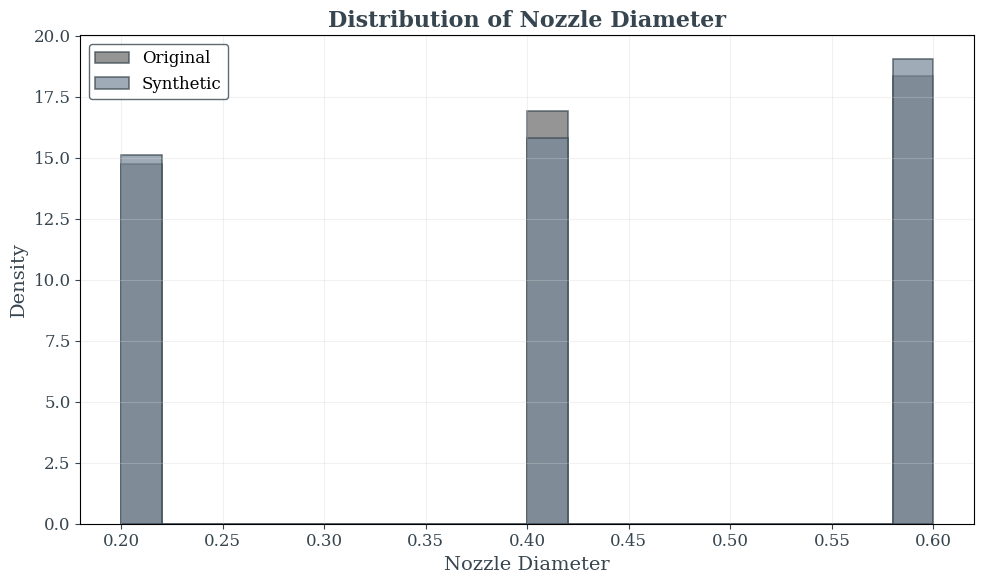

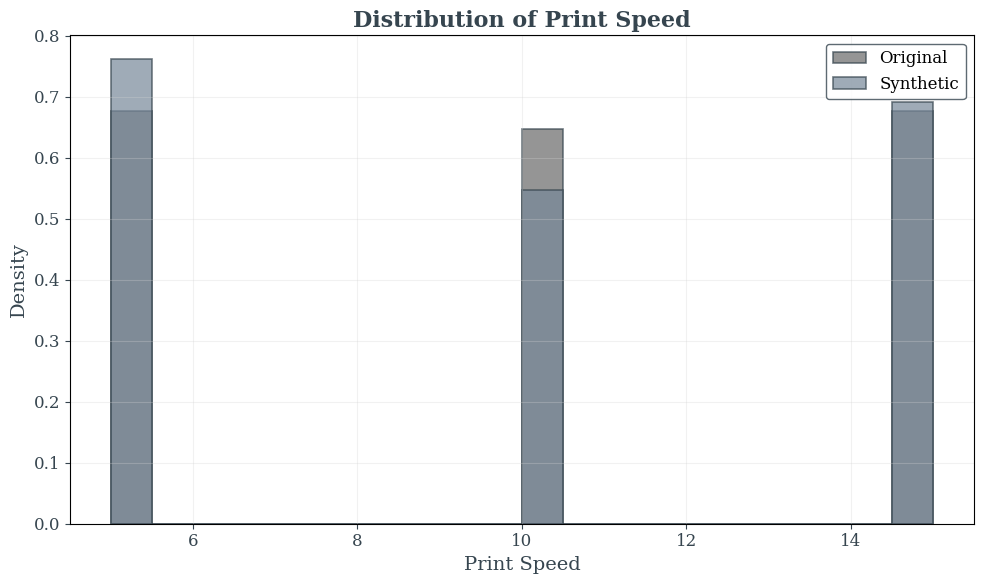

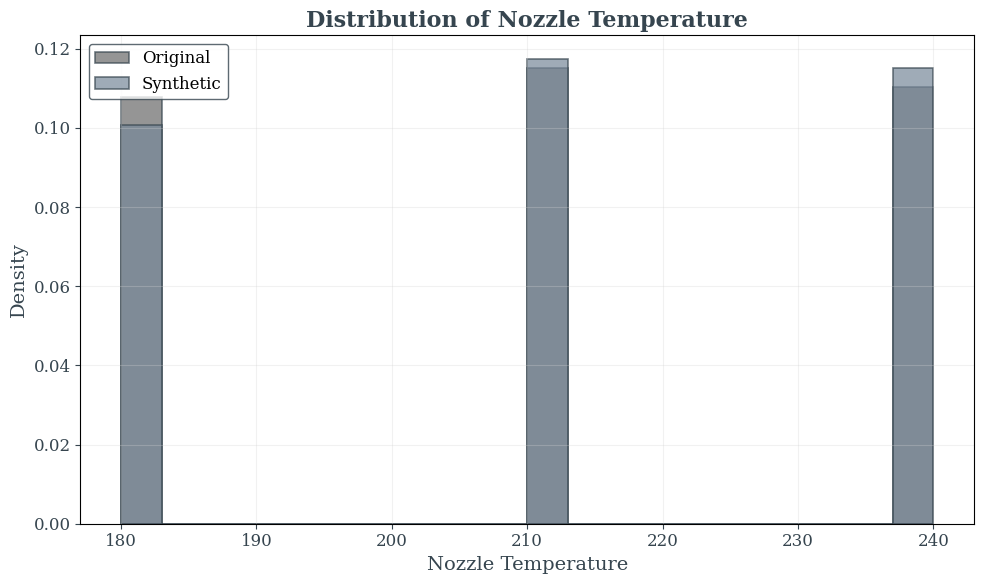

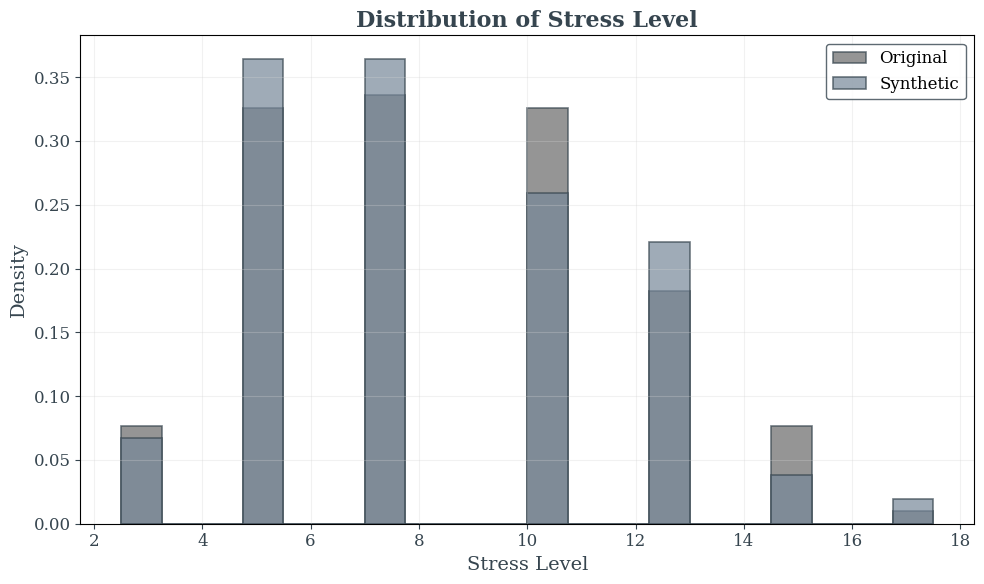

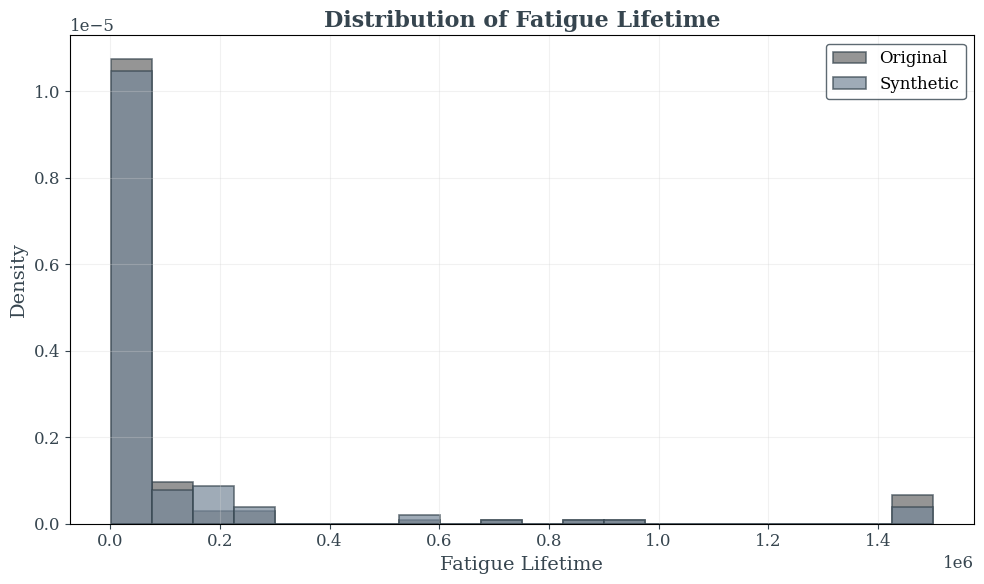


=== STATISTICAL TESTS FOR DISTRIBUTION SIMILARITY ===

Nozzle Diameter:
  KS Test - Statistic: 0.0144, p-value: 1.0000
  T-test - Statistic: -0.0732, p-value: 0.9417
  Mann-Whitney U - Statistic: 9606.5000, p-value: 0.9324
  Original Mean: 0.41 ± 0.16
  Synthetic Mean: 0.42 ± 0.17

Print Speed:
  KS Test - Statistic: 0.0432, p-value: 0.9995
  T-test - Statistic: 0.3569, p-value: 0.7214
  Mann-Whitney U - Statistic: 9890.5000, p-value: 0.7162
  Original Mean: 10.00 ± 4.13
  Synthetic Mean: 9.82 ± 4.27

Nozzle Temperature:
  KS Test - Statistic: 0.0216, p-value: 1.0000
  T-test - Statistic: -0.3706, p-value: 0.7112
  Mann-Whitney U - Statistic: 9427.0000, p-value: 0.7122
  Original Mean: 210.22 ± 24.36
  Synthetic Mean: 211.29 ± 24.19

Stress Level:
  KS Test - Statistic: 0.0432, p-value: 0.9995
  T-test - Statistic: 0.4064, p-value: 0.6848
  Mann-Whitney U - Statistic: 9959.5000, p-value: 0.6478
  Original Mean: 8.40 ± 3.34
  Synthetic Mean: 8.24 ± 3.30

Fatigue Lifetime:
  KS Test - S

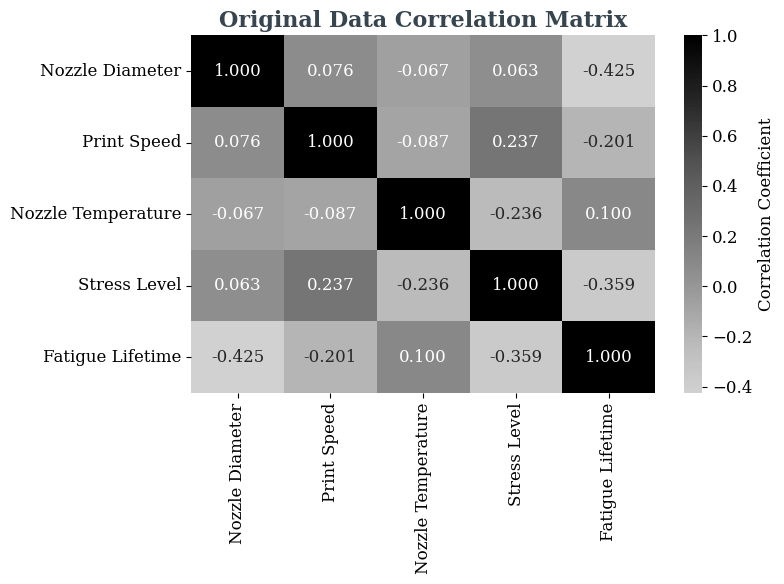

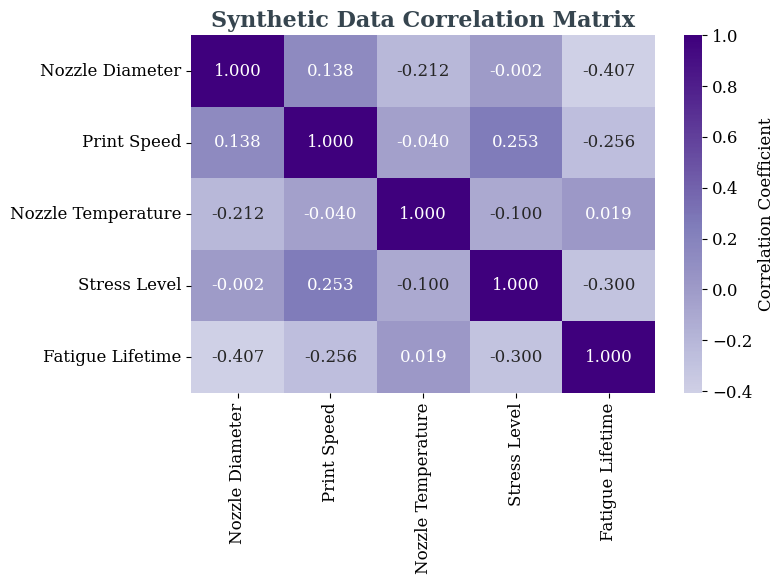

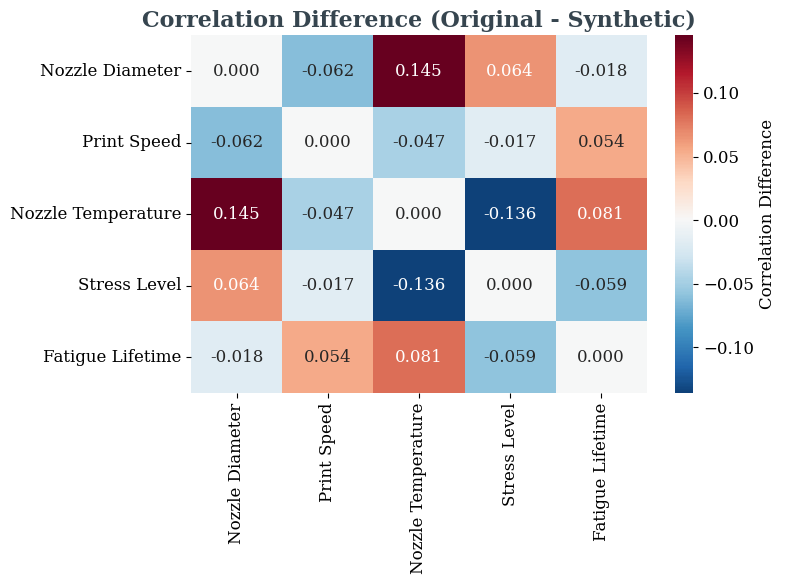

Correlation Matrix Difference (Original - Synthetic):
                    Nozzle Diameter  Print Speed  Nozzle Temperature  \
Nozzle Diameter              0.0000      -0.0619              0.1453   
Print Speed                 -0.0619       0.0000             -0.0467   
Nozzle Temperature           0.1453      -0.0467              0.0000   
Stress Level                 0.0644      -0.0166             -0.1359   
Fatigue Lifetime            -0.0180       0.0543              0.0807   

                    Stress Level  Fatigue Lifetime  
Nozzle Diameter           0.0644           -0.0180  
Print Speed              -0.0166            0.0543  
Nozzle Temperature       -0.1359            0.0807  
Stress Level              0.0000           -0.0587  
Fatigue Lifetime         -0.0587            0.0000  

=== FATIGUE LIFETIME ANALYSIS - INDIVIDUAL PLOTS ===


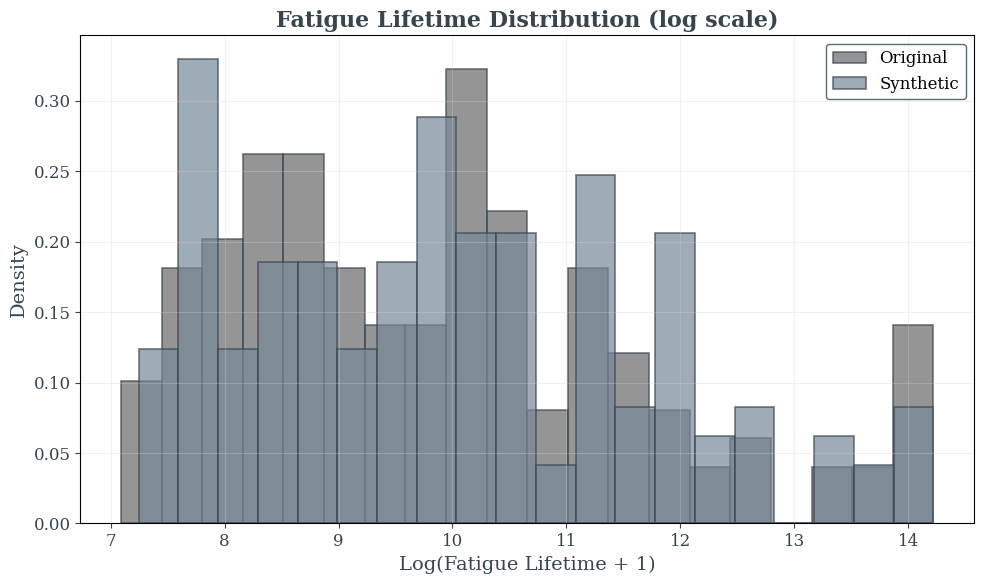

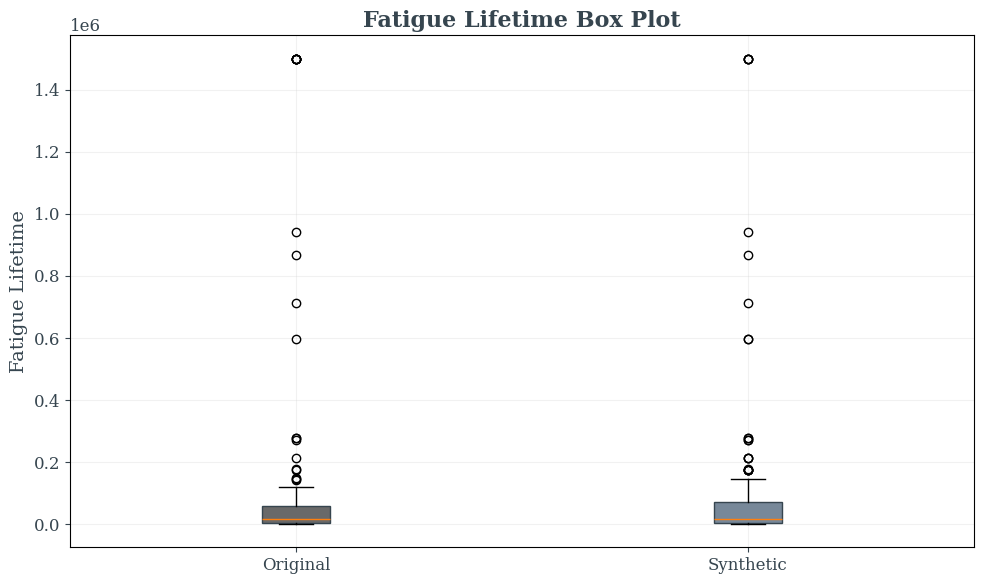

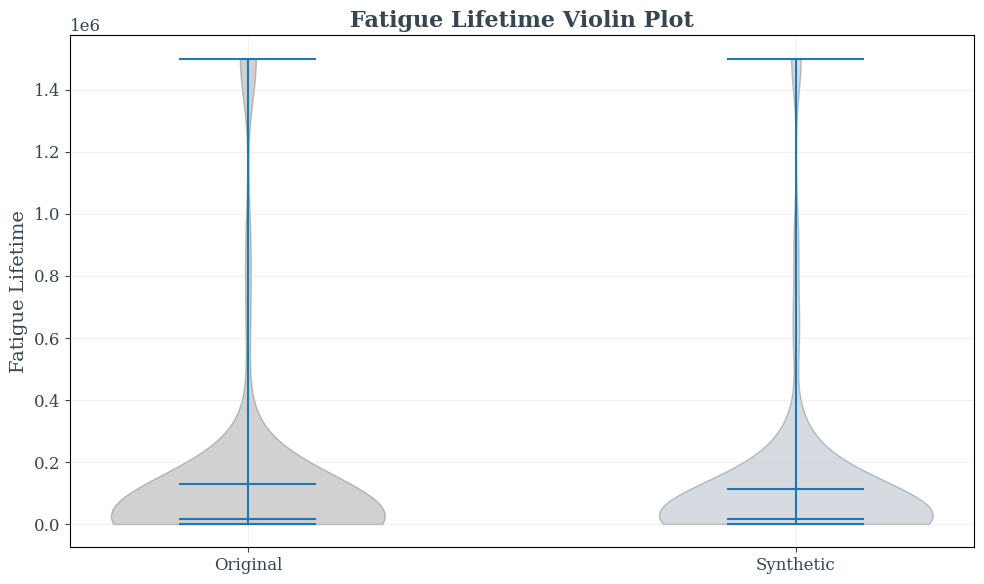

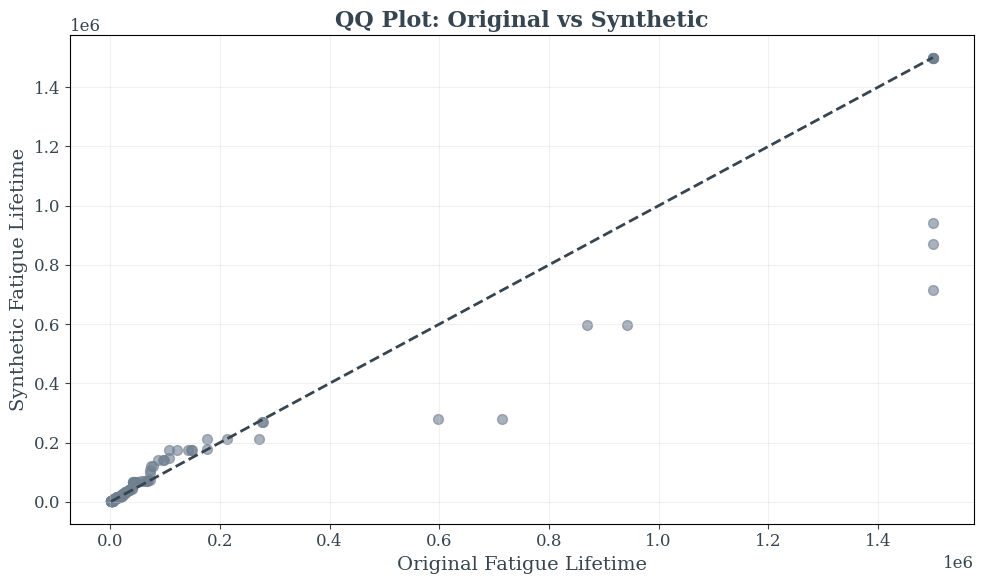

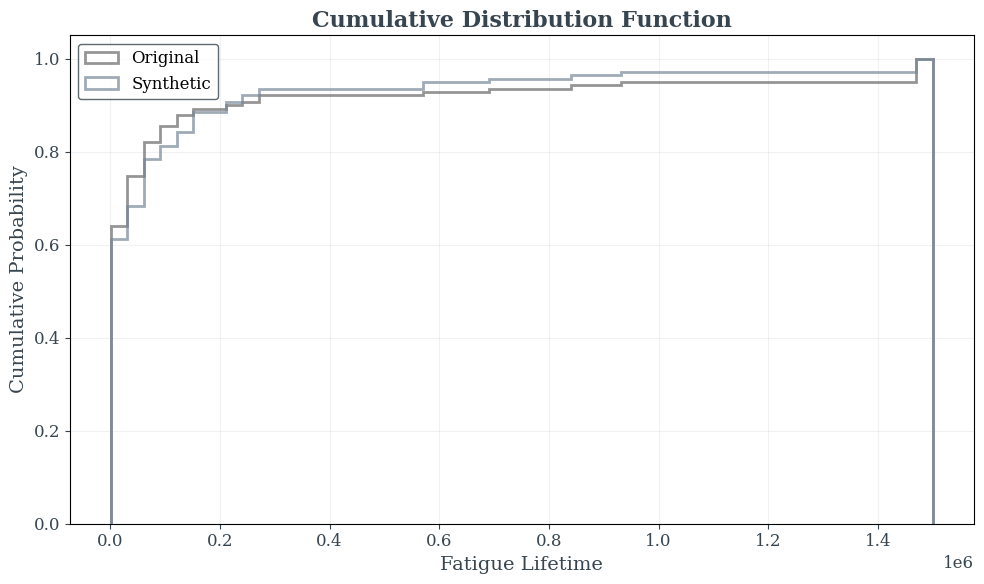

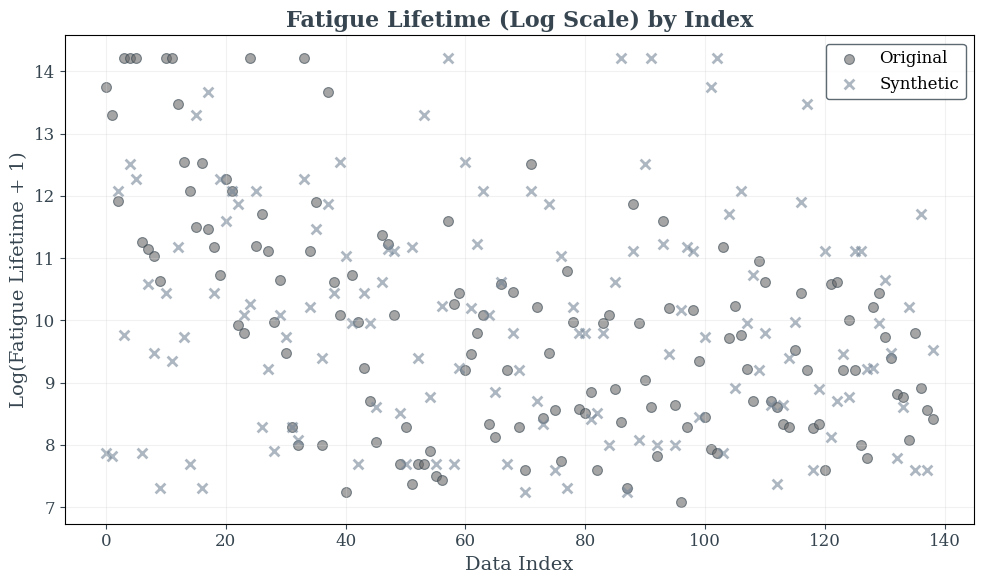


=== MULTIVARIATE ANALYSIS - INDIVIDUAL PLOTS ===


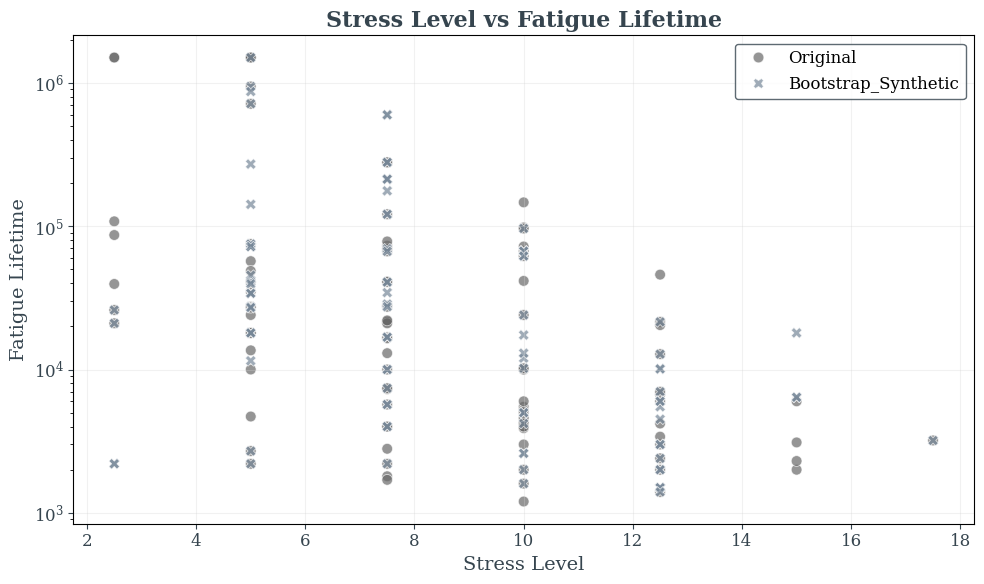

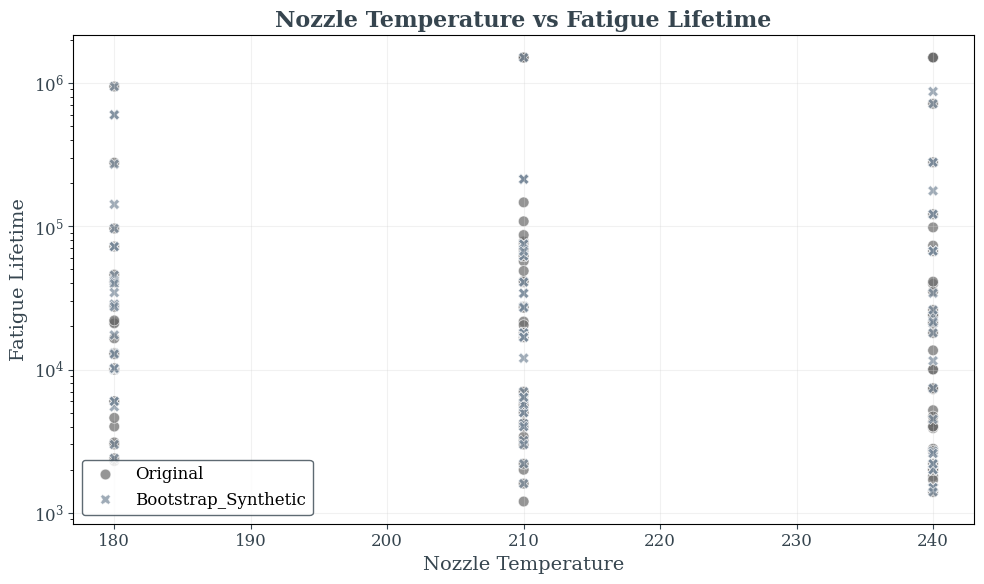

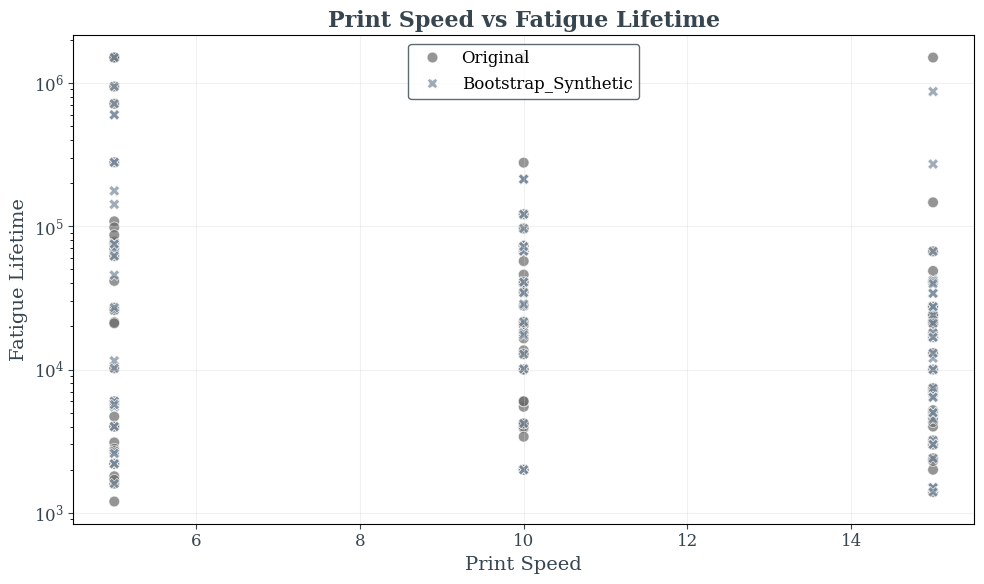

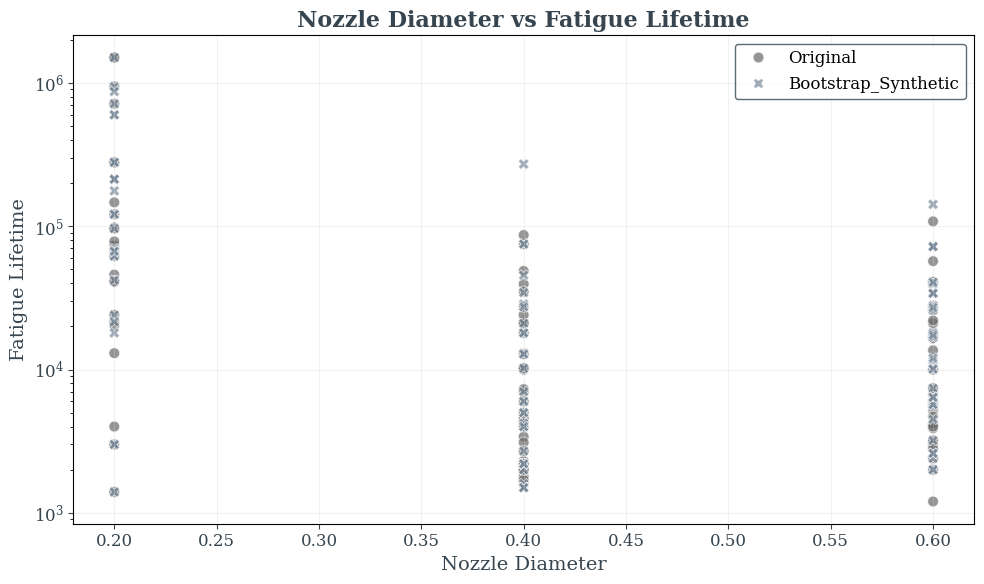

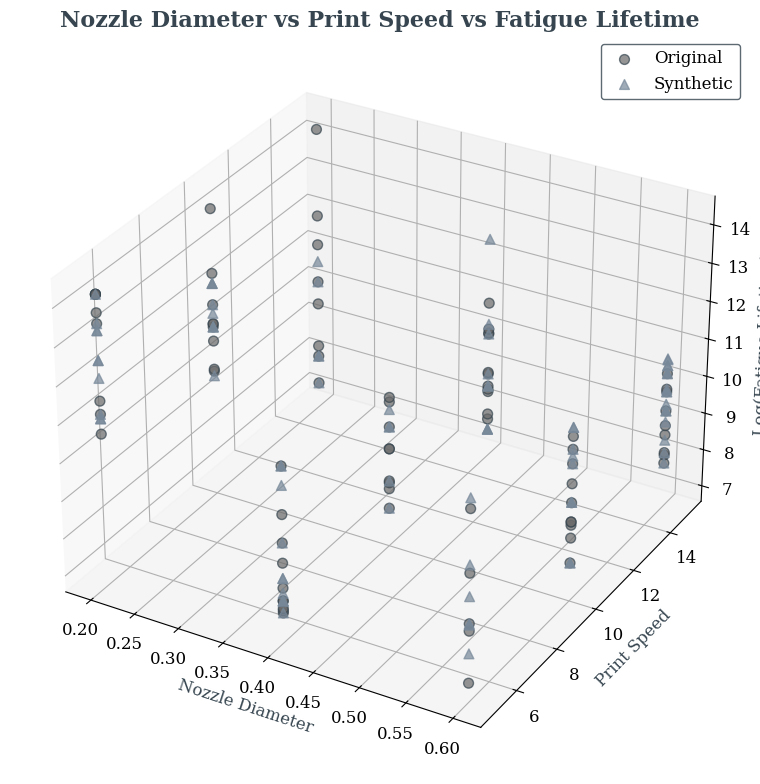

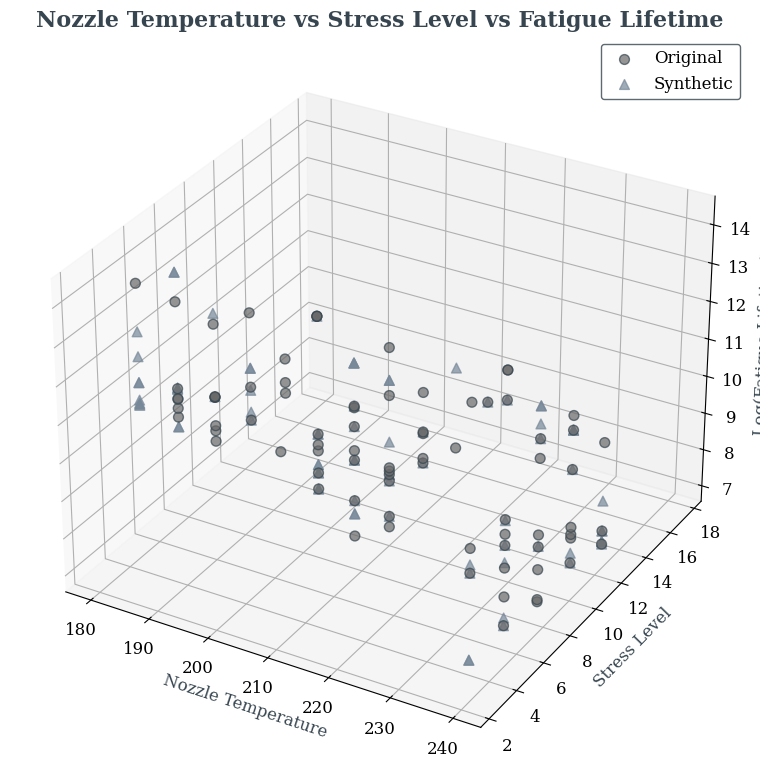


=== SYNTHETIC DATA QUALITY METRICS ===
Synthetic Data Quality Metrics:
                    Mean_Preservation_Rate  Std_Preservation_Rate  \
Nozzle Diameter                     0.9965                 0.9845   
Print Speed                         0.9820                 0.9644   
Nozzle Temperature                  0.9949                 0.9931   
Stress Level                        0.9807                 0.9896   
Fatigue Lifetime                    0.8654                 0.8159   

                    Median_Preservation_Rate  KS_Statistic  Effect_Size  \
Nozzle Diameter                          1.0        0.0144       0.0088   
Print Speed                              1.0        0.0432      -0.0436   
Nozzle Temperature                       1.0        0.0216       0.0443   
Stress Level                             1.0        0.0432      -0.0485   
Fatigue Lifetime                         1.0        0.0719      -0.0511   

                    Coverage_Rate  
Nozzle Diameter           

In [ ]:
# Step 1: Install required packages (if needed)
!pip install seaborn scipy

# Step 2: Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import ks_2samp, ttest_ind
import warnings
import matplotlib.font_manager as fm
warnings.filterwarnings('ignore')

# Read the CSV file
df = pd.read_csv('combined_bootstrap_fatigue.csv')

# Check if Times New Roman is available and set it as the default font
available_fonts = [f.name for f in fm.fontManager.ttflist]
if 'Times New Roman' in available_fonts:
    plt.rcParams['font.family'] = 'Times New Roman'
    print("Using Times New Roman font for all plots")
else:
    # Find a suitable serif font
    serif_fonts = [f for f in available_fonts if any(term in f.lower() for term in ['serif', 'times', 'roman'])]
    if serif_fonts:
        plt.rcParams['font.family'] = serif_fonts[0]
        print(f"Times New Roman not found. Using {serif_fonts[0]} instead.")
    else:
        plt.rcParams['font.family'] = 'serif'  # default serif
        print("Times New Roman not found. Using default serif font.")

# Set up the visualization style
plt.rcParams['mathtext.fontset'] = 'stix'  # For mathematical symbols
plt.rcParams['font.size'] = 12  # Set default font size

# Define grey and ash color palette
light_grey = '#D3D3D3'     # Light grey
medium_grey = '#A9A9A9'    # Medium grey
dark_grey = '#696969'      # Dark grey
ash_grey = '#778899'       # Ash grey
slate_grey = '#708090'     # Slate grey
charcoal = '#36454F'       # Charcoal

# Display basic info
print("=== DATASET OVERVIEW ===")
print("Dataset Shape:", df.shape)
print("\nFirst few rows:")
print(df.head())
print("\nData Source distribution:")
print(df['Data_Source'].value_counts())
print("\n" + "="*50)

# Step 4: Basic Data Exploration
print("\n=== BASIC DATA EXPLORATION ===")
print("Basic Statistics:")
print(df.describe())

print("\nMissing Values:")
print(df.isnull().sum())

print("\nData Types:")
print(df.dtypes)

# Step 5: Separate the data
original_data = df[df['Data_Source'] == 'Original']
synthetic_data = df[df['Data_Source'] == 'Bootstrap_Synthetic']

print(f"\nOriginal data points: {len(original_data)}")
print(f"Synthetic data points: {len(synthetic_data)}")

# Step 6: Distribution Comparison - Individual Plots
print("\n=== DISTRIBUTION COMPARISON - INDIVIDUAL PLOTS ===")
numerical_cols = ['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level', 'Fatigue Lifetime']

# Create individual distribution plots
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    plt.hist(original_data[col], alpha=0.7, label='Original', bins=20, color=dark_grey, density=True, edgecolor=charcoal, linewidth=1.2)
    plt.hist(synthetic_data[col], alpha=0.7, label='Synthetic', bins=20, color=ash_grey, density=True, edgecolor=charcoal, linewidth=1.2)
    plt.title(f'Distribution of {col}', fontsize=16, fontweight='bold', color=charcoal)
    plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
    plt.xlabel(col, fontsize=14, color=charcoal)
    plt.ylabel('Density', fontsize=14, color=charcoal)
    plt.grid(True, alpha=0.3, color=light_grey)
    plt.tick_params(colors=charcoal)
    plt.tight_layout()
    plt.show()

# Step 7: Statistical Tests for Comparison
print("\n=== STATISTICAL TESTS FOR DISTRIBUTION SIMILARITY ===")
print("=" * 60)

statistical_results = []
for col in numerical_cols:
    # Kolmogorov-Smirnov test
    ks_stat, ks_pvalue = ks_2samp(original_data[col], synthetic_data[col])

    # T-test for means
    t_stat, t_pvalue = ttest_ind(original_data[col], synthetic_data[col])

    # Mann-Whitney U test (non-parametric)
    u_stat, u_pvalue = stats.mannwhitneyu(original_data[col], synthetic_data[col])

    print(f"\n{col}:")
    print(f"  KS Test - Statistic: {ks_stat:.4f}, p-value: {ks_pvalue:.4f}")
    print(f"  T-test - Statistic: {t_stat:.4f}, p-value: {t_pvalue:.4f}")
    print(f"  Mann-Whitney U - Statistic: {u_stat:.4f}, p-value: {u_pvalue:.4f}")
    print(f"  Original Mean: {original_data[col].mean():.2f} ± {original_data[col].std():.2f}")
    print(f"  Synthetic Mean: {synthetic_data[col].mean():.2f} ± {synthetic_data[col].std():.2f}")

    statistical_results.append({
        'Variable': col,
        'KS_Statistic': ks_stat,
        'KS_pvalue': ks_pvalue,
        'T_Statistic': t_stat,
        'T_pvalue': t_pvalue,
        'U_Statistic': u_stat,
        'U_pvalue': u_pvalue
    })

# Step 8: Range Comparison
print("\n=== RANGE COMPARISON: ORIGINAL vs SYNTHETIC ===")
print("=" * 70)

range_comparison = []
for col in numerical_cols:
    orig_min = original_data[col].min()
    orig_max = original_data[col].max()
    orig_range = orig_max - orig_min
    orig_iqr = original_data[col].quantile(0.75) - original_data[col].quantile(0.25)

    synth_min = synthetic_data[col].min()
    synth_max = synthetic_data[col].max()
    synth_range = synth_max - synth_min
    synth_iqr = synthetic_data[col].quantile(0.75) - synthetic_data[col].quantile(0.25)

    range_diff = synth_range - orig_range
    range_ratio = synth_range / orig_range if orig_range != 0 else np.nan
    iqr_ratio = synth_iqr / orig_iqr if orig_iqr != 0 else np.nan

    range_comparison.append({
        'Variable': col,
        'Original_Min': orig_min,
        'Original_Max': orig_max,
        'Original_Range': orig_range,
        'Synthetic_Min': synth_min,
        'Synthetic_Max': synth_max,
        'Synthetic_Range': synth_range,
        'Range_Difference': range_diff,
        'Range_Ratio': range_ratio,
        'IQR_Ratio': iqr_ratio
    })

range_df = pd.DataFrame(range_comparison)
print(range_df.round(4))

# Step 9: Correlation Analysis - Individual Plots
print("\n=== CORRELATION ANALYSIS - INDIVIDUAL PLOTS ===")

# Original data correlation
plt.figure(figsize=(8, 6))
orig_corr = original_data[numerical_cols].corr()
sns.heatmap(orig_corr, annot=True, cmap='Greys', center=0, fmt='.3f',
            cbar_kws={'label': 'Correlation Coefficient'})
plt.title('Original Data Correlation Matrix', fontweight='bold', fontsize=16, color=charcoal)
plt.tight_layout()
plt.show()

# Synthetic data correlation
plt.figure(figsize=(8, 6))
synth_corr = synthetic_data[numerical_cols].corr()
sns.heatmap(synth_corr, annot=True, cmap='Purples', center=0, fmt='.3f',
            cbar_kws={'label': 'Correlation Coefficient'})
plt.title('Synthetic Data Correlation Matrix', fontweight='bold', fontsize=16, color=charcoal)
plt.tight_layout()
plt.show()

# Correlation difference
plt.figure(figsize=(8, 6))
corr_diff = orig_corr - synth_corr
sns.heatmap(corr_diff, annot=True, cmap='RdBu_r', center=0, fmt='.3f',
            cbar_kws={'label': 'Correlation Difference'})
plt.title('Correlation Difference (Original - Synthetic)', fontweight='bold', fontsize=16, color=charcoal)
plt.tight_layout()
plt.show()

print("Correlation Matrix Difference (Original - Synthetic):")
print(corr_diff.round(4))

# Step 10: Fatigue Lifetime Analysis - Individual Plots
print("\n=== FATIGUE LIFETIME ANALYSIS - INDIVIDUAL PLOTS ===")

# Distribution comparison (log scale)
plt.figure(figsize=(10, 6))
plt.hist(np.log1p(original_data['Fatigue Lifetime']), alpha=0.7, label='Original', bins=20, color=dark_grey, density=True, edgecolor=charcoal, linewidth=1.2)
plt.hist(np.log1p(synthetic_data['Fatigue Lifetime']), alpha=0.7, label='Synthetic', bins=20, color=ash_grey, density=True, edgecolor=charcoal, linewidth=1.2)
plt.title('Fatigue Lifetime Distribution (log scale)', fontweight='bold', fontsize=16, color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.xlabel('Log(Fatigue Lifetime + 1)', fontsize=14, color=charcoal)
plt.ylabel('Density', fontsize=14, color=charcoal)
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.show()

# Box plot
plt.figure(figsize=(10, 6))
box_data = [original_data['Fatigue Lifetime'], synthetic_data['Fatigue Lifetime']]
box_plot = plt.boxplot(box_data, labels=['Original', 'Synthetic'], patch_artist=True)
# Customize box colors
box_plot['boxes'][0].set_facecolor(dark_grey)
box_plot['boxes'][1].set_facecolor(ash_grey)
box_plot['boxes'][0].set_edgecolor(charcoal)
box_plot['boxes'][1].set_edgecolor(charcoal)
plt.title('Fatigue Lifetime Box Plot', fontweight='bold', fontsize=16, color=charcoal)
plt.ylabel('Fatigue Lifetime', fontsize=14, color=charcoal)
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.show()

# Violin plot
plt.figure(figsize=(10, 6))
violin_parts = plt.violinplot([original_data['Fatigue Lifetime'], synthetic_data['Fatigue Lifetime']],
                             showmeans=True, showmedians=True)
# Customize violin colors
violin_parts['bodies'][0].set_facecolor(dark_grey)
violin_parts['bodies'][1].set_facecolor(ash_grey)
violin_parts['bodies'][0].set_edgecolor(charcoal)
violin_parts['bodies'][1].set_edgecolor(charcoal)
plt.xticks([1, 2], ['Original', 'Synthetic'])
plt.title('Fatigue Lifetime Violin Plot', fontweight='bold', fontsize=16, color=charcoal)
plt.ylabel('Fatigue Lifetime', fontsize=14, color=charcoal)
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.show()

# QQ plot
plt.figure(figsize=(10, 6))
sorted_orig = np.sort(original_data['Fatigue Lifetime'])
sorted_synth = np.sort(synthetic_data['Fatigue Lifetime'])

# Use common length for QQ plot
min_len = min(len(sorted_orig), len(sorted_synth))
plt.scatter(sorted_orig[:min_len], sorted_synth[:min_len], alpha=0.6, color=slate_grey, s=50)
plt.plot([sorted_orig.min(), sorted_orig.max()], [sorted_orig.min(), sorted_orig.max()], '--', linewidth=2, color=charcoal)
plt.xlabel('Original Fatigue Lifetime', fontsize=14, color=charcoal)
plt.ylabel('Synthetic Fatigue Lifetime', fontsize=14, color=charcoal)
plt.title('QQ Plot: Original vs Synthetic', fontweight='bold', fontsize=16, color=charcoal)
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.show()

# Cumulative distribution
plt.figure(figsize=(10, 6))
plt.hist(original_data['Fatigue Lifetime'], cumulative=True, density=True,
           alpha=0.7, label='Original', bins=50, histtype='step', linewidth=2, color=dark_grey)
plt.hist(synthetic_data['Fatigue Lifetime'], cumulative=True, density=True,
           alpha=0.7, label='Synthetic', bins=50, histtype='step', linewidth=2, color=ash_grey)
plt.title('Cumulative Distribution Function', fontweight='bold', fontsize=16, color=charcoal)
plt.xlabel('Fatigue Lifetime', fontsize=14, color=charcoal)
plt.ylabel('Cumulative Probability', fontsize=14, color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.show()

# Log-scale scatter
plt.figure(figsize=(10, 6))
plt.scatter(range(len(original_data)), np.log1p(original_data['Fatigue Lifetime']),
             alpha=0.6, label='Original', color=dark_grey, s=50, edgecolors=charcoal, linewidth=0.8)
plt.scatter(range(len(synthetic_data)), np.log1p(synthetic_data['Fatigue Lifetime']),
             alpha=0.6, label='Synthetic', color=ash_grey, s=50, marker='x', linewidth=2)
plt.title('Fatigue Lifetime (Log Scale) by Index', fontweight='bold', fontsize=16, color=charcoal)
plt.xlabel('Data Index', fontsize=14, color=charcoal)
plt.ylabel('Log(Fatigue Lifetime + 1)', fontsize=14, color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.show()

# Step 11: Multivariate Analysis - Individual Plots
print("\n=== MULTIVARIATE ANALYSIS - INDIVIDUAL PLOTS ===")

# Sample data for multivariate plots
sample_orig = original_data.sample(min(100, len(original_data)), random_state=42)
sample_synth = synthetic_data.sample(min(100, len(synthetic_data)), random_state=42)
comparison_sample = pd.concat([sample_orig, sample_synth])

# Stress Level vs Fatigue Lifetime
plt.figure(figsize=(10, 6))
sns.scatterplot(data=comparison_sample, x='Stress Level', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60,
                palette=[dark_grey, ash_grey])
plt.title('Stress Level vs Fatigue Lifetime', fontweight='bold', fontsize=16, color=charcoal)
plt.yscale('log')
plt.xlabel('Stress Level', fontsize=14, color=charcoal)
plt.ylabel('Fatigue Lifetime', fontsize=14, color=charcoal)
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.tight_layout()
plt.show()

# Nozzle Temperature vs Fatigue Lifetime
plt.figure(figsize=(10, 6))
sns.scatterplot(data=comparison_sample, x='Nozzle Temperature', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60,
                palette=[dark_grey, ash_grey])
plt.title('Nozzle Temperature vs Fatigue Lifetime', fontweight='bold', fontsize=16, color=charcoal)
plt.yscale('log')
plt.xlabel('Nozzle Temperature', fontsize=14, color=charcoal)
plt.ylabel('Fatigue Lifetime', fontsize=14, color=charcoal)
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.tight_layout()
plt.show()

# Print Speed vs Fatigue Lifetime
plt.figure(figsize=(10, 6))
sns.scatterplot(data=comparison_sample, x='Print Speed', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60,
                palette=[dark_grey, ash_grey])
plt.title('Print Speed vs Fatigue Lifetime', fontweight='bold', fontsize=16, color=charcoal)
plt.yscale('log')
plt.xlabel('Print Speed', fontsize=14, color=charcoal)
plt.ylabel('Fatigue Lifetime', fontsize=14, color=charcoal)
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.tight_layout()
plt.show()

# Nozzle Diameter vs Fatigue Lifetime
plt.figure(figsize=(10, 6))
sns.scatterplot(data=comparison_sample, x='Nozzle Diameter', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60,
                palette=[dark_grey, ash_grey])
plt.title('Nozzle Diameter vs Fatigue Lifetime', fontweight='bold', fontsize=16, color=charcoal)
plt.yscale('log')
plt.xlabel('Nozzle Diameter', fontsize=14, color=charcoal)
plt.ylabel('Fatigue Lifetime', fontsize=14, color=charcoal)
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.tight_layout()
plt.show()

# 3D scatter plots
from mpl_toolkits.mplot3d import Axes3D

# First 3D plot
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(111, projection='3d')
sample_size = min(80, len(original_data), len(synthetic_data))
orig_sample = original_data.sample(sample_size, random_state=42)
synth_sample = synthetic_data.sample(sample_size, random_state=42)

sc1 = ax1.scatter(orig_sample['Nozzle Diameter'], orig_sample['Print Speed'],
           np.log1p(orig_sample['Fatigue Lifetime']),
           c=dark_grey, label='Original', alpha=0.7, s=50, edgecolors=charcoal)
sc2 = ax1.scatter(synth_sample['Nozzle Diameter'], synth_sample['Print Speed'],
           np.log1p(synth_sample['Fatigue Lifetime']),
           c=ash_grey, label='Synthetic', alpha=0.7, s=50, marker='^')

ax1.set_xlabel('Nozzle Diameter', fontsize=12, color=charcoal)
ax1.set_ylabel('Print Speed', fontsize=12, color=charcoal)
ax1.set_zlabel('Log(Fatigue Lifetime)', fontsize=12, color=charcoal)
ax1.set_title('Nozzle Diameter vs Print Speed vs Fatigue Lifetime', fontweight='bold', fontsize=16, color=charcoal)
ax1.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.tight_layout()
plt.show()

# Second 3D plot
fig = plt.figure(figsize=(12, 8))
ax2 = fig.add_subplot(111, projection='3d')
sc3 = ax2.scatter(orig_sample['Nozzle Temperature'], orig_sample['Stress Level'],
           np.log1p(orig_sample['Fatigue Lifetime']),
           c=dark_grey, label='Original', alpha=0.7, s=50, edgecolors=charcoal)
sc4 = ax2.scatter(synth_sample['Nozzle Temperature'], synth_sample['Stress Level'],
           np.log1p(synth_sample['Fatigue Lifetime']),
           c=ash_grey, label='Synthetic', alpha=0.7, s=50, marker='^')

ax2.set_xlabel('Nozzle Temperature', fontsize=12, color=charcoal)
ax2.set_ylabel('Stress Level', fontsize=12, color=charcoal)
ax2.set_zlabel('Log(Fatigue Lifetime)', fontsize=12, color=charcoal)
ax2.set_title('Nozzle Temperature vs Stress Level vs Fatigue Lifetime', fontweight='bold', fontsize=16, color=charcoal)
ax2.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.tight_layout()
plt.show()

# Step 12: Quality Metrics for Synthetic Data
print("\n=== SYNTHETIC DATA QUALITY METRICS ===")

def calculate_synthetic_quality_metrics(original, synthetic, numerical_cols):
    """Calculate various quality metrics for synthetic data"""

    metrics = {}

    for col in numerical_cols:
        # Basic statistics preservation
        orig_mean = original[col].mean()
        synth_mean = synthetic[col].mean()
        mean_preservation = abs(synth_mean - orig_mean) / orig_mean if orig_mean != 0 else abs(synth_mean - orig_mean)

        orig_std = original[col].std()
        synth_std = synthetic[col].std()
        std_preservation = abs(synth_std - orig_std) / orig_std if orig_std != 0 else abs(synth_std - orig_std)

        orig_median = original[col].median()
        synth_median = synthetic[col].median()
        median_preservation = abs(synth_median - orig_median) / orig_median if orig_median != 0 else abs(synth_median - orig_median)

        metrics[col] = {
            'Mean_Preservation_Rate': 1 - mean_preservation,
            'Std_Preservation_Rate': 1 - std_preservation,
            'Median_Preservation_Rate': 1 - median_preservation,
            'KS_Statistic': stats.ks_2samp(original[col], synthetic[col])[0],
            'Effect_Size': (synth_mean - orig_mean) / orig_std if orig_std != 0 else 0,
            'Coverage_Rate': len(set(synthetic[col]) & set(original[col])) / len(set(original[col])) if len(set(original[col])) > 0 else 0
        }

    return pd.DataFrame(metrics).T

# Calculate quality metrics
quality_metrics = calculate_synthetic_quality_metrics(original_data, synthetic_data, numerical_cols)
print("Synthetic Data Quality Metrics:")
print(quality_metrics.round(4))

# Step 13: Summary Report
print("\n" + "="*80)
print("COMPREHENSIVE COMPARISON REPORT: ORIGINAL vs SYNTHETIC DATA")
print("="*80)

print(f"\n1. DATA VOLUME:")
print(f"   • Original samples: {len(original_data):,}")
print(f"   • Synthetic samples: {len(synthetic_data):,}")
print(f"   • Total samples: {len(df):,}")
print(f"   • Synthetic/Original ratio: {len(synthetic_data)/len(original_data):.2f}")

print(f"\n2. KEY STATISTICAL DIFFERENCES:")
fatigue_stats = range_df[range_df['Variable'] == 'Fatigue Lifetime'].iloc[0]
print(f"   • Fatigue Lifetime Range - Original: {fatigue_stats['Original_Range']:,.0f}")
print(f"   • Fatigue Lifetime Range - Synthetic: {fatigue_stats['Synthetic_Range']:,.0f}")
print(f"   • Range Preservation: {fatigue_stats['Range_Ratio']:.3f}")

print(f"\n3. DATA QUALITY ASSESSMENT:")
print(f"   • Average mean preservation rate: {quality_metrics['Mean_Preservation_Rate'].mean():.3f}")
print(f"   • Average std preservation rate: {quality_metrics['Std_Preservation_Rate'].mean():.3f}")
print(f"   • Average median preservation rate: {quality_metrics['Median_Preservation_Rate'].mean():.3f}")
print(f"   • Average KS statistic: {quality_metrics['KS_Statistic'].mean():.3f}")

print(f"\n4. CORRELATION PRESERVATION:")
corr_preservation = 1 - (corr_diff.abs().mean().mean())
print(f"   • Correlation preservation rate: {corr_preservation:.3f}")

print(f"\n5. RECOMMENDATIONS:")
recommendations = []

if quality_metrics.loc['Fatigue Lifetime', 'Mean_Preservation_Rate'] > 0.95:
    recommendations.append("✓ Synthetic data preserves key statistics well")
else:
    recommendations.append("⚠ Some statistical properties differ significantly")

if quality_metrics.loc['Fatigue Lifetime', 'KS_Statistic'] < 0.1:
    recommendations.append("✓ Distributions are very similar (low KS statistic)")
else:
    recommendations.append("⚠ Distributions show some differences")

if len(synthetic_data) >= len(original_data):
    recommendations.append("✓ Sufficient synthetic data generated")
else:
    recommendations.append("⚠ Consider generating more synthetic data")

if corr_preservation > 0.95:
    recommendations.append("✓ Correlation structure well preserved")
else:
    recommendations.append("⚠ Some correlation patterns differ")

for rec in recommendations:
    print(f"   {rec}")

print(f"\n6. OVERALL SYNTHETIC DATA QUALITY SCORE:")
overall_score = (
    quality_metrics['Mean_Preservation_Rate'].mean() * 0.3 +
    quality_metrics['Std_Preservation_Rate'].mean() * 0.3 +
    corr_preservation * 0.2 +
    (1 - quality_metrics['KS_Statistic'].mean()) * 0.2
) * 100

print(f"   • Overall Quality Score: {overall_score:.1f}%")

if overall_score >= 90:
    print("   • Rating: EXCELLENT")
elif overall_score >= 80:
    print("   • Rating: GOOD")
elif overall_score >= 70:
    print("   • Rating: FAIR")
else:
    print("   • Rating: NEEDS IMPROVEMENT")

print("\n" + "="*80)

# Step 14: Save the analysis results
print("\nSaving analysis results...")

# Create a summary dataframe
summary_results = pd.DataFrame({
    'Metric': [
        'Original_Samples', 'Synthetic_Samples', 'Total_Samples',
        'Synthetic_Original_Ratio', 'Overall_Quality_Score',
        'Mean_Preservation_Rate', 'Std_Preservation_Rate',
        'Correlation_Preservation', 'Average_KS_Statistic'
    ],
    'Value': [
        len(original_data), len(synthetic_data), len(df),
        len(synthetic_data)/len(original_data), overall_score,
        quality_metrics['Mean_Preservation_Rate'].mean(),
        quality_metrics['Std_Preservation_Rate'].mean(),
        corr_preservation,
        quality_metrics['KS_Statistic'].mean()
    ]
})

print("\nSummary Results:")
print(summary_results.round(4))

print("\n=== ANALYSIS COMPLETE ===")

#plots

=== DATASET OVERVIEW ===
Dataset Shape: (278, 6)

First few rows:
   Nozzle Diameter  Print Speed  Nozzle Temperature  Stress Level  \
0              0.2            5                 180           5.0   
1              0.2            5                 180           7.5   
2              0.2            5                 180          10.0   
3              0.2            5                 210           2.5   
4              0.2            5                 210           5.0   

   Fatigue Lifetime Data_Source  
0            942000    Original  
1            597800    Original  
2            148900    Original  
3           1500000    Original  
4           1500000    Original  

Data Source distribution:
Data_Source
Original               139
Bootstrap_Synthetic    139
Name: count, dtype: int64


=== BASIC DATA EXPLORATION ===
Basic Statistics:
       Nozzle Diameter  Print Speed  Nozzle Temperature  Stress Level  \
count       278.000000   278.000000          278.000000    278.000000   

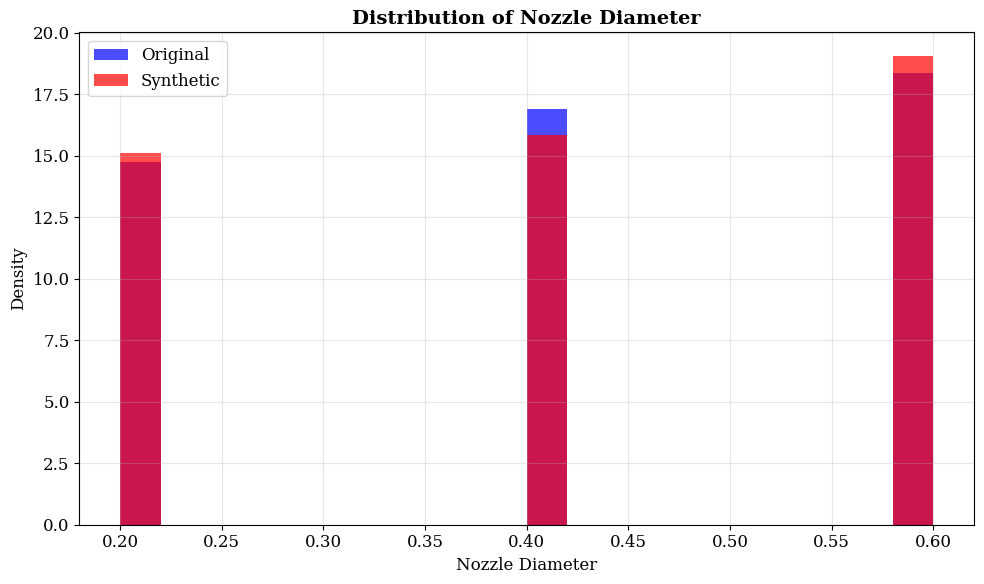

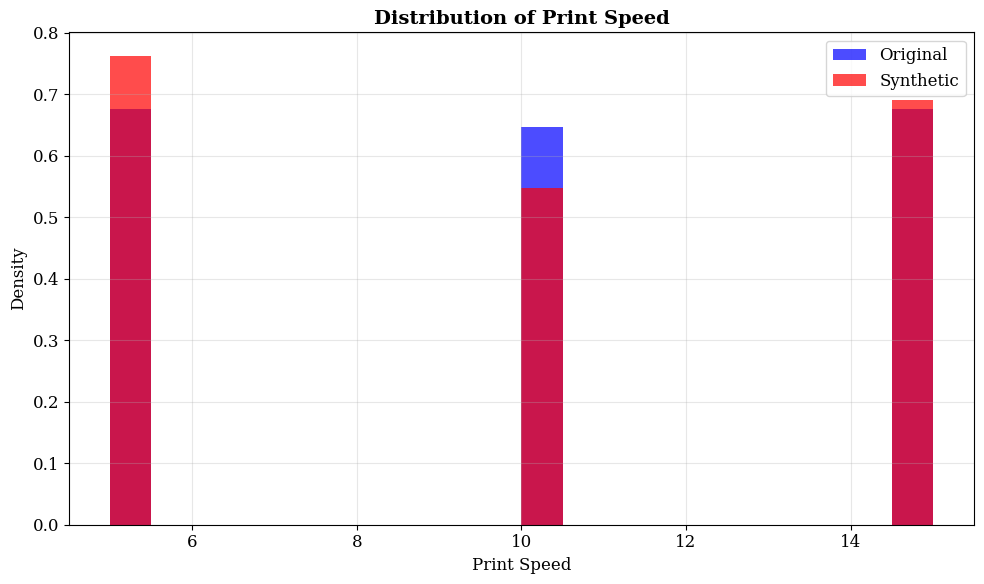

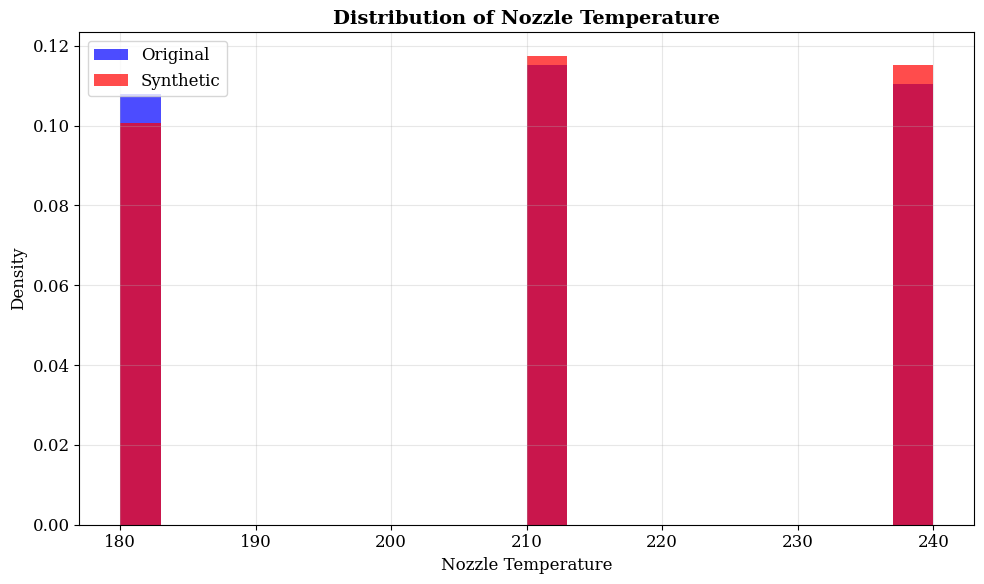

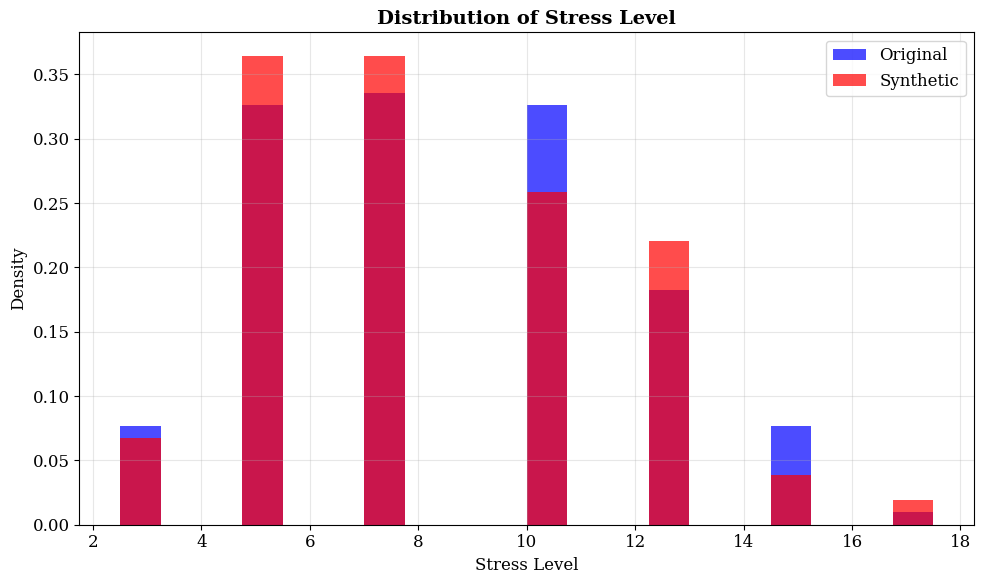

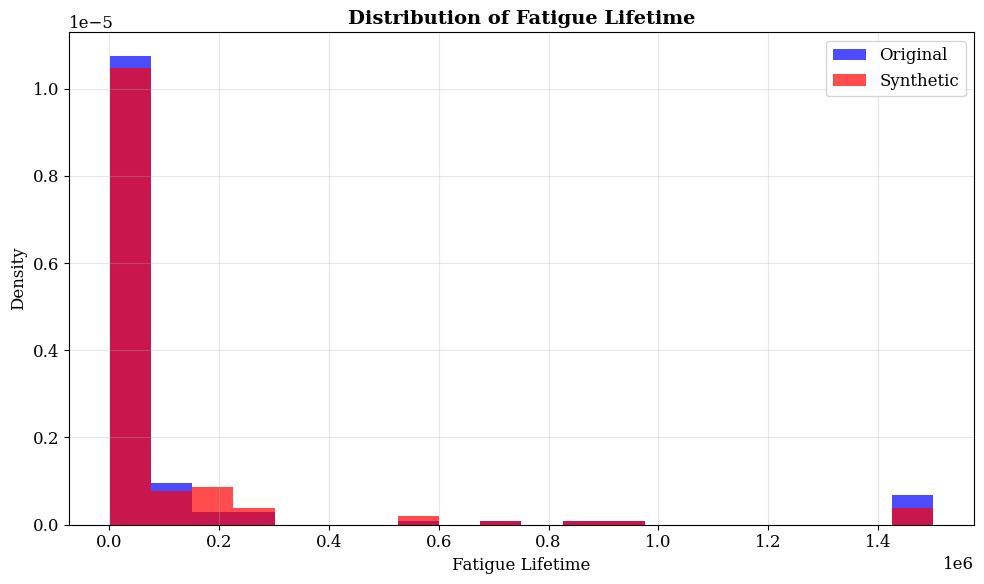


=== STATISTICAL TESTS FOR DISTRIBUTION SIMILARITY ===

Nozzle Diameter:
  KS Test - Statistic: 0.0144, p-value: 1.0000
  T-test - Statistic: -0.0732, p-value: 0.9417
  Mann-Whitney U - Statistic: 9606.5000, p-value: 0.9324
  Original Mean: 0.41 ± 0.16
  Synthetic Mean: 0.42 ± 0.17

Print Speed:
  KS Test - Statistic: 0.0432, p-value: 0.9995
  T-test - Statistic: 0.3569, p-value: 0.7214
  Mann-Whitney U - Statistic: 9890.5000, p-value: 0.7162
  Original Mean: 10.00 ± 4.13
  Synthetic Mean: 9.82 ± 4.27

Nozzle Temperature:
  KS Test - Statistic: 0.0216, p-value: 1.0000
  T-test - Statistic: -0.3706, p-value: 0.7112
  Mann-Whitney U - Statistic: 9427.0000, p-value: 0.7122
  Original Mean: 210.22 ± 24.36
  Synthetic Mean: 211.29 ± 24.19

Stress Level:
  KS Test - Statistic: 0.0432, p-value: 0.9995
  T-test - Statistic: 0.4064, p-value: 0.6848
  Mann-Whitney U - Statistic: 9959.5000, p-value: 0.6478
  Original Mean: 8.40 ± 3.34
  Synthetic Mean: 8.24 ± 3.30

Fatigue Lifetime:
  KS Test - S

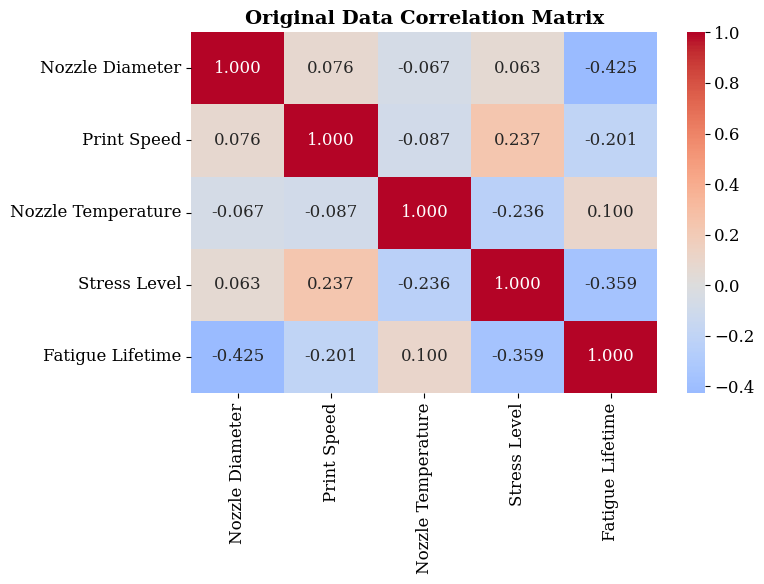

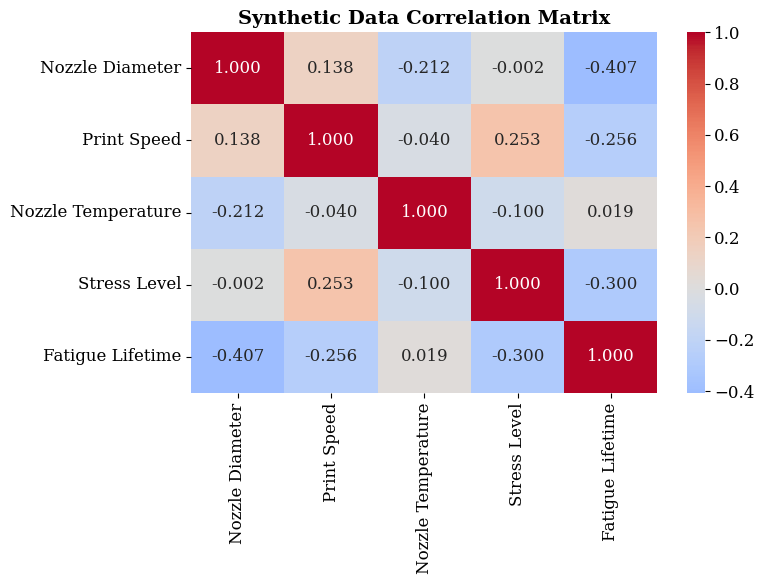

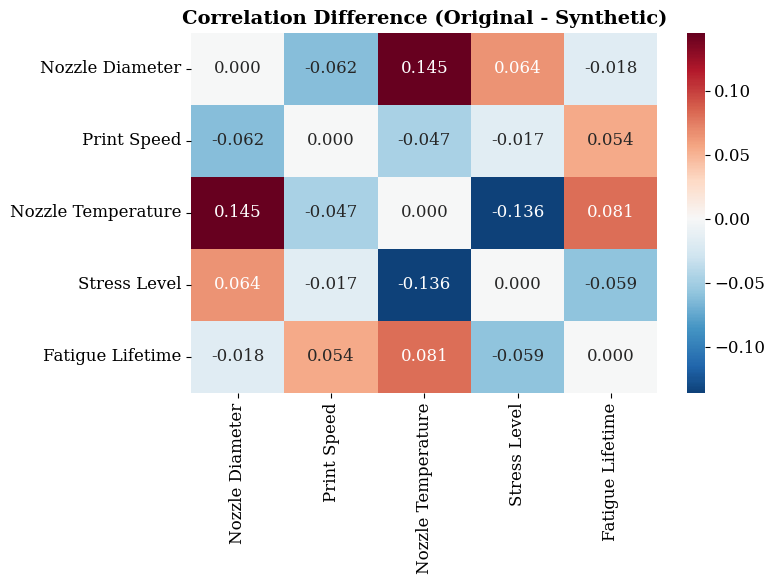

Correlation Matrix Difference (Original - Synthetic):
                    Nozzle Diameter  Print Speed  Nozzle Temperature  \
Nozzle Diameter              0.0000      -0.0619              0.1453   
Print Speed                 -0.0619       0.0000             -0.0467   
Nozzle Temperature           0.1453      -0.0467              0.0000   
Stress Level                 0.0644      -0.0166             -0.1359   
Fatigue Lifetime            -0.0180       0.0543              0.0807   

                    Stress Level  Fatigue Lifetime  
Nozzle Diameter           0.0644           -0.0180  
Print Speed              -0.0166            0.0543  
Nozzle Temperature       -0.1359            0.0807  
Stress Level              0.0000           -0.0587  
Fatigue Lifetime         -0.0587            0.0000  

=== FATIGUE LIFETIME ANALYSIS ===


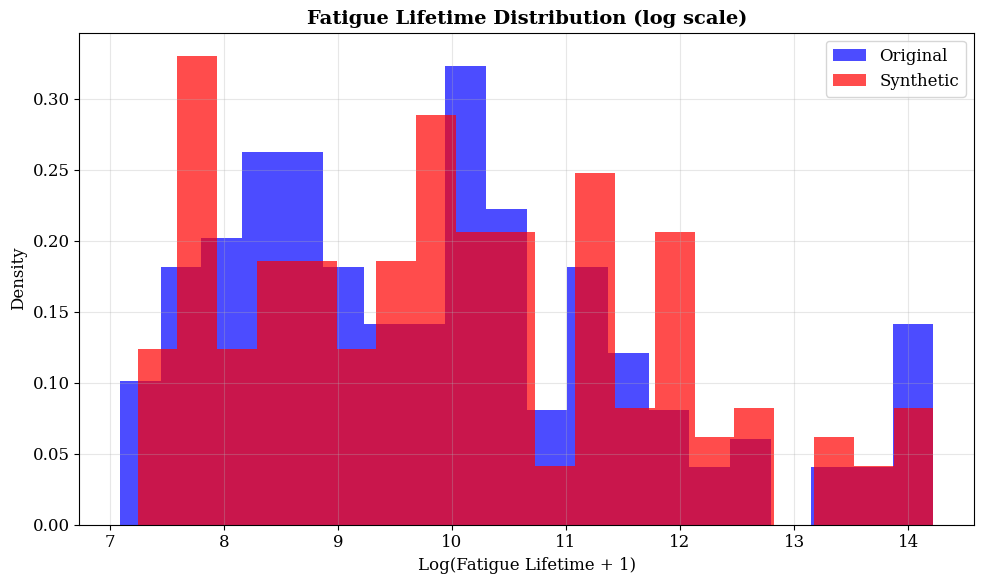

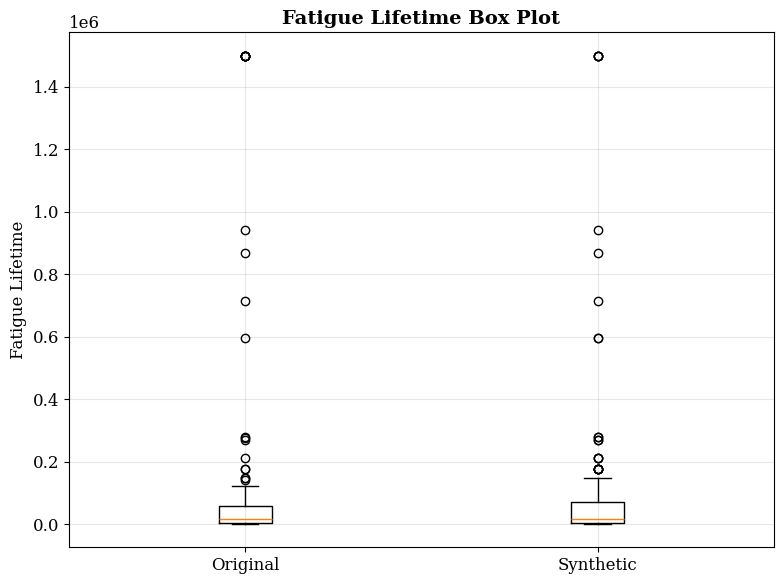

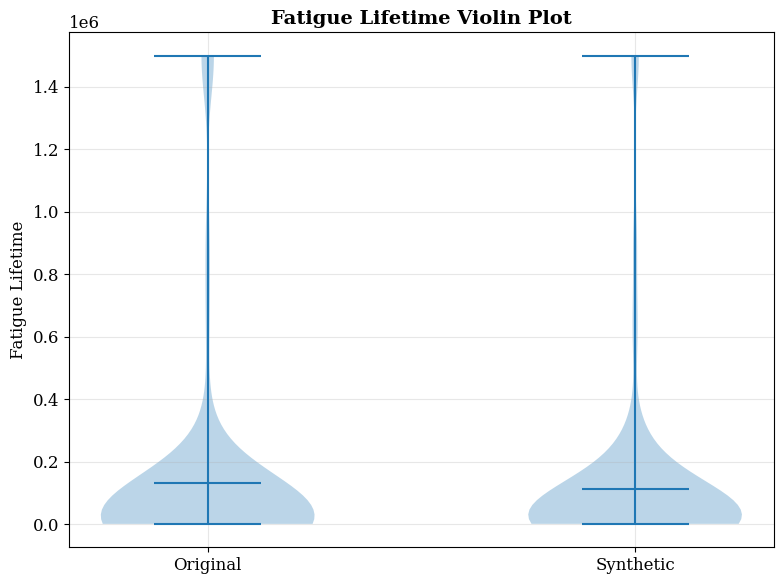

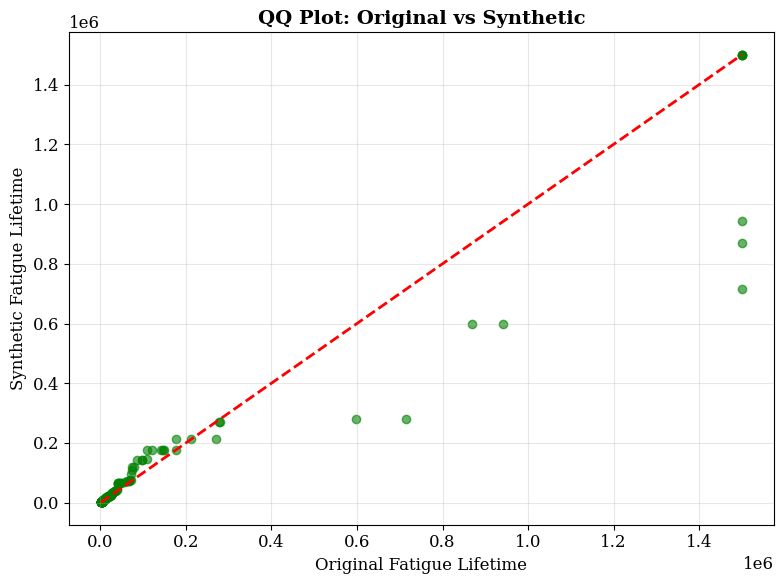

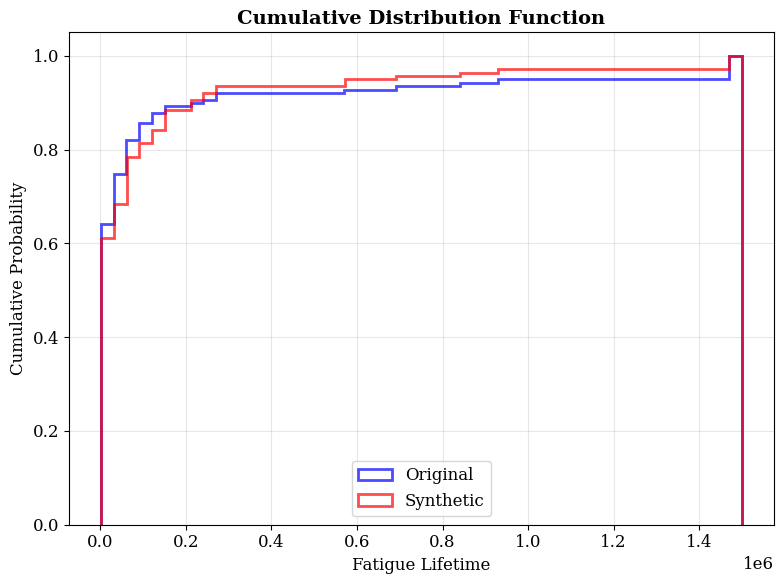

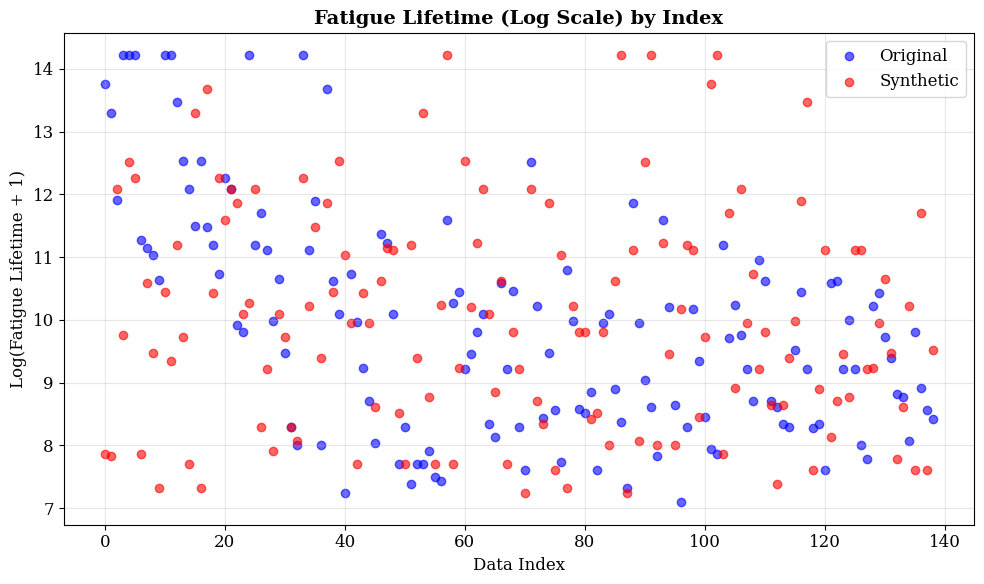


=== MULTIVARIATE ANALYSIS ===


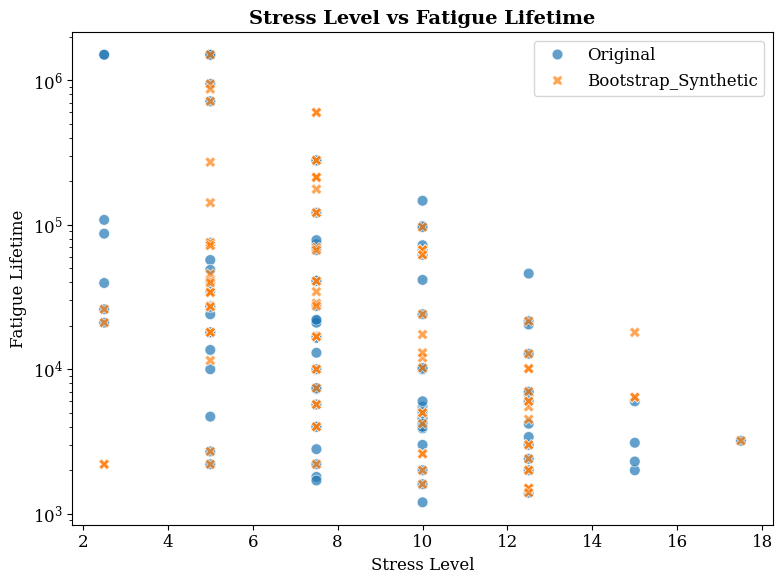

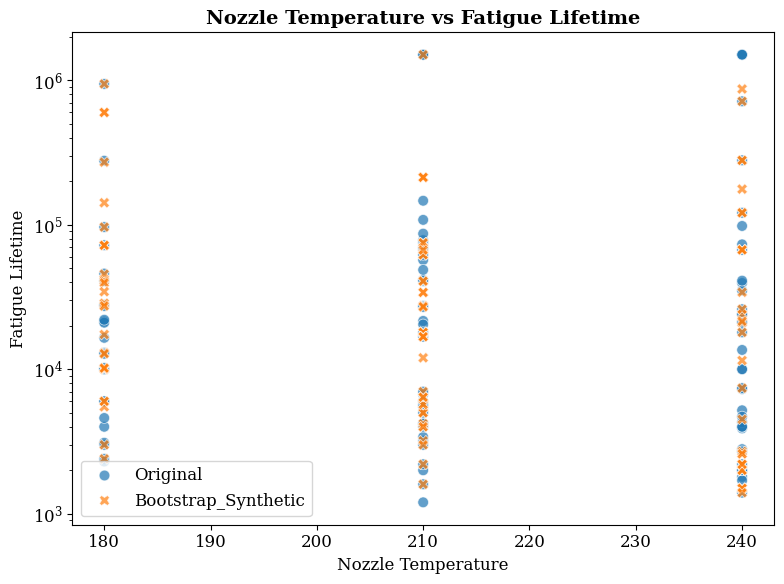

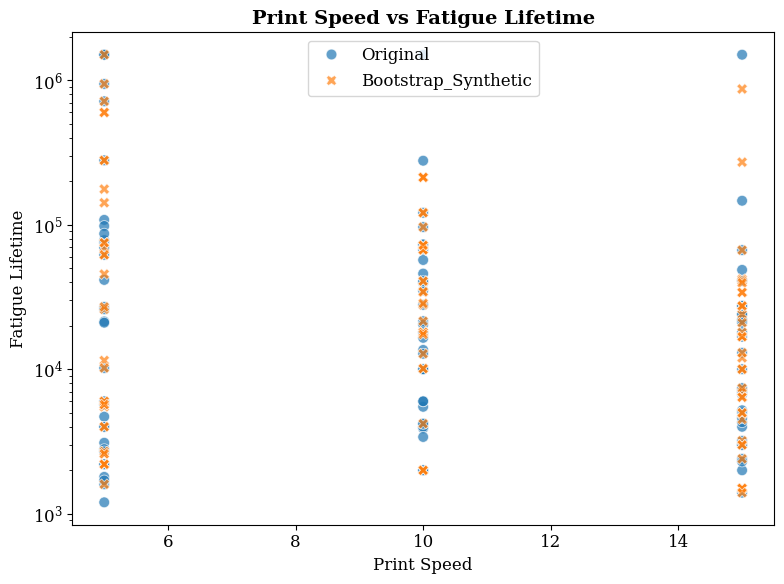

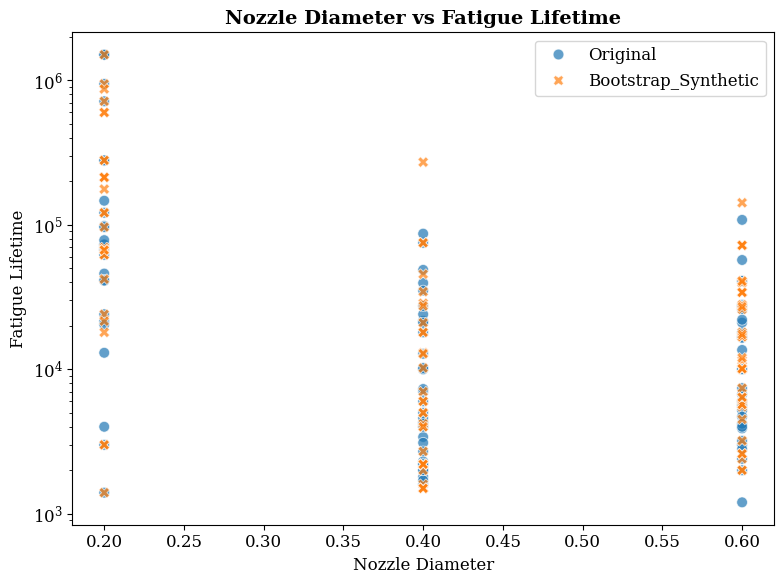

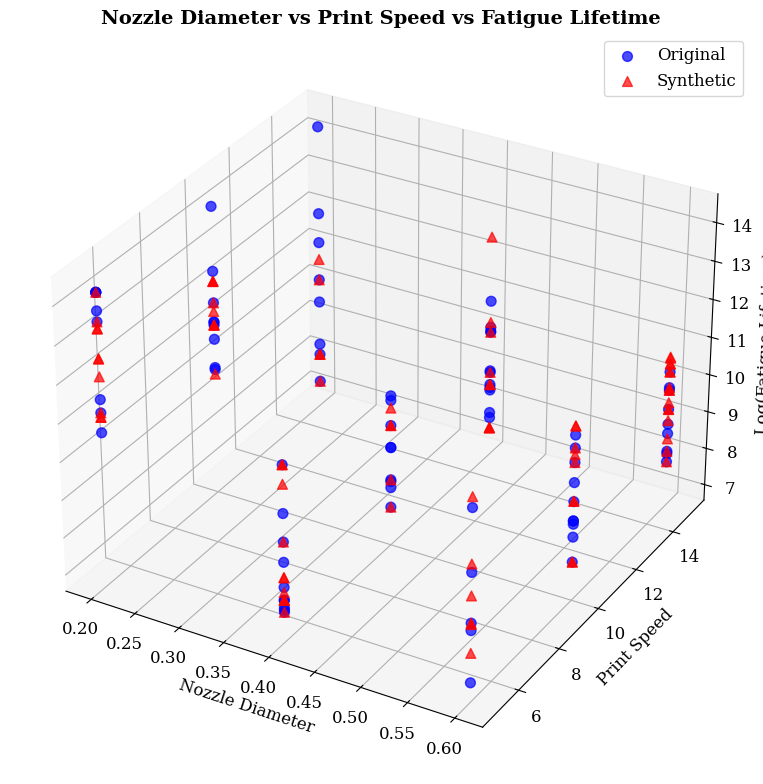

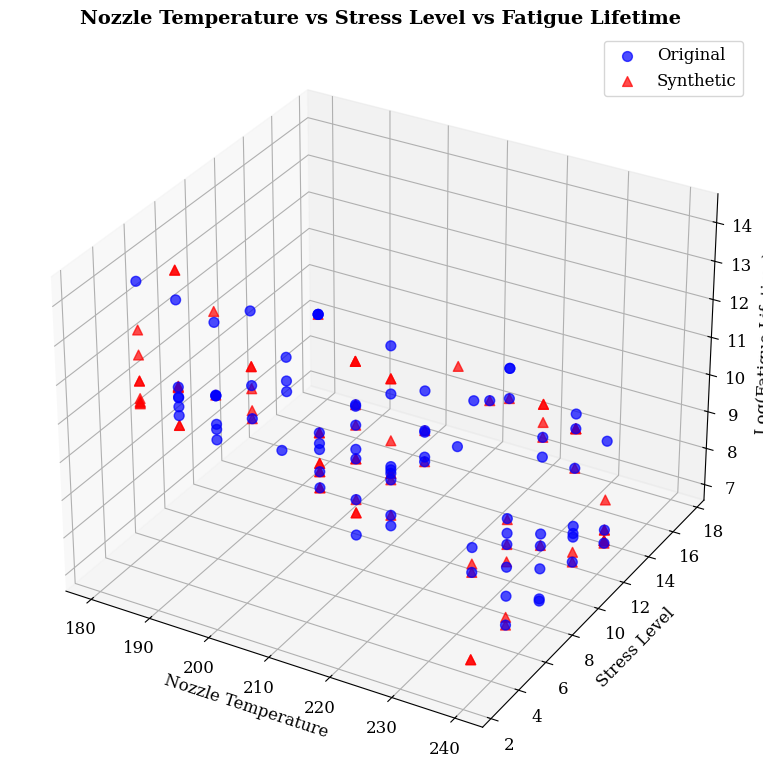


=== SYNTHETIC DATA QUALITY METRICS ===
Synthetic Data Quality Metrics:
                    Mean_Preservation_Rate  Std_Preservation_Rate  \
Nozzle Diameter                     0.9965                 0.9845   
Print Speed                         0.9820                 0.9644   
Nozzle Temperature                  0.9949                 0.9931   
Stress Level                        0.9807                 0.9896   
Fatigue Lifetime                    0.8654                 0.8159   

                    Median_Preservation_Rate  KS_Statistic  Effect_Size  \
Nozzle Diameter                          1.0        0.0144       0.0088   
Print Speed                              1.0        0.0432      -0.0436   
Nozzle Temperature                       1.0        0.0216       0.0443   
Stress Level                             1.0        0.0432      -0.0485   
Fatigue Lifetime                         1.0        0.0719      -0.0511   

                    Coverage_Rate  
Nozzle Diameter           

In [ ]:
# Step 1: Install required packages (if needed)
!pip install seaborn scipy

# Step 2: Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import ks_2samp, ttest_ind
import warnings
warnings.filterwarnings('ignore')

# Set global font to a common available font
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['DejaVu Serif', 'Times New Roman', 'Liberation Serif']
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12

# Step 3: Load and explore the data
df = pd.read_csv('combined_bootstrap_fatigue.csv')

# Display basic info
print("=== DATASET OVERVIEW ===")
print("Dataset Shape:", df.shape)
print("\nFirst few rows:")
print(df.head())
print("\nData Source distribution:")
print(df['Data_Source'].value_counts())
print("\n" + "="*50)

# Step 4: Basic Data Exploration
print("\n=== BASIC DATA EXPLORATION ===")
print("Basic Statistics:")
print(df.describe())

print("\nMissing Values:")
print(df.isnull().sum())

print("\nData Types:")
print(df.dtypes)

# Step 5: Separate the data
original_data = df[df['Data_Source'] == 'Original']
synthetic_data = df[df['Data_Source'] == 'Bootstrap_Synthetic']

print(f"\nOriginal data points: {len(original_data)}")
print(f"Synthetic data points: {len(synthetic_data)}")

# Step 6: Distribution Comparison - SEPARATE PLOTS
print("\n=== DISTRIBUTION COMPARISON ===")
numerical_cols = ['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level', 'Fatigue Lifetime']

# Create individual distribution plots
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    plt.hist(original_data[col], alpha=0.7, label='Original', bins=20, color='blue', density=True)
    plt.hist(synthetic_data[col], alpha=0.7, label='Synthetic', bins=20, color='red', density=True)
    plt.title(f'Distribution of {col}', fontsize=14, fontweight='bold')
    plt.legend()
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Step 7: Statistical Tests for Comparison
print("\n=== STATISTICAL TESTS FOR DISTRIBUTION SIMILARITY ===")
print("=" * 60)

statistical_results = []
for col in numerical_cols:
    # Kolmogorov-Smirnov test
    ks_stat, ks_pvalue = ks_2samp(original_data[col], synthetic_data[col])

    # T-test for means
    t_stat, t_pvalue = ttest_ind(original_data[col], synthetic_data[col])

    # Mann-Whitney U test (non-parametric)
    u_stat, u_pvalue = stats.mannwhitneyu(original_data[col], synthetic_data[col])

    print(f"\n{col}:")
    print(f"  KS Test - Statistic: {ks_stat:.4f}, p-value: {ks_pvalue:.4f}")
    print(f"  T-test - Statistic: {t_stat:.4f}, p-value: {t_pvalue:.4f}")
    print(f"  Mann-Whitney U - Statistic: {u_stat:.4f}, p-value: {u_pvalue:.4f}")
    print(f"  Original Mean: {original_data[col].mean():.2f} ± {original_data[col].std():.2f}")
    print(f"  Synthetic Mean: {synthetic_data[col].mean():.2f} ± {synthetic_data[col].std():.2f}")

    statistical_results.append({
        'Variable': col,
        'KS_Statistic': ks_stat,
        'KS_pvalue': ks_pvalue,
        'T_Statistic': t_stat,
        'T_pvalue': t_pvalue,
        'U_Statistic': u_stat,
        'U_pvalue': u_pvalue
    })

# Step 8: Range Comparison
print("\n=== RANGE COMPARISON: ORIGINAL vs SYNTHETIC ===")
print("=" * 70)

range_comparison = []
for col in numerical_cols:
    orig_min = original_data[col].min()
    orig_max = original_data[col].max()
    orig_range = orig_max - orig_min
    orig_iqr = original_data[col].quantile(0.75) - original_data[col].quantile(0.25)

    synth_min = synthetic_data[col].min()
    synth_max = synthetic_data[col].max()
    synth_range = synth_max - synth_min
    synth_iqr = synthetic_data[col].quantile(0.75) - synthetic_data[col].quantile(0.25)

    range_diff = synth_range - orig_range
    range_ratio = synth_range / orig_range if orig_range != 0 else np.nan
    iqr_ratio = synth_iqr / orig_iqr if orig_iqr != 0 else np.nan

    range_comparison.append({
        'Variable': col,
        'Original_Min': orig_min,
        'Original_Max': orig_max,
        'Original_Range': orig_range,
        'Synthetic_Min': synth_min,
        'Synthetic_Max': synth_max,
        'Synthetic_Range': synth_range,
        'Range_Difference': range_diff,
        'Range_Ratio': range_ratio,
        'IQR_Ratio': iqr_ratio
    })

range_df = pd.DataFrame(range_comparison)
print(range_df.round(4))

# Step 9: Correlation Analysis - SEPARATE PLOTS
print("\n=== CORRELATION ANALYSIS ===")

# Original data correlation
plt.figure(figsize=(8, 6))
orig_corr = original_data[numerical_cols].corr()
sns.heatmap(orig_corr, annot=True, cmap='coolwarm', center=0, fmt='.3f')
plt.title('Original Data Correlation Matrix', fontweight='bold')
plt.tight_layout()
plt.show()

# Synthetic data correlation
plt.figure(figsize=(8, 6))
synth_corr = synthetic_data[numerical_cols].corr()
sns.heatmap(synth_corr, annot=True, cmap='coolwarm', center=0, fmt='.3f')
plt.title('Synthetic Data Correlation Matrix', fontweight='bold')
plt.tight_layout()
plt.show()

# Correlation difference
plt.figure(figsize=(8, 6))
corr_diff = orig_corr - synth_corr
sns.heatmap(corr_diff, annot=True, cmap='RdBu_r', center=0, fmt='.3f')
plt.title('Correlation Difference (Original - Synthetic)', fontweight='bold')
plt.tight_layout()
plt.show()

print("Correlation Matrix Difference (Original - Synthetic):")
print(corr_diff.round(4))

# Step 10: Fatigue Lifetime Analysis - SEPARATE PLOTS
print("\n=== FATIGUE LIFETIME ANALYSIS ===")

# Distribution comparison (log scale)
plt.figure(figsize=(10, 6))
plt.hist(np.log1p(original_data['Fatigue Lifetime']), alpha=0.7, label='Original', bins=20, color='blue', density=True)
plt.hist(np.log1p(synthetic_data['Fatigue Lifetime']), alpha=0.7, label='Synthetic', bins=20, color='red', density=True)
plt.title('Fatigue Lifetime Distribution (log scale)', fontweight='bold')
plt.legend()
plt.xlabel('Log(Fatigue Lifetime + 1)')
plt.ylabel('Density')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Box plot
plt.figure(figsize=(8, 6))
box_data = [original_data['Fatigue Lifetime'], synthetic_data['Fatigue Lifetime']]
plt.boxplot(box_data, labels=['Original', 'Synthetic'])
plt.title('Fatigue Lifetime Box Plot', fontweight='bold')
plt.ylabel('Fatigue Lifetime')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Violin plot
plt.figure(figsize=(8, 6))
violin_data = [original_data['Fatigue Lifetime'], synthetic_data['Fatigue Lifetime']]
plt.violinplot(violin_data, showmeans=True)
plt.xticks([1, 2], ['Original', 'Synthetic'])
plt.title('Fatigue Lifetime Violin Plot', fontweight='bold')
plt.ylabel('Fatigue Lifetime')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# QQ plot
plt.figure(figsize=(8, 6))
sorted_orig = np.sort(original_data['Fatigue Lifetime'])
sorted_synth = np.sort(synthetic_data['Fatigue Lifetime'])
min_len = min(len(sorted_orig), len(sorted_synth))
plt.scatter(sorted_orig[:min_len], sorted_synth[:min_len], alpha=0.6, color='green')
plt.plot([sorted_orig.min(), sorted_orig.max()], [sorted_orig.min(), sorted_orig.max()], 'r--', linewidth=2)
plt.xlabel('Original Fatigue Lifetime')
plt.ylabel('Synthetic Fatigue Lifetime')
plt.title('QQ Plot: Original vs Synthetic', fontweight='bold')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Cumulative distribution
plt.figure(figsize=(8, 6))
plt.hist(original_data['Fatigue Lifetime'], cumulative=True, density=True,
         alpha=0.7, label='Original', bins=50, histtype='step', linewidth=2, color='blue')
plt.hist(synthetic_data['Fatigue Lifetime'], cumulative=True, density=True,
         alpha=0.7, label='Synthetic', bins=50, histtype='step', linewidth=2, color='red')
plt.title('Cumulative Distribution Function', fontweight='bold')
plt.xlabel('Fatigue Lifetime')
plt.ylabel('Cumulative Probability')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Log-scale scatter
plt.figure(figsize=(10, 6))
plt.scatter(range(len(original_data)), np.log1p(original_data['Fatigue Lifetime']),
           alpha=0.6, label='Original', color='blue')
plt.scatter(range(len(synthetic_data)), np.log1p(synthetic_data['Fatigue Lifetime']),
           alpha=0.6, label='Synthetic', color='red')
plt.title('Fatigue Lifetime (Log Scale) by Index', fontweight='bold')
plt.xlabel('Data Index')
plt.ylabel('Log(Fatigue Lifetime + 1)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Step 11: Multivariate Analysis - SEPARATE PLOTS
print("\n=== MULTIVARIATE ANALYSIS ===")

# Prepare sample data
sample_orig = original_data.sample(min(100, len(original_data)), random_state=42)
sample_synth = synthetic_data.sample(min(100, len(synthetic_data)), random_state=42)
comparison_sample = pd.concat([sample_orig, sample_synth])

# Stress Level vs Fatigue Lifetime
plt.figure(figsize=(8, 6))
sns.scatterplot(data=comparison_sample, x='Stress Level', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Stress Level vs Fatigue Lifetime', fontweight='bold')
plt.yscale('log')
plt.legend()
plt.tight_layout()
plt.show()

# Nozzle Temperature vs Fatigue Lifetime
plt.figure(figsize=(8, 6))
sns.scatterplot(data=comparison_sample, x='Nozzle Temperature', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Nozzle Temperature vs Fatigue Lifetime', fontweight='bold')
plt.yscale('log')
plt.legend()
plt.tight_layout()
plt.show()

# Print Speed vs Fatigue Lifetime
plt.figure(figsize=(8, 6))
sns.scatterplot(data=comparison_sample, x='Print Speed', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Print Speed vs Fatigue Lifetime', fontweight='bold')
plt.yscale('log')
plt.legend()
plt.tight_layout()
plt.show()

# Nozzle Diameter vs Fatigue Lifetime
plt.figure(figsize=(8, 6))
sns.scatterplot(data=comparison_sample, x='Nozzle Diameter', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Nozzle Diameter vs Fatigue Lifetime', fontweight='bold')
plt.yscale('log')
plt.legend()
plt.tight_layout()
plt.show()

# 3D scatter plots
from mpl_toolkits.mplot3d import Axes3D

# First 3D plot
fig = plt.figure(figsize=(10, 8))
ax1 = fig.add_subplot(111, projection='3d')
sample_size = min(80, len(original_data), len(synthetic_data))
orig_sample = original_data.sample(sample_size, random_state=42)
synth_sample = synthetic_data.sample(sample_size, random_state=42)

sc1 = ax1.scatter(orig_sample['Nozzle Diameter'], orig_sample['Print Speed'],
           np.log1p(orig_sample['Fatigue Lifetime']),
           c='blue', label='Original', alpha=0.7, s=50)
sc2 = ax1.scatter(synth_sample['Nozzle Diameter'], synth_sample['Print Speed'],
           np.log1p(synth_sample['Fatigue Lifetime']),
           c='red', label='Synthetic', alpha=0.7, s=50, marker='^')

ax1.set_xlabel('Nozzle Diameter')
ax1.set_ylabel('Print Speed')
ax1.set_zlabel('Log(Fatigue Lifetime)')
ax1.set_title('Nozzle Diameter vs Print Speed vs Fatigue Lifetime', fontweight='bold')
ax1.legend()
plt.tight_layout()
plt.show()

# Second 3D plot
fig = plt.figure(figsize=(10, 8))
ax2 = fig.add_subplot(111, projection='3d')
sc3 = ax2.scatter(orig_sample['Nozzle Temperature'], orig_sample['Stress Level'],
           np.log1p(orig_sample['Fatigue Lifetime']),
           c='blue', label='Original', alpha=0.7, s=50)
sc4 = ax2.scatter(synth_sample['Nozzle Temperature'], synth_sample['Stress Level'],
           np.log1p(synth_sample['Fatigue Lifetime']),
           c='red', label='Synthetic', alpha=0.7, s=50, marker='^')

ax2.set_xlabel('Nozzle Temperature')
ax2.set_ylabel('Stress Level')
ax2.set_zlabel('Log(Fatigue Lifetime)')
ax2.set_title('Nozzle Temperature vs Stress Level vs Fatigue Lifetime', fontweight='bold')
ax2.legend()
plt.tight_layout()
plt.show()

# Step 12: Quality Metrics for Synthetic Data
print("\n=== SYNTHETIC DATA QUALITY METRICS ===")

def calculate_synthetic_quality_metrics(original, synthetic, numerical_cols):
    """Calculate various quality metrics for synthetic data"""

    metrics = {}

    for col in numerical_cols:
        # Basic statistics preservation
        orig_mean = original[col].mean()
        synth_mean = synthetic[col].mean()
        mean_preservation = abs(synth_mean - orig_mean) / orig_mean if orig_mean != 0 else abs(synth_mean - orig_mean)

        orig_std = original[col].std()
        synth_std = synthetic[col].std()
        std_preservation = abs(synth_std - orig_std) / orig_std if orig_std != 0 else abs(synth_std - orig_std)

        orig_median = original[col].median()
        synth_median = synthetic[col].median()
        median_preservation = abs(synth_median - orig_median) / orig_median if orig_median != 0 else abs(synth_median - orig_median)

        metrics[col] = {
            'Mean_Preservation_Rate': 1 - mean_preservation,
            'Std_Preservation_Rate': 1 - std_preservation,
            'Median_Preservation_Rate': 1 - median_preservation,
            'KS_Statistic': stats.ks_2samp(original[col], synthetic[col])[0],
            'Effect_Size': (synth_mean - orig_mean) / orig_std if orig_std != 0 else 0,
            'Coverage_Rate': len(set(synthetic[col]) & set(original[col])) / len(set(original[col])) if len(set(original[col])) > 0 else 0
        }

    return pd.DataFrame(metrics).T

# Calculate quality metrics
quality_metrics = calculate_synthetic_quality_metrics(original_data, synthetic_data, numerical_cols)
print("Synthetic Data Quality Metrics:")
print(quality_metrics.round(4))

# Step 13: Summary Report
print("\n" + "="*80)
print("COMPREHENSIVE COMPARISON REPORT: ORIGINAL vs SYNTHETIC DATA")
print("="*80)

print(f"\n1. DATA VOLUME:")
print(f"   • Original samples: {len(original_data):,}")
print(f"   • Synthetic samples: {len(synthetic_data):,}")
print(f"   • Total samples: {len(df):,}")
print(f"   • Synthetic/Original ratio: {len(synthetic_data)/len(original_data):.2f}")

print(f"\n2. KEY STATISTICAL DIFFERENCES:")
fatigue_stats = range_df[range_df['Variable'] == 'Fatigue Lifetime'].iloc[0]
print(f"   • Fatigue Lifetime Range - Original: {fatigue_stats['Original_Range']:,.0f}")
print(f"   • Fatigue Lifetime Range - Synthetic: {fatigue_stats['Synthetic_Range']:,.0f}")
print(f"   • Range Preservation: {fatigue_stats['Range_Ratio']:.3f}")

print(f"\n3. DATA QUALITY ASSESSMENT:")
print(f"   • Average mean preservation rate: {quality_metrics['Mean_Preservation_Rate'].mean():.3f}")
print(f"   • Average std preservation rate: {quality_metrics['Std_Preservation_Rate'].mean():.3f}")
print(f"   • Average median preservation rate: {quality_metrics['Median_Preservation_Rate'].mean():.3f}")
print(f"   • Average KS statistic: {quality_metrics['KS_Statistic'].mean():.3f}")

print(f"\n4. CORRELATION PRESERVATION:")
corr_preservation = 1 - (corr_diff.abs().mean().mean())
print(f"   • Correlation preservation rate: {corr_preservation:.3f}")

print(f"\n5. RECOMMENDATIONS:")
recommendations = []

if quality_metrics.loc['Fatigue Lifetime', 'Mean_Preservation_Rate'] > 0.95:
    recommendations.append("✓ Synthetic data preserves key statistics well")
else:
    recommendations.append("⚠ Some statistical properties differ significantly")

if quality_metrics.loc['Fatigue Lifetime', 'KS_Statistic'] < 0.1:
    recommendations.append("✓ Distributions are very similar (low KS statistic)")
else:
    recommendations.append("⚠ Distributions show some differences")

if len(synthetic_data) >= len(original_data):
    recommendations.append("✓ Sufficient synthetic data generated")
else:
    recommendations.append("⚠ Consider generating more synthetic data")

if corr_preservation > 0.95:
    recommendations.append("✓ Correlation structure well preserved")
else:
    recommendations.append("⚠ Some correlation patterns differ")

for rec in recommendations:
    print(f"   {rec}")

print(f"\n6. OVERALL SYNTHETIC DATA QUALITY SCORE:")
overall_score = (
    quality_metrics['Mean_Preservation_Rate'].mean() * 0.3 +
    quality_metrics['Std_Preservation_Rate'].mean() * 0.3 +
    corr_preservation * 0.2 +
    (1 - quality_metrics['KS_Statistic'].mean()) * 0.2
) * 100

print(f"   • Overall Quality Score: {overall_score:.1f}%")

if overall_score >= 90:
    print("   • Rating: EXCELLENT")
elif overall_score >= 80:
    print("   • Rating: GOOD")
elif overall_score >= 70:
    print("   • Rating: FAIR")
else:
    print("   • Rating: NEEDS IMPROVEMENT")

print("\n" + "="*80)

# Step 14: Save the analysis results
print("\nSaving analysis results...")

# Create a summary dataframe
summary_results = pd.DataFrame({
    'Metric': [
        'Original_Samples', 'Synthetic_Samples', 'Total_Samples',
        'Synthetic_Original_Ratio', 'Overall_Quality_Score',
        'Mean_Preservation_Rate', 'Std_Preservation_Rate',
        'Correlation_Preservation', 'Average_KS_Statistic'
    ],
    'Value': [
        len(original_data), len(synthetic_data), len(df),
        len(synthetic_data)/len(original_data), overall_score,
        quality_metrics['Mean_Preservation_Rate'].mean(),
        quality_metrics['Std_Preservation_Rate'].mean(),
        corr_preservation,
        quality_metrics['KS_Statistic'].mean()
    ]
})

print("\nSummary Results:")
print(summary_results.round(4))

print("\n=== ANALYSIS COMPLETE ===")

#plots (3d plots fix)

=== DATASET OVERVIEW ===
Dataset Shape: (278, 6)

First few rows:
   Nozzle Diameter  Print Speed  Nozzle Temperature  Stress Level  \
0              0.2            5                 180           5.0   
1              0.2            5                 180           7.5   
2              0.2            5                 180          10.0   
3              0.2            5                 210           2.5   
4              0.2            5                 210           5.0   

   Fatigue Lifetime Data_Source  
0            942000    Original  
1            597800    Original  
2            148900    Original  
3           1500000    Original  
4           1500000    Original  

Data Source distribution:
Data_Source
Original               139
Bootstrap_Synthetic    139
Name: count, dtype: int64


=== BASIC DATA EXPLORATION ===
Basic Statistics:
       Nozzle Diameter  Print Speed  Nozzle Temperature  Stress Level  \
count       278.000000   278.000000          278.000000    278.000000   

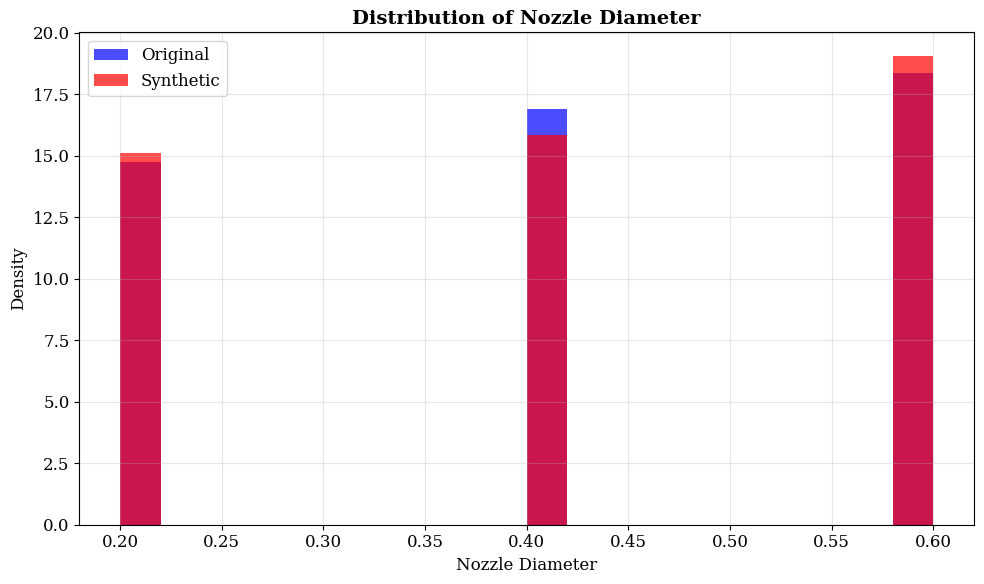

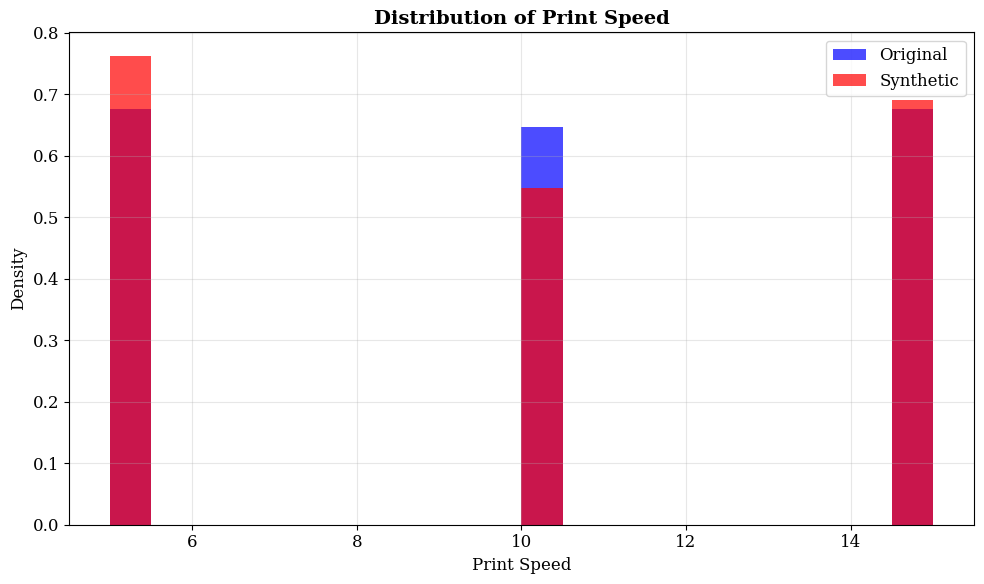

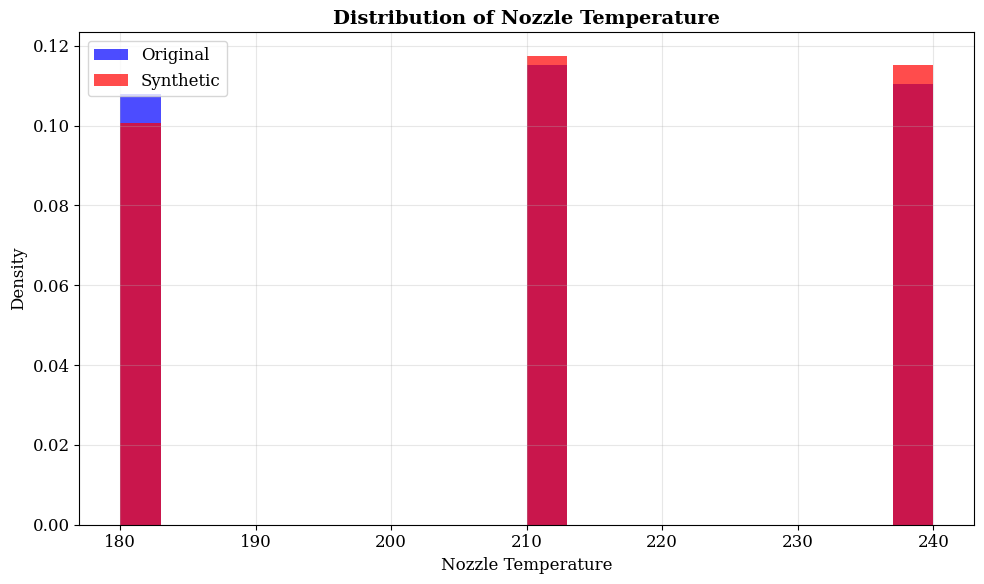

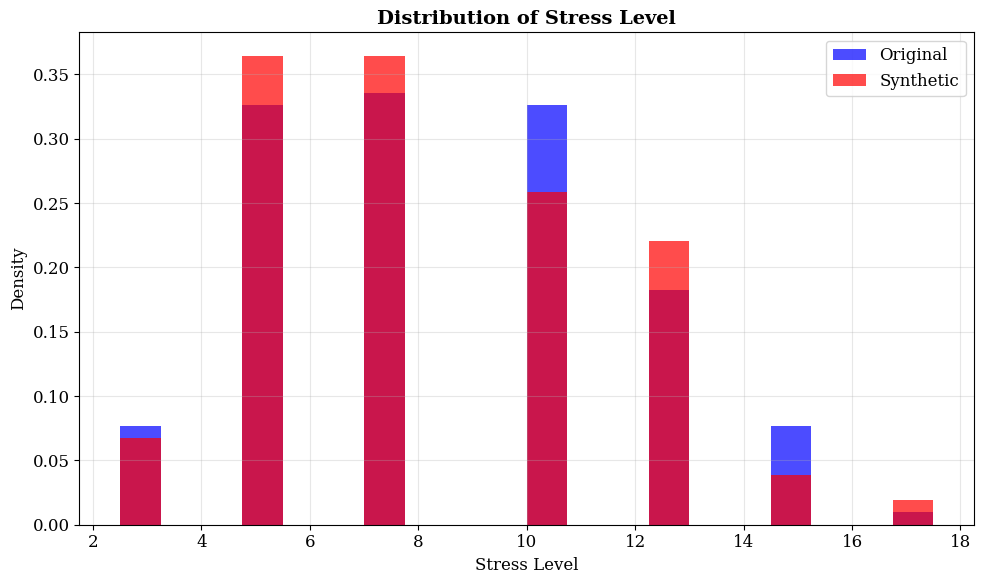

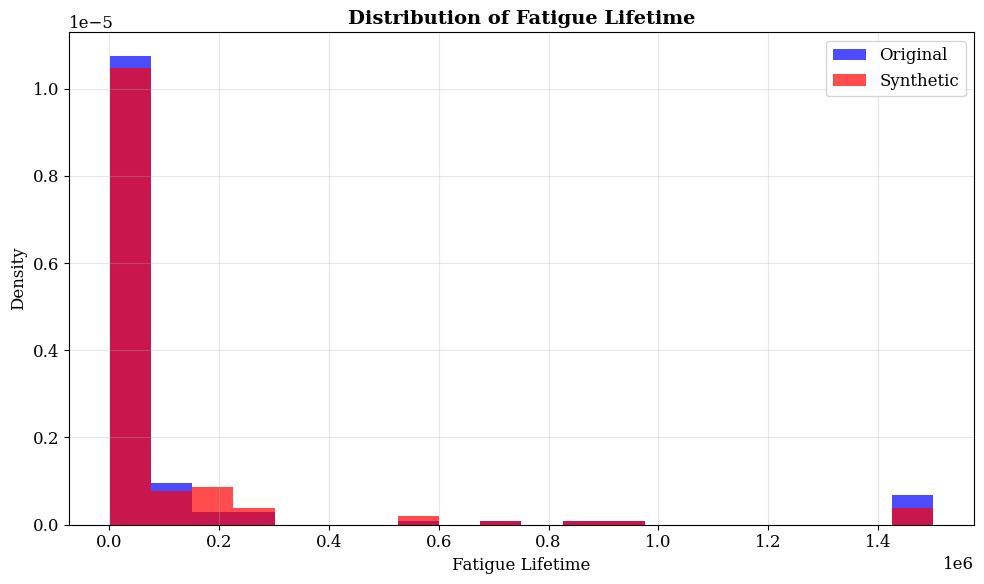


=== STATISTICAL TESTS FOR DISTRIBUTION SIMILARITY ===

Nozzle Diameter:
  KS Test - Statistic: 0.0144, p-value: 1.0000
  T-test - Statistic: -0.0732, p-value: 0.9417
  Mann-Whitney U - Statistic: 9606.5000, p-value: 0.9324
  Original Mean: 0.41 ± 0.16
  Synthetic Mean: 0.42 ± 0.17

Print Speed:
  KS Test - Statistic: 0.0432, p-value: 0.9995
  T-test - Statistic: 0.3569, p-value: 0.7214
  Mann-Whitney U - Statistic: 9890.5000, p-value: 0.7162
  Original Mean: 10.00 ± 4.13
  Synthetic Mean: 9.82 ± 4.27

Nozzle Temperature:
  KS Test - Statistic: 0.0216, p-value: 1.0000
  T-test - Statistic: -0.3706, p-value: 0.7112
  Mann-Whitney U - Statistic: 9427.0000, p-value: 0.7122
  Original Mean: 210.22 ± 24.36
  Synthetic Mean: 211.29 ± 24.19

Stress Level:
  KS Test - Statistic: 0.0432, p-value: 0.9995
  T-test - Statistic: 0.4064, p-value: 0.6848
  Mann-Whitney U - Statistic: 9959.5000, p-value: 0.6478
  Original Mean: 8.40 ± 3.34
  Synthetic Mean: 8.24 ± 3.30

Fatigue Lifetime:
  KS Test - S

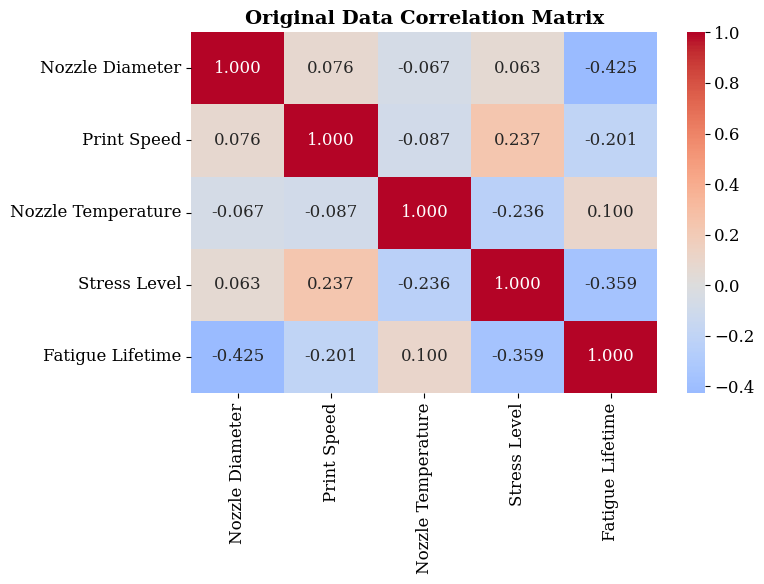

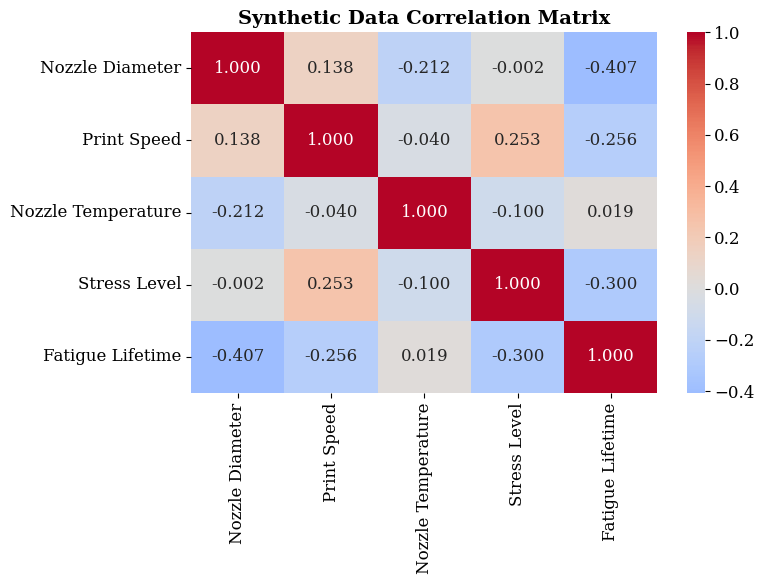

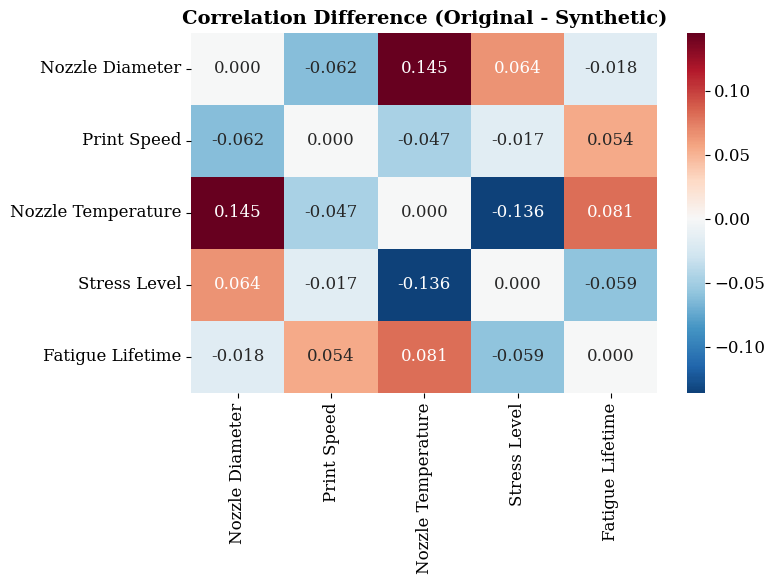

Correlation Matrix Difference (Original - Synthetic):
                    Nozzle Diameter  Print Speed  Nozzle Temperature  \
Nozzle Diameter              0.0000      -0.0619              0.1453   
Print Speed                 -0.0619       0.0000             -0.0467   
Nozzle Temperature           0.1453      -0.0467              0.0000   
Stress Level                 0.0644      -0.0166             -0.1359   
Fatigue Lifetime            -0.0180       0.0543              0.0807   

                    Stress Level  Fatigue Lifetime  
Nozzle Diameter           0.0644           -0.0180  
Print Speed              -0.0166            0.0543  
Nozzle Temperature       -0.1359            0.0807  
Stress Level              0.0000           -0.0587  
Fatigue Lifetime         -0.0587            0.0000  

=== FATIGUE LIFETIME ANALYSIS ===


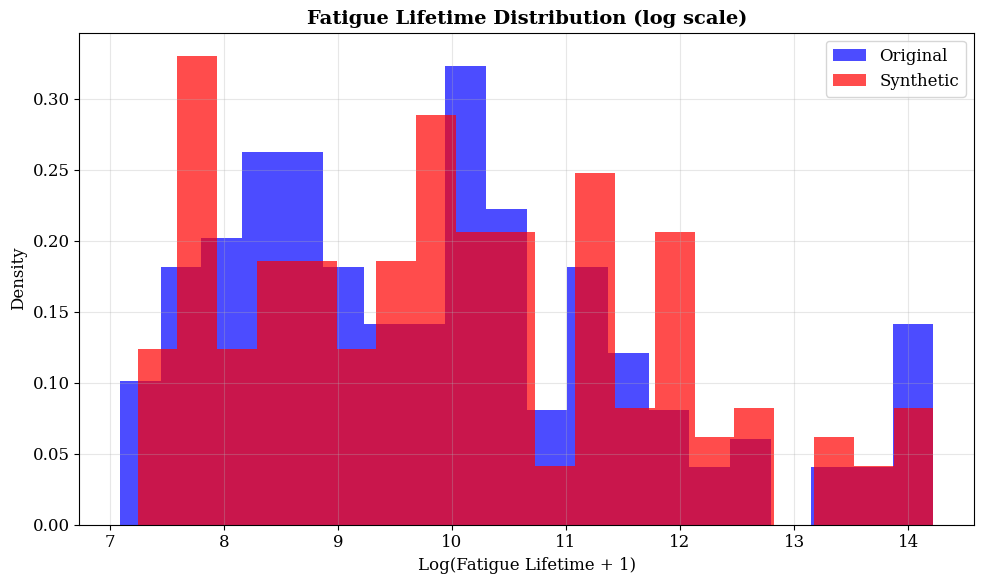

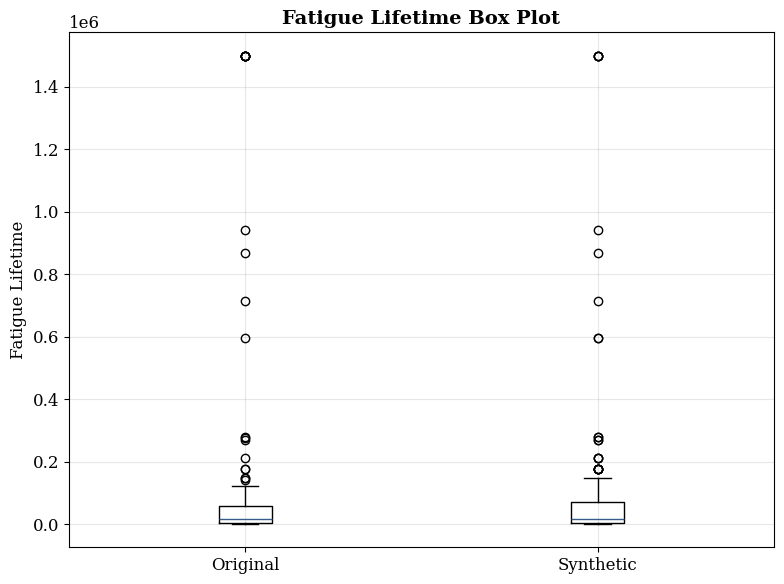

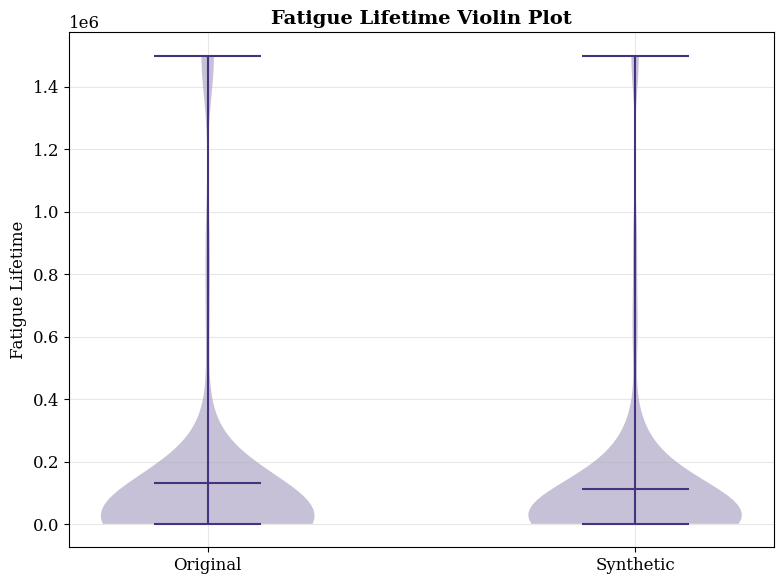

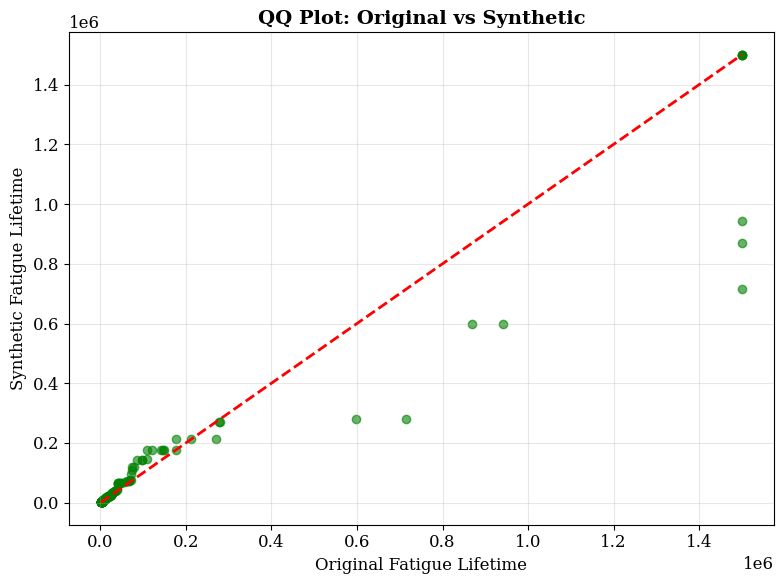

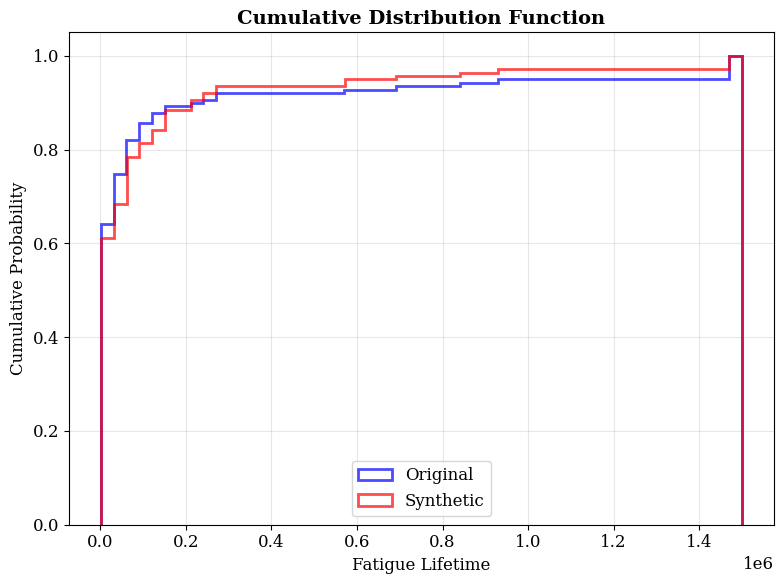

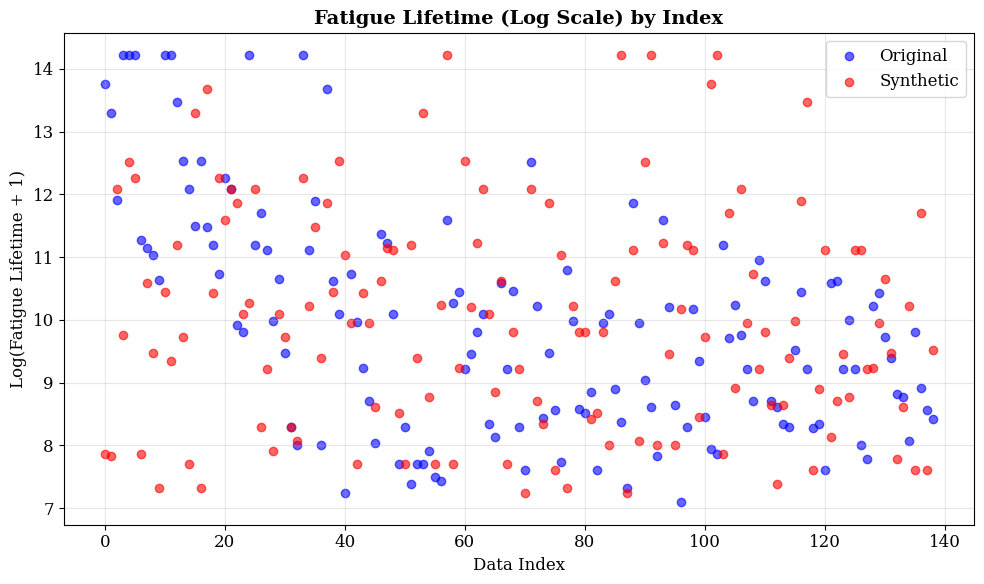


=== MULTIVARIATE ANALYSIS ===


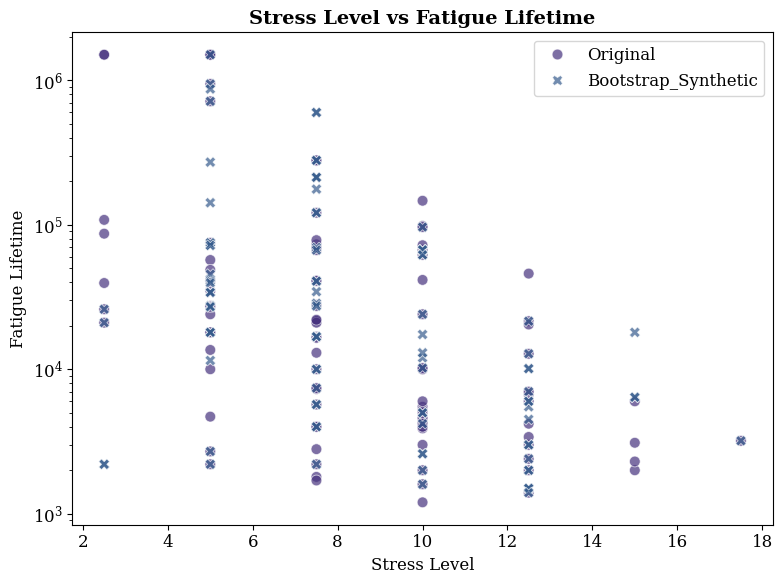

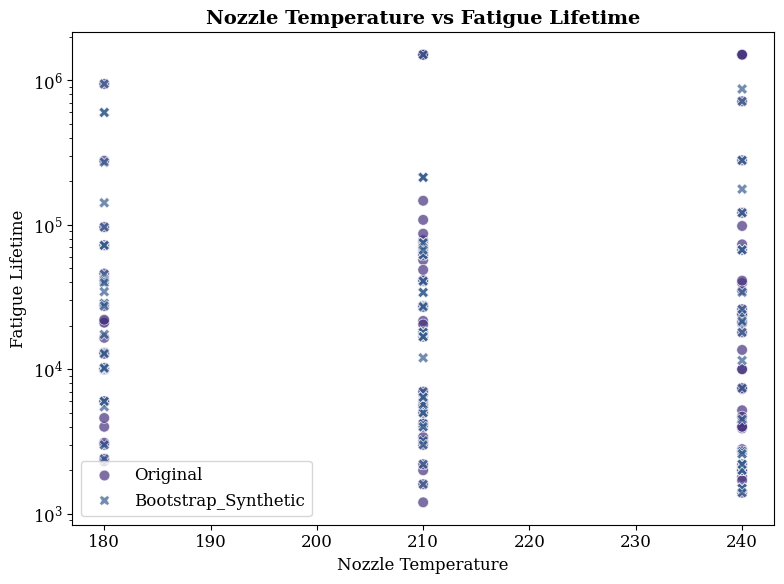

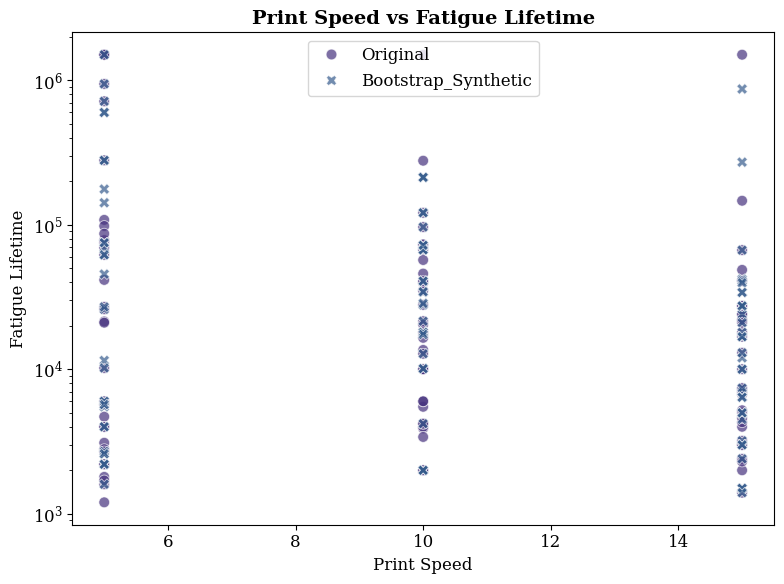

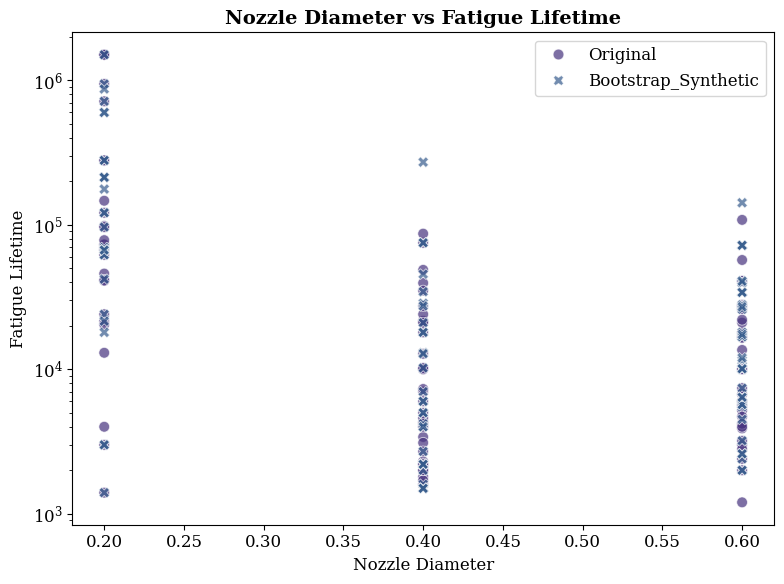

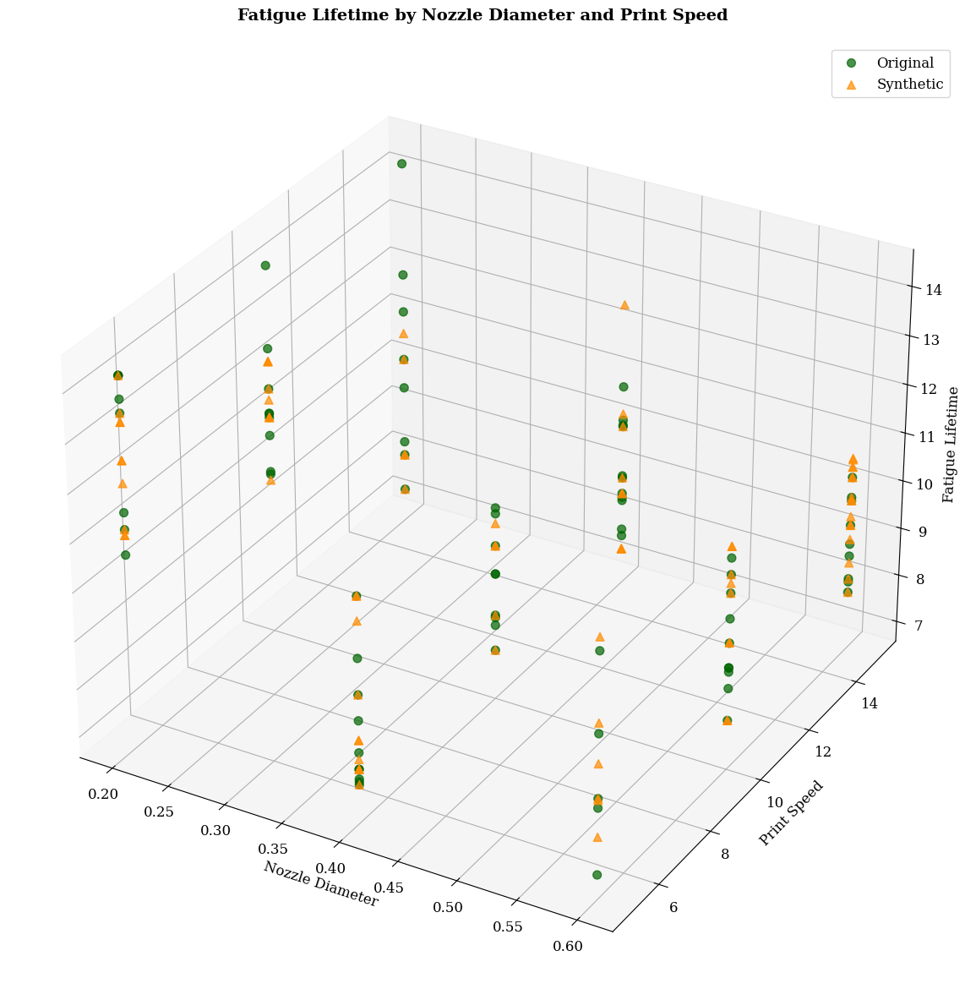

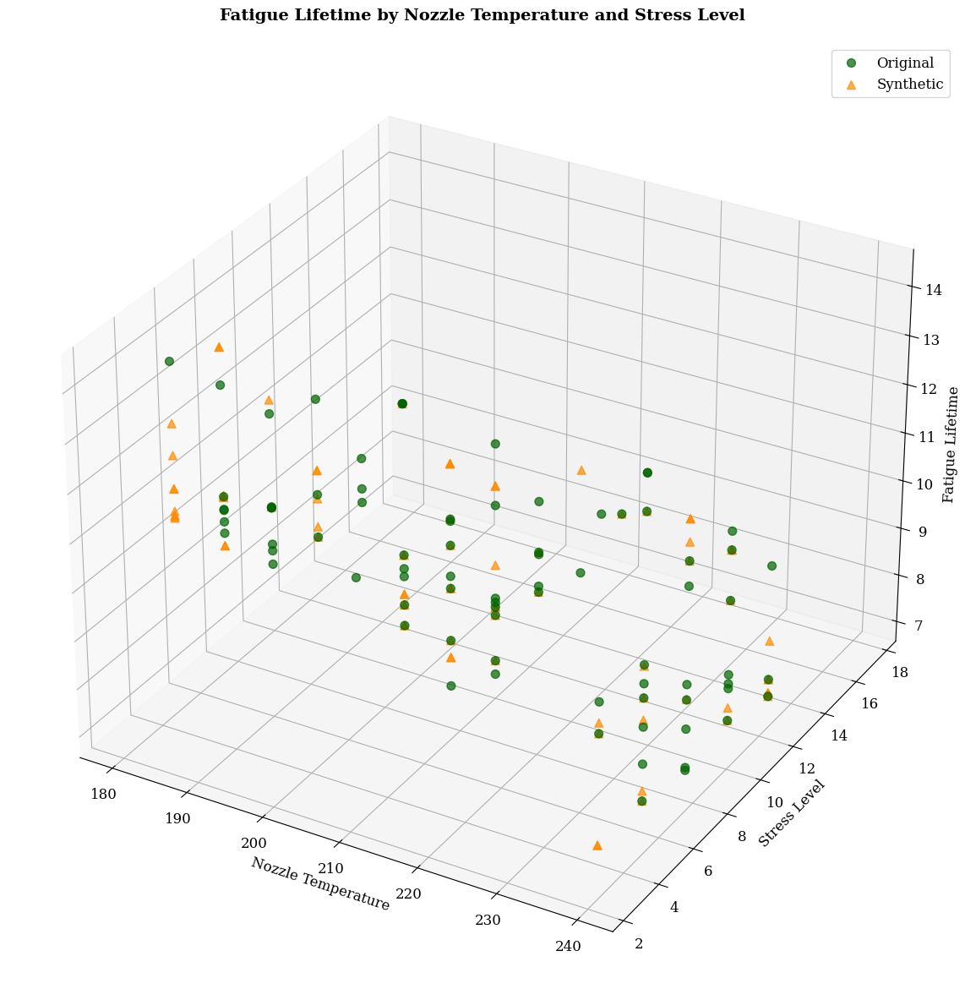


=== SYNTHETIC DATA QUALITY METRICS ===
Synthetic Data Quality Metrics:
                    Mean_Preservation_Rate  Std_Preservation_Rate  \
Nozzle Diameter                     0.9965                 0.9845   
Print Speed                         0.9820                 0.9644   
Nozzle Temperature                  0.9949                 0.9931   
Stress Level                        0.9807                 0.9896   
Fatigue Lifetime                    0.8654                 0.8159   

                    Median_Preservation_Rate  KS_Statistic  Effect_Size  \
Nozzle Diameter                          1.0        0.0144       0.0088   
Print Speed                              1.0        0.0432      -0.0436   
Nozzle Temperature                       1.0        0.0216       0.0443   
Stress Level                             1.0        0.0432      -0.0485   
Fatigue Lifetime                         1.0        0.0719      -0.0511   

                    Coverage_Rate  
Nozzle Diameter           

In [ ]:
# Step 1: Install required packages (if needed)
!pip install seaborn scipy

# Step 2: Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import ks_2samp, ttest_ind
import warnings
warnings.filterwarnings('ignore')

# Set global font to a common available font
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['DejaVu Serif', 'Times New Roman', 'Liberation Serif']
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12

# Step 3: Load and explore the data
df = pd.read_csv('combined_bootstrap_fatigue.csv')

# Display basic info
print("=== DATASET OVERVIEW ===")
print("Dataset Shape:", df.shape)
print("\nFirst few rows:")
print(df.head())
print("\nData Source distribution:")
print(df['Data_Source'].value_counts())
print("\n" + "="*50)

# Step 4: Basic Data Exploration
print("\n=== BASIC DATA EXPLORATION ===")
print("Basic Statistics:")
print(df.describe())

print("\nMissing Values:")
print(df.isnull().sum())

print("\nData Types:")
print(df.dtypes)

# Step 5: Separate the data
original_data = df[df['Data_Source'] == 'Original']
synthetic_data = df[df['Data_Source'] == 'Bootstrap_Synthetic']

print(f"\nOriginal data points: {len(original_data)}")
print(f"Synthetic data points: {len(synthetic_data)}")

# Step 6: Distribution Comparison - SEPARATE PLOTS
print("\n=== DISTRIBUTION COMPARISON ===")
numerical_cols = ['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level', 'Fatigue Lifetime']

# Create individual distribution plots
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    plt.hist(original_data[col], alpha=0.7, label='Original', bins=20, color='blue', density=True)
    plt.hist(synthetic_data[col], alpha=0.7, label='Synthetic', bins=20, color='red', density=True)
    plt.title(f'Distribution of {col}', fontsize=14, fontweight='bold')
    plt.legend()
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Step 7: Statistical Tests for Comparison
print("\n=== STATISTICAL TESTS FOR DISTRIBUTION SIMILARITY ===")
print("=" * 60)

statistical_results = []
for col in numerical_cols:
    # Kolmogorov-Smirnov test
    ks_stat, ks_pvalue = ks_2samp(original_data[col], synthetic_data[col])

    # T-test for means
    t_stat, t_pvalue = ttest_ind(original_data[col], synthetic_data[col])

    # Mann-Whitney U test (non-parametric)
    u_stat, u_pvalue = stats.mannwhitneyu(original_data[col], synthetic_data[col])

    print(f"\n{col}:")
    print(f"  KS Test - Statistic: {ks_stat:.4f}, p-value: {ks_pvalue:.4f}")
    print(f"  T-test - Statistic: {t_stat:.4f}, p-value: {t_pvalue:.4f}")
    print(f"  Mann-Whitney U - Statistic: {u_stat:.4f}, p-value: {u_pvalue:.4f}")
    print(f"  Original Mean: {original_data[col].mean():.2f} ± {original_data[col].std():.2f}")
    print(f"  Synthetic Mean: {synthetic_data[col].mean():.2f} ± {synthetic_data[col].std():.2f}")

    statistical_results.append({
        'Variable': col,
        'KS_Statistic': ks_stat,
        'KS_pvalue': ks_pvalue,
        'T_Statistic': t_stat,
        'T_pvalue': t_pvalue,
        'U_Statistic': u_stat,
        'U_pvalue': u_pvalue
    })

# Step 8: Range Comparison
print("\n=== RANGE COMPARISON: ORIGINAL vs SYNTHETIC ===")
print("=" * 70)

range_comparison = []
for col in numerical_cols:
    orig_min = original_data[col].min()
    orig_max = original_data[col].max()
    orig_range = orig_max - orig_min
    orig_iqr = original_data[col].quantile(0.75) - original_data[col].quantile(0.25)

    synth_min = synthetic_data[col].min()
    synth_max = synthetic_data[col].max()
    synth_range = synth_max - synth_min
    synth_iqr = synthetic_data[col].quantile(0.75) - synthetic_data[col].quantile(0.25)

    range_diff = synth_range - orig_range
    range_ratio = synth_range / orig_range if orig_range != 0 else np.nan
    iqr_ratio = synth_iqr / orig_iqr if orig_iqr != 0 else np.nan

    range_comparison.append({
        'Variable': col,
        'Original_Min': orig_min,
        'Original_Max': orig_max,
        'Original_Range': orig_range,
        'Synthetic_Min': synth_min,
        'Synthetic_Max': synth_max,
        'Synthetic_Range': synth_range,
        'Range_Difference': range_diff,
        'Range_Ratio': range_ratio,
        'IQR_Ratio': iqr_ratio
    })

range_df = pd.DataFrame(range_comparison)
print(range_df.round(4))

# Step 9: Correlation Analysis - SEPARATE PLOTS
print("\n=== CORRELATION ANALYSIS ===")

# Original data correlation
plt.figure(figsize=(8, 6))
orig_corr = original_data[numerical_cols].corr()
sns.heatmap(orig_corr, annot=True, cmap='coolwarm', center=0, fmt='.3f')
plt.title('Original Data Correlation Matrix', fontweight='bold')
plt.tight_layout()
plt.show()

# Synthetic data correlation
plt.figure(figsize=(8, 6))
synth_corr = synthetic_data[numerical_cols].corr()
sns.heatmap(synth_corr, annot=True, cmap='coolwarm', center=0, fmt='.3f')
plt.title('Synthetic Data Correlation Matrix', fontweight='bold')
plt.tight_layout()
plt.show()

# Correlation difference
plt.figure(figsize=(8, 6))
corr_diff = orig_corr - synth_corr
sns.heatmap(corr_diff, annot=True, cmap='RdBu_r', center=0, fmt='.3f')
plt.title('Correlation Difference (Original - Synthetic)', fontweight='bold')
plt.tight_layout()
plt.show()

print("Correlation Matrix Difference (Original - Synthetic):")
print(corr_diff.round(4))

# Step 10: Fatigue Lifetime Analysis - SEPARATE PLOTS
print("\n=== FATIGUE LIFETIME ANALYSIS ===")

# Distribution comparison (log scale)
plt.figure(figsize=(10, 6))
plt.hist(np.log1p(original_data['Fatigue Lifetime']), alpha=0.7, label='Original', bins=20, color='blue', density=True)
plt.hist(np.log1p(synthetic_data['Fatigue Lifetime']), alpha=0.7, label='Synthetic', bins=20, color='red', density=True)
plt.title('Fatigue Lifetime Distribution (log scale)', fontweight='bold')
plt.legend()
plt.xlabel('Log(Fatigue Lifetime + 1)')
plt.ylabel('Density')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Box plot
plt.figure(figsize=(8, 6))
box_data = [original_data['Fatigue Lifetime'], synthetic_data['Fatigue Lifetime']]
plt.boxplot(box_data, labels=['Original', 'Synthetic'])
plt.title('Fatigue Lifetime Box Plot', fontweight='bold')
plt.ylabel('Fatigue Lifetime')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Violin plot
plt.figure(figsize=(8, 6))
violin_data = [original_data['Fatigue Lifetime'], synthetic_data['Fatigue Lifetime']]
plt.violinplot(violin_data, showmeans=True)
plt.xticks([1, 2], ['Original', 'Synthetic'])
plt.title('Fatigue Lifetime Violin Plot', fontweight='bold')
plt.ylabel('Fatigue Lifetime')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# QQ plot
plt.figure(figsize=(8, 6))
sorted_orig = np.sort(original_data['Fatigue Lifetime'])
sorted_synth = np.sort(synthetic_data['Fatigue Lifetime'])
min_len = min(len(sorted_orig), len(sorted_synth))
plt.scatter(sorted_orig[:min_len], sorted_synth[:min_len], alpha=0.6, color='green')
plt.plot([sorted_orig.min(), sorted_orig.max()], [sorted_orig.min(), sorted_orig.max()], 'r--', linewidth=2)
plt.xlabel('Original Fatigue Lifetime')
plt.ylabel('Synthetic Fatigue Lifetime')
plt.title('QQ Plot: Original vs Synthetic', fontweight='bold')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Cumulative distribution
plt.figure(figsize=(8, 6))
plt.hist(original_data['Fatigue Lifetime'], cumulative=True, density=True,
         alpha=0.7, label='Original', bins=50, histtype='step', linewidth=2, color='blue')
plt.hist(synthetic_data['Fatigue Lifetime'], cumulative=True, density=True,
         alpha=0.7, label='Synthetic', bins=50, histtype='step', linewidth=2, color='red')
plt.title('Cumulative Distribution Function', fontweight='bold')
plt.xlabel('Fatigue Lifetime')
plt.ylabel('Cumulative Probability')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Log-scale scatter
plt.figure(figsize=(10, 6))
plt.scatter(range(len(original_data)), np.log1p(original_data['Fatigue Lifetime']),
           alpha=0.6, label='Original', color='blue')
plt.scatter(range(len(synthetic_data)), np.log1p(synthetic_data['Fatigue Lifetime']),
           alpha=0.6, label='Synthetic', color='red')
plt.title('Fatigue Lifetime (Log Scale) by Index', fontweight='bold')
plt.xlabel('Data Index')
plt.ylabel('Log(Fatigue Lifetime + 1)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Step 11: Multivariate Analysis - SEPARATE PLOTS
print("\n=== MULTIVARIATE ANALYSIS ===")

# Prepare sample data
sample_orig = original_data.sample(min(100, len(original_data)), random_state=42)
sample_synth = synthetic_data.sample(min(100, len(synthetic_data)), random_state=42)
comparison_sample = pd.concat([sample_orig, sample_synth])

# Stress Level vs Fatigue Lifetime
plt.figure(figsize=(8, 6))
sns.scatterplot(data=comparison_sample, x='Stress Level', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Stress Level vs Fatigue Lifetime', fontweight='bold')
plt.yscale('log')
plt.legend()
plt.tight_layout()
plt.show()

# Nozzle Temperature vs Fatigue Lifetime
plt.figure(figsize=(8, 6))
sns.scatterplot(data=comparison_sample, x='Nozzle Temperature', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Nozzle Temperature vs Fatigue Lifetime', fontweight='bold')
plt.yscale('log')
plt.legend()
plt.tight_layout()
plt.show()

# Print Speed vs Fatigue Lifetime
plt.figure(figsize=(8, 6))
sns.scatterplot(data=comparison_sample, x='Print Speed', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Print Speed vs Fatigue Lifetime', fontweight='bold')
plt.yscale('log')
plt.legend()
plt.tight_layout()
plt.show()

# Nozzle Diameter vs Fatigue Lifetime
plt.figure(figsize=(8, 6))
sns.scatterplot(data=comparison_sample, x='Nozzle Diameter', y='Fatigue Lifetime',
                hue='Data_Source', style='Data_Source', alpha=0.7, s=60)
plt.title('Nozzle Diameter vs Fatigue Lifetime', fontweight='bold')
plt.yscale('log')
plt.legend()
plt.tight_layout()
plt.show()

# 3D scatter plots - UPDATED WITH NEW COLORS AND FIXED LAYOUT
from mpl_toolkits.mplot3d import Axes3D

# First 3D plot - UPDATED
fig = plt.figure(figsize=(16, 12))  # Increased figure size
ax1 = fig.add_subplot(111, projection='3d')
sample_size = min(80, len(original_data), len(synthetic_data))
orig_sample = original_data.sample(sample_size, random_state=42)
synth_sample = synthetic_data.sample(sample_size, random_state=42)

sc1 = ax1.scatter(orig_sample['Nozzle Diameter'], orig_sample['Print Speed'],
           np.log1p(orig_sample['Fatigue Lifetime']),
           c='darkgreen', label='Original', alpha=0.7, s=50, depthshade=True)
sc2 = ax1.scatter(synth_sample['Nozzle Diameter'], synth_sample['Print Speed'],
           np.log1p(synth_sample['Fatigue Lifetime']),
           c='darkorange', label='Synthetic', alpha=0.7, s=50, marker='^', depthshade=True)

ax1.set_xlabel('Nozzle Diameter')
ax1.set_ylabel('Print Speed')
ax1.set_zlabel('Fatigue Lifetime')
ax1.set_title('Fatigue Lifetime by Nozzle Diameter and Print Speed', fontweight='bold', pad=20)
ax1.legend()
plt.tight_layout()
plt.subplots_adjust(right=0.9)  # Adjust right margin
plt.show()

# Second 3D plot - UPDATED
fig = plt.figure(figsize=(16, 12))  # Increased figure size
ax2 = fig.add_subplot(111, projection='3d')
sc3 = ax2.scatter(orig_sample['Nozzle Temperature'], orig_sample['Stress Level'],
           np.log1p(orig_sample['Fatigue Lifetime']),
           c='darkgreen', label='Original', alpha=0.7, s=50, depthshade=True)
sc4 = ax2.scatter(synth_sample['Nozzle Temperature'], synth_sample['Stress Level'],
           np.log1p(synth_sample['Fatigue Lifetime']),
           c='darkorange', label='Synthetic', alpha=0.7, s=50, marker='^', depthshade=True)

ax2.set_xlabel('Nozzle Temperature')
ax2.set_ylabel('Stress Level')
ax2.set_zlabel('Fatigue Lifetime')
ax2.set_title('Fatigue Lifetime by Nozzle Temperature and Stress Level', fontweight='bold', pad=20)
ax2.legend()
plt.tight_layout()
plt.subplots_adjust(right=0.9)  # Adjust right margin
plt.show()

# Step 12: Quality Metrics for Synthetic Data
print("\n=== SYNTHETIC DATA QUALITY METRICS ===")

def calculate_synthetic_quality_metrics(original, synthetic, numerical_cols):
    """Calculate various quality metrics for synthetic data"""

    metrics = {}

    for col in numerical_cols:
        # Basic statistics preservation
        orig_mean = original[col].mean()
        synth_mean = synthetic[col].mean()
        mean_preservation = abs(synth_mean - orig_mean) / orig_mean if orig_mean != 0 else abs(synth_mean - orig_mean)

        orig_std = original[col].std()
        synth_std = synthetic[col].std()
        std_preservation = abs(synth_std - orig_std) / orig_std if orig_std != 0 else abs(synth_std - orig_std)

        orig_median = original[col].median()
        synth_median = synthetic[col].median()
        median_preservation = abs(synth_median - orig_median) / orig_median if orig_median != 0 else abs(synth_median - orig_median)

        metrics[col] = {
            'Mean_Preservation_Rate': 1 - mean_preservation,
            'Std_Preservation_Rate': 1 - std_preservation,
            'Median_Preservation_Rate': 1 - median_preservation,
            'KS_Statistic': stats.ks_2samp(original[col], synthetic[col])[0],
            'Effect_Size': (synth_mean - orig_mean) / orig_std if orig_std != 0 else 0,
            'Coverage_Rate': len(set(synthetic[col]) & set(original[col])) / len(set(original[col])) if len(set(original[col])) > 0 else 0
        }

    return pd.DataFrame(metrics).T

# Calculate quality metrics
quality_metrics = calculate_synthetic_quality_metrics(original_data, synthetic_data, numerical_cols)
print("Synthetic Data Quality Metrics:")
print(quality_metrics.round(4))

# Step 13: Summary Report
print("\n" + "="*80)
print("COMPREHENSIVE COMPARISON REPORT: ORIGINAL vs SYNTHETIC DATA")
print("="*80)

print(f"\n1. DATA VOLUME:")
print(f"   • Original samples: {len(original_data):,}")
print(f"   • Synthetic samples: {len(synthetic_data):,}")
print(f"   • Total samples: {len(df):,}")
print(f"   • Synthetic/Original ratio: {len(synthetic_data)/len(original_data):.2f}")

print(f"\n2. KEY STATISTICAL DIFFERENCES:")
fatigue_stats = range_df[range_df['Variable'] == 'Fatigue Lifetime'].iloc[0]
print(f"   • Fatigue Lifetime Range - Original: {fatigue_stats['Original_Range']:,.0f}")
print(f"   • Fatigue Lifetime Range - Synthetic: {fatigue_stats['Synthetic_Range']:,.0f}")
print(f"   • Range Preservation: {fatigue_stats['Range_Ratio']:.3f}")

print(f"\n3. DATA QUALITY ASSESSMENT:")
print(f"   • Average mean preservation rate: {quality_metrics['Mean_Preservation_Rate'].mean():.3f}")
print(f"   • Average std preservation rate: {quality_metrics['Std_Preservation_Rate'].mean():.3f}")
print(f"   • Average median preservation rate: {quality_metrics['Median_Preservation_Rate'].mean():.3f}")
print(f"   • Average KS statistic: {quality_metrics['KS_Statistic'].mean():.3f}")

print(f"\n4. CORRELATION PRESERVATION:")
corr_preservation = 1 - (corr_diff.abs().mean().mean())
print(f"   • Correlation preservation rate: {corr_preservation:.3f}")

print(f"\n5. RECOMMENDATIONS:")
recommendations = []

if quality_metrics.loc['Fatigue Lifetime', 'Mean_Preservation_Rate'] > 0.95:
    recommendations.append("✓ Synthetic data preserves key statistics well")
else:
    recommendations.append("⚠ Some statistical properties differ significantly")

if quality_metrics.loc['Fatigue Lifetime', 'KS_Statistic'] < 0.1:
    recommendations.append("✓ Distributions are very similar (low KS statistic)")
else:
    recommendations.append("⚠ Distributions show some differences")

if len(synthetic_data) >= len(original_data):
    recommendations.append("✓ Sufficient synthetic data generated")
else:
    recommendations.append("⚠ Consider generating more synthetic data")

if corr_preservation > 0.95:
    recommendations.append("✓ Correlation structure well preserved")
else:
    recommendations.append("⚠ Some correlation patterns differ")

for rec in recommendations:
    print(f"   {rec}")

print(f"\n6. OVERALL SYNTHETIC DATA QUALITY SCORE:")
overall_score = (
    quality_metrics['Mean_Preservation_Rate'].mean() * 0.3 +
    quality_metrics['Std_Preservation_Rate'].mean() * 0.3 +
    corr_preservation * 0.2 +
    (1 - quality_metrics['KS_Statistic'].mean()) * 0.2
) * 100

print(f"   • Overall Quality Score: {overall_score:.1f}%")

if overall_score >= 90:
    print("   • Rating: EXCELLENT")
elif overall_score >= 80:
    print("   • Rating: GOOD")
elif overall_score >= 70:
    print("   • Rating: FAIR")
else:
    print("   • Rating: NEEDS IMPROVEMENT")

print("\n" + "="*80)

# Step 14: Save the analysis results
print("\nSaving analysis results...")

# Create a summary dataframe
summary_results = pd.DataFrame({
    'Metric': [
        'Original_Samples', 'Synthetic_Samples', 'Total_Samples',
        'Synthetic_Original_Ratio', 'Overall_Quality_Score',
        'Mean_Preservation_Rate', 'Std_Preservation_Rate',
        'Correlation_Preservation', 'Average_KS_Statistic'
    ],
    'Value': [
        len(original_data), len(synthetic_data), len(df),
        len(synthetic_data)/len(original_data), overall_score,
        quality_metrics['Mean_Preservation_Rate'].mean(),
        quality_metrics['Std_Preservation_Rate'].mean(),
        corr_preservation,
        quality_metrics['KS_Statistic'].mean()
    ]
})

print("\nSummary Results:")
print(summary_results.round(4))

print("\n=== ANALYSIS COMPLETE ===")

#plots (grey color)

Times New Roman not found. Using DejaVu Serif instead.
Using '^' marker for synthetic data points
=== DATASET OVERVIEW ===
Dataset Shape: (278, 6)

First few rows:
   Nozzle Diameter  Print Speed  Nozzle Temperature  Stress Level  \
0              0.2            5                 180           5.0   
1              0.2            5                 180           7.5   
2              0.2            5                 180          10.0   
3              0.2            5                 210           2.5   
4              0.2            5                 210           5.0   

   Fatigue Lifetime Data_Source  
0            942000    Original  
1            597800    Original  
2            148900    Original  
3           1500000    Original  
4           1500000    Original  

Data Source distribution:
Data_Source
Original               139
Bootstrap_Synthetic    139
Name: count, dtype: int64


=== BASIC DATA EXPLORATION ===
Basic Statistics:
       Nozzle Diameter  Print Speed  Nozzle Tem

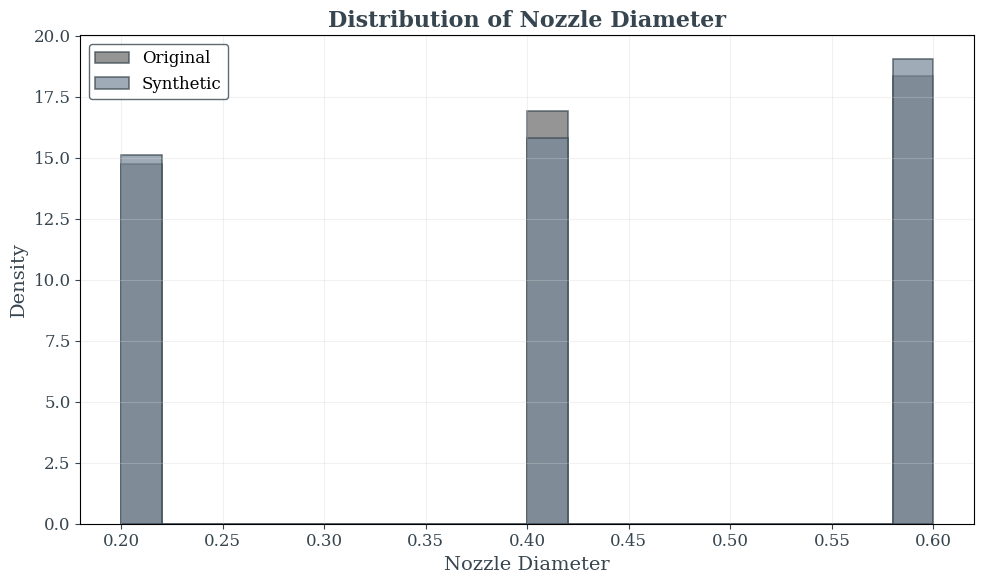

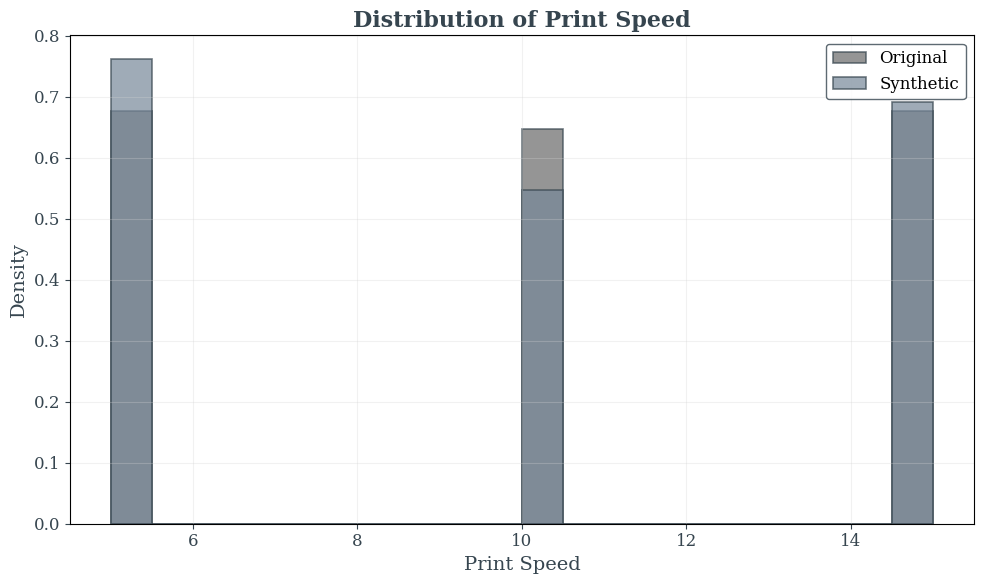

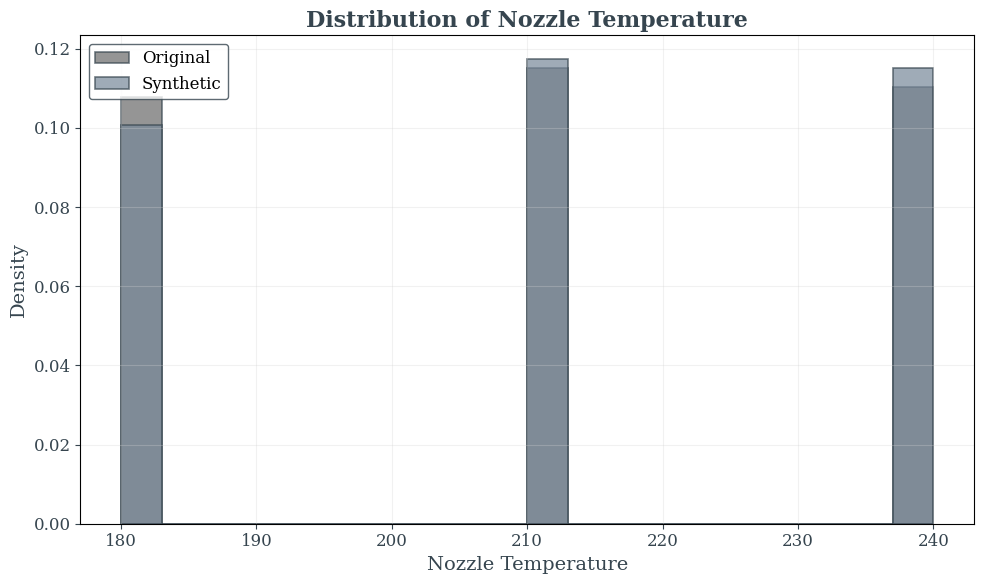

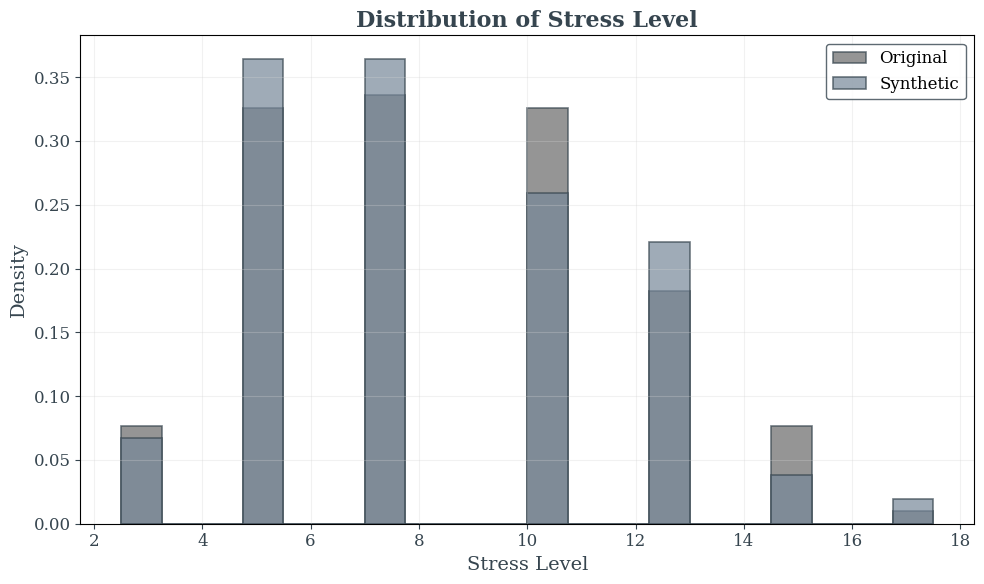

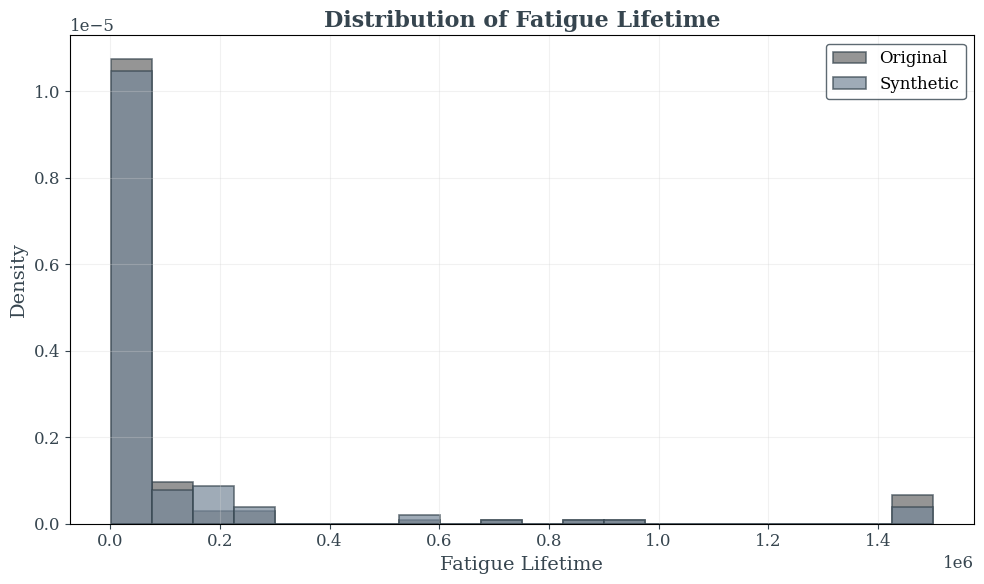


=== STATISTICAL TESTS FOR DISTRIBUTION SIMILARITY ===

Nozzle Diameter:
  KS Test - Statistic: 0.0144, p-value: 1.0000
  T-test - Statistic: -0.0732, p-value: 0.9417
  Mann-Whitney U - Statistic: 9606.5000, p-value: 0.9324
  Original Mean: 0.41 ± 0.16
  Synthetic Mean: 0.42 ± 0.17

Print Speed:
  KS Test - Statistic: 0.0432, p-value: 0.9995
  T-test - Statistic: 0.3569, p-value: 0.7214
  Mann-Whitney U - Statistic: 9890.5000, p-value: 0.7162
  Original Mean: 10.00 ± 4.13
  Synthetic Mean: 9.82 ± 4.27

Nozzle Temperature:
  KS Test - Statistic: 0.0216, p-value: 1.0000
  T-test - Statistic: -0.3706, p-value: 0.7112
  Mann-Whitney U - Statistic: 9427.0000, p-value: 0.7122
  Original Mean: 210.22 ± 24.36
  Synthetic Mean: 211.29 ± 24.19

Stress Level:
  KS Test - Statistic: 0.0432, p-value: 0.9995
  T-test - Statistic: 0.4064, p-value: 0.6848
  Mann-Whitney U - Statistic: 9959.5000, p-value: 0.6478
  Original Mean: 8.40 ± 3.34
  Synthetic Mean: 8.24 ± 3.30

Fatigue Lifetime:
  KS Test - S

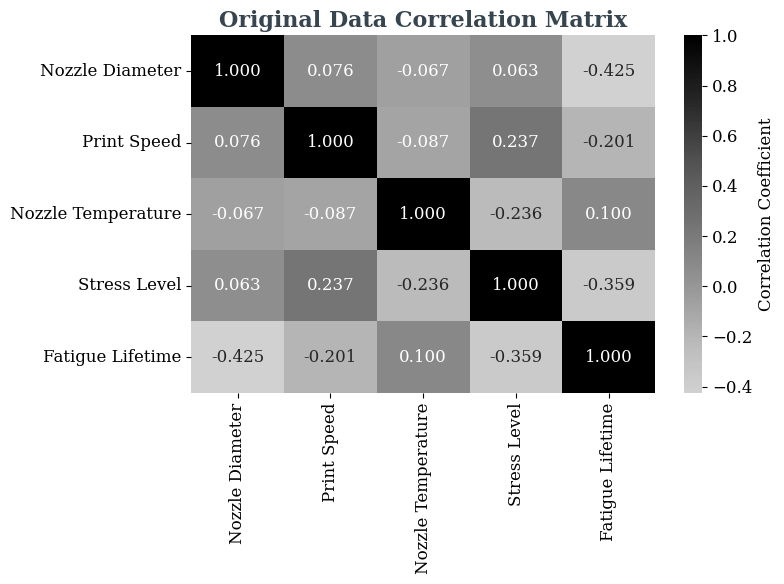

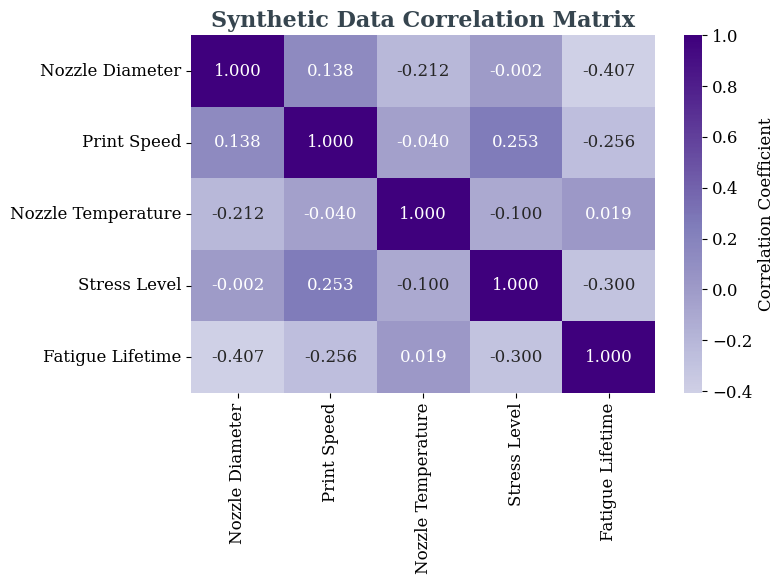

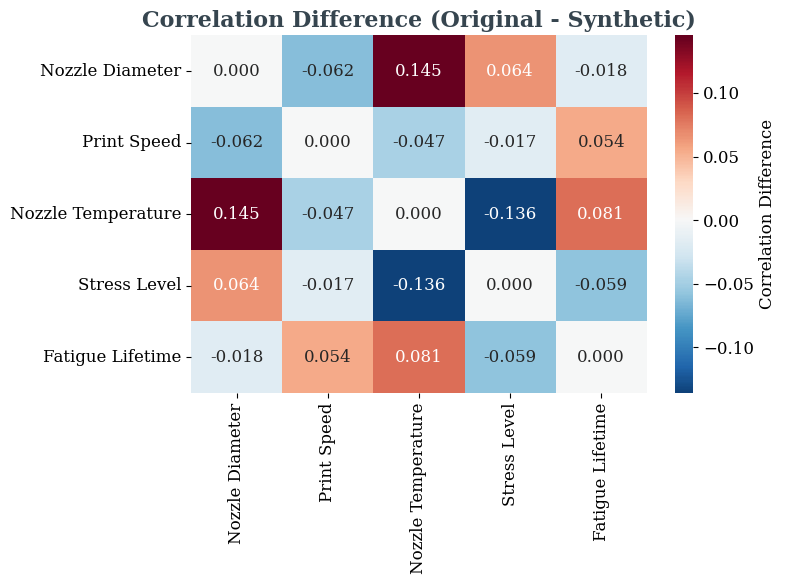

Correlation Matrix Difference (Original - Synthetic):
                    Nozzle Diameter  Print Speed  Nozzle Temperature  \
Nozzle Diameter              0.0000      -0.0619              0.1453   
Print Speed                 -0.0619       0.0000             -0.0467   
Nozzle Temperature           0.1453      -0.0467              0.0000   
Stress Level                 0.0644      -0.0166             -0.1359   
Fatigue Lifetime            -0.0180       0.0543              0.0807   

                    Stress Level  Fatigue Lifetime  
Nozzle Diameter           0.0644           -0.0180  
Print Speed              -0.0166            0.0543  
Nozzle Temperature       -0.1359            0.0807  
Stress Level              0.0000           -0.0587  
Fatigue Lifetime         -0.0587            0.0000  

=== FATIGUE LIFETIME ANALYSIS - INDIVIDUAL PLOTS ===


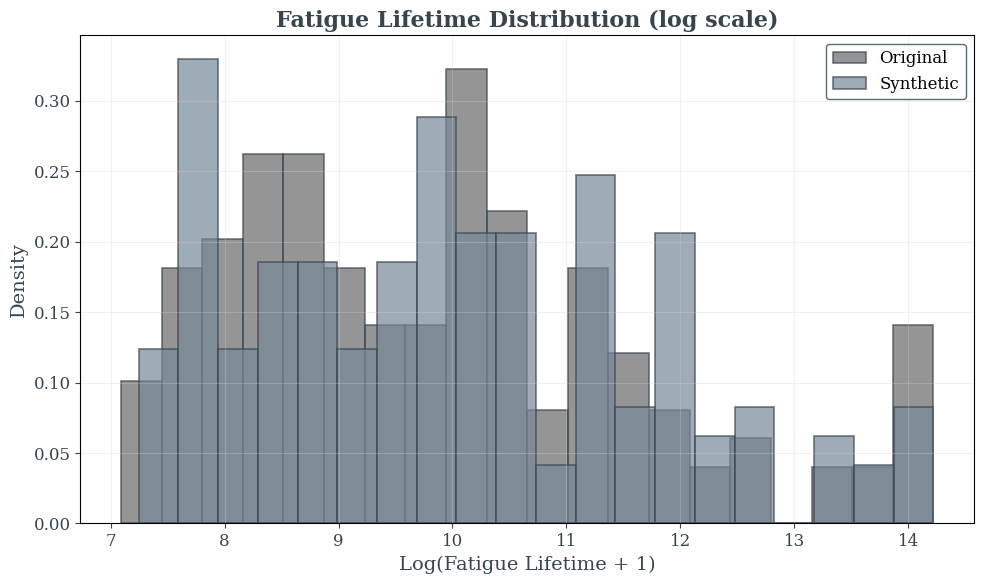

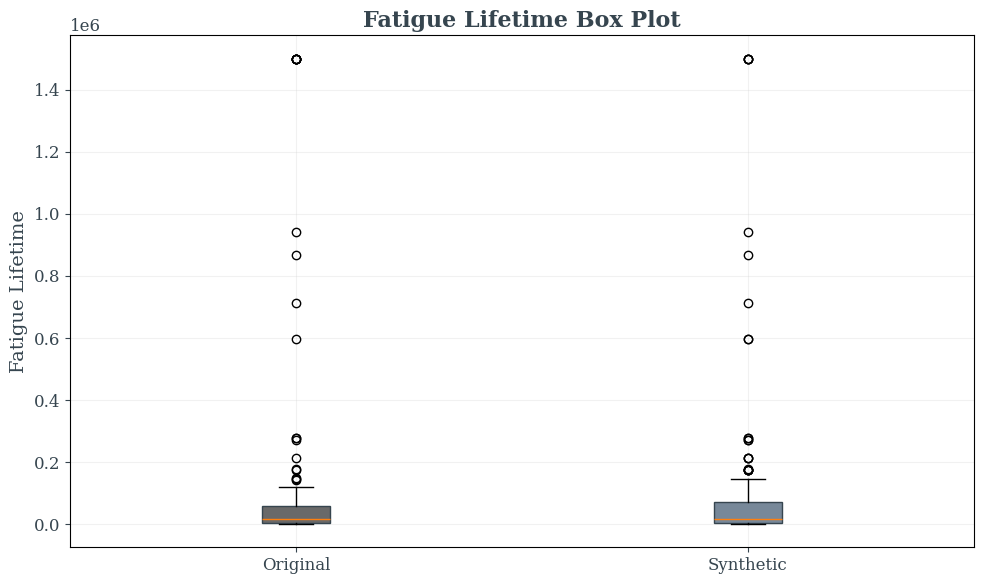

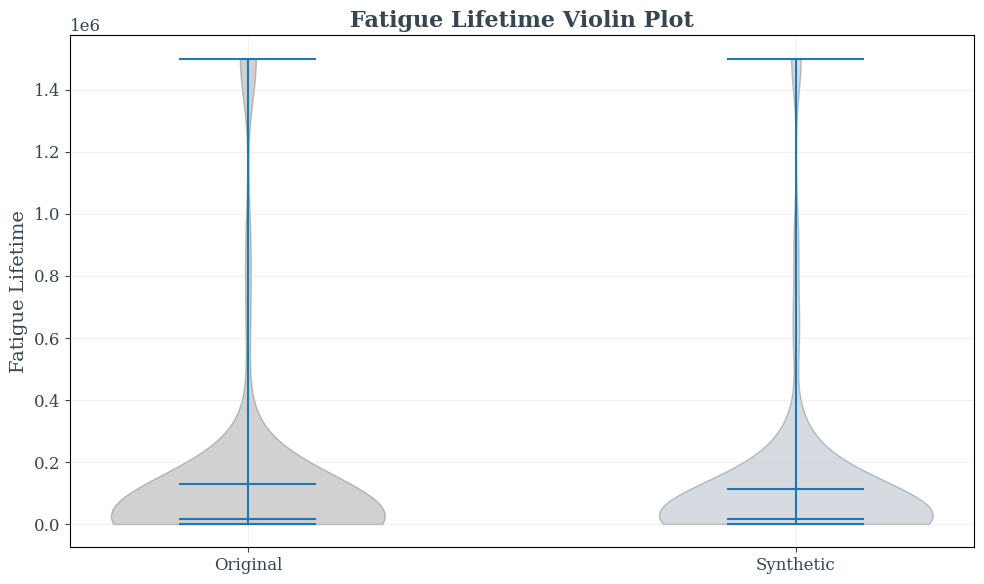

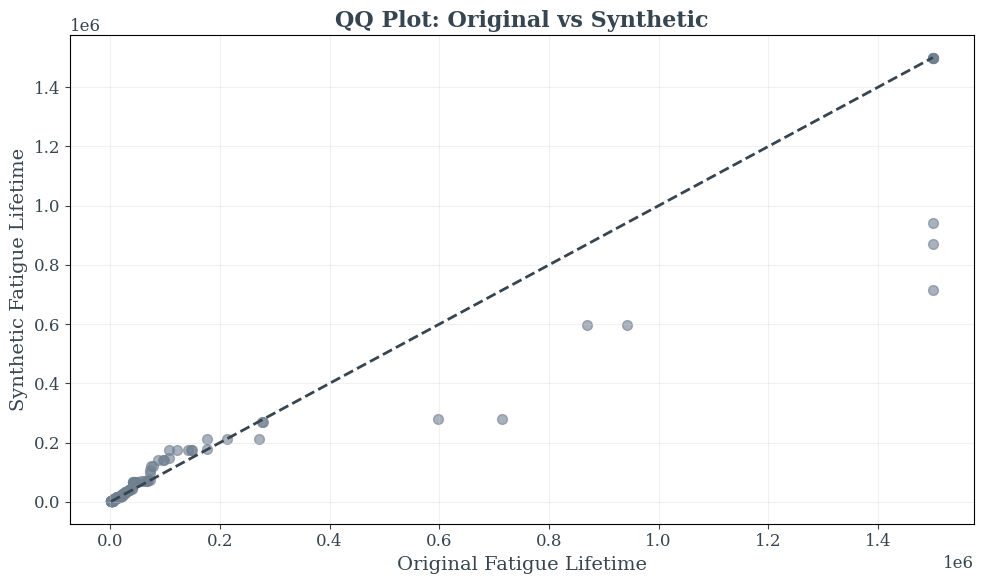

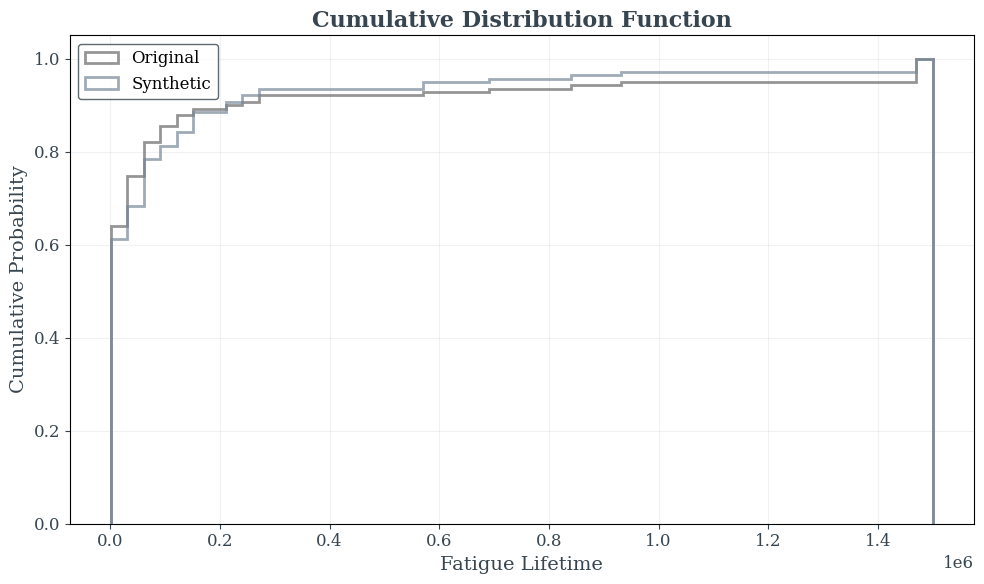

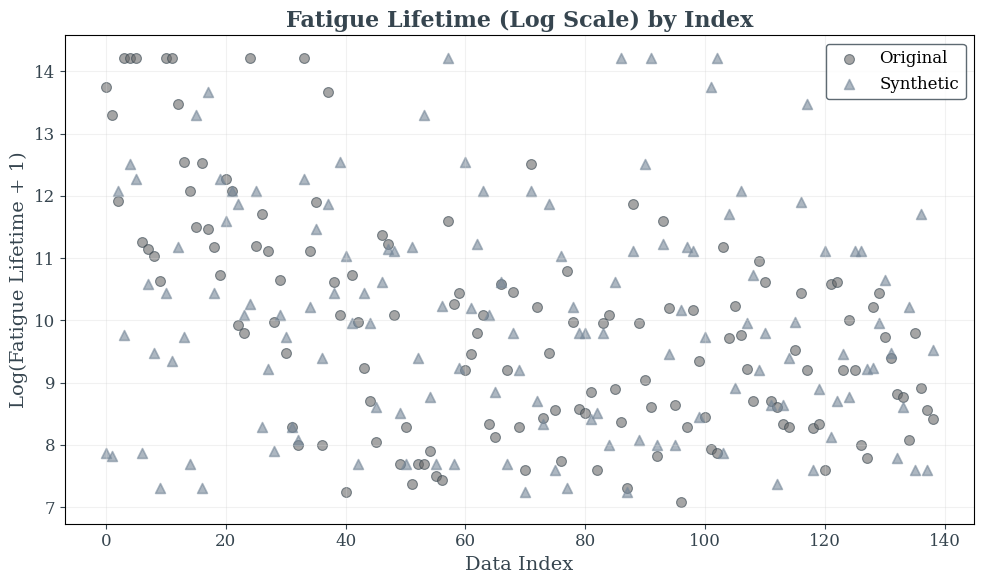


=== MULTIVARIATE ANALYSIS - INDIVIDUAL PLOTS ===


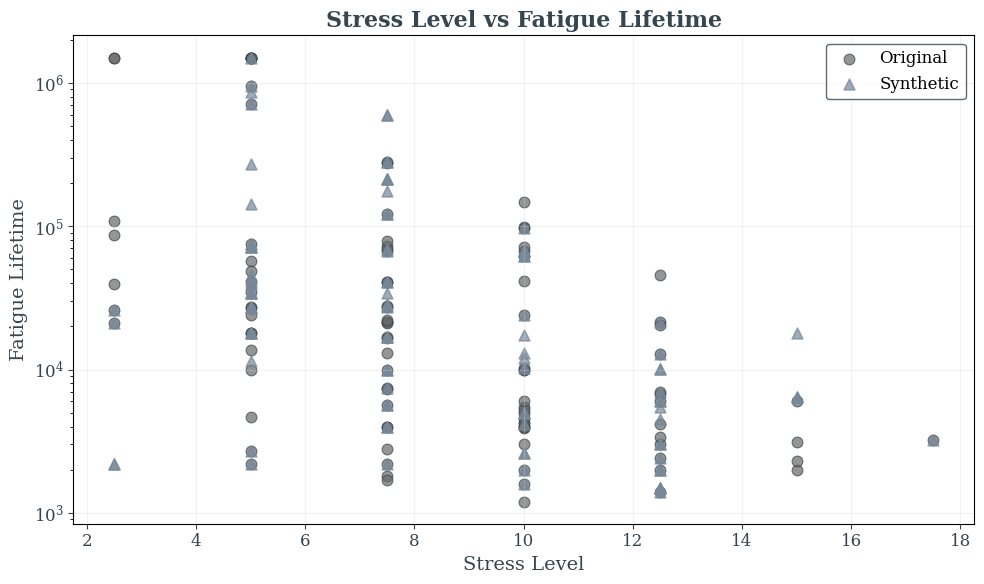

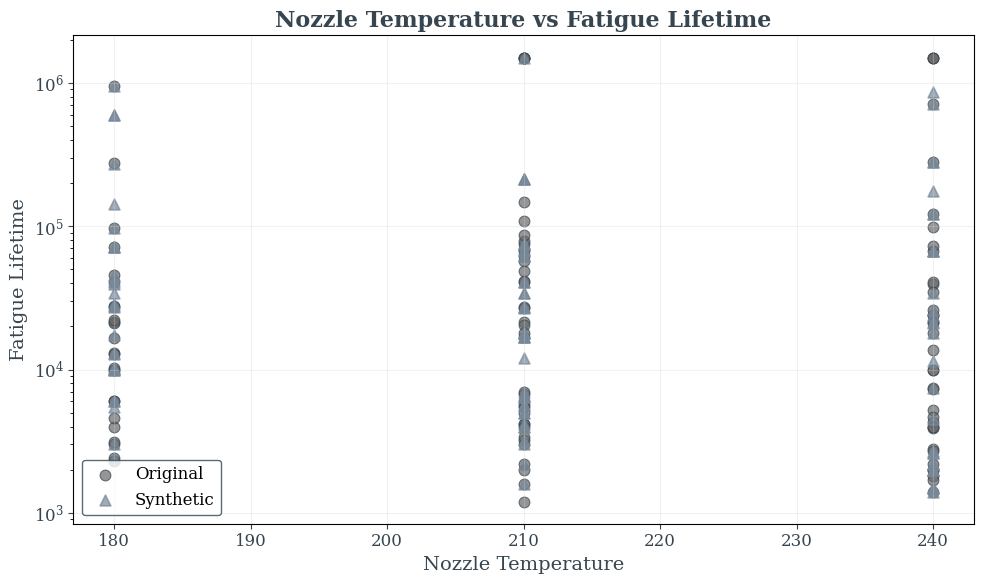

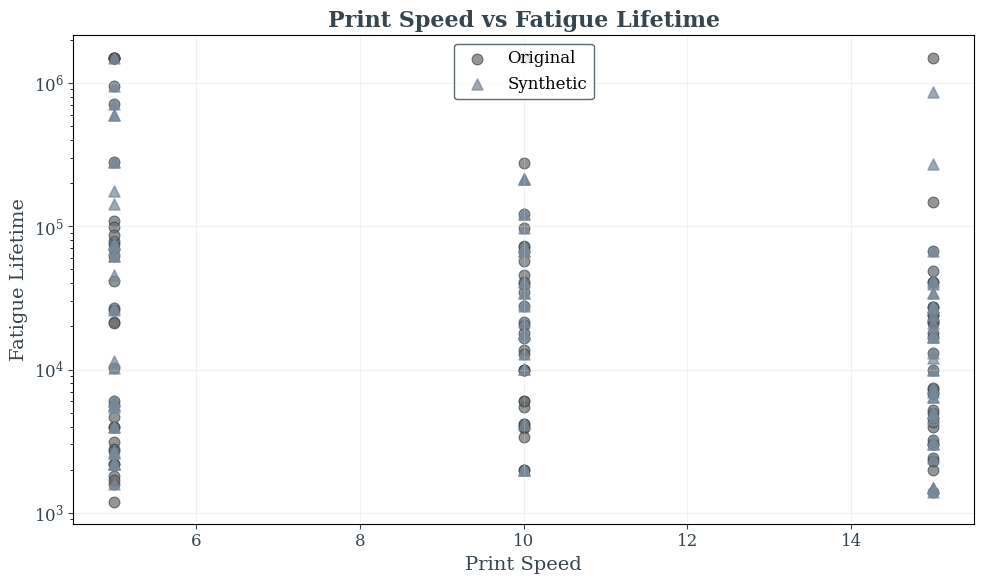

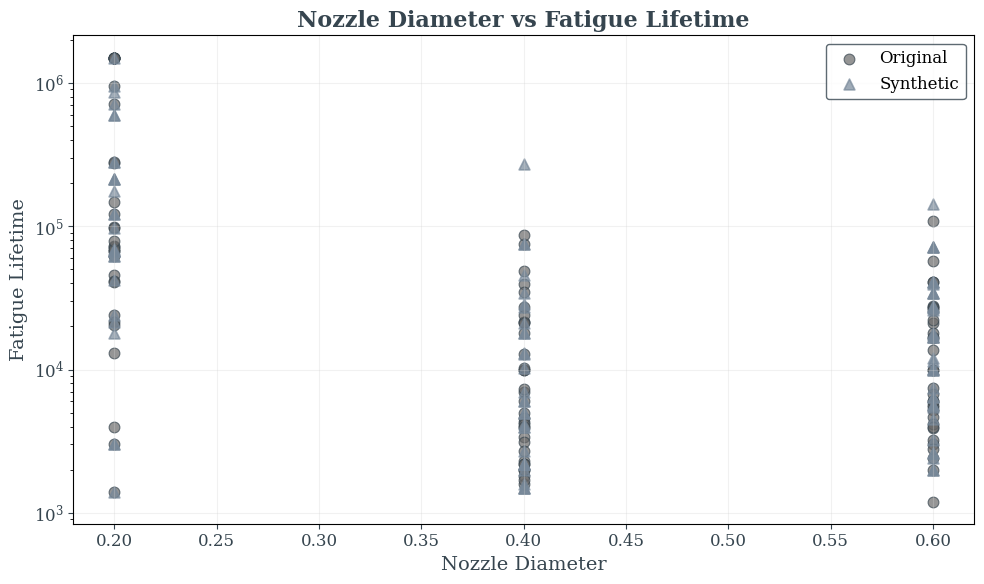

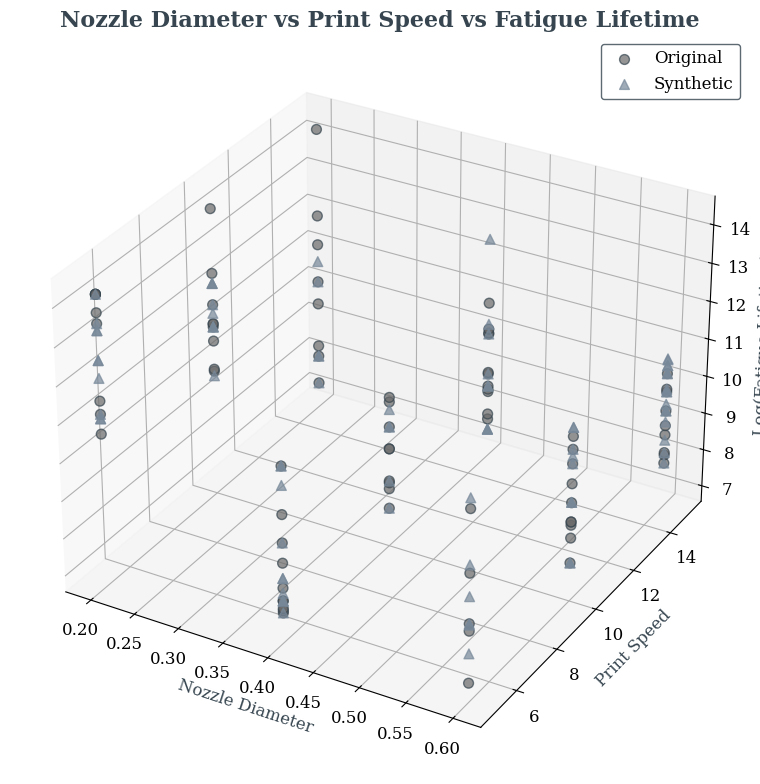

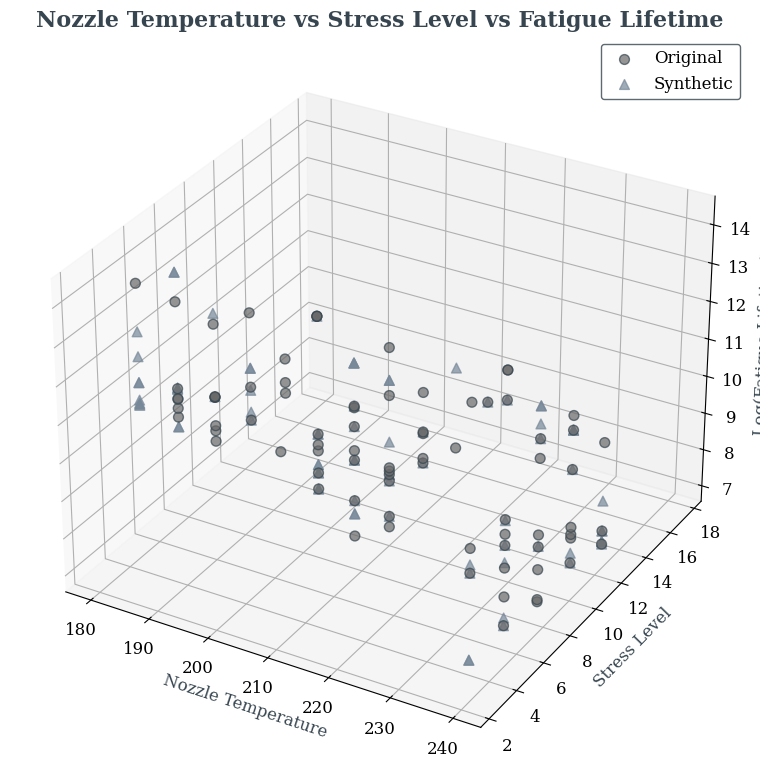


=== SYNTHETIC DATA QUALITY METRICS ===
Synthetic Data Quality Metrics:
                    Mean_Preservation_Rate  Std_Preservation_Rate  \
Nozzle Diameter                     0.9965                 0.9845   
Print Speed                         0.9820                 0.9644   
Nozzle Temperature                  0.9949                 0.9931   
Stress Level                        0.9807                 0.9896   
Fatigue Lifetime                    0.8654                 0.8159   

                    Median_Preservation_Rate  KS_Statistic  Effect_Size  \
Nozzle Diameter                          1.0        0.0144       0.0088   
Print Speed                              1.0        0.0432      -0.0436   
Nozzle Temperature                       1.0        0.0216       0.0443   
Stress Level                             1.0        0.0432      -0.0485   
Fatigue Lifetime                         1.0        0.0719      -0.0511   

                    Coverage_Rate  
Nozzle Diameter           

In [ ]:
# Step 1: Install required packages (if needed)
!pip install seaborn scipy

# Step 2: Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import ks_2samp, ttest_ind
import warnings
import matplotlib.font_manager as fm
warnings.filterwarnings('ignore')

# Read the CSV file
df = pd.read_csv('combined_bootstrap_fatigue.csv')

# Check if Times New Roman is available and set it as the default font
available_fonts = [f.name for f in fm.fontManager.ttflist]
if 'Times New Roman' in available_fonts:
    plt.rcParams['font.family'] = 'Times New Roman'
    print("Using Times New Roman font for all plots")
else:
    # Find a suitable serif font
    serif_fonts = [f for f in available_fonts if any(term in f.lower() for term in ['serif', 'times', 'roman'])]
    if serif_fonts:
        plt.rcParams['font.family'] = serif_fonts[0]
        print(f"Times New Roman not found. Using {serif_fonts[0]} instead.")
    else:
        plt.rcParams['font.family'] = 'serif'  # default serif
        print("Times New Roman not found. Using default serif font.")

# Set up the visualization style
plt.rcParams['mathtext.fontset'] = 'stix'  # For mathematical symbols
plt.rcParams['font.size'] = 12  # Set default font size

# Define grey and ash color palette
light_grey = '#D3D3D3'     # Light grey
medium_grey = '#A9A9A9'    # Medium grey
dark_grey = '#696969'      # Dark grey
ash_grey = '#778899'       # Ash grey
slate_grey = '#708090'     # Slate grey
charcoal = '#36454F'       # Charcoal

# CHOOSE YOUR PREFERRED MARKER FOR SYNTHETIC DATA:
# Options: '^' (triangle), 's' (square), 'D' (diamond), 'v' (inverted triangle), '*' (star), '+' (plus), 'o' (circle with different style)

# Option 1: Triangle up (recommended)
SYNTHETIC_MARKER = '^'
# Option 2: Square
# SYNTHETIC_MARKER = 's'
# Option 3: Diamond
# SYNTHETIC_MARKER = 'D'
# Option 4: Inverted triangle
# SYNTHETIC_MARKER = 'v'
# Option 5: Star
# SYNTHETIC_MARKER = '*'
# Option 6: Plus
# SYNTHETIC_MARKER = '+'
# Option 7: Circle with different edge style
# SYNTHETIC_MARKER = 'o'

print(f"Using '{SYNTHETIC_MARKER}' marker for synthetic data points")

# Display basic info
print("=== DATASET OVERVIEW ===")
print("Dataset Shape:", df.shape)
print("\nFirst few rows:")
print(df.head())
print("\nData Source distribution:")
print(df['Data_Source'].value_counts())
print("\n" + "="*50)

# Step 4: Basic Data Exploration
print("\n=== BASIC DATA EXPLORATION ===")
print("Basic Statistics:")
print(df.describe())

print("\nMissing Values:")
print(df.isnull().sum())

print("\nData Types:")
print(df.dtypes)

# Step 5: Separate the data
original_data = df[df['Data_Source'] == 'Original']
synthetic_data = df[df['Data_Source'] == 'Bootstrap_Synthetic']

print(f"\nOriginal data points: {len(original_data)}")
print(f"Synthetic data points: {len(synthetic_data)}")

# Step 6: Distribution Comparison - Individual Plots
print("\n=== DISTRIBUTION COMPARISON - INDIVIDUAL PLOTS ===")
numerical_cols = ['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level', 'Fatigue Lifetime']

# Create individual distribution plots
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    plt.hist(original_data[col], alpha=0.7, label='Original', bins=20, color=dark_grey, density=True, edgecolor=charcoal, linewidth=1.2)
    plt.hist(synthetic_data[col], alpha=0.7, label='Synthetic', bins=20, color=ash_grey, density=True, edgecolor=charcoal, linewidth=1.2)
    plt.title(f'Distribution of {col}', fontsize=16, fontweight='bold', color=charcoal)
    plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
    plt.xlabel(col, fontsize=14, color=charcoal)
    plt.ylabel('Density', fontsize=14, color=charcoal)
    plt.grid(True, alpha=0.3, color=light_grey)
    plt.tick_params(colors=charcoal)
    plt.tight_layout()
    plt.show()

# Step 7: Statistical Tests for Comparison
print("\n=== STATISTICAL TESTS FOR DISTRIBUTION SIMILARITY ===")
print("=" * 60)

statistical_results = []
for col in numerical_cols:
    # Kolmogorov-Smirnov test
    ks_stat, ks_pvalue = ks_2samp(original_data[col], synthetic_data[col])

    # T-test for means
    t_stat, t_pvalue = ttest_ind(original_data[col], synthetic_data[col])

    # Mann-Whitney U test (non-parametric)
    u_stat, u_pvalue = stats.mannwhitneyu(original_data[col], synthetic_data[col])

    print(f"\n{col}:")
    print(f"  KS Test - Statistic: {ks_stat:.4f}, p-value: {ks_pvalue:.4f}")
    print(f"  T-test - Statistic: {t_stat:.4f}, p-value: {t_pvalue:.4f}")
    print(f"  Mann-Whitney U - Statistic: {u_stat:.4f}, p-value: {u_pvalue:.4f}")
    print(f"  Original Mean: {original_data[col].mean():.2f} ± {original_data[col].std():.2f}")
    print(f"  Synthetic Mean: {synthetic_data[col].mean():.2f} ± {synthetic_data[col].std():.2f}")

    statistical_results.append({
        'Variable': col,
        'KS_Statistic': ks_stat,
        'KS_pvalue': ks_pvalue,
        'T_Statistic': t_stat,
        'T_pvalue': t_pvalue,
        'U_Statistic': u_stat,
        'U_pvalue': u_pvalue
    })

# Step 8: Range Comparison
print("\n=== RANGE COMPARISON: ORIGINAL vs SYNTHETIC ===")
print("=" * 70)

range_comparison = []
for col in numerical_cols:
    orig_min = original_data[col].min()
    orig_max = original_data[col].max()
    orig_range = orig_max - orig_min
    orig_iqr = original_data[col].quantile(0.75) - original_data[col].quantile(0.25)

    synth_min = synthetic_data[col].min()
    synth_max = synthetic_data[col].max()
    synth_range = synth_max - synth_min
    synth_iqr = synthetic_data[col].quantile(0.75) - synthetic_data[col].quantile(0.25)

    range_diff = synth_range - orig_range
    range_ratio = synth_range / orig_range if orig_range != 0 else np.nan
    iqr_ratio = synth_iqr / orig_iqr if orig_iqr != 0 else np.nan

    range_comparison.append({
        'Variable': col,
        'Original_Min': orig_min,
        'Original_Max': orig_max,
        'Original_Range': orig_range,
        'Synthetic_Min': synth_min,
        'Synthetic_Max': synth_max,
        'Synthetic_Range': synth_range,
        'Range_Difference': range_diff,
        'Range_Ratio': range_ratio,
        'IQR_Ratio': iqr_ratio
    })

range_df = pd.DataFrame(range_comparison)
print(range_df.round(4))

# Step 9: Correlation Analysis - Individual Plots
print("\n=== CORRELATION ANALYSIS - INDIVIDUAL PLOTS ===")

# Original data correlation
plt.figure(figsize=(8, 6))
orig_corr = original_data[numerical_cols].corr()
sns.heatmap(orig_corr, annot=True, cmap='Greys', center=0, fmt='.3f',
            cbar_kws={'label': 'Correlation Coefficient'})
plt.title('Original Data Correlation Matrix', fontweight='bold', fontsize=16, color=charcoal)
plt.tight_layout()
plt.show()

# Synthetic data correlation
plt.figure(figsize=(8, 6))
synth_corr = synthetic_data[numerical_cols].corr()
sns.heatmap(synth_corr, annot=True, cmap='Purples', center=0, fmt='.3f',
            cbar_kws={'label': 'Correlation Coefficient'})
plt.title('Synthetic Data Correlation Matrix', fontweight='bold', fontsize=16, color=charcoal)
plt.tight_layout()
plt.show()

# Correlation difference
plt.figure(figsize=(8, 6))
corr_diff = orig_corr - synth_corr
sns.heatmap(corr_diff, annot=True, cmap='RdBu_r', center=0, fmt='.3f',
            cbar_kws={'label': 'Correlation Difference'})
plt.title('Correlation Difference (Original - Synthetic)', fontweight='bold', fontsize=16, color=charcoal)
plt.tight_layout()
plt.show()

print("Correlation Matrix Difference (Original - Synthetic):")
print(corr_diff.round(4))

# Step 10: Fatigue Lifetime Analysis - Individual Plots
print("\n=== FATIGUE LIFETIME ANALYSIS - INDIVIDUAL PLOTS ===")

# Distribution comparison (log scale)
plt.figure(figsize=(10, 6))
plt.hist(np.log1p(original_data['Fatigue Lifetime']), alpha=0.7, label='Original', bins=20, color=dark_grey, density=True, edgecolor=charcoal, linewidth=1.2)
plt.hist(np.log1p(synthetic_data['Fatigue Lifetime']), alpha=0.7, label='Synthetic', bins=20, color=ash_grey, density=True, edgecolor=charcoal, linewidth=1.2)
plt.title('Fatigue Lifetime Distribution (log scale)', fontweight='bold', fontsize=16, color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.xlabel('Log(Fatigue Lifetime + 1)', fontsize=14, color=charcoal)
plt.ylabel('Density', fontsize=14, color=charcoal)
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.show()

# Box plot
plt.figure(figsize=(10, 6))
box_data = [original_data['Fatigue Lifetime'], synthetic_data['Fatigue Lifetime']]
box_plot = plt.boxplot(box_data, labels=['Original', 'Synthetic'], patch_artist=True)
# Customize box colors
box_plot['boxes'][0].set_facecolor(dark_grey)
box_plot['boxes'][1].set_facecolor(ash_grey)
box_plot['boxes'][0].set_edgecolor(charcoal)
box_plot['boxes'][1].set_edgecolor(charcoal)
plt.title('Fatigue Lifetime Box Plot', fontweight='bold', fontsize=16, color=charcoal)
plt.ylabel('Fatigue Lifetime', fontsize=14, color=charcoal)
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.show()

# Violin plot
plt.figure(figsize=(10, 6))
violin_parts = plt.violinplot([original_data['Fatigue Lifetime'], synthetic_data['Fatigue Lifetime']],
                             showmeans=True, showmedians=True)
# Customize violin colors
violin_parts['bodies'][0].set_facecolor(dark_grey)
violin_parts['bodies'][1].set_facecolor(ash_grey)
violin_parts['bodies'][0].set_edgecolor(charcoal)
violin_parts['bodies'][1].set_edgecolor(charcoal)
plt.xticks([1, 2], ['Original', 'Synthetic'])
plt.title('Fatigue Lifetime Violin Plot', fontweight='bold', fontsize=16, color=charcoal)
plt.ylabel('Fatigue Lifetime', fontsize=14, color=charcoal)
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.show()

# QQ plot
plt.figure(figsize=(10, 6))
sorted_orig = np.sort(original_data['Fatigue Lifetime'])
sorted_synth = np.sort(synthetic_data['Fatigue Lifetime'])

# Use common length for QQ plot
min_len = min(len(sorted_orig), len(sorted_synth))
plt.scatter(sorted_orig[:min_len], sorted_synth[:min_len], alpha=0.6, color=slate_grey, s=50)
plt.plot([sorted_orig.min(), sorted_orig.max()], [sorted_orig.min(), sorted_orig.max()], '--', linewidth=2, color=charcoal)
plt.xlabel('Original Fatigue Lifetime', fontsize=14, color=charcoal)
plt.ylabel('Synthetic Fatigue Lifetime', fontsize=14, color=charcoal)
plt.title('QQ Plot: Original vs Synthetic', fontweight='bold', fontsize=16, color=charcoal)
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.show()

# Cumulative distribution
plt.figure(figsize=(10, 6))
plt.hist(original_data['Fatigue Lifetime'], cumulative=True, density=True,
           alpha=0.7, label='Original', bins=50, histtype='step', linewidth=2, color=dark_grey)
plt.hist(synthetic_data['Fatigue Lifetime'], cumulative=True, density=True,
           alpha=0.7, label='Synthetic', bins=50, histtype='step', linewidth=2, color=ash_grey)
plt.title('Cumulative Distribution Function', fontweight='bold', fontsize=16, color=charcoal)
plt.xlabel('Fatigue Lifetime', fontsize=14, color=charcoal)
plt.ylabel('Cumulative Probability', fontsize=14, color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.show()

# Log-scale scatter
plt.figure(figsize=(10, 6))
plt.scatter(range(len(original_data)), np.log1p(original_data['Fatigue Lifetime']),
             alpha=0.6, label='Original', color=dark_grey, s=50, edgecolors=charcoal, linewidth=0.8)
plt.scatter(range(len(synthetic_data)), np.log1p(synthetic_data['Fatigue Lifetime']),
             alpha=0.6, label='Synthetic', color=ash_grey, s=50, marker=SYNTHETIC_MARKER, linewidth=1.2)
plt.title('Fatigue Lifetime (Log Scale) by Index', fontweight='bold', fontsize=16, color=charcoal)
plt.xlabel('Data Index', fontsize=14, color=charcoal)
plt.ylabel('Log(Fatigue Lifetime + 1)', fontsize=14, color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.show()

# Step 11: Multivariate Analysis - Individual Plots
print("\n=== MULTIVARIATE ANALYSIS - INDIVIDUAL PLOTS ===")

# Sample data for multivariate plots
sample_orig = original_data.sample(min(100, len(original_data)), random_state=42)
sample_synth = synthetic_data.sample(min(100, len(synthetic_data)), random_state=42)
comparison_sample = pd.concat([sample_orig, sample_synth])

# Stress Level vs Fatigue Lifetime
plt.figure(figsize=(10, 6))
plt.scatter(sample_orig['Stress Level'], sample_orig['Fatigue Lifetime'],
            alpha=0.7, s=60, label='Original', color=dark_grey, edgecolors=charcoal, linewidth=0.8)
plt.scatter(sample_synth['Stress Level'], sample_synth['Fatigue Lifetime'],
            alpha=0.7, s=60, label='Synthetic', color=ash_grey, marker=SYNTHETIC_MARKER, linewidth=1.2)
plt.title('Stress Level vs Fatigue Lifetime', fontweight='bold', fontsize=16, color=charcoal)
plt.yscale('log')
plt.xlabel('Stress Level', fontsize=14, color=charcoal)
plt.ylabel('Fatigue Lifetime', fontsize=14, color=charcoal)
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.tight_layout()
plt.show()

# Nozzle Temperature vs Fatigue Lifetime
plt.figure(figsize=(10, 6))
plt.scatter(sample_orig['Nozzle Temperature'], sample_orig['Fatigue Lifetime'],
            alpha=0.7, s=60, label='Original', color=dark_grey, edgecolors=charcoal, linewidth=0.8)
plt.scatter(sample_synth['Nozzle Temperature'], sample_synth['Fatigue Lifetime'],
            alpha=0.7, s=60, label='Synthetic', color=ash_grey, marker=SYNTHETIC_MARKER, linewidth=1.2)
plt.title('Nozzle Temperature vs Fatigue Lifetime', fontweight='bold', fontsize=16, color=charcoal)
plt.yscale('log')
plt.xlabel('Nozzle Temperature', fontsize=14, color=charcoal)
plt.ylabel('Fatigue Lifetime', fontsize=14, color=charcoal)
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.tight_layout()
plt.show()

# Print Speed vs Fatigue Lifetime
plt.figure(figsize=(10, 6))
plt.scatter(sample_orig['Print Speed'], sample_orig['Fatigue Lifetime'],
            alpha=0.7, s=60, label='Original', color=dark_grey, edgecolors=charcoal, linewidth=0.8)
plt.scatter(sample_synth['Print Speed'], sample_synth['Fatigue Lifetime'],
            alpha=0.7, s=60, label='Synthetic', color=ash_grey, marker=SYNTHETIC_MARKER, linewidth=1.2)
plt.title('Print Speed vs Fatigue Lifetime', fontweight='bold', fontsize=16, color=charcoal)
plt.yscale('log')
plt.xlabel('Print Speed', fontsize=14, color=charcoal)
plt.ylabel('Fatigue Lifetime', fontsize=14, color=charcoal)
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.tight_layout()
plt.show()

# Nozzle Diameter vs Fatigue Lifetime
plt.figure(figsize=(10, 6))
plt.scatter(sample_orig['Nozzle Diameter'], sample_orig['Fatigue Lifetime'],
            alpha=0.7, s=60, label='Original', color=dark_grey, edgecolors=charcoal, linewidth=0.8)
plt.scatter(sample_synth['Nozzle Diameter'], sample_synth['Fatigue Lifetime'],
            alpha=0.7, s=60, label='Synthetic', color=ash_grey, marker=SYNTHETIC_MARKER, linewidth=1.2)
plt.title('Nozzle Diameter vs Fatigue Lifetime', fontweight='bold', fontsize=16, color=charcoal)
plt.yscale('log')
plt.xlabel('Nozzle Diameter', fontsize=14, color=charcoal)
plt.ylabel('Fatigue Lifetime', fontsize=14, color=charcoal)
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.tight_layout()
plt.show()

# 3D scatter plots
from mpl_toolkits.mplot3d import Axes3D

# First 3D plot
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(111, projection='3d')
sample_size = min(80, len(original_data), len(synthetic_data))
orig_sample = original_data.sample(sample_size, random_state=42)
synth_sample = synthetic_data.sample(sample_size, random_state=42)

sc1 = ax1.scatter(orig_sample['Nozzle Diameter'], orig_sample['Print Speed'],
           np.log1p(orig_sample['Fatigue Lifetime']),
           c=dark_grey, label='Original', alpha=0.7, s=50, edgecolors=charcoal)
sc2 = ax1.scatter(synth_sample['Nozzle Diameter'], synth_sample['Print Speed'],
           np.log1p(synth_sample['Fatigue Lifetime']),
           c=ash_grey, label='Synthetic', alpha=0.7, s=50, marker=SYNTHETIC_MARKER)

ax1.set_xlabel('Nozzle Diameter', fontsize=12, color=charcoal)
ax1.set_ylabel('Print Speed', fontsize=12, color=charcoal)
ax1.set_zlabel('Log(Fatigue Lifetime)', fontsize=12, color=charcoal)
ax1.set_title('Nozzle Diameter vs Print Speed vs Fatigue Lifetime', fontweight='bold', fontsize=16, color=charcoal)
ax1.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.tight_layout()
plt.show()

# Second 3D plot
fig = plt.figure(figsize=(12, 8))
ax2 = fig.add_subplot(111, projection='3d')
sc3 = ax2.scatter(orig_sample['Nozzle Temperature'], orig_sample['Stress Level'],
           np.log1p(orig_sample['Fatigue Lifetime']),
           c=dark_grey, label='Original', alpha=0.7, s=50, edgecolors=charcoal)
sc4 = ax2.scatter(synth_sample['Nozzle Temperature'], synth_sample['Stress Level'],
           np.log1p(synth_sample['Fatigue Lifetime']),
           c=ash_grey, label='Synthetic', alpha=0.7, s=50, marker=SYNTHETIC_MARKER)

ax2.set_xlabel('Nozzle Temperature', fontsize=12, color=charcoal)
ax2.set_ylabel('Stress Level', fontsize=12, color=charcoal)
ax2.set_zlabel('Log(Fatigue Lifetime)', fontsize=12, color=charcoal)
ax2.set_title('Nozzle Temperature vs Stress Level vs Fatigue Lifetime', fontweight='bold', fontsize=16, color=charcoal)
ax2.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.tight_layout()
plt.show()

# Step 12: Quality Metrics for Synthetic Data
print("\n=== SYNTHETIC DATA QUALITY METRICS ===")

def calculate_synthetic_quality_metrics(original, synthetic, numerical_cols):
    """Calculate various quality metrics for synthetic data"""

    metrics = {}

    for col in numerical_cols:
        # Basic statistics preservation
        orig_mean = original[col].mean()
        synth_mean = synthetic[col].mean()
        mean_preservation = abs(synth_mean - orig_mean) / orig_mean if orig_mean != 0 else abs(synth_mean - orig_mean)

        orig_std = original[col].std()
        synth_std = synthetic[col].std()
        std_preservation = abs(synth_std - orig_std) / orig_std if orig_std != 0 else abs(synth_std - orig_std)

        orig_median = original[col].median()
        synth_median = synthetic[col].median()
        median_preservation = abs(synth_median - orig_median) / orig_median if orig_median != 0 else abs(synth_median - orig_median)

        metrics[col] = {
            'Mean_Preservation_Rate': 1 - mean_preservation,
            'Std_Preservation_Rate': 1 - std_preservation,
            'Median_Preservation_Rate': 1 - median_preservation,
            'KS_Statistic': stats.ks_2samp(original[col], synthetic[col])[0],
            'Effect_Size': (synth_mean - orig_mean) / orig_std if orig_std != 0 else 0,
            'Coverage_Rate': len(set(synthetic[col]) & set(original[col])) / len(set(original[col])) if len(set(original[col])) > 0 else 0
        }

    return pd.DataFrame(metrics).T

# Calculate quality metrics
quality_metrics = calculate_synthetic_quality_metrics(original_data, synthetic_data, numerical_cols)
print("Synthetic Data Quality Metrics:")
print(quality_metrics.round(4))

# Step 13: Summary Report
print("\n" + "="*80)
print("COMPREHENSIVE COMPARISON REPORT: ORIGINAL vs SYNTHETIC DATA")
print("="*80)

print(f"\n1. DATA VOLUME:")
print(f"   • Original samples: {len(original_data):,}")
print(f"   • Synthetic samples: {len(synthetic_data):,}")
print(f"   • Total samples: {len(df):,}")
print(f"   • Synthetic/Original ratio: {len(synthetic_data)/len(original_data):.2f}")

print(f"\n2. KEY STATISTICAL DIFFERENCES:")
fatigue_stats = range_df[range_df['Variable'] == 'Fatigue Lifetime'].iloc[0]
print(f"   • Fatigue Lifetime Range - Original: {fatigue_stats['Original_Range']:,.0f}")
print(f"   • Fatigue Lifetime Range - Synthetic: {fatigue_stats['Synthetic_Range']:,.0f}")
print(f"   • Range Preservation: {fatigue_stats['Range_Ratio']:.3f}")

print(f"\n3. DATA QUALITY ASSESSMENT:")
print(f"   • Average mean preservation rate: {quality_metrics['Mean_Preservation_Rate'].mean():.3f}")
print(f"   • Average std preservation rate: {quality_metrics['Std_Preservation_Rate'].mean():.3f}")
print(f"   • Average median preservation rate: {quality_metrics['Median_Preservation_Rate'].mean():.3f}")
print(f"   • Average KS statistic: {quality_metrics['KS_Statistic'].mean():.3f}")

print(f"\n4. CORRELATION PRESERVATION:")
corr_preservation = 1 - (corr_diff.abs().mean().mean())
print(f"   • Correlation preservation rate: {corr_preservation:.3f}")

print(f"\n5. RECOMMENDATIONS:")
recommendations = []

if quality_metrics.loc['Fatigue Lifetime', 'Mean_Preservation_Rate'] > 0.95:
    recommendations.append("✓ Synthetic data preserves key statistics well")
else:
    recommendations.append("⚠ Some statistical properties differ significantly")

if quality_metrics.loc['Fatigue Lifetime', 'KS_Statistic'] < 0.1:
    recommendations.append("✓ Distributions are very similar (low KS statistic)")
else:
    recommendations.append("⚠ Distributions show some differences")

if len(synthetic_data) >= len(original_data):
    recommendations.append("✓ Sufficient synthetic data generated")
else:
    recommendations.append("⚠ Consider generating more synthetic data")

if corr_preservation > 0.95:
    recommendations.append("✓ Correlation structure well preserved")
else:
    recommendations.append("⚠ Some correlation patterns differ")

for rec in recommendations:
    print(f"   {rec}")

print(f"\n6. OVERALL SYNTHETIC DATA QUALITY SCORE:")
overall_score = (
    quality_metrics['Mean_Preservation_Rate'].mean() * 0.3 +
    quality_metrics['Std_Preservation_Rate'].mean() * 0.3 +
    corr_preservation * 0.2 +
    (1 - quality_metrics['KS_Statistic'].mean()) * 0.2
) * 100

print(f"   • Overall Quality Score: {overall_score:.1f}%")

if overall_score >= 90:
    print("   • Rating: EXCELLENT")
elif overall_score >= 80:
    print("   • Rating: GOOD")
elif overall_score >= 70:
    print("   • Rating: FAIR")
else:
    print("   • Rating: NEEDS IMPROVEMENT")

print("\n" + "="*80)

# Step 14: Save the analysis results
print("\nSaving analysis results...")

# Create a summary dataframe
summary_results = pd.DataFrame({
    'Metric': [
        'Original_Samples', 'Synthetic_Samples', 'Total_Samples',
        'Synthetic_Original_Ratio', 'Overall_Quality_Score',
        'Mean_Preservation_Rate', 'Std_Preservation_Rate',
        'Correlation_Preservation', 'Average_KS_Statistic'
    ],
    'Value': [
        len(original_data), len(synthetic_data), len(df),
        len(synthetic_data)/len(original_data), overall_score,
        quality_metrics['Mean_Preservation_Rate'].mean(),
        quality_metrics['Std_Preservation_Rate'].mean(),
        corr_preservation,
        quality_metrics['KS_Statistic'].mean()
    ]
})

print("\nSummary Results:")
print(summary_results.round(4))

print("\n=== ANALYSIS COMPLETE ===")

Times New Roman not found. Using DejaVu Serif instead.
COMPLETE DNN WITH INDIVIDUAL PLOTS
Dataset: 278 samples, 4 features
Features: ['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level']

Creating Deterministic DNN Model...
DNN Architecture Summary:


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4 (Dense)                 │ (None, 64)             │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,945 (11.50 KB)

 Trainable params: 2,945 (11.50 KB)

 Non-trainable params: 0 (0.00 B)


Training DNN Model...
Epoch 1/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.9895 - mae: 0.8323 - val_loss: 0.7639 - val_mae: 0.7186 - learning_rate: 0.0010
Epoch 2/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.8370 - mae: 0.7536 - val_loss: 0.6391 - val_mae: 0.6496 - learning_rate: 0.0010
Epoch 3/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.7036 - mae: 0.6774 - val_loss: 0.5281 - val_mae: 0.5828 - learning_rate: 0.0010
Epoch 4/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.5786 - mae: 0.6040 - val_loss: 0.4346 - val_mae: 0.5186 - learning_rate: 0.0010
Epoch 5/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.4659 - mae: 0.5333 - val_loss: 0.3617 - val_mae: 0.4630 - learning_rate: 0.0010
Epoch 6/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3719 - mae: 0.4707 - val_loss: 0.3003 - val_mae: 0.4088 - learning_rate: 0.0010
Epoch 7/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.2987 - mae: 0.4194 - val_loss: 0.2598 - val_mae: 0.3746 - learning_rate: 0.00

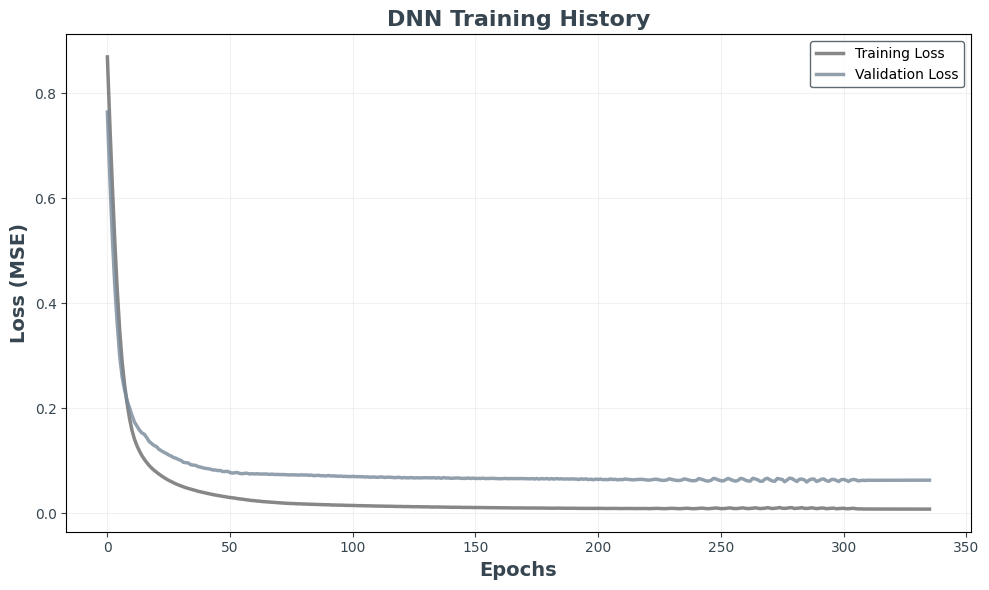

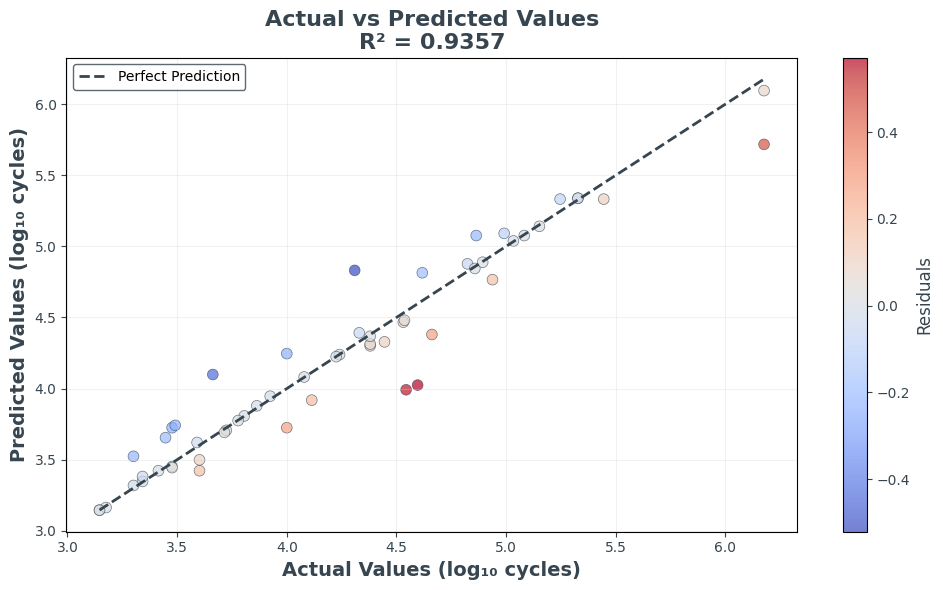

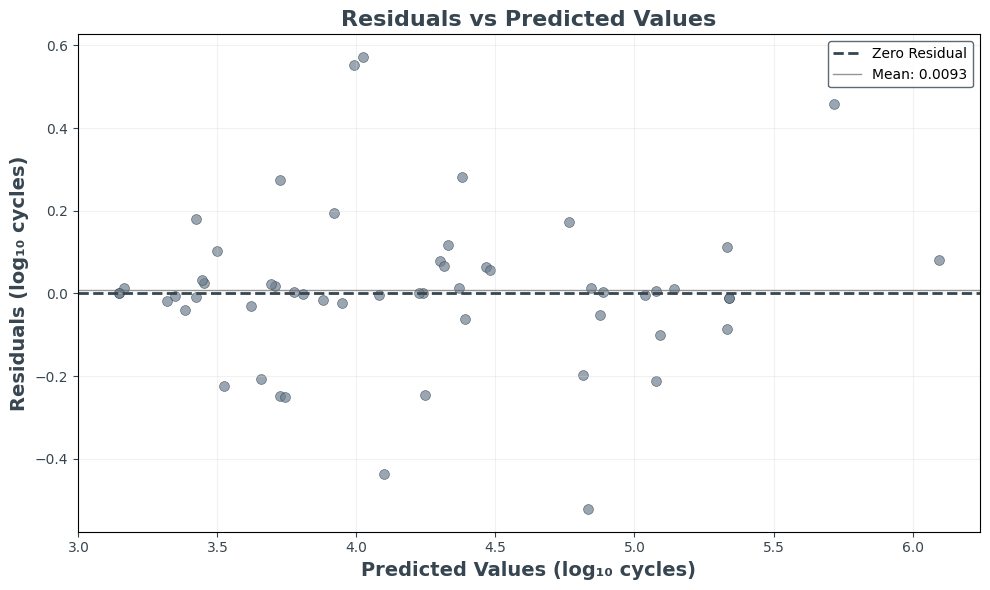

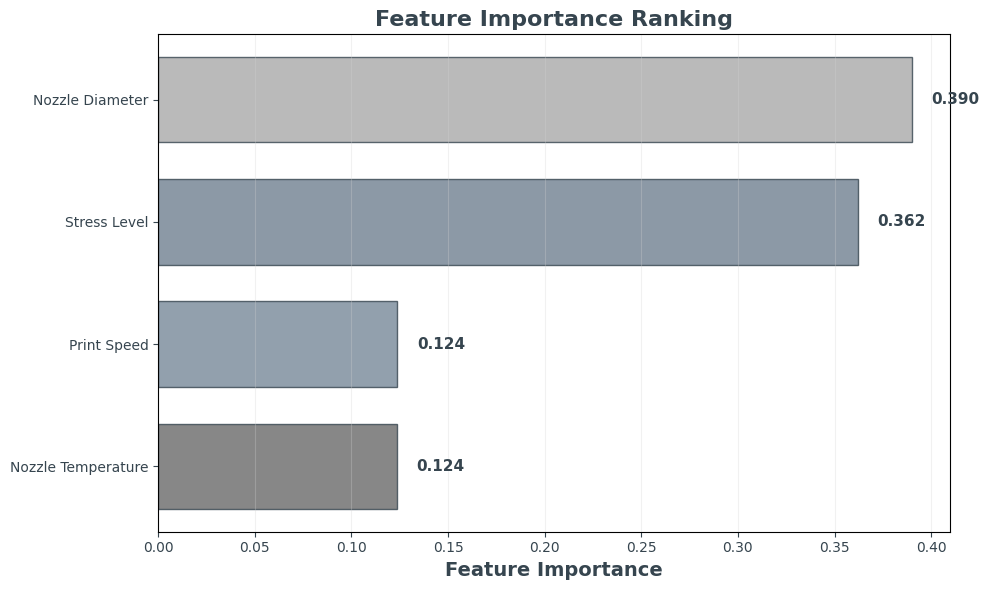

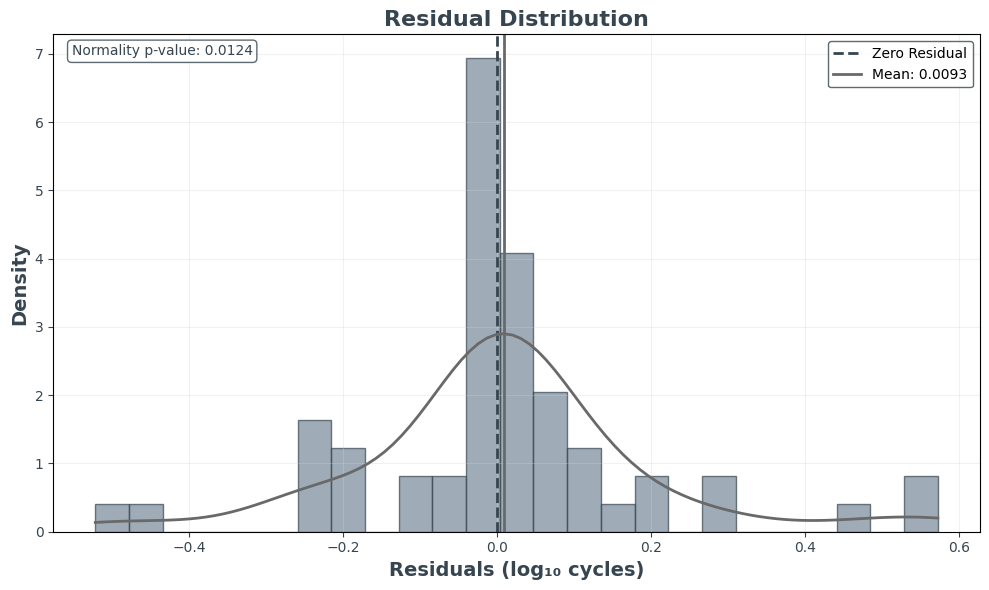

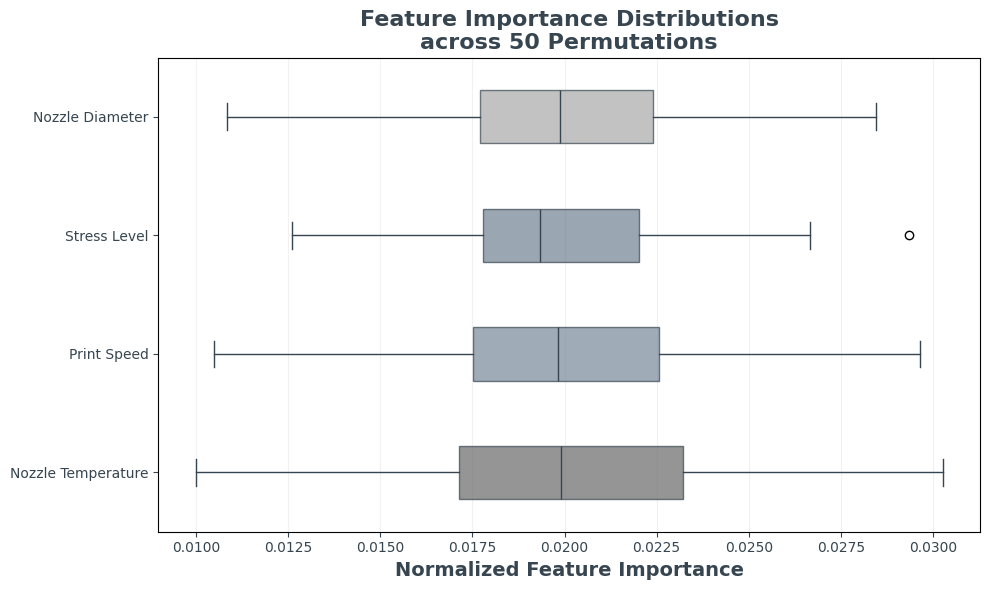


METRICS INTERPRETATION IN ORIGINAL SCALE

📈 KEY METRICS IN ORIGINAL SCALE:
--------------------------------------------------
R² Score                 :     0.758924
MSE                      : 18,524,854,452 cycles
RMSE                     :      136,106 cycles
MAE                      :       29,940 cycles
MAPE                     :        28.35 cycles
Median Absolute Error    :        2,205 cycles

FINAL SUMMARY

🎯 MODEL PERFORMANCE SUMMARY:
R² Score (Log10): 0.935743
RMSE (Log10): 0.189637
MAE (Log10): 0.116859

🏆 FEATURE IMPORTANCE RANKING:
----------------------------------------
 1. Nozzle Diameter      - 0.390
 2. Stress Level         - 0.362
 3. Print Speed          - 0.124
 4. Nozzle Temperature   - 0.124

📊 DATA CHARACTERISTICS:
Training samples: 222
Test samples: 56
Features: 4

💾 INDIVIDUAL PLOTS SAVED:
1. training_history.png
2. actual_vs_predicted.png
3. residuals_vs_predicted.png
4. feature_importance.png
5. residual_distribution.png
6. feature_importance_distribution.p

In [ ]:
# =============================================================================
# COMPLETE DETERMINISTIC DNN WITH INDIVIDUAL PLOTS
# =============================================================================

import tensorflow as tf
import numpy as np
import random
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from sklearn.metrics import (r2_score, mean_squared_error, mean_absolute_error,
                            mean_absolute_percentage_error, explained_variance_score,
                            median_absolute_error, max_error)
from scipy import stats
import warnings
import matplotlib.font_manager as fm
warnings.filterwarnings('ignore')

# Check if Times New Roman is available and set it as the default font
available_fonts = [f.name for f in fm.fontManager.ttflist]
if 'Times New Roman' in available_fonts:
    plt.rcParams['font.family'] = 'Times New Roman'
    print("Using Times New Roman font for all plots")
else:
    # Find a suitable serif font
    serif_fonts = [f for f in available_fonts if any(term in f.lower() for term in ['serif', 'times', 'roman'])]
    if serif_fonts:
        plt.rcParams['font.family'] = serif_fonts[0]
        print(f"Times New Roman not found. Using {serif_fonts[0]} instead.")
    else:
        plt.rcParams['font.family'] = 'serif'  # default serif
        print("Times New Roman not found. Using default serif font.")

# Set up the visualization style
plt.rcParams['mathtext.fontset'] = 'stix'  # For mathematical symbols
plt.rcParams['font.size'] = 12  # Set default font size

# Define grey and ash color palette
light_grey = '#D3D3D3'     # Light grey
medium_grey = '#A9A9A9'    # Medium grey
dark_grey = '#696969'      # Dark grey
ash_grey = '#778899'       # Ash grey
slate_grey = '#708090'     # Slate grey
charcoal = '#36454F'       # Charcoal

# Set ALL random seeds for complete reproducibility
def set_seeds(seed=42):
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    tf.keras.utils.set_random_seed(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
    tf.config.experimental.enable_op_determinism()

set_seeds(42)

print("=" * 70)
print("COMPLETE DNN WITH INDIVIDUAL PLOTS")
print("=" * 70)

# =============================================================================
# DATA LOADING AND PREPROCESSING
# =============================================================================

# Load data
df = pd.read_csv('combined_bootstrap_fatigue.csv')

# Prepare features and target
X = df[['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level']].values
y = np.log10(df['Fatigue Lifetime'].values)  # Log transformation

# Feature names for importance analysis
feature_names = ['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level']

print(f"Dataset: {X.shape[0]} samples, {X.shape[1]} features")
print(f"Features: {feature_names}")

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, shuffle=True
)

# Feature scaling
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

# Target scaling
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# =============================================================================
# DETERMINISTIC DNN MODEL
# =============================================================================

def create_deterministic_dnn():
    """Create DNN without dropout for deterministic results"""
    model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(4,)),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dense(16, activation='relu'),
        tf.keras.layers.Dense(1)
    ])
    return model

# Create and compile model
print("\nCreating Deterministic DNN Model...")
dnn_model = create_deterministic_dnn()

dnn_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='mse',
    metrics=['mae']
)

print("DNN Architecture Summary:")
dnn_model.summary()

# =============================================================================
# MODEL TRAINING
# =============================================================================

print("\nTraining DNN Model...")

callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=50,
        restore_best_weights=True,
        verbose=1
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=20,
        min_lr=1e-7,
        verbose=1
    )
]

history = dnn_model.fit(
    X_train_scaled, y_train_scaled,
    validation_data=(X_test_scaled, y_test_scaled),
    epochs=500,
    batch_size=32,
    callbacks=callbacks,
    verbose=1,
    shuffle=False
)

print(f"Training completed after {len(history.history['loss'])} epochs")

# =============================================================================
# COMPREHENSIVE METRICS CALCULATION
# =============================================================================

print("\n" + "=" * 70)
print("COMPREHENSIVE PERFORMANCE METRICS - LOG10 SPACE")
print("=" * 70)

# Predictions
y_pred_log_scaled = dnn_model.predict(X_test_scaled, verbose=0).flatten()
y_pred_log = scaler_y.inverse_transform(y_pred_log_scaled.reshape(-1, 1)).flatten()

# Calculate residuals
residuals_log = y_test - y_pred_log

# COMPREHENSIVE METRICS DICTIONARY
metrics_log = {
    'R² Score': r2_score(y_test, y_pred_log),
    'Explained Variance Score': explained_variance_score(y_test, y_pred_log),
    'Mean Squared Error (MSE)': mean_squared_error(y_test, y_pred_log),
    'Root Mean Squared Error (RMSE)': np.sqrt(mean_squared_error(y_test, y_pred_log)),
    'Mean Absolute Error (MAE)': mean_absolute_error(y_test, y_pred_log),
    'Median Absolute Error': median_absolute_error(y_test, y_pred_log),
    'Mean Absolute Percentage Error (MAPE)': mean_absolute_percentage_error(y_test, y_pred_log) * 100,
    'Max Error': max_error(y_test, y_pred_log),
    'Mean Bias Error': np.mean(y_pred_log - y_test),
    'Relative Absolute Error': np.sum(np.abs(y_test - y_pred_log)) / np.sum(np.abs(y_test - np.mean(y_test))),
    'Relative Squared Error': np.sum((y_test - y_pred_log) ** 2) / np.sum((y_test - np.mean(y_test)) ** 2)
}

# Additional statistical metrics
metrics_log.update({
    'Residual Mean': np.mean(residuals_log),
    'Residual Std': np.std(residuals_log),
    'Residual Skewness': stats.skew(residuals_log),
    'Residual Kurtosis': stats.kurtosis(residuals_log),
    'Residual RMSE': np.sqrt(np.mean(residuals_log ** 2)),
    'Residual MAE': np.mean(np.abs(residuals_log))
})

# Print comprehensive metrics
print("\n📊 COMPREHENSIVE MODEL METRICS (LOG10 SPACE):")
print("-" * 60)
for metric, value in metrics_log.items():
    if 'R²' in metric or 'Score' in metric:
        print(f"{metric:35}: {value:>12.6f}")
    elif 'Percentage' in metric:
        print(f"{metric:35}: {value:>12.4f}%")
    else:
        print(f"{metric:35}: {value:>12.6f}")

# =============================================================================
# NORMALIZED FEATURE IMPORTANCE
# =============================================================================

print("\n" + "=" * 70)
print("NORMALIZED FEATURE IMPORTANCE (SUM = 1.0)")
print("=" * 70)

def normalized_permutation_importance(model, X, y, feature_names, n_repeats=50, random_state=42):
    """Calculate normalized permutation importance that sums to 1.0"""

    print(f"Calculating permutation importance with {n_repeats} repetitions...")

    # Use scikit-learn's permutation_importance
    result = permutation_importance(
        model, X, y,
        n_repeats=n_repeats,
        scoring='r2',
        random_state=random_state,
        n_jobs=-1
    )

    # Get raw importance scores (ensure they're positive)
    raw_importance = np.maximum(result.importances_mean, 0)

    # NORMALIZE to sum = 1.0
    total_importance = np.sum(raw_importance)
    if total_importance > 0:
        normalized_importance = raw_importance / total_importance
    else:
        normalized_importance = raw_importance

    # Create comprehensive results dataframe
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': normalized_importance,
        'Raw_Importance': raw_importance,
        'Raw_Std': result.importances_std
    }).sort_values('Importance', ascending=False)

    # Add correct ranking
    importance_df['Rank'] = range(1, len(importance_df) + 1)

    return importance_df, result

# Calculate normalized importance
importance_df, perm_result = normalized_permutation_importance(
    dnn_model, X_test_scaled, y_test_scaled, feature_names, n_repeats=50
)

# Print clean results
print("\n📊 FEATURE IMPORTANCE:")
print("-" * 40)
print(f"{'Feature':20} {'Importance':>10} {'Rank':>6}")
print("-" * 40)

for _, row in importance_df.iterrows():
    print(f"{row['Feature']:20} {row['Importance']:10.3f} {row['Rank']:6.0f}")

print("-" * 40)
total_importance = importance_df['Importance'].sum()
print(f"{'TOTAL':20} {total_importance:10.3f} {'':6}")

# =============================================================================
# INDIVIDUAL PLOTS
# =============================================================================

print("\n" + "=" * 70)
print("GENERATING INDIVIDUAL PLOTS")
print("=" * 70)

# Set style for publication-quality plots with our custom colors
plt.style.use('default')

# =============================================================================
# PLOT 1: Training History
# =============================================================================
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss', linewidth=2.5, alpha=0.8, color=dark_grey)
plt.plot(history.history['val_loss'], label='Validation Loss', linewidth=2.5, alpha=0.8, color=ash_grey)
plt.xlabel('Epochs', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('Loss (MSE)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('DNN Training History', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.savefig('training_history.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 2: Actual vs Predicted
# =============================================================================
plt.figure(figsize=(10, 6))
scatter = plt.scatter(y_test, y_pred_log, alpha=0.7, c=residuals_log,
                     cmap='coolwarm', s=60, edgecolor=charcoal, linewidth=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()],
         '--', linewidth=2, label='Perfect Prediction', color=charcoal)
plt.xlabel('Actual Values (log₁₀ cycles)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('Predicted Values (log₁₀ cycles)', fontsize=14, fontweight='bold', color=charcoal)
plt.title(f'Actual vs Predicted Values\nR² = {metrics_log["R² Score"]:.4f}',
          fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
cbar = plt.colorbar(scatter)
cbar.set_label('Residuals', fontsize=12, color=charcoal)
cbar.ax.yaxis.set_tick_params(color=charcoal)
plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color=charcoal)
plt.tight_layout()
plt.savefig('actual_vs_predicted.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 3: Residuals vs Predicted
# =============================================================================
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_log, residuals_log, alpha=0.7, color=slate_grey, s=50,
           edgecolor=charcoal, linewidth=0.5)
plt.axhline(y=0, color=charcoal, linestyle='--', linewidth=2, label='Zero Residual')
plt.axhline(y=metrics_log['Residual Mean'], color=dark_grey, linestyle='-',
           linewidth=1, alpha=0.7, label=f'Mean: {metrics_log["Residual Mean"]:.4f}')
plt.xlabel('Predicted Values (log₁₀ cycles)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('Residuals (log₁₀ cycles)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('Residuals vs Predicted Values', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.savefig('residuals_vs_predicted.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 4: Feature Importance (FIXED - Higher to Lower values)
# =============================================================================
plt.figure(figsize=(10, 6))

# Sort by importance (already sorted in descending order from the function)
importance_df_sorted = importance_df.sort_values('Importance', ascending=True)  # For horizontal bar plot

colors = [dark_grey, ash_grey, slate_grey, medium_grey]
y_pos = np.arange(len(importance_df_sorted))

bars = plt.barh(y_pos, importance_df_sorted['Importance'],
                color=colors, edgecolor=charcoal, alpha=0.8, height=0.7)

plt.yticks(y_pos, importance_df_sorted['Feature'])
plt.xlabel('Feature Importance', fontsize=14, fontweight='bold', color=charcoal)
plt.title('Feature Importance Ranking', fontsize=16, fontweight='bold', color=charcoal)
plt.grid(True, alpha=0.3, axis='x', color=light_grey)
plt.tick_params(colors=charcoal)

# Add value labels
for i, (bar, importance) in enumerate(zip(bars, importance_df_sorted['Importance'])):
    plt.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2,
             f'{importance:.3f}', ha='left', va='center',
             fontweight='bold', fontsize=11, color=charcoal)

plt.tight_layout()
plt.savefig('feature_importance.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 5: Residual Distribution
# =============================================================================
plt.figure(figsize=(10, 6))
n, bins, patches = plt.hist(residuals_log, bins=25, alpha=0.7,
                           color=ash_grey, edgecolor=charcoal, density=True)
plt.axvline(x=0, color=charcoal, linestyle='--', linewidth=2, label='Zero Residual')
plt.axvline(x=metrics_log['Residual Mean'], color=dark_grey, linestyle='-',
           linewidth=2, label=f'Mean: {metrics_log["Residual Mean"]:.4f}')
plt.xlabel('Residuals (log₁₀ cycles)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('Density', fontsize=14, fontweight='bold', color=charcoal)
plt.title('Residual Distribution', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)

# Add KDE plot
kde = stats.gaussian_kde(residuals_log)
x_range = np.linspace(residuals_log.min(), residuals_log.max(), 100)
plt.plot(x_range, kde(x_range), '-', linewidth=2, label='KDE', color=dark_grey)

# Add normality test results
_, normality_p = stats.normaltest(residuals_log)
plt.text(0.02, 0.98, f'Normality p-value: {normality_p:.4f}',
         transform=plt.gca().transAxes, fontsize=10, verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor=charcoal),
         color=charcoal, fontfamily=plt.rcParams['font.family'])

plt.tight_layout()
plt.savefig('residual_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 6: Feature Importance Distribution (Boxplot)
# =============================================================================
plt.figure(figsize=(10, 6))
box_data = [perm_result.importances[i] for i in importance_df.index]

# Normalize boxplot data to sum to 1.0
box_data_normalized = []
for feature_data in box_data:
    total = np.sum(np.maximum(feature_data, 0))
    if total > 0:
        normalized_data = np.maximum(feature_data, 0) / total
    else:
        normalized_data = np.maximum(feature_data, 0)
    box_data_normalized.append(normalized_data)

# Sort by mean importance (descending order)
sorted_indices = np.argsort([np.mean(data) for data in box_data_normalized])[::-1]
box_data_sorted = [box_data_normalized[i] for i in sorted_indices]
feature_labels_sorted = [importance_df.iloc[i]['Feature'] for i in sorted_indices]

box_plot = plt.boxplot(box_data_sorted, vert=False, patch_artist=True,
                      labels=feature_labels_sorted)

# Color the boxes using our grey palette
colors_box = [dark_grey, ash_grey, slate_grey, medium_grey]
for patch, color in zip(box_plot['boxes'], colors_box):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
    patch.set_edgecolor(charcoal)

# Style the plot
plt.xlabel('Normalized Feature Importance', fontsize=14, fontweight='bold', color=charcoal)
plt.title('Feature Importance Distributions\nacross 50 Permutations',
          fontsize=16, fontweight='bold', color=charcoal)
plt.grid(True, alpha=0.3, axis='x', color=light_grey)
plt.tick_params(colors=charcoal)

# Set font for y-axis labels
plt.setp(box_plot['whiskers'], color=charcoal)
plt.setp(box_plot['caps'], color=charcoal)
plt.setp(box_plot['medians'], color=charcoal)

plt.tight_layout()
plt.savefig('feature_importance_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# METRICS INTERPRETATION IN ORIGINAL SCALE
# =============================================================================

print("\n" + "=" * 70)
print("METRICS INTERPRETATION IN ORIGINAL SCALE")
print("=" * 70)

# Convert predictions back to original scale for interpretation
y_pred_original = 10 ** y_pred_log
y_test_original = 10 ** y_test

# Calculate key metrics in original scale
metrics_original = {
    'R² Score': r2_score(y_test_original, y_pred_original),
    'MSE': mean_squared_error(y_test_original, y_pred_original),
    'RMSE': np.sqrt(mean_squared_error(y_test_original, y_pred_original)),
    'MAE': mean_absolute_error(y_test_original, y_pred_original),
    'MAPE': mean_absolute_percentage_error(y_test_original, y_pred_original) * 100,
    'Median Absolute Error': median_absolute_error(y_test_original, y_pred_original)
}

print("\n📈 KEY METRICS IN ORIGINAL SCALE:")
print("-" * 50)
for metric, value in metrics_original.items():
    if 'R²' in metric or 'Score' in metric:
        print(f"{metric:25}: {value:>12.6f}")
    elif 'Percentage' in metric:
        print(f"{metric:25}: {value:>12.2f}%")
    elif value > 1000:
        print(f"{metric:25}: {value:>12,.0f} cycles")
    else:
        print(f"{metric:25}: {value:>12.2f} cycles")

# =============================================================================
# FINAL SUMMARY
# =============================================================================

print("\n" + "=" * 70)
print("FINAL SUMMARY")
print("=" * 70)

print(f"\n🎯 MODEL PERFORMANCE SUMMARY:")
print(f"R² Score (Log10): {metrics_log['R² Score']:.6f}")
print(f"RMSE (Log10): {metrics_log['Root Mean Squared Error (RMSE)']:.6f}")
print(f"MAE (Log10): {metrics_log['Mean Absolute Error (MAE)']:.6f}")

print(f"\n🏆 FEATURE IMPORTANCE RANKING:")
print("-" * 40)
for i, (_, row) in enumerate(importance_df.iterrows(), 1):
    print(f"{i:2}. {row['Feature']:20} - {row['Importance']:.3f}")

print(f"\n📊 DATA CHARACTERISTICS:")
print(f"Training samples: {X_train.shape[0]}")
print(f"Test samples: {X_test.shape[0]}")
print(f"Features: {X_train.shape[1]}")

print(f"\n💾 INDIVIDUAL PLOTS SAVED:")
print(f"1. training_history.png")
print(f"2. actual_vs_predicted.png")
print(f"3. residuals_vs_predicted.png")
print(f"4. feature_importance.png")
print(f"5. residual_distribution.png")
print(f"6. feature_importance_distribution.png")

print(f"\n✅ ANALYSIS COMPLETED SUCCESSFULLY!")
print("=" * 70)

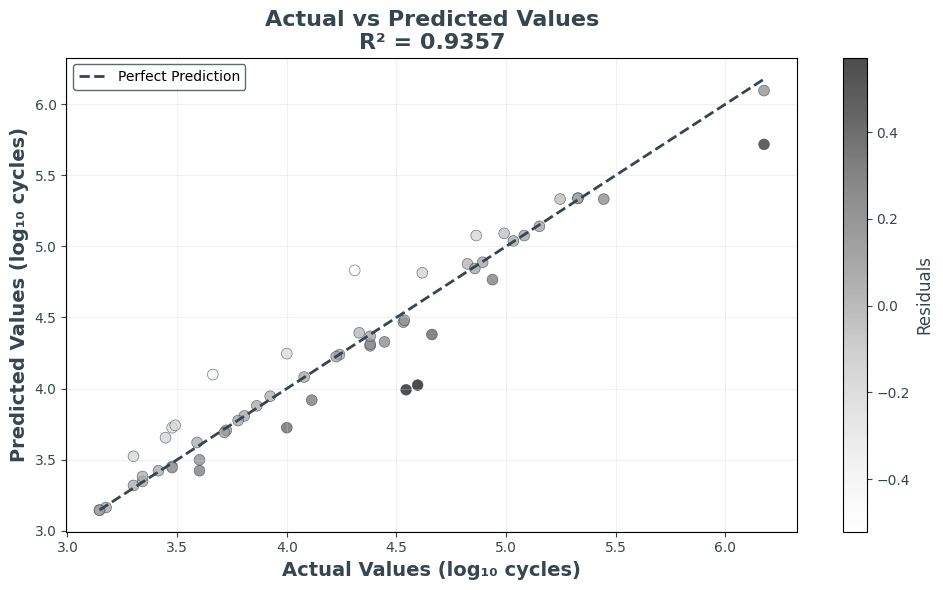

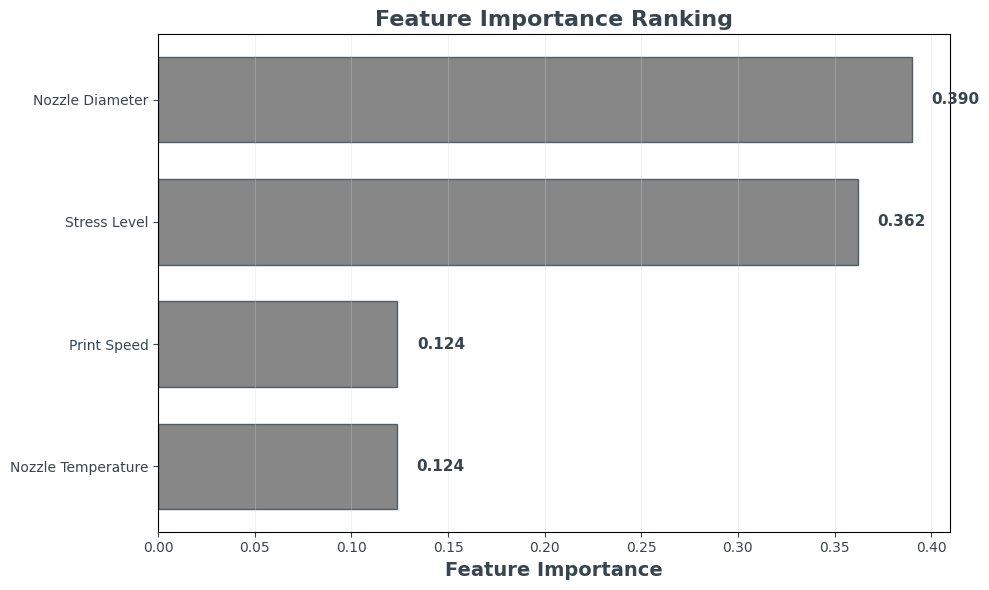

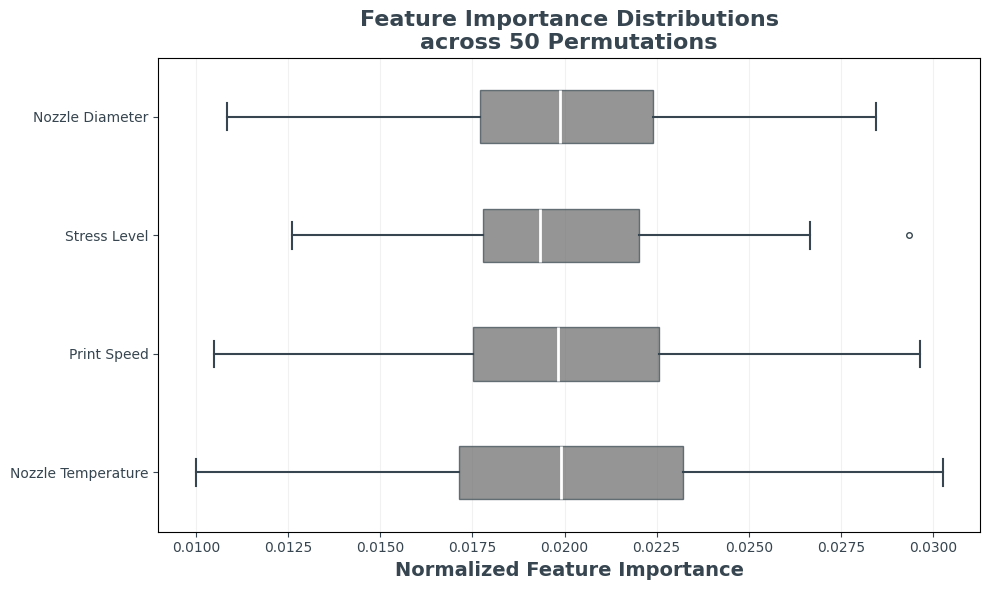

In [ ]:
# =============================================================================
# PLOT 2: Actual vs Predicted - FIXED (No Sky Blue)
# =============================================================================
plt.figure(figsize=(10, 6))
scatter = plt.scatter(y_test, y_pred_log, alpha=0.7, c=residuals_log,
                     cmap='Greys', s=60, edgecolor=charcoal, linewidth=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()],
         '--', linewidth=2, label='Perfect Prediction', color=charcoal)
plt.xlabel('Actual Values (log₁₀ cycles)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('Predicted Values (log₁₀ cycles)', fontsize=14, fontweight='bold', color=charcoal)
plt.title(f'Actual vs Predicted Values\nR² = {metrics_log["R² Score"]:.4f}',
          fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(True, alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
cbar = plt.colorbar(scatter)
cbar.set_label('Residuals', fontsize=12, color=charcoal)
cbar.ax.yaxis.set_tick_params(color=charcoal)
plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color=charcoal)
plt.tight_layout()
plt.savefig('actual_vs_predicted.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 4: Feature Importance - FIXED COLORS
# =============================================================================
plt.figure(figsize=(10, 6))
importance_df_sorted = importance_df.sort_values('Importance', ascending=True)

# Use consistent dark grey for all bars
colors = [dark_grey] * len(importance_df_sorted)

y_pos = np.arange(len(importance_df_sorted))
bars = plt.barh(y_pos, importance_df_sorted['Importance'],
                color=colors, edgecolor=charcoal, alpha=0.8, height=0.7)

plt.yticks(y_pos, importance_df_sorted['Feature'])
plt.xlabel('Feature Importance', fontsize=14, fontweight='bold', color=charcoal)
plt.title('Feature Importance Ranking', fontsize=16, fontweight='bold', color=charcoal)
plt.grid(True, alpha=0.3, axis='x', color=light_grey)
plt.tick_params(colors=charcoal)

# Add value labels
for i, (bar, importance) in enumerate(zip(bars, importance_df_sorted['Importance'])):
    plt.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2,
             f'{importance:.3f}', ha='left', va='center',
             fontweight='bold', fontsize=11, color=charcoal)

plt.tight_layout()
plt.savefig('feature_importance.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 6: Feature Importance Distribution - FIXED COLORS
# =============================================================================
plt.figure(figsize=(10, 6))
box_data = [perm_result.importances[i] for i in importance_df.index]

# Normalize boxplot data to sum to 1.0
box_data_normalized = []
for feature_data in box_data:
    total = np.sum(np.maximum(feature_data, 0))
    if total > 0:
        normalized_data = np.maximum(feature_data, 0) / total
    else:
        normalized_data = np.maximum(feature_data, 0)
    box_data_normalized.append(normalized_data)

# Sort by mean importance (descending order)
sorted_indices = np.argsort([np.mean(data) for data in box_data_normalized])[::-1]
box_data_sorted = [box_data_normalized[i] for i in sorted_indices]
feature_labels_sorted = [importance_df.iloc[i]['Feature'] for i in sorted_indices]

box_plot = plt.boxplot(box_data_sorted, vert=False, patch_artist=True,
                      labels=feature_labels_sorted)

# Color all boxes with dark grey
colors_box = [dark_grey] * len(box_data_sorted)

for patch, color in zip(box_plot['boxes'], colors_box):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
    patch.set_edgecolor(charcoal)

# Style the plot
plt.xlabel('Normalized Feature Importance', fontsize=14, fontweight='bold', color=charcoal)
plt.title('Feature Importance Distributions\nacross 50 Permutations',
          fontsize=16, fontweight='bold', color=charcoal)
plt.grid(True, alpha=0.3, axis='x', color=light_grey)
plt.tick_params(colors=charcoal)

# Style boxplot elements
plt.setp(box_plot['whiskers'], color=charcoal, linewidth=1.5)
plt.setp(box_plot['caps'], color=charcoal, linewidth=1.5)
plt.setp(box_plot['medians'], color='white', linewidth=2)
plt.setp(box_plot['fliers'], markeredgecolor=charcoal, marker='o', markersize=4)

plt.tight_layout()
plt.savefig('feature_importance_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

COMPLETE DNN WITH INDIVIDUAL PLOTS
Dataset: 278 samples, 4 features
Features: ['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level']

Creating Deterministic DNN Model...
DNN Architecture Summary:


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4 (Dense)                 │ (None, 64)             │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,945 (11.50 KB)

 Trainable params: 2,945 (11.50 KB)

 Non-trainable params: 0 (0.00 B)


Training DNN Model...
Epoch 1/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - loss: 0.9895 - mae: 0.8323 - val_loss: 0.7639 - val_mae: 0.7186 - learning_rate: 0.0010
Epoch 2/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.8370 - mae: 0.7536 - val_loss: 0.6391 - val_mae: 0.6496 - learning_rate: 0.0010
Epoch 3/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.7036 - mae: 0.6774 - val_loss: 0.5281 - val_mae: 0.5828 - learning_rate: 0.0010
Epoch 4/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.5786 - mae: 0.6040 - val_loss: 0.4346 - val_mae: 0.5186 - learning_rate: 0.0010
Epoch 5/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.4659 - mae: 0.5333 - val_loss: 0.3617 - val_mae: 0.4630 - learning_rate: 0.0010
Epoch 6/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3719 - mae: 0.4707 - val_loss: 0.3003 - val_mae: 0.4088 - learning_rate: 0.0010
Epoch 7/500
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.2987 - mae: 0.4194 - val_loss: 0.2598 - val_mae: 0.3746 - learning_rate: 0.00

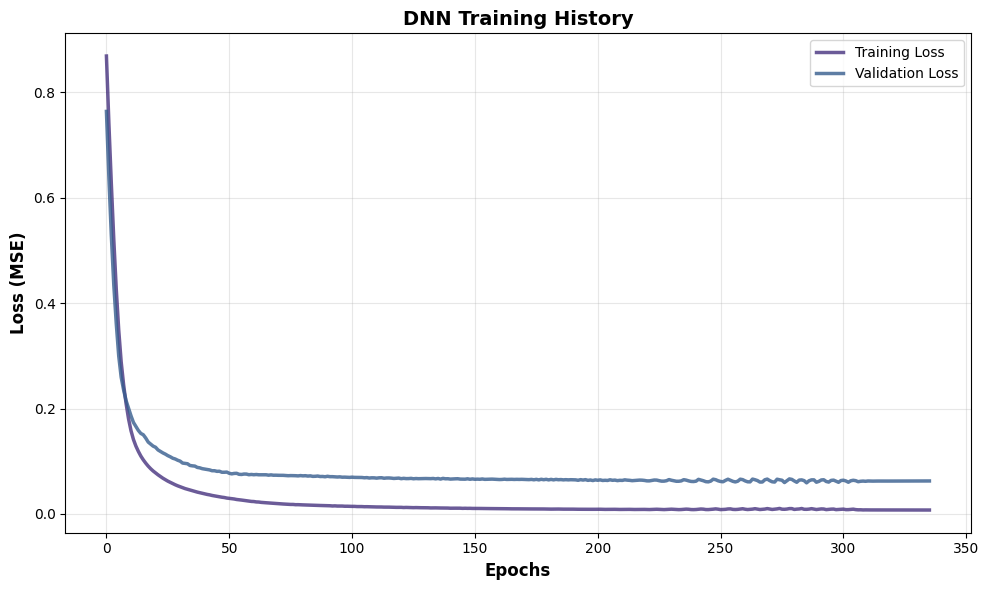

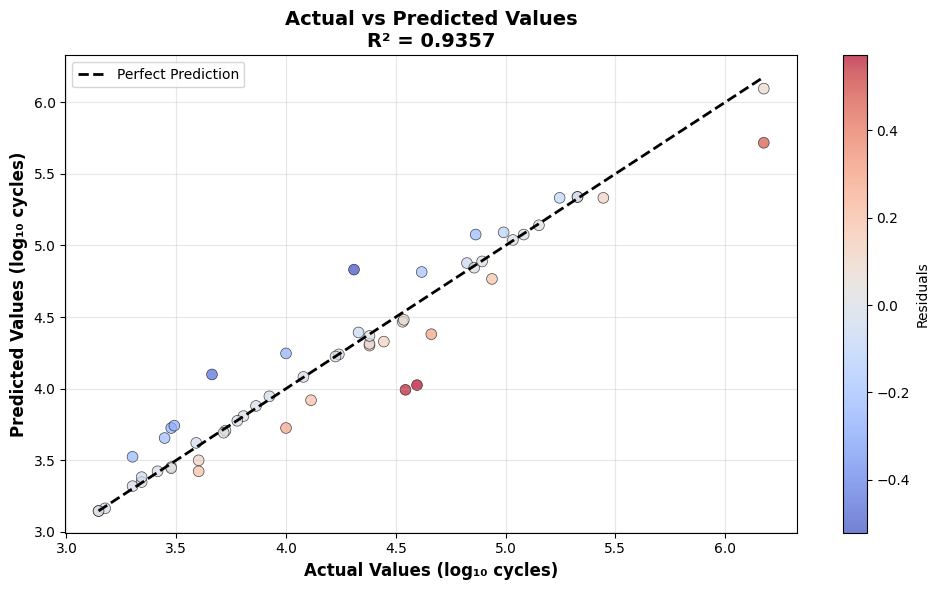

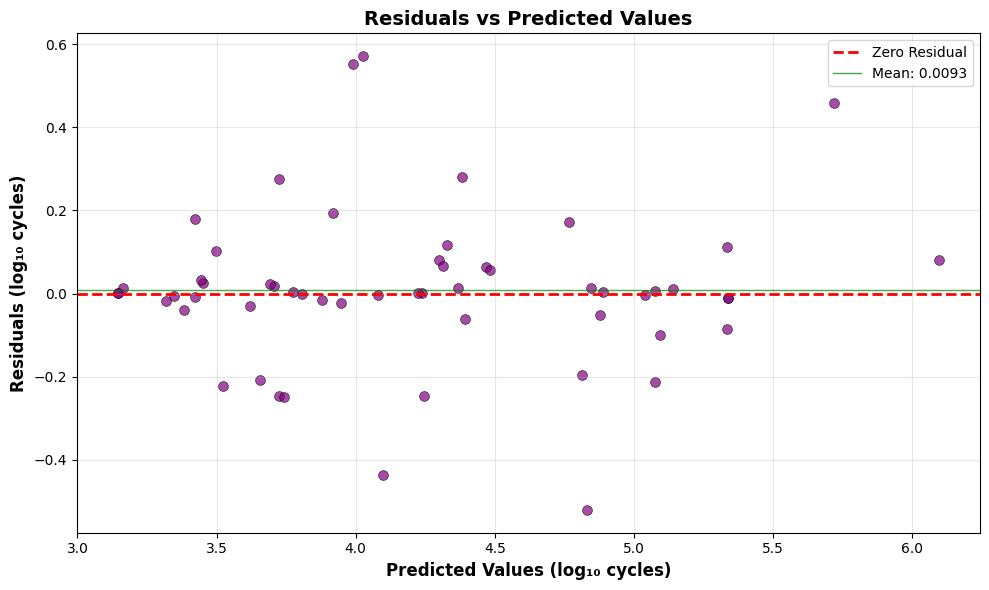

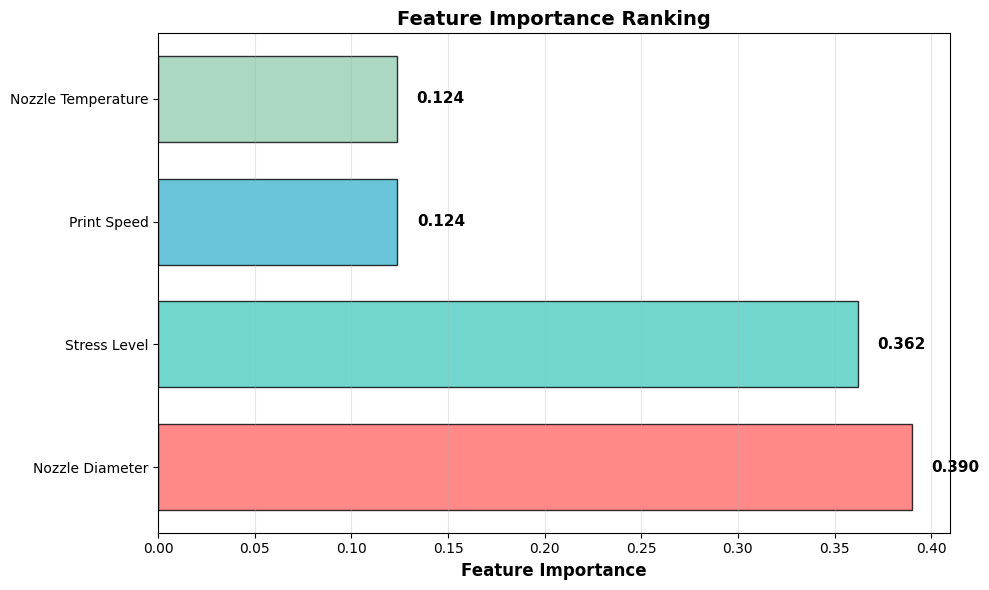

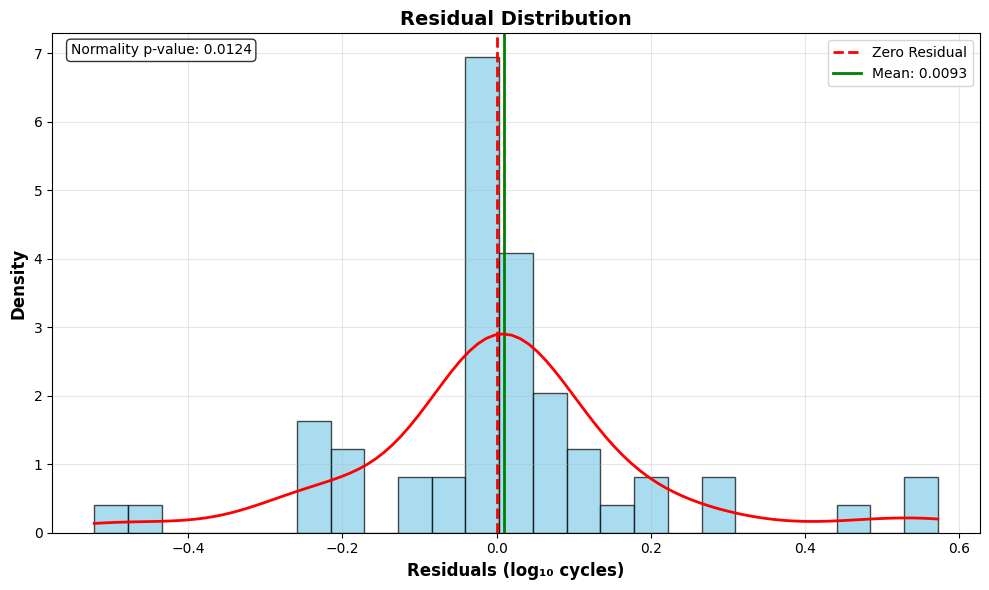

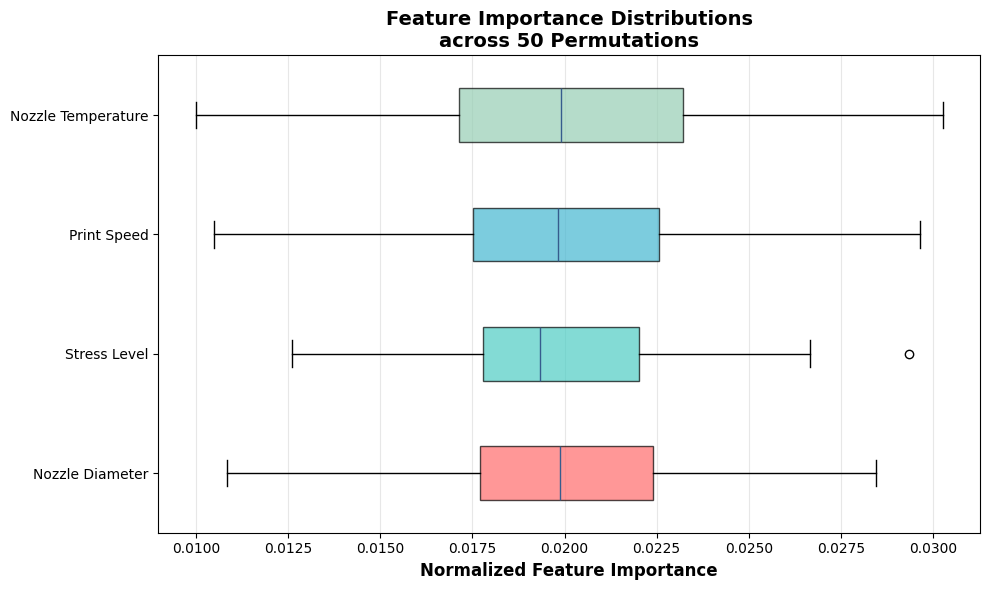


METRICS INTERPRETATION IN ORIGINAL SCALE

📈 KEY METRICS IN ORIGINAL SCALE:
--------------------------------------------------
R² Score                 :     0.758924
MSE                      : 18,524,854,452 cycles
RMSE                     :      136,106 cycles
MAE                      :       29,940 cycles
MAPE                     :        28.35 cycles
Median Absolute Error    :        2,205 cycles

FINAL SUMMARY

🎯 MODEL PERFORMANCE SUMMARY:
R² Score (Log10): 0.935743
RMSE (Log10): 0.189637
MAE (Log10): 0.116859

🏆 FEATURE IMPORTANCE RANKING:
----------------------------------------
 1. Nozzle Diameter      - 0.390
 2. Stress Level         - 0.362
 3. Print Speed          - 0.124
 4. Nozzle Temperature   - 0.124

📊 DATA CHARACTERISTICS:
Training samples: 222
Test samples: 56
Features: 4

💾 INDIVIDUAL PLOTS SAVED:
1. training_history.png
2. actual_vs_predicted.png
3. residuals_vs_predicted.png
4. feature_importance.png
5. residual_distribution.png
6. feature_importance_distribution.p

In [ ]:
# =============================================================================
# COMPLETE DETERMINISTIC DNN WITH INDIVIDUAL PLOTS
# =============================================================================

import tensorflow as tf
import numpy as np
import random
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from sklearn.metrics import (r2_score, mean_squared_error, mean_absolute_error,
                            mean_absolute_percentage_error, explained_variance_score,
                            median_absolute_error, max_error)
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Set ALL random seeds for complete reproducibility
def set_seeds(seed=42):
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    tf.keras.utils.set_random_seed(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
    tf.config.experimental.enable_op_determinism()

set_seeds(42)

print("=" * 70)
print("COMPLETE DNN WITH INDIVIDUAL PLOTS")
print("=" * 70)

# =============================================================================
# DATA LOADING AND PREPROCESSING
# =============================================================================

# Load data
df = pd.read_csv('combined_bootstrap_fatigue.csv')

# Prepare features and target
X = df[['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level']].values
y = np.log10(df['Fatigue Lifetime'].values)  # Log transformation

# Feature names for importance analysis
feature_names = ['Nozzle Diameter', 'Print Speed', 'Nozzle Temperature', 'Stress Level']

print(f"Dataset: {X.shape[0]} samples, {X.shape[1]} features")
print(f"Features: {feature_names}")

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, shuffle=True
)

# Feature scaling
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

# Target scaling
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).flatten()

# =============================================================================
# DETERMINISTIC DNN MODEL
# =============================================================================

def create_deterministic_dnn():
    """Create DNN without dropout for deterministic results"""
    model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(4,)),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dense(16, activation='relu'),
        tf.keras.layers.Dense(1)
    ])
    return model

# Create and compile model
print("\nCreating Deterministic DNN Model...")
dnn_model = create_deterministic_dnn()

dnn_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='mse',
    metrics=['mae']
)

print("DNN Architecture Summary:")
dnn_model.summary()

# =============================================================================
# MODEL TRAINING
# =============================================================================

print("\nTraining DNN Model...")

callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=50,
        restore_best_weights=True,
        verbose=1
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=20,
        min_lr=1e-7,
        verbose=1
    )
]

history = dnn_model.fit(
    X_train_scaled, y_train_scaled,
    validation_data=(X_test_scaled, y_test_scaled),
    epochs=500,
    batch_size=32,
    callbacks=callbacks,
    verbose=1,
    shuffle=False
)

print(f"Training completed after {len(history.history['loss'])} epochs")

# =============================================================================
# COMPREHENSIVE METRICS CALCULATION
# =============================================================================

print("\n" + "=" * 70)
print("COMPREHENSIVE PERFORMANCE METRICS - LOG10 SPACE")
print("=" * 70)

# Predictions
y_pred_log_scaled = dnn_model.predict(X_test_scaled, verbose=0).flatten()
y_pred_log = scaler_y.inverse_transform(y_pred_log_scaled.reshape(-1, 1)).flatten()

# Calculate residuals
residuals_log = y_test - y_pred_log

# COMPREHENSIVE METRICS DICTIONARY
metrics_log = {
    'R² Score': r2_score(y_test, y_pred_log),
    'Explained Variance Score': explained_variance_score(y_test, y_pred_log),
    'Mean Squared Error (MSE)': mean_squared_error(y_test, y_pred_log),
    'Root Mean Squared Error (RMSE)': np.sqrt(mean_squared_error(y_test, y_pred_log)),
    'Mean Absolute Error (MAE)': mean_absolute_error(y_test, y_pred_log),
    'Median Absolute Error': median_absolute_error(y_test, y_pred_log),
    'Mean Absolute Percentage Error (MAPE)': mean_absolute_percentage_error(y_test, y_pred_log) * 100,
    'Max Error': max_error(y_test, y_pred_log),
    'Mean Bias Error': np.mean(y_pred_log - y_test),
    'Relative Absolute Error': np.sum(np.abs(y_test - y_pred_log)) / np.sum(np.abs(y_test - np.mean(y_test))),
    'Relative Squared Error': np.sum((y_test - y_pred_log) ** 2) / np.sum((y_test - np.mean(y_test)) ** 2)
}

# Additional statistical metrics
metrics_log.update({
    'Residual Mean': np.mean(residuals_log),
    'Residual Std': np.std(residuals_log),
    'Residual Skewness': stats.skew(residuals_log),
    'Residual Kurtosis': stats.kurtosis(residuals_log),
    'Residual RMSE': np.sqrt(np.mean(residuals_log ** 2)),
    'Residual MAE': np.mean(np.abs(residuals_log))
})

# Print comprehensive metrics
print("\n📊 COMPREHENSIVE MODEL METRICS (LOG10 SPACE):")
print("-" * 60)
for metric, value in metrics_log.items():
    if 'R²' in metric or 'Score' in metric:
        print(f"{metric:35}: {value:>12.6f}")
    elif 'Percentage' in metric:
        print(f"{metric:35}: {value:>12.4f}%")
    else:
        print(f"{metric:35}: {value:>12.6f}")

# =============================================================================
# NORMALIZED FEATURE IMPORTANCE
# =============================================================================

print("\n" + "=" * 70)
print("NORMALIZED FEATURE IMPORTANCE (SUM = 1.0)")
print("=" * 70)

def normalized_permutation_importance(model, X, y, feature_names, n_repeats=50, random_state=42):
    """Calculate normalized permutation importance that sums to 1.0"""

    print(f"Calculating permutation importance with {n_repeats} repetitions...")

    # Use scikit-learn's permutation_importance
    result = permutation_importance(
        model, X, y,
        n_repeats=n_repeats,
        scoring='r2',
        random_state=random_state,
        n_jobs=-1
    )

    # Get raw importance scores (ensure they're positive)
    raw_importance = np.maximum(result.importances_mean, 0)

    # NORMALIZE to sum = 1.0
    total_importance = np.sum(raw_importance)
    if total_importance > 0:
        normalized_importance = raw_importance / total_importance
    else:
        normalized_importance = raw_importance

    # Create comprehensive results dataframe
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': normalized_importance,
        'Raw_Importance': raw_importance,
        'Raw_Std': result.importances_std
    }).sort_values('Importance', ascending=False)

    # Add correct ranking
    importance_df['Rank'] = range(1, len(importance_df) + 1)

    return importance_df, result

# Calculate normalized importance
importance_df, perm_result = normalized_permutation_importance(
    dnn_model, X_test_scaled, y_test_scaled, feature_names, n_repeats=50
)

# Print clean results
print("\n📊 FEATURE IMPORTANCE:")
print("-" * 40)
print(f"{'Feature':20} {'Importance':>10} {'Rank':>6}")
print("-" * 40)

for _, row in importance_df.iterrows():
    print(f"{row['Feature']:20} {row['Importance']:10.3f} {row['Rank']:6.0f}")

print("-" * 40)
total_importance = importance_df['Importance'].sum()
print(f"{'TOTAL':20} {total_importance:10.3f} {'':6}")

# =============================================================================
# INDIVIDUAL PLOTS
# =============================================================================

print("\n" + "=" * 70)
print("GENERATING INDIVIDUAL PLOTS")
print("=" * 70)

# Set style for publication-quality plots
plt.style.use('default')
sns.set_palette("viridis")

# =============================================================================
# PLOT 1: Training History
# =============================================================================
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss', linewidth=2.5, alpha=0.8)
plt.plot(history.history['val_loss'], label='Validation Loss', linewidth=2.5, alpha=0.8)
plt.xlabel('Epochs', fontsize=12, fontweight='bold')
plt.ylabel('Loss (MSE)', fontsize=12, fontweight='bold')
plt.title('DNN Training History', fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('training_history.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 2: Actual vs Predicted
# =============================================================================
plt.figure(figsize=(10, 6))
scatter = plt.scatter(y_test, y_pred_log, alpha=0.7, c=residuals_log,
                     cmap='coolwarm', s=60, edgecolor='black', linewidth=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()],
         'k--', linewidth=2, label='Perfect Prediction')
plt.xlabel('Actual Values (log₁₀ cycles)', fontsize=12, fontweight='bold')
plt.ylabel('Predicted Values (log₁₀ cycles)', fontsize=12, fontweight='bold')
plt.title(f'Actual vs Predicted Values\nR² = {metrics_log["R² Score"]:.4f}',
          fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter, label='Residuals')
plt.tight_layout()
plt.savefig('actual_vs_predicted.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 3: Residuals vs Predicted
# =============================================================================
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_log, residuals_log, alpha=0.7, color='purple', s=50,
           edgecolor='black', linewidth=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2, label='Zero Residual')
plt.axhline(y=metrics_log['Residual Mean'], color='green', linestyle='-',
           linewidth=1, alpha=0.7, label=f'Mean: {metrics_log["Residual Mean"]:.4f}')
plt.xlabel('Predicted Values (log₁₀ cycles)', fontsize=12, fontweight='bold')
plt.ylabel('Residuals (log₁₀ cycles)', fontsize=12, fontweight='bold')
plt.title('Residuals vs Predicted Values', fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('residuals_vs_predicted.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 4: Feature Importance
# =============================================================================
plt.figure(figsize=(10, 6))
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4']
y_pos = np.arange(len(importance_df))

bars = plt.barh(y_pos, importance_df['Importance'],
                color=colors, edgecolor='black', alpha=0.8, height=0.7)

plt.yticks(y_pos, importance_df['Feature'])
plt.xlabel('Feature Importance', fontsize=12, fontweight='bold')
plt.title('Feature Importance Ranking', fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3, axis='x')

# Add value labels
for i, (bar, importance) in enumerate(zip(bars, importance_df['Importance'])):
    plt.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2,
             f'{importance:.3f}', ha='left', va='center',
             fontweight='bold', fontsize=11)

plt.tight_layout()
plt.savefig('feature_importance.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 5: Residual Distribution
# =============================================================================
plt.figure(figsize=(10, 6))
n, bins, patches = plt.hist(residuals_log, bins=25, alpha=0.7,
                           color='skyblue', edgecolor='black', density=True)
plt.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero Residual')
plt.axvline(x=metrics_log['Residual Mean'], color='green', linestyle='-',
           linewidth=2, label=f'Mean: {metrics_log["Residual Mean"]:.4f}')
plt.xlabel('Residuals (log₁₀ cycles)', fontsize=12, fontweight='bold')
plt.ylabel('Density', fontsize=12, fontweight='bold')
plt.title('Residual Distribution', fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

# Add KDE plot
kde = stats.gaussian_kde(residuals_log)
x_range = np.linspace(residuals_log.min(), residuals_log.max(), 100)
plt.plot(x_range, kde(x_range), 'r-', linewidth=2, label='KDE')

# Add normality test results
_, normality_p = stats.normaltest(residuals_log)
plt.text(0.02, 0.98, f'Normality p-value: {normality_p:.4f}',
         transform=plt.gca().transAxes, fontsize=10, verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.savefig('residual_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 6: Feature Importance Distribution (Boxplot)
# =============================================================================
plt.figure(figsize=(10, 6))
box_data = [perm_result.importances[i] for i in importance_df.index]

# Normalize boxplot data to sum to 1.0
box_data_normalized = []
for feature_data in box_data:
    total = np.sum(np.maximum(feature_data, 0))
    if total > 0:
        normalized_data = np.maximum(feature_data, 0) / total
    else:
        normalized_data = np.maximum(feature_data, 0)
    box_data_normalized.append(normalized_data)

box_plot = plt.boxplot(box_data_normalized, vert=False, patch_artist=True,
                      labels=importance_df['Feature'])

# Color the boxes
for patch, color in zip(box_plot['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

plt.xlabel('Normalized Feature Importance', fontsize=12, fontweight='bold')
plt.title('Feature Importance Distributions\nacross 50 Permutations',
          fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3, axis='x')
plt.tight_layout()
plt.savefig('feature_importance_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# METRICS INTERPRETATION IN ORIGINAL SCALE
# =============================================================================

print("\n" + "=" * 70)
print("METRICS INTERPRETATION IN ORIGINAL SCALE")
print("=" * 70)

# Convert predictions back to original scale for interpretation
y_pred_original = 10 ** y_pred_log
y_test_original = 10 ** y_test

# Calculate key metrics in original scale
metrics_original = {
    'R² Score': r2_score(y_test_original, y_pred_original),
    'MSE': mean_squared_error(y_test_original, y_pred_original),
    'RMSE': np.sqrt(mean_squared_error(y_test_original, y_pred_original)),
    'MAE': mean_absolute_error(y_test_original, y_pred_original),
    'MAPE': mean_absolute_percentage_error(y_test_original, y_pred_original) * 100,
    'Median Absolute Error': median_absolute_error(y_test_original, y_pred_original)
}

print("\n📈 KEY METRICS IN ORIGINAL SCALE:")
print("-" * 50)
for metric, value in metrics_original.items():
    if 'R²' in metric or 'Score' in metric:
        print(f"{metric:25}: {value:>12.6f}")
    elif 'Percentage' in metric:
        print(f"{metric:25}: {value:>12.2f}%")
    elif value > 1000:
        print(f"{metric:25}: {value:>12,.0f} cycles")
    else:
        print(f"{metric:25}: {value:>12.2f} cycles")

# =============================================================================
# FINAL SUMMARY
# =============================================================================

print("\n" + "=" * 70)
print("FINAL SUMMARY")
print("=" * 70)

print(f"\n🎯 MODEL PERFORMANCE SUMMARY:")
print(f"R² Score (Log10): {metrics_log['R² Score']:.6f}")
print(f"RMSE (Log10): {metrics_log['Root Mean Squared Error (RMSE)']:.6f}")
print(f"MAE (Log10): {metrics_log['Mean Absolute Error (MAE)']:.6f}")

print(f"\n🏆 FEATURE IMPORTANCE RANKING:")
print("-" * 40)
for i, (_, row) in enumerate(importance_df.iterrows(), 1):
    print(f"{i:2}. {row['Feature']:20} - {row['Importance']:.3f}")

print(f"\n📊 DATA CHARACTERISTICS:")
print(f"Training samples: {X_train.shape[0]}")
print(f"Test samples: {X_test.shape[0]}")
print(f"Features: {X_train.shape[1]}")

print(f"\n💾 INDIVIDUAL PLOTS SAVED:")
print(f"1. training_history.png")
print(f"2. actual_vs_predicted.png")
print(f"3. residuals_vs_predicted.png")
print(f"4. feature_importance.png")
print(f"5. residual_distribution.png")
print(f"6. feature_importance_distribution.png")

print(f"\n✅ ANALYSIS COMPLETED SUCCESSFULLY!")
print("=" * 70)


📊 R² Scores in Original Scale:
Training R²: 0.9711
Testing R²:  0.7589
All Data R²: 0.9378


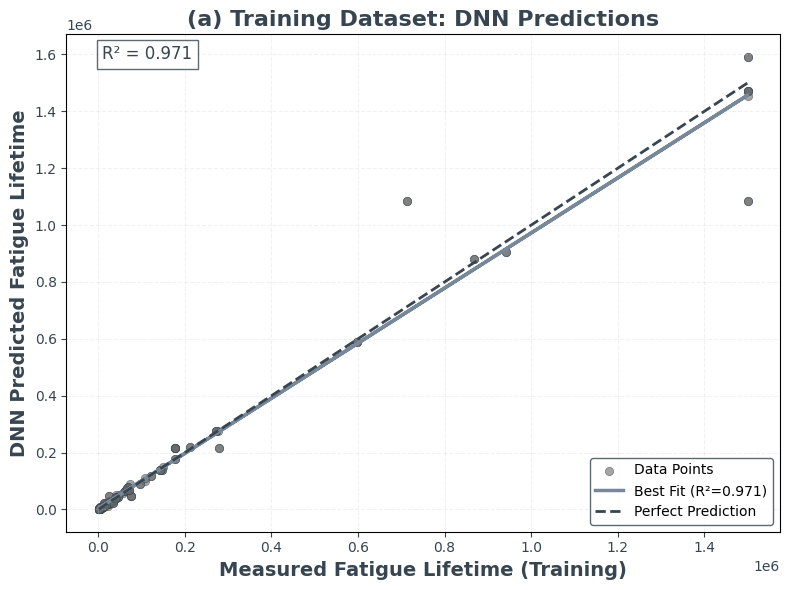

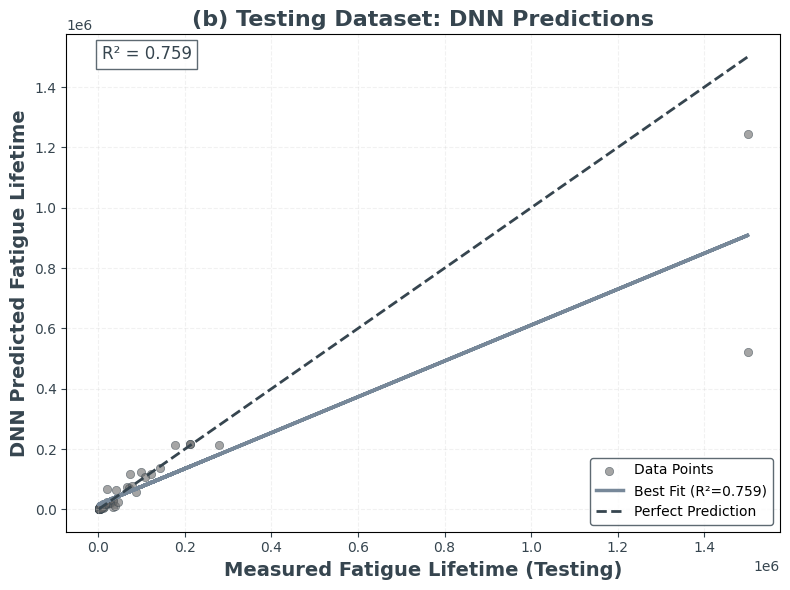

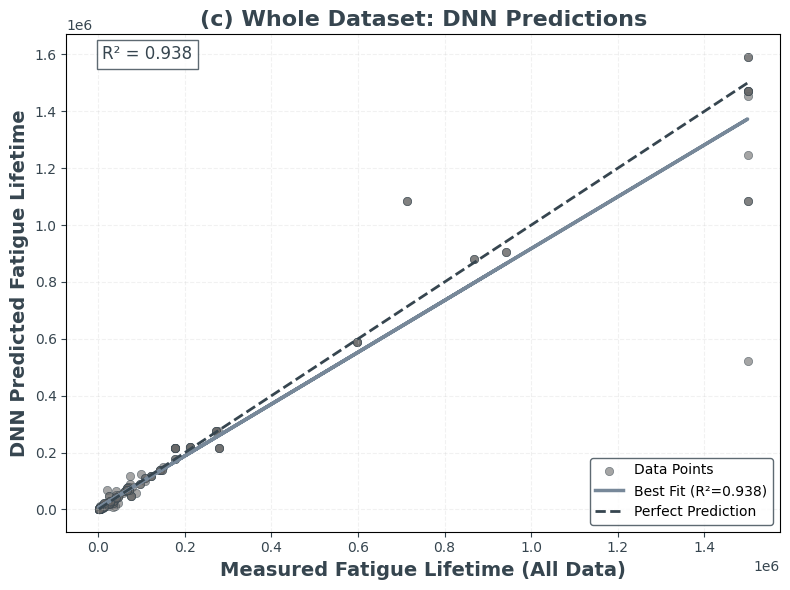

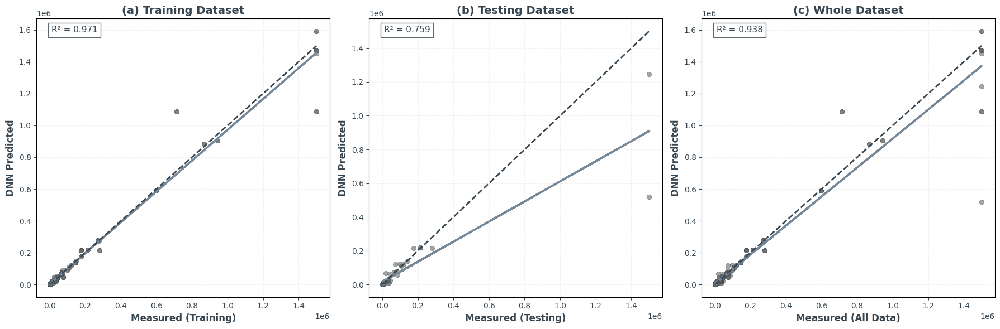


DETAILED PREDICTION STATISTICS

📈 Training Dataset:
   Samples: 222
   R² Score: 0.9711
   Best Fit: y = 0.9687x + 3652.2701
   RMSE: 54764.06 cycles
   MAE: 12640.05 cycles

📊 Testing Dataset:
   Samples: 56
   R² Score: 0.7589
   Best Fit: y = 0.5948x + 16351.6719
   RMSE: 136106.04 cycles
   MAE: 29939.51 cycles

📋 Whole Dataset:
   Samples: 278
   R² Score: 0.9378
   Best Fit: y = 0.9112x + 6148.5608
   RMSE: 78272.55 cycles
   MAE: 16124.83 cycles


In [ ]:
# =============================================================================
# DNN PREDICTION PLOTS (Similar to your porosity example)
# =============================================================================

# First, let's get predictions for training, testing, and all data
y_train_pred_scaled = dnn_model.predict(X_train_scaled, verbose=0).flatten()
y_train_pred = scaler_y.inverse_transform(y_train_pred_scaled.reshape(-1, 1)).flatten()

y_test_pred_scaled = dnn_model.predict(X_test_scaled, verbose=0).flatten()
y_test_pred = scaler_y.inverse_transform(y_test_pred_scaled.reshape(-1, 1)).flatten()

# Predictions for all data
X_all_scaled = scaler_X.transform(X)
y_all_pred_scaled = dnn_model.predict(X_all_scaled, verbose=0).flatten()
y_all_pred = scaler_y.inverse_transform(y_all_pred_scaled.reshape(-1, 1)).flatten()

# Convert back to original scale for plotting
y_train_original = 10 ** y_train
y_test_original = 10 ** y_test
y_all_original = 10 ** y

y_train_pred_original = 10 ** y_train_pred
y_test_pred_original = 10 ** y_test_pred
y_all_pred_original = 10 ** y_all_pred

# Calculate R² scores for each dataset
r2_train = r2_score(y_train_original, y_train_pred_original)
r2_test = r2_score(y_test_original, y_test_pred_original)
r2_all = r2_score(y_all_original, y_all_pred_original)

print(f"\n📊 R² Scores in Original Scale:")
print(f"Training R²: {r2_train:.4f}")
print(f"Testing R²:  {r2_test:.4f}")
print(f"All Data R²: {r2_all:.4f}")

# =============================================================================
# PLOT 1: Training Dataset Predictions
# =============================================================================
plt.figure(figsize=(8, 6))
plt.scatter(y_train_original, y_train_pred_original, alpha=0.6, color=dark_grey,
           label='Data Points', edgecolors=charcoal, linewidth=0.5)

# Calculate best fit line
m_train, b_train = np.polyfit(y_train_original, y_train_pred_original, 1)
plt.plot(y_train_original, m_train*y_train_original + b_train, color=ash_grey,
         linewidth=2.5, label=f'Best Fit (R²={r2_train:.3f})')

# Perfect prediction line
plt.plot([y_all_original.min(), y_all_original.max()],
         [y_all_original.min(), y_all_original.max()], '--', color=charcoal,
         linewidth=2, label='Perfect Prediction')

plt.xlabel('Measured Fatigue Lifetime (Training)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('DNN Predicted Fatigue Lifetime', fontsize=14, fontweight='bold', color=charcoal)
plt.title('(a) Training Dataset: DNN Predictions', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)

# Add R² text box
plt.text(0.05, 0.95, f'R² = {r2_train:.3f}', transform=plt.gca().transAxes,
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
         fontfamily=plt.rcParams['font.family'], color=charcoal)

plt.tight_layout()
plt.savefig('dnn_training_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 2: Testing Dataset Predictions
# =============================================================================
plt.figure(figsize=(8, 6))
plt.scatter(y_test_original, y_test_pred_original, alpha=0.6, color=dark_grey,
           label='Data Points', edgecolors=charcoal, linewidth=0.5)

# Calculate best fit line
m_test, b_test = np.polyfit(y_test_original, y_test_pred_original, 1)
plt.plot(y_test_original, m_test*y_test_original + b_test, color=ash_grey,
         linewidth=2.5, label=f'Best Fit (R²={r2_test:.3f})')

# Perfect prediction line
plt.plot([y_all_original.min(), y_all_original.max()],
         [y_all_original.min(), y_all_original.max()], '--', color=charcoal,
         linewidth=2, label='Perfect Prediction')

plt.xlabel('Measured Fatigue Lifetime (Testing)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('DNN Predicted Fatigue Lifetime', fontsize=14, fontweight='bold', color=charcoal)
plt.title('(b) Testing Dataset: DNN Predictions', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)

# Add R² text box
plt.text(0.05, 0.95, f'R² = {r2_test:.3f}', transform=plt.gca().transAxes,
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
         fontfamily=plt.rcParams['font.family'], color=charcoal)

plt.tight_layout()
plt.savefig('dnn_testing_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 3: Whole Dataset Predictions
# =============================================================================
plt.figure(figsize=(8, 6))
plt.scatter(y_all_original, y_all_pred_original, alpha=0.6, color=dark_grey,
           label='Data Points', edgecolors=charcoal, linewidth=0.5)

# Calculate best fit line
m_all, b_all = np.polyfit(y_all_original, y_all_pred_original, 1)
plt.plot(y_all_original, m_all*y_all_original + b_all, color=ash_grey,
         linewidth=2.5, label=f'Best Fit (R²={r2_all:.3f})')

# Perfect prediction line
plt.plot([y_all_original.min(), y_all_original.max()],
         [y_all_original.min(), y_all_original.max()], '--', color=charcoal,
         linewidth=2, label='Perfect Prediction')

plt.xlabel('Measured Fatigue Lifetime (All Data)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('DNN Predicted Fatigue Lifetime', fontsize=14, fontweight='bold', color=charcoal)
plt.title('(c) Whole Dataset: DNN Predictions', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)

# Add R² text box
plt.text(0.05, 0.95, f'R² = {r2_all:.3f}', transform=plt.gca().transAxes,
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
         fontfamily=plt.rcParams['font.family'], color=charcoal)

plt.tight_layout()
plt.savefig('dnn_all_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# Additional: Combined subplot version
# =============================================================================
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Training data
axes[0].scatter(y_train_original, y_train_pred_original, alpha=0.6, color=dark_grey,
               edgecolors=charcoal, linewidth=0.5)
axes[0].plot(y_train_original, m_train*y_train_original + b_train, color=ash_grey, linewidth=2.5)
axes[0].plot([y_all_original.min(), y_all_original.max()],
            [y_all_original.min(), y_all_original.max()], '--', color=charcoal, linewidth=2)
axes[0].set_xlabel('Measured (Training)', fontsize=12, fontweight='bold', color=charcoal)
axes[0].set_ylabel('DNN Predicted', fontsize=12, fontweight='bold', color=charcoal)
axes[0].set_title('(a) Training Dataset', fontsize=14, fontweight='bold', color=charcoal)
axes[0].grid(linestyle='--', alpha=0.3, color=light_grey)
axes[0].tick_params(colors=charcoal)
axes[0].text(0.05, 0.95, f'R² = {r2_train:.3f}', transform=axes[0].transAxes,
            fontsize=11, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
            fontfamily=plt.rcParams['font.family'], color=charcoal)

# Testing data
axes[1].scatter(y_test_original, y_test_pred_original, alpha=0.6, color=dark_grey,
               edgecolors=charcoal, linewidth=0.5)
axes[1].plot(y_test_original, m_test*y_test_original + b_test, color=ash_grey, linewidth=2.5)
axes[1].plot([y_all_original.min(), y_all_original.max()],
            [y_all_original.min(), y_all_original.max()], '--', color=charcoal, linewidth=2)
axes[1].set_xlabel('Measured (Testing)', fontsize=12, fontweight='bold', color=charcoal)
axes[1].set_ylabel('DNN Predicted', fontsize=12, fontweight='bold', color=charcoal)
axes[1].set_title('(b) Testing Dataset', fontsize=14, fontweight='bold', color=charcoal)
axes[1].grid(linestyle='--', alpha=0.3, color=light_grey)
axes[1].tick_params(colors=charcoal)
axes[1].text(0.05, 0.95, f'R² = {r2_test:.3f}', transform=axes[1].transAxes,
            fontsize=11, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
            fontfamily=plt.rcParams['font.family'], color=charcoal)

# All data
axes[2].scatter(y_all_original, y_all_pred_original, alpha=0.6, color=dark_grey,
               edgecolors=charcoal, linewidth=0.5)
axes[2].plot(y_all_original, m_all*y_all_original + b_all, color=ash_grey, linewidth=2.5)
axes[2].plot([y_all_original.min(), y_all_original.max()],
            [y_all_original.min(), y_all_original.max()], '--', color=charcoal, linewidth=2)
axes[2].set_xlabel('Measured (All Data)', fontsize=12, fontweight='bold', color=charcoal)
axes[2].set_ylabel('DNN Predicted', fontsize=12, fontweight='bold', color=charcoal)
axes[2].set_title('(c) Whole Dataset', fontsize=14, fontweight='bold', color=charcoal)
axes[2].grid(linestyle='--', alpha=0.3, color=light_grey)
axes[2].tick_params(colors=charcoal)
axes[2].text(0.05, 0.95, f'R² = {r2_all:.3f}', transform=axes[2].transAxes,
            fontsize=11, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
            fontfamily=plt.rcParams['font.family'], color=charcoal)

plt.tight_layout()
plt.savefig('dnn_combined_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# Print detailed statistics
# =============================================================================
print("\n" + "=" * 70)
print("DETAILED PREDICTION STATISTICS")
print("=" * 70)

print(f"\n📈 Training Dataset:")
print(f"   Samples: {len(y_train_original)}")
print(f"   R² Score: {r2_train:.4f}")
print(f"   Best Fit: y = {m_train:.4f}x + {b_train:.4f}")
print(f"   RMSE: {np.sqrt(mean_squared_error(y_train_original, y_train_pred_original)):.2f} cycles")
print(f"   MAE: {mean_absolute_error(y_train_original, y_train_pred_original):.2f} cycles")

print(f"\n📊 Testing Dataset:")
print(f"   Samples: {len(y_test_original)}")
print(f"   R² Score: {r2_test:.4f}")
print(f"   Best Fit: y = {m_test:.4f}x + {b_test:.4f}")
print(f"   RMSE: {np.sqrt(mean_squared_error(y_test_original, y_test_pred_original)):.2f} cycles")
print(f"   MAE: {mean_absolute_error(y_test_original, y_test_pred_original):.2f} cycles")

print(f"\n📋 Whole Dataset:")
print(f"   Samples: {len(y_all_original)}")
print(f"   R² Score: {r2_all:.4f}")
print(f"   Best Fit: y = {m_all:.4f}x + {b_all:.4f}")
print(f"   RMSE: {np.sqrt(mean_squared_error(y_all_original, y_all_pred_original)):.2f} cycles")
print(f"   MAE: {mean_absolute_error(y_all_original, y_all_pred_original):.2f} cycles")


DNN PREDICTION PLOTS - LOG10 SCALE
Generating predictions for training, testing, and all data...



📊 R² Scores in Log10 Scale:
Training R²: 0.9921
Testing R²:  0.9357
All Data R²: 0.9815


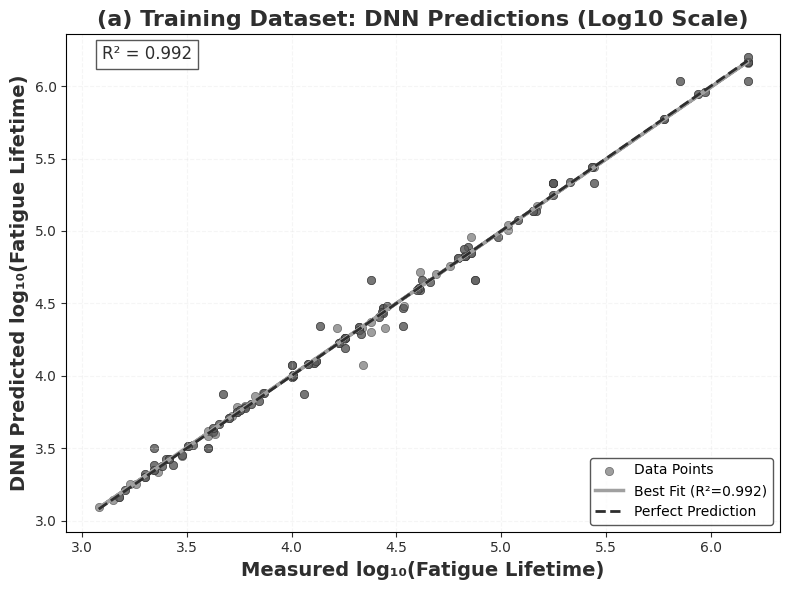

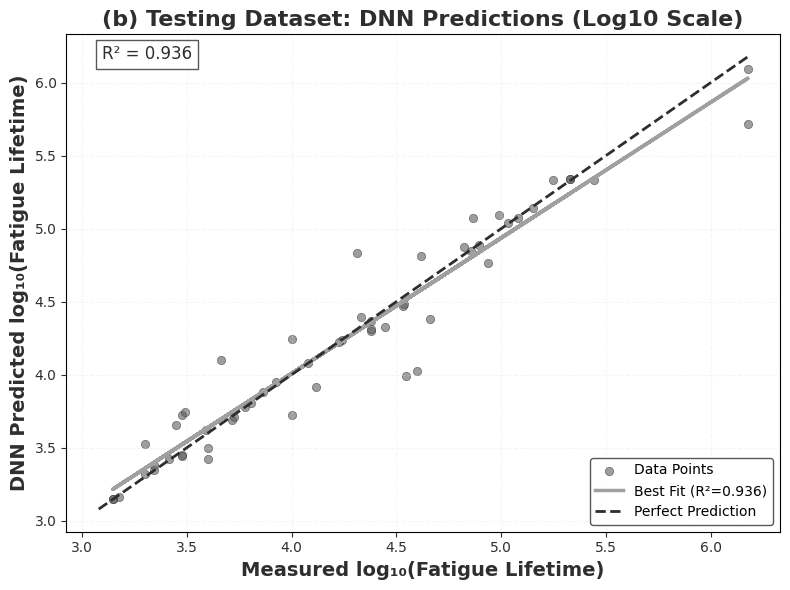

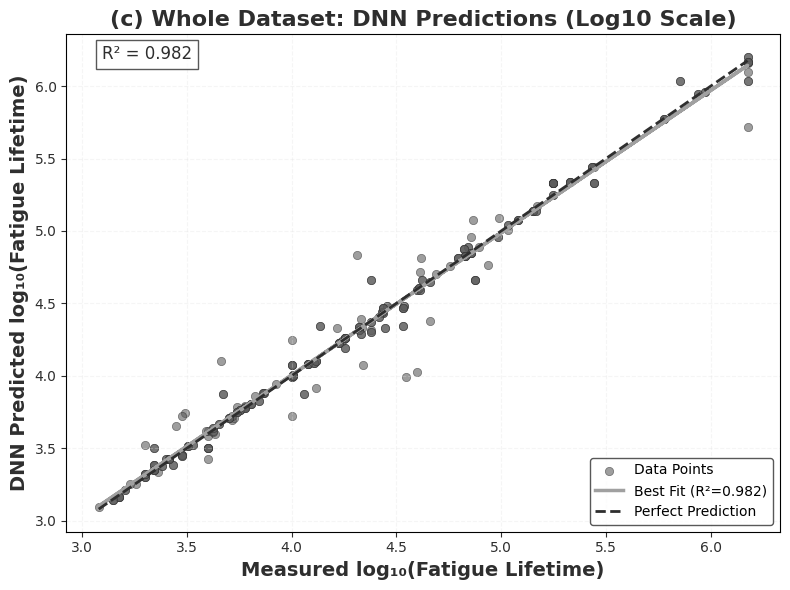


Generating combined subplot...


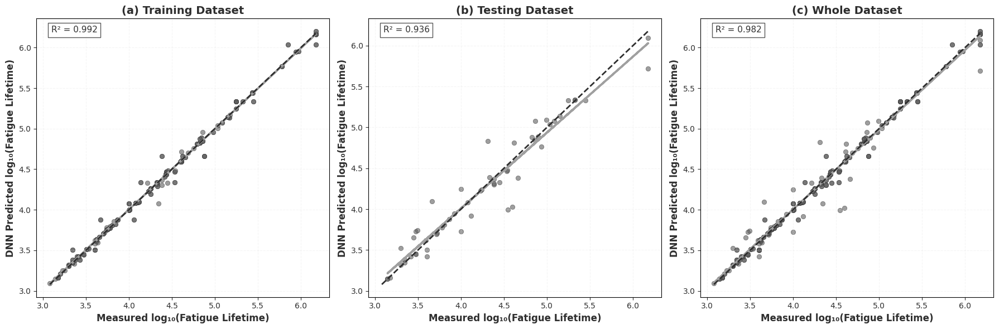


DETAILED PREDICTION STATISTICS - LOG10 SCALE

📈 Training Dataset (Log10):
   Samples: 222
   R² Score: 0.9921
   Best Fit: y = 0.9948x + 0.0237
   RMSE: 0.0695 log10(cycles)
   MAE: 0.0376 log10(cycles)
   MSE: 0.004829

📊 Testing Dataset (Log10):
   Samples: 56
   R² Score: 0.9357
   Best Fit: y = 0.9286x + 0.2935
   RMSE: 0.1896 log10(cycles)
   MAE: 0.1169 log10(cycles)
   MSE: 0.035962

📋 Whole Dataset (Log10):
   Samples: 278
   R² Score: 0.9815
   Best Fit: y = 0.9827x + 0.0739
   RMSE: 0.1054 log10(cycles)
   MAE: 0.0536 log10(cycles)
   MSE: 0.011100

RESIDUAL ANALYSIS - LOG10 SCALE

📊 Residual Statistics (Log10):
Training - Mean: -0.001348, Std: 0.069475
Testing  - Mean: 0.009306, Std: 0.189408
All Data - Mean: 0.000798, Std: 0.105354


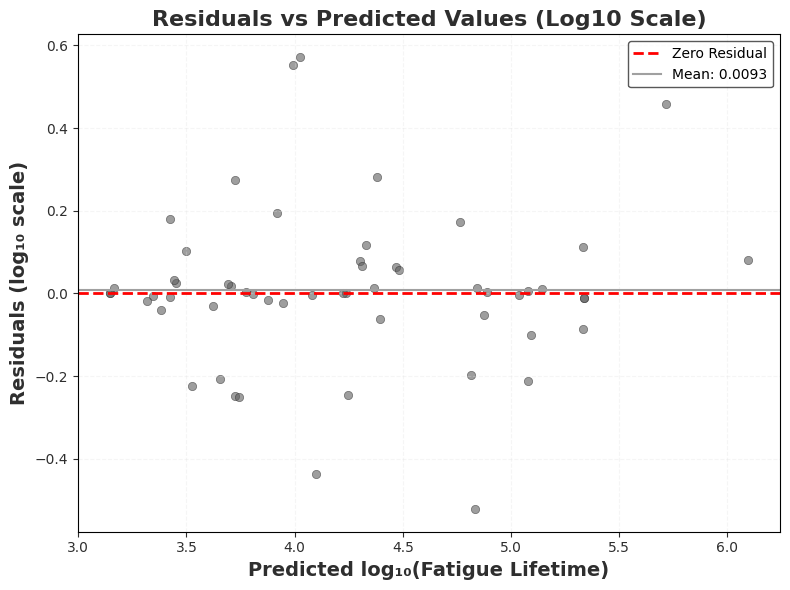


💾 LOG10 PREDICTION PLOTS SAVED:
1. dnn_training_predictions_log10.png
2. dnn_testing_predictions_log10.png
3. dnn_all_predictions_log10.png
4. dnn_combined_predictions_log10.png
5. dnn_residuals_log10.png

✅ DNN PREDICTION ANALYSIS (LOG10 SCALE) COMPLETED!


In [ ]:
# =============================================================================
# DNN PREDICTION PLOTS - LOG10 SCALE
# =============================================================================

# Define color palette
charcoal = '#2E2E2E'
dark_grey = '#5D5D5D'
ash_grey = '#A0A0A0'
light_grey = '#E0E0E0'

# Set font properties
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']

print("\n" + "=" * 70)
print("DNN PREDICTION PLOTS - LOG10 SCALE")
print("=" * 70)

# Get predictions for training, testing, and all data (already in log10 scale)
print("Generating predictions for training, testing, and all data...")
y_train_pred_scaled = dnn_model.predict(X_train_scaled, verbose=0).flatten()
y_train_pred_log = scaler_y.inverse_transform(y_train_pred_scaled.reshape(-1, 1)).flatten()

y_test_pred_scaled = dnn_model.predict(X_test_scaled, verbose=0).flatten()
y_test_pred_log = scaler_y.inverse_transform(y_test_pred_scaled.reshape(-1, 1)).flatten()

# Predictions for all data
X_all_scaled = scaler_X.transform(X)
y_all_pred_scaled = dnn_model.predict(X_all_scaled, verbose=0).flatten()
y_all_pred_log = scaler_y.inverse_transform(y_all_pred_scaled.reshape(-1, 1)).flatten()

# Note: y_train, y_test, y_all are already in log10 scale from your preprocessing
y_train_log = y_train
y_test_log = y_test
y_all_log = y

# Calculate R² scores for each dataset in log10 scale
r2_train_log = r2_score(y_train_log, y_train_pred_log)
r2_test_log = r2_score(y_test_log, y_test_pred_log)
r2_all_log = r2_score(y_all_log, y_all_pred_log)

print(f"\n📊 R² Scores in Log10 Scale:")
print(f"Training R²: {r2_train_log:.4f}")
print(f"Testing R²:  {r2_test_log:.4f}")
print(f"All Data R²: {r2_all_log:.4f}")

# =============================================================================
# PLOT 1: Training Dataset Predictions (Log10)
# =============================================================================
plt.figure(figsize=(8, 6))
plt.scatter(y_train_log, y_train_pred_log, alpha=0.6, color=dark_grey,
           label='Data Points', edgecolors=charcoal, linewidth=0.5)

# Calculate best fit line
m_train, b_train = np.polyfit(y_train_log, y_train_pred_log, 1)
plt.plot(y_train_log, m_train*y_train_log + b_train, color=ash_grey,
         linewidth=2.5, label=f'Best Fit (R²={r2_train_log:.3f})')

# Perfect prediction line
plt.plot([y_all_log.min(), y_all_log.max()],
         [y_all_log.min(), y_all_log.max()], '--', color=charcoal,
         linewidth=2, label='Perfect Prediction')

plt.xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('(a) Training Dataset: DNN Predictions (Log10 Scale)', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)

# Add R² text box
plt.text(0.05, 0.95, f'R² = {r2_train_log:.3f}', transform=plt.gca().transAxes,
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
         fontfamily=plt.rcParams['font.family'], color=charcoal)

plt.tight_layout()
plt.savefig('dnn_training_predictions_log10.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 2: Testing Dataset Predictions (Log10)
# =============================================================================
plt.figure(figsize=(8, 6))
plt.scatter(y_test_log, y_test_pred_log, alpha=0.6, color=dark_grey,
           label='Data Points', edgecolors=charcoal, linewidth=0.5)

# Calculate best fit line
m_test, b_test = np.polyfit(y_test_log, y_test_pred_log, 1)
plt.plot(y_test_log, m_test*y_test_log + b_test, color=ash_grey,
         linewidth=2.5, label=f'Best Fit (R²={r2_test_log:.3f})')

# Perfect prediction line
plt.plot([y_all_log.min(), y_all_log.max()],
         [y_all_log.min(), y_all_log.max()], '--', color=charcoal,
         linewidth=2, label='Perfect Prediction')

plt.xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('(b) Testing Dataset: DNN Predictions (Log10 Scale)', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)

# Add R² text box
plt.text(0.05, 0.95, f'R² = {r2_test_log:.3f}', transform=plt.gca().transAxes,
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
         fontfamily=plt.rcParams['font.family'], color=charcoal)

plt.tight_layout()
plt.savefig('dnn_testing_predictions_log10.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 3: Whole Dataset Predictions (Log10)
# =============================================================================
plt.figure(figsize=(8, 6))
plt.scatter(y_all_log, y_all_pred_log, alpha=0.6, color=dark_grey,
           label='Data Points', edgecolors=charcoal, linewidth=0.5)

# Calculate best fit line
m_all, b_all = np.polyfit(y_all_log, y_all_pred_log, 1)
plt.plot(y_all_log, m_all*y_all_log + b_all, color=ash_grey,
         linewidth=2.5, label=f'Best Fit (R²={r2_all_log:.3f})')

# Perfect prediction line
plt.plot([y_all_log.min(), y_all_log.max()],
         [y_all_log.min(), y_all_log.max()], '--', color=charcoal,
         linewidth=2, label='Perfect Prediction')

plt.xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('(c) Whole Dataset: DNN Predictions (Log10 Scale)', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)

# Add R² text box
plt.text(0.05, 0.95, f'R² = {r2_all_log:.3f}', transform=plt.gca().transAxes,
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
         fontfamily=plt.rcParams['font.family'], color=charcoal)

plt.tight_layout()
plt.savefig('dnn_all_predictions_log10.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# Additional: Combined subplot version (Log10)
# =============================================================================
print("\nGenerating combined subplot...")
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Training data
axes[0].scatter(y_train_log, y_train_pred_log, alpha=0.6, color=dark_grey,
               edgecolors=charcoal, linewidth=0.5)
axes[0].plot(y_train_log, m_train*y_train_log + b_train, color=ash_grey, linewidth=2.5)
axes[0].plot([y_all_log.min(), y_all_log.max()],
            [y_all_log.min(), y_all_log.max()], '--', color=charcoal, linewidth=2)
axes[0].set_xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[0].set_ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[0].set_title('(a) Training Dataset', fontsize=14, fontweight='bold', color=charcoal)
axes[0].grid(linestyle='--', alpha=0.3, color=light_grey)
axes[0].tick_params(colors=charcoal)
axes[0].text(0.05, 0.95, f'R² = {r2_train_log:.3f}', transform=axes[0].transAxes,
            fontsize=11, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
            fontfamily=plt.rcParams['font.family'], color=charcoal)

# Testing data
axes[1].scatter(y_test_log, y_test_pred_log, alpha=0.6, color=dark_grey,
               edgecolors=charcoal, linewidth=0.5)
axes[1].plot(y_test_log, m_test*y_test_log + b_test, color=ash_grey, linewidth=2.5)
axes[1].plot([y_all_log.min(), y_all_log.max()],
            [y_all_log.min(), y_all_log.max()], '--', color=charcoal, linewidth=2)
axes[1].set_xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[1].set_ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[1].set_title('(b) Testing Dataset', fontsize=14, fontweight='bold', color=charcoal)
axes[1].grid(linestyle='--', alpha=0.3, color=light_grey)
axes[1].tick_params(colors=charcoal)
axes[1].text(0.05, 0.95, f'R² = {r2_test_log:.3f}', transform=axes[1].transAxes,
            fontsize=11, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
            fontfamily=plt.rcParams['font.family'], color=charcoal)

# All data
axes[2].scatter(y_all_log, y_all_pred_log, alpha=0.6, color=dark_grey,
               edgecolors=charcoal, linewidth=0.5)
axes[2].plot(y_all_log, m_all*y_all_log + b_all, color=ash_grey, linewidth=2.5)
axes[2].plot([y_all_log.min(), y_all_log.max()],
            [y_all_log.min(), y_all_log.max()], '--', color=charcoal, linewidth=2)
axes[2].set_xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[2].set_ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[2].set_title('(c) Whole Dataset', fontsize=14, fontweight='bold', color=charcoal)
axes[2].grid(linestyle='--', alpha=0.3, color=light_grey)
axes[2].tick_params(colors=charcoal)
axes[2].text(0.05, 0.95, f'R² = {r2_all_log:.3f}', transform=axes[2].transAxes,
            fontsize=11, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
            fontfamily=plt.rcParams['font.family'], color=charcoal)

plt.tight_layout()
plt.savefig('dnn_combined_predictions_log10.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# Print detailed statistics (Log10 Scale)
# =============================================================================
print("\n" + "=" * 70)
print("DETAILED PREDICTION STATISTICS - LOG10 SCALE")
print("=" * 70)

print(f"\n📈 Training Dataset (Log10):")
print(f"   Samples: {len(y_train_log)}")
print(f"   R² Score: {r2_train_log:.4f}")
print(f"   Best Fit: y = {m_train:.4f}x + {b_train:.4f}")
print(f"   RMSE: {np.sqrt(mean_squared_error(y_train_log, y_train_pred_log)):.4f} log10(cycles)")
print(f"   MAE: {mean_absolute_error(y_train_log, y_train_pred_log):.4f} log10(cycles)")
print(f"   MSE: {mean_squared_error(y_train_log, y_train_pred_log):.6f}")

print(f"\n📊 Testing Dataset (Log10):")
print(f"   Samples: {len(y_test_log)}")
print(f"   R² Score: {r2_test_log:.4f}")
print(f"   Best Fit: y = {m_test:.4f}x + {b_test:.4f}")
print(f"   RMSE: {np.sqrt(mean_squared_error(y_test_log, y_test_pred_log)):.4f} log10(cycles)")
print(f"   MAE: {mean_absolute_error(y_test_log, y_test_pred_log):.4f} log10(cycles)")
print(f"   MSE: {mean_squared_error(y_test_log, y_test_pred_log):.6f}")

print(f"\n📋 Whole Dataset (Log10):")
print(f"   Samples: {len(y_all_log)}")
print(f"   R² Score: {r2_all_log:.4f}")
print(f"   Best Fit: y = {m_all:.4f}x + {b_all:.4f}")
print(f"   RMSE: {np.sqrt(mean_squared_error(y_all_log, y_all_pred_log)):.4f} log10(cycles)")
print(f"   MAE: {mean_absolute_error(y_all_log, y_all_pred_log):.4f} log10(cycles)")
print(f"   MSE: {mean_squared_error(y_all_log, y_all_pred_log):.6f}")

# =============================================================================
# Additional: Residual Analysis in Log10 Scale
# =============================================================================
print("\n" + "=" * 70)
print("RESIDUAL ANALYSIS - LOG10 SCALE")
print("=" * 70)

# Calculate residuals in log10 scale
residuals_train_log = y_train_log - y_train_pred_log
residuals_test_log = y_test_log - y_test_pred_log
residuals_all_log = y_all_log - y_all_pred_log

print(f"\n📊 Residual Statistics (Log10):")
print(f"Training - Mean: {np.mean(residuals_train_log):.6f}, Std: {np.std(residuals_train_log):.6f}")
print(f"Testing  - Mean: {np.mean(residuals_test_log):.6f}, Std: {np.std(residuals_test_log):.6f}")
print(f"All Data - Mean: {np.mean(residuals_all_log):.6f}, Std: {np.std(residuals_all_log):.6f}")

# Residual plot for test data
plt.figure(figsize=(8, 6))
plt.scatter(y_test_pred_log, residuals_test_log, alpha=0.6, color=dark_grey,
           edgecolors=charcoal, linewidth=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2, label='Zero Residual')
plt.axhline(y=np.mean(residuals_test_log), color=ash_grey, linestyle='-',
           linewidth=1.5, label=f'Mean: {np.mean(residuals_test_log):.4f}')
plt.xlabel('Predicted log₁₀(Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('Residuals (log₁₀ scale)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('Residuals vs Predicted Values (Log10 Scale)', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.savefig('dnn_residuals_log10.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n💾 LOG10 PREDICTION PLOTS SAVED:")
print(f"1. dnn_training_predictions_log10.png")
print(f"2. dnn_testing_predictions_log10.png")
print(f"3. dnn_all_predictions_log10.png")
print(f"4. dnn_combined_predictions_log10.png")
print(f"5. dnn_residuals_log10.png")

print(f"\n✅ DNN PREDICTION ANALYSIS (LOG10 SCALE) COMPLETED!")
print("=" * 70)

#Plot (prediction bar)



DNN PREDICTION PLOTS - LOG10 SCALE
Generating predictions for training, testing, and all data...

📊 R² Scores in Log10 Scale:
Training R²: 0.9921
Testing R²:  0.9357
All Data R²: 0.9815


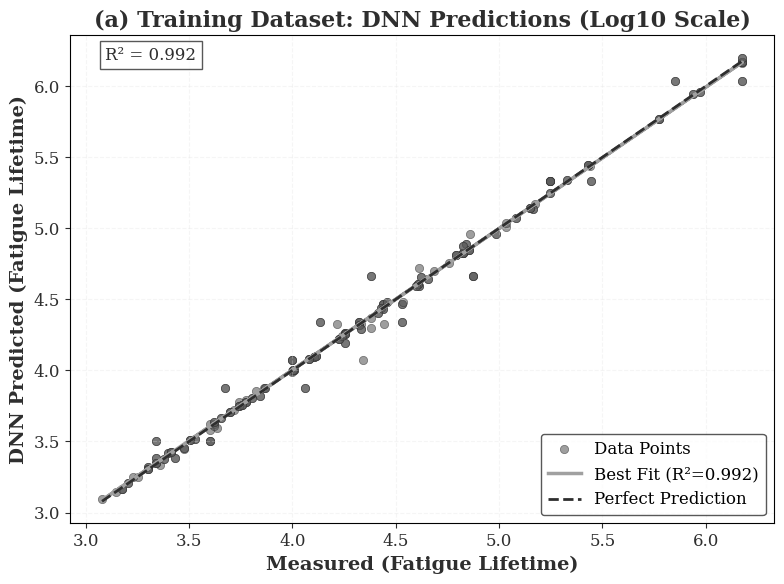

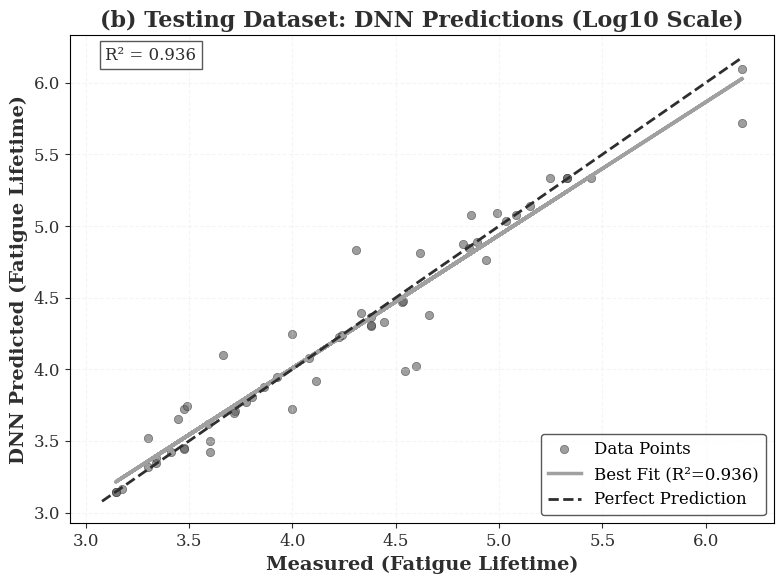

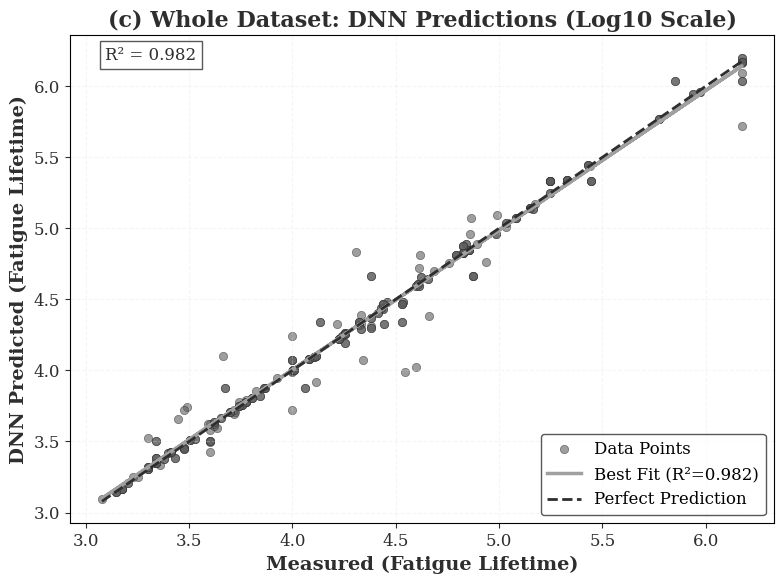


Generating combined subplot...


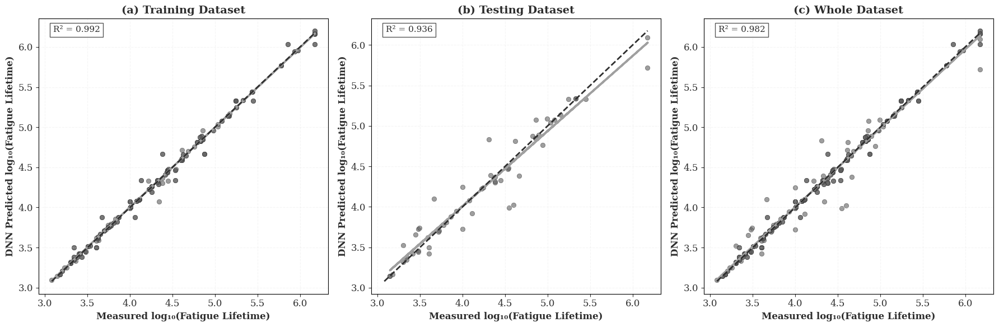


DETAILED PREDICTION STATISTICS - LOG10 SCALE

📈 Training Dataset (Log10):
   Samples: 222
   R² Score: 0.9921
   Best Fit: y = 0.9948x + 0.0237
   RMSE: 0.0695 log10(cycles)
   MAE: 0.0376 log10(cycles)
   MSE: 0.004829

📊 Testing Dataset (Log10):
   Samples: 56
   R² Score: 0.9357
   Best Fit: y = 0.9286x + 0.2935
   RMSE: 0.1896 log10(cycles)
   MAE: 0.1169 log10(cycles)
   MSE: 0.035962

📋 Whole Dataset (Log10):
   Samples: 278
   R² Score: 0.9815
   Best Fit: y = 0.9827x + 0.0739
   RMSE: 0.1054 log10(cycles)
   MAE: 0.0536 log10(cycles)
   MSE: 0.011100

RESIDUAL ANALYSIS - LOG10 SCALE

📊 Residual Statistics (Log10):
Training - Mean: -0.001348, Std: 0.069475
Testing  - Mean: 0.009306, Std: 0.189408
All Data - Mean: 0.000798, Std: 0.105354


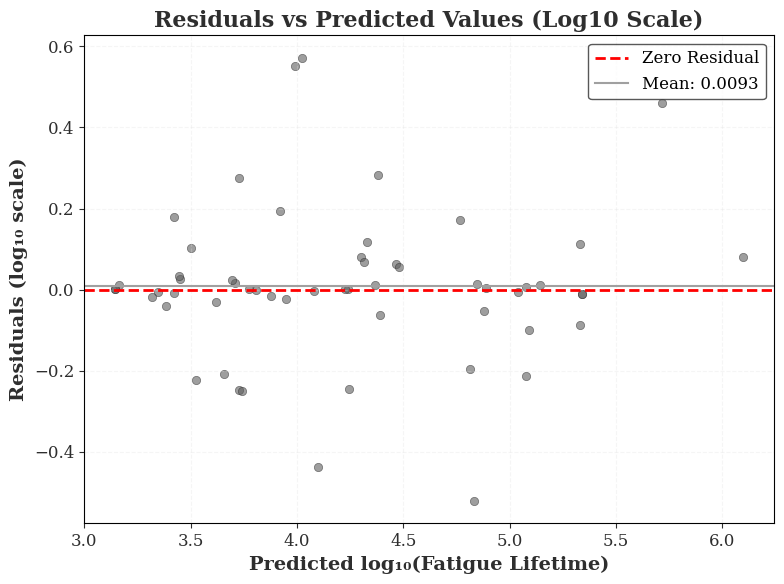


💾 LOG10 PREDICTION PLOTS SAVED:
1. dnn_training_predictions_log10.png
2. dnn_testing_predictions_log10.png
3. dnn_all_predictions_log10.png
4. dnn_combined_predictions_log10.png
5. dnn_residuals_log10.png

✅ DNN PREDICTION ANALYSIS (LOG10 SCALE) COMPLETED!


In [ ]:
# =============================================================================
# DNN PREDICTION PLOTS - LOG10 SCALE
# =============================================================================

# Define color palette
charcoal = '#2E2E2E'
dark_grey = '#5D5D5D'
ash_grey = '#A0A0A0'
light_grey = '#E0E0E0'

# Set font properties - Fixed for Colab compatibility
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['DejaVu Serif', 'Liberation Serif', 'Times New Roman']

print("\n" + "=" * 70)
print("DNN PREDICTION PLOTS - LOG10 SCALE")
print("=" * 70)

# Get predictions for training, testing, and all data (already in log10 scale)
print("Generating predictions for training, testing, and all data...")
y_train_pred_scaled = dnn_model.predict(X_train_scaled, verbose=0).flatten()
y_train_pred_log = scaler_y.inverse_transform(y_train_pred_scaled.reshape(-1, 1)).flatten()

y_test_pred_scaled = dnn_model.predict(X_test_scaled, verbose=0).flatten()
y_test_pred_log = scaler_y.inverse_transform(y_test_pred_scaled.reshape(-1, 1)).flatten()

# Predictions for all data
X_all_scaled = scaler_X.transform(X)
y_all_pred_scaled = dnn_model.predict(X_all_scaled, verbose=0).flatten()
y_all_pred_log = scaler_y.inverse_transform(y_all_pred_scaled.reshape(-1, 1)).flatten()

# Note: y_train, y_test, y_all are already in log10 scale from your preprocessing
y_train_log = y_train
y_test_log = y_test
y_all_log = y

# Calculate R² scores for each dataset in log10 scale
r2_train_log = r2_score(y_train_log, y_train_pred_log)
r2_test_log = r2_score(y_test_log, y_test_pred_log)
r2_all_log = r2_score(y_all_log, y_all_pred_log)

print(f"\n📊 R² Scores in Log10 Scale:")
print(f"Training R²: {r2_train_log:.4f}")
print(f"Testing R²:  {r2_test_log:.4f}")
print(f"All Data R²: {r2_all_log:.4f}")

# =============================================================================
# PLOT 1: Training Dataset Predictions (Log10)
# =============================================================================
plt.figure(figsize=(8, 6))
plt.scatter(y_train_log, y_train_pred_log, alpha=0.6, color=dark_grey,
           label='Data Points', edgecolors=charcoal, linewidth=0.5)

# Calculate best fit line
m_train, b_train = np.polyfit(y_train_log, y_train_pred_log, 1)
plt.plot(y_train_log, m_train*y_train_log + b_train, color=ash_grey,
         linewidth=2.5, label=f'Best Fit (R²={r2_train_log:.3f})')

# Perfect prediction line
plt.plot([y_all_log.min(), y_all_log.max()],
         [y_all_log.min(), y_all_log.max()], '--', color=charcoal,
         linewidth=2, label='Perfect Prediction')

plt.xlabel('Measured (Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('DNN Predicted (Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('(a) Training Dataset: DNN Predictions (Log10 Scale)', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)

# Add R² text box
plt.text(0.05, 0.95, f'R² = {r2_train_log:.3f}', transform=plt.gca().transAxes,
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
         fontfamily=plt.rcParams['font.family'], color=charcoal)

plt.tight_layout()
plt.savefig('dnn_training_predictions_log10.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 2: Testing Dataset Predictions (Log10)
# =============================================================================
plt.figure(figsize=(8, 6))
plt.scatter(y_test_log, y_test_pred_log, alpha=0.6, color=dark_grey,
           label='Data Points', edgecolors=charcoal, linewidth=0.5)

# Calculate best fit line
m_test, b_test = np.polyfit(y_test_log, y_test_pred_log, 1)
plt.plot(y_test_log, m_test*y_test_log + b_test, color=ash_grey,
         linewidth=2.5, label=f'Best Fit (R²={r2_test_log:.3f})')

# Perfect prediction line
plt.plot([y_all_log.min(), y_all_log.max()],
         [y_all_log.min(), y_all_log.max()], '--', color=charcoal,
         linewidth=2, label='Perfect Prediction')

plt.xlabel('Measured (Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('DNN Predicted (Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('(b) Testing Dataset: DNN Predictions (Log10 Scale)', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)

# Add R² text box
plt.text(0.05, 0.95, f'R² = {r2_test_log:.3f}', transform=plt.gca().transAxes,
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
         fontfamily=plt.rcParams['font.family'], color=charcoal)

plt.tight_layout()
plt.savefig('dnn_testing_predictions_log10.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 3: Whole Dataset Predictions (Log10)
# =============================================================================
plt.figure(figsize=(8, 6))
plt.scatter(y_all_log, y_all_pred_log, alpha=0.6, color=dark_grey,
           label='Data Points', edgecolors=charcoal, linewidth=0.5)

# Calculate best fit line
m_all, b_all = np.polyfit(y_all_log, y_all_pred_log, 1)
plt.plot(y_all_log, m_all*y_all_log + b_all, color=ash_grey,
         linewidth=2.5, label=f'Best Fit (R²={r2_all_log:.3f})')

# Perfect prediction line
plt.plot([y_all_log.min(), y_all_log.max()],
         [y_all_log.min(), y_all_log.max()], '--', color=charcoal,
         linewidth=2, label='Perfect Prediction')

plt.xlabel('Measured (Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('DNN Predicted (Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('(c) Whole Dataset: DNN Predictions (Log10 Scale)', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)

# Add R² text box
plt.text(0.05, 0.95, f'R² = {r2_all_log:.3f}', transform=plt.gca().transAxes,
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
         fontfamily=plt.rcParams['font.family'], color=charcoal)

plt.tight_layout()
plt.savefig('dnn_all_predictions_log10.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# Additional: Combined subplot version (Log10)
# =============================================================================
print("\nGenerating combined subplot...")
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Training data
axes[0].scatter(y_train_log, y_train_pred_log, alpha=0.6, color=dark_grey,
               edgecolors=charcoal, linewidth=0.5)
axes[0].plot(y_train_log, m_train*y_train_log + b_train, color=ash_grey, linewidth=2.5)
axes[0].plot([y_all_log.min(), y_all_log.max()],
            [y_all_log.min(), y_all_log.max()], '--', color=charcoal, linewidth=2)
axes[0].set_xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[0].set_ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[0].set_title('(a) Training Dataset', fontsize=14, fontweight='bold', color=charcoal)
axes[0].grid(linestyle='--', alpha=0.3, color=light_grey)
axes[0].tick_params(colors=charcoal)
axes[0].text(0.05, 0.95, f'R² = {r2_train_log:.3f}', transform=axes[0].transAxes,
            fontsize=11, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
            fontfamily=plt.rcParams['font.family'], color=charcoal)

# Testing data
axes[1].scatter(y_test_log, y_test_pred_log, alpha=0.6, color=dark_grey,
               edgecolors=charcoal, linewidth=0.5)
axes[1].plot(y_test_log, m_test*y_test_log + b_test, color=ash_grey, linewidth=2.5)
axes[1].plot([y_all_log.min(), y_all_log.max()],
            [y_all_log.min(), y_all_log.max()], '--', color=charcoal, linewidth=2)
axes[1].set_xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[1].set_ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[1].set_title('(b) Testing Dataset', fontsize=14, fontweight='bold', color=charcoal)
axes[1].grid(linestyle='--', alpha=0.3, color=light_grey)
axes[1].tick_params(colors=charcoal)
axes[1].text(0.05, 0.95, f'R² = {r2_test_log:.3f}', transform=axes[1].transAxes,
            fontsize=11, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
            fontfamily=plt.rcParams['font.family'], color=charcoal)

# All data
axes[2].scatter(y_all_log, y_all_pred_log, alpha=0.6, color=dark_grey,
               edgecolors=charcoal, linewidth=0.5)
axes[2].plot(y_all_log, m_all*y_all_log + b_all, color=ash_grey, linewidth=2.5)
axes[2].plot([y_all_log.min(), y_all_log.max()],
            [y_all_log.min(), y_all_log.max()], '--', color=charcoal, linewidth=2)
axes[2].set_xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[2].set_ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[2].set_title('(c) Whole Dataset', fontsize=14, fontweight='bold', color=charcoal)
axes[2].grid(linestyle='--', alpha=0.3, color=light_grey)
axes[2].tick_params(colors=charcoal)
axes[2].text(0.05, 0.95, f'R² = {r2_all_log:.3f}', transform=axes[2].transAxes,
            fontsize=11, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
            fontfamily=plt.rcParams['font.family'], color=charcoal)

plt.tight_layout()
plt.savefig('dnn_combined_predictions_log10.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# Print detailed statistics (Log10 Scale)
# =============================================================================
print("\n" + "=" * 70)
print("DETAILED PREDICTION STATISTICS - LOG10 SCALE")
print("=" * 70)

print(f"\n📈 Training Dataset (Log10):")
print(f"   Samples: {len(y_train_log)}")
print(f"   R² Score: {r2_train_log:.4f}")
print(f"   Best Fit: y = {m_train:.4f}x + {b_train:.4f}")
print(f"   RMSE: {np.sqrt(mean_squared_error(y_train_log, y_train_pred_log)):.4f} log10(cycles)")
print(f"   MAE: {mean_absolute_error(y_train_log, y_train_pred_log):.4f} log10(cycles)")
print(f"   MSE: {mean_squared_error(y_train_log, y_train_pred_log):.6f}")

print(f"\n📊 Testing Dataset (Log10):")
print(f"   Samples: {len(y_test_log)}")
print(f"   R² Score: {r2_test_log:.4f}")
print(f"   Best Fit: y = {m_test:.4f}x + {b_test:.4f}")
print(f"   RMSE: {np.sqrt(mean_squared_error(y_test_log, y_test_pred_log)):.4f} log10(cycles)")
print(f"   MAE: {mean_absolute_error(y_test_log, y_test_pred_log):.4f} log10(cycles)")
print(f"   MSE: {mean_squared_error(y_test_log, y_test_pred_log):.6f}")

print(f"\n📋 Whole Dataset (Log10):")
print(f"   Samples: {len(y_all_log)}")
print(f"   R² Score: {r2_all_log:.4f}")
print(f"   Best Fit: y = {m_all:.4f}x + {b_all:.4f}")
print(f"   RMSE: {np.sqrt(mean_squared_error(y_all_log, y_all_pred_log)):.4f} log10(cycles)")
print(f"   MAE: {mean_absolute_error(y_all_log, y_all_pred_log):.4f} log10(cycles)")
print(f"   MSE: {mean_squared_error(y_all_log, y_all_pred_log):.6f}")

# =============================================================================
# Additional: Residual Analysis in Log10 Scale
# =============================================================================
print("\n" + "=" * 70)
print("RESIDUAL ANALYSIS - LOG10 SCALE")
print("=" * 70)

# Calculate residuals in log10 scale
residuals_train_log = y_train_log - y_train_pred_log
residuals_test_log = y_test_log - y_test_pred_log
residuals_all_log = y_all_log - y_all_pred_log

print(f"\n📊 Residual Statistics (Log10):")
print(f"Training - Mean: {np.mean(residuals_train_log):.6f}, Std: {np.std(residuals_train_log):.6f}")
print(f"Testing  - Mean: {np.mean(residuals_test_log):.6f}, Std: {np.std(residuals_test_log):.6f}")
print(f"All Data - Mean: {np.mean(residuals_all_log):.6f}, Std: {np.std(residuals_all_log):.6f}")

# Residual plot for test data
plt.figure(figsize=(8, 6))
plt.scatter(y_test_pred_log, residuals_test_log, alpha=0.6, color=dark_grey,
           edgecolors=charcoal, linewidth=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2, label='Zero Residual')
plt.axhline(y=np.mean(residuals_test_log), color=ash_grey, linestyle='-',
           linewidth=1.5, label=f'Mean: {np.mean(residuals_test_log):.4f}')
plt.xlabel('Predicted log₁₀(Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('Residuals (log₁₀ scale)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('Residuals vs Predicted Values (Log10 Scale)', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.savefig('dnn_residuals_log10.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n💾 LOG10 PREDICTION PLOTS SAVED:")
print(f"1. dnn_training_predictions_log10.png")
print(f"2. dnn_testing_predictions_log10.png")
print(f"3. dnn_all_predictions_log10.png")
print(f"4. dnn_combined_predictions_log10.png")
print(f"5. dnn_residuals_log10.png")

print(f"\n✅ DNN PREDICTION ANALYSIS (LOG10 SCALE) COMPLETED!")
print("=" * 70)


DNN PREDICTION PLOTS - LOG10 SCALE
Generating predictions for training, testing, and all data...

📊 R² Scores and RMSE in Log10 Scale:
Training R²: 0.9921, RMSE: 0.0695
Testing R²:  0.9357, RMSE: 0.1896
All Data R²: 0.9815, RMSE: 0.1054


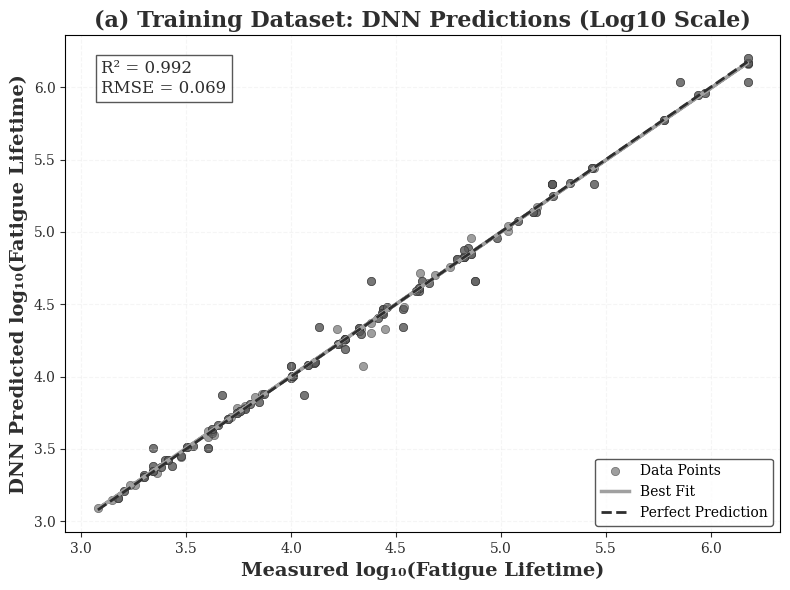

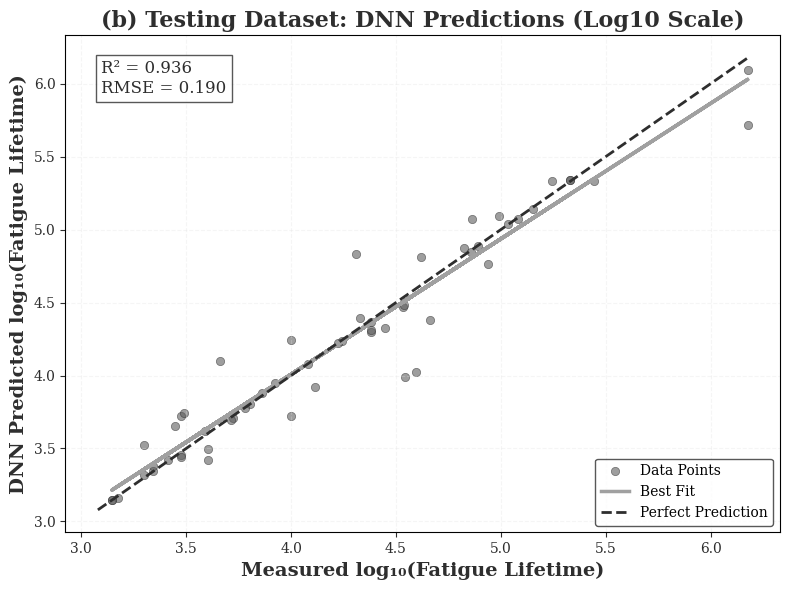

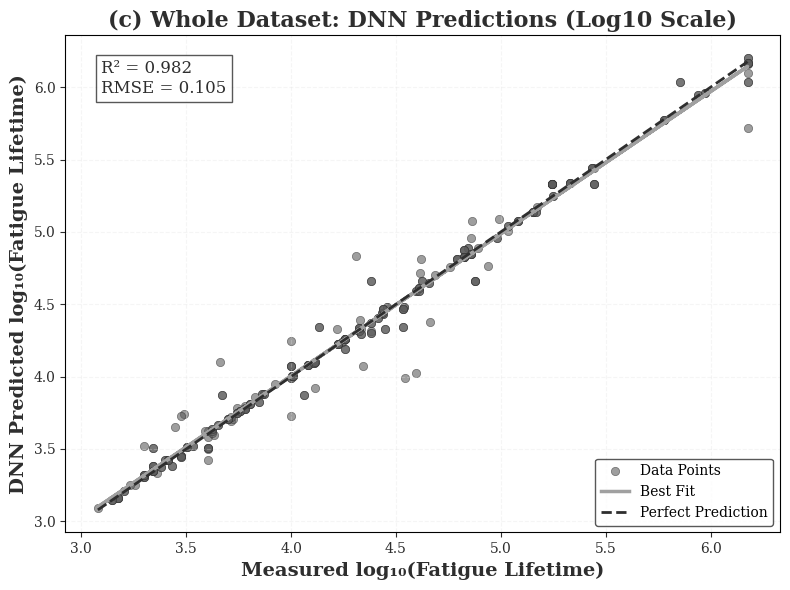


Generating combined subplot...


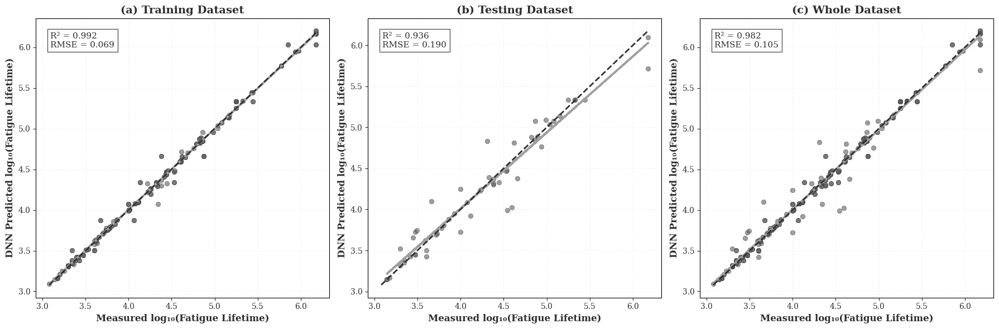


DETAILED PREDICTION STATISTICS - LOG10 SCALE

📈 Training Dataset (Log10):
   Samples: 222
   R² Score: 0.9921
   RMSE: 0.0695 log10(cycles)
   Best Fit: y = 0.9948x + 0.0237
   MAE: 0.0376 log10(cycles)
   MSE: 0.004829

📊 Testing Dataset (Log10):
   Samples: 56
   R² Score: 0.9357
   RMSE: 0.1896 log10(cycles)
   Best Fit: y = 0.9286x + 0.2935
   MAE: 0.1169 log10(cycles)
   MSE: 0.035962

📋 Whole Dataset (Log10):
   Samples: 278
   R² Score: 0.9815
   RMSE: 0.1054 log10(cycles)
   Best Fit: y = 0.9827x + 0.0739
   MAE: 0.0536 log10(cycles)
   MSE: 0.011100

RESIDUAL ANALYSIS - LOG10 SCALE

📊 Residual Statistics (Log10):
Training - Mean: -0.001348, Std: 0.069475
Testing  - Mean: 0.009306, Std: 0.189408
All Data - Mean: 0.000798, Std: 0.105354


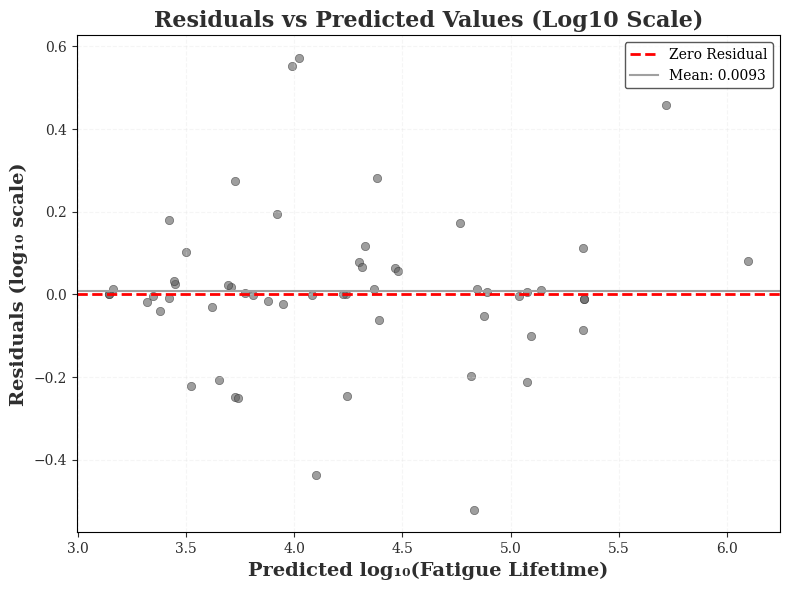


💾 LOG10 PREDICTION PLOTS SAVED:
1. dnn_training_predictions_log10.png
2. dnn_testing_predictions_log10.png
3. dnn_all_predictions_log10.png
4. dnn_combined_predictions_log10.png
5. dnn_residuals_log10.png

✅ DNN PREDICTION ANALYSIS (LOG10 SCALE) COMPLETED!


In [ ]:
# =============================================================================
# DNN PREDICTION PLOTS - LOG10 SCALE
# =============================================================================

# Define color palette
charcoal = '#2E2E2E'
dark_grey = '#5D5D5D'
ash_grey = '#A0A0A0'
light_grey = '#E0E0E0'

# Set font properties - Fixed for Colab compatibility
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['DejaVu Serif', 'Liberation Serif', 'Times New Roman']

print("\n" + "=" * 70)
print("DNN PREDICTION PLOTS - LOG10 SCALE")
print("=" * 70)

# Get predictions for training, testing, and all data (already in log10 scale)
print("Generating predictions for training, testing, and all data...")
y_train_pred_scaled = dnn_model.predict(X_train_scaled, verbose=0).flatten()
y_train_pred_log = scaler_y.inverse_transform(y_train_pred_scaled.reshape(-1, 1)).flatten()

y_test_pred_scaled = dnn_model.predict(X_test_scaled, verbose=0).flatten()
y_test_pred_log = scaler_y.inverse_transform(y_test_pred_scaled.reshape(-1, 1)).flatten()

# Predictions for all data
X_all_scaled = scaler_X.transform(X)
y_all_pred_scaled = dnn_model.predict(X_all_scaled, verbose=0).flatten()
y_all_pred_log = scaler_y.inverse_transform(y_all_pred_scaled.reshape(-1, 1)).flatten()

# Note: y_train, y_test, y_all are already in log10 scale from your preprocessing
y_train_log = y_train
y_test_log = y_test
y_all_log = y

# Calculate R² scores and RMSE for each dataset in log10 scale
r2_train_log = r2_score(y_train_log, y_train_pred_log)
r2_test_log = r2_score(y_test_log, y_test_pred_log)
r2_all_log = r2_score(y_all_log, y_all_pred_log)

rmse_train_log = np.sqrt(mean_squared_error(y_train_log, y_train_pred_log))
rmse_test_log = np.sqrt(mean_squared_error(y_test_log, y_test_pred_log))
rmse_all_log = np.sqrt(mean_squared_error(y_all_log, y_all_pred_log))

print(f"\n📊 R² Scores and RMSE in Log10 Scale:")
print(f"Training R²: {r2_train_log:.4f}, RMSE: {rmse_train_log:.4f}")
print(f"Testing R²:  {r2_test_log:.4f}, RMSE: {rmse_test_log:.4f}")
print(f"All Data R²: {r2_all_log:.4f}, RMSE: {rmse_all_log:.4f}")

# =============================================================================
# PLOT 1: Training Dataset Predictions (Log10)
# =============================================================================
plt.figure(figsize=(8, 6))
plt.scatter(y_train_log, y_train_pred_log, alpha=0.6, color=dark_grey,
           label='Data Points', edgecolors=charcoal, linewidth=0.5)

# Calculate best fit line
m_train, b_train = np.polyfit(y_train_log, y_train_pred_log, 1)
plt.plot(y_train_log, m_train*y_train_log + b_train, color=ash_grey,
         linewidth=2.5, label=f'Best Fit')

# Perfect prediction line
plt.plot([y_all_log.min(), y_all_log.max()],
         [y_all_log.min(), y_all_log.max()], '--', color=charcoal,
         linewidth=2, label='Perfect Prediction')

plt.xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('(a) Training Dataset: DNN Predictions (Log10 Scale)', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)

# Add R² and RMSE text box
textstr = f'R² = {r2_train_log:.3f}\nRMSE = {rmse_train_log:.3f}'
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
         fontfamily=plt.rcParams['font.family'], color=charcoal, verticalalignment='top')

plt.tight_layout()
plt.savefig('dnn_training_predictions_log10.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 2: Testing Dataset Predictions (Log10)
# =============================================================================
plt.figure(figsize=(8, 6))
plt.scatter(y_test_log, y_test_pred_log, alpha=0.6, color=dark_grey,
           label='Data Points', edgecolors=charcoal, linewidth=0.5)

# Calculate best fit line
m_test, b_test = np.polyfit(y_test_log, y_test_pred_log, 1)
plt.plot(y_test_log, m_test*y_test_log + b_test, color=ash_grey,
         linewidth=2.5, label=f'Best Fit')

# Perfect prediction line
plt.plot([y_all_log.min(), y_all_log.max()],
         [y_all_log.min(), y_all_log.max()], '--', color=charcoal,
         linewidth=2, label='Perfect Prediction')

plt.xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('(b) Testing Dataset: DNN Predictions (Log10 Scale)', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)

# Add R² and RMSE text box
textstr = f'R² = {r2_test_log:.3f}\nRMSE = {rmse_test_log:.3f}'
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
         fontfamily=plt.rcParams['font.family'], color=charcoal, verticalalignment='top')

plt.tight_layout()
plt.savefig('dnn_testing_predictions_log10.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 3: Whole Dataset Predictions (Log10)
# =============================================================================
plt.figure(figsize=(8, 6))
plt.scatter(y_all_log, y_all_pred_log, alpha=0.6, color=dark_grey,
           label='Data Points', edgecolors=charcoal, linewidth=0.5)

# Calculate best fit line
m_all, b_all = np.polyfit(y_all_log, y_all_pred_log, 1)
plt.plot(y_all_log, m_all*y_all_log + b_all, color=ash_grey,
         linewidth=2.5, label=f'Best Fit')

# Perfect prediction line
plt.plot([y_all_log.min(), y_all_log.max()],
         [y_all_log.min(), y_all_log.max()], '--', color=charcoal,
         linewidth=2, label='Perfect Prediction')

plt.xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('(c) Whole Dataset: DNN Predictions (Log10 Scale)', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)

# Add R² and RMSE text box
textstr = f'R² = {r2_all_log:.3f}\nRMSE = {rmse_all_log:.3f}'
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
         fontfamily=plt.rcParams['font.family'], color=charcoal, verticalalignment='top')

plt.tight_layout()
plt.savefig('dnn_all_predictions_log10.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# Additional: Combined subplot version (Log10)
# =============================================================================
print("\nGenerating combined subplot...")
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Training data
axes[0].scatter(y_train_log, y_train_pred_log, alpha=0.6, color=dark_grey,
               edgecolors=charcoal, linewidth=0.5)
axes[0].plot(y_train_log, m_train*y_train_log + b_train, color=ash_grey, linewidth=2.5)
axes[0].plot([y_all_log.min(), y_all_log.max()],
            [y_all_log.min(), y_all_log.max()], '--', color=charcoal, linewidth=2)
axes[0].set_xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[0].set_ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[0].set_title('(a) Training Dataset', fontsize=14, fontweight='bold', color=charcoal)
axes[0].grid(linestyle='--', alpha=0.3, color=light_grey)
axes[0].tick_params(colors=charcoal)
textstr_train = f'R² = {r2_train_log:.3f}\nRMSE = {rmse_train_log:.3f}'
axes[0].text(0.05, 0.95, textstr_train, transform=axes[0].transAxes,
            fontsize=11, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
            fontfamily=plt.rcParams['font.family'], color=charcoal, verticalalignment='top')

# Testing data
axes[1].scatter(y_test_log, y_test_pred_log, alpha=0.6, color=dark_grey,
               edgecolors=charcoal, linewidth=0.5)
axes[1].plot(y_test_log, m_test*y_test_log + b_test, color=ash_grey, linewidth=2.5)
axes[1].plot([y_all_log.min(), y_all_log.max()],
            [y_all_log.min(), y_all_log.max()], '--', color=charcoal, linewidth=2)
axes[1].set_xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[1].set_ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[1].set_title('(b) Testing Dataset', fontsize=14, fontweight='bold', color=charcoal)
axes[1].grid(linestyle='--', alpha=0.3, color=light_grey)
axes[1].tick_params(colors=charcoal)
textstr_test = f'R² = {r2_test_log:.3f}\nRMSE = {rmse_test_log:.3f}'
axes[1].text(0.05, 0.95, textstr_test, transform=axes[1].transAxes,
            fontsize=11, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
            fontfamily=plt.rcParams['font.family'], color=charcoal, verticalalignment='top')

# All data
axes[2].scatter(y_all_log, y_all_pred_log, alpha=0.6, color=dark_grey,
               edgecolors=charcoal, linewidth=0.5)
axes[2].plot(y_all_log, m_all*y_all_log + b_all, color=ash_grey, linewidth=2.5)
axes[2].plot([y_all_log.min(), y_all_log.max()],
            [y_all_log.min(), y_all_log.max()], '--', color=charcoal, linewidth=2)
axes[2].set_xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[2].set_ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[2].set_title('(c) Whole Dataset', fontsize=14, fontweight='bold', color=charcoal)
axes[2].grid(linestyle='--', alpha=0.3, color=light_grey)
axes[2].tick_params(colors=charcoal)
textstr_all = f'R² = {r2_all_log:.3f}\nRMSE = {rmse_all_log:.3f}'
axes[2].text(0.05, 0.95, textstr_all, transform=axes[2].transAxes,
            fontsize=11, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
            fontfamily=plt.rcParams['font.family'], color=charcoal, verticalalignment='top')

plt.tight_layout()
plt.savefig('dnn_combined_predictions_log10.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# Print detailed statistics (Log10 Scale)
# =============================================================================
print("\n" + "=" * 70)
print("DETAILED PREDICTION STATISTICS - LOG10 SCALE")
print("=" * 70)

print(f"\n📈 Training Dataset (Log10):")
print(f"   Samples: {len(y_train_log)}")
print(f"   R² Score: {r2_train_log:.4f}")
print(f"   RMSE: {rmse_train_log:.4f} log10(cycles)")
print(f"   Best Fit: y = {m_train:.4f}x + {b_train:.4f}")
print(f"   MAE: {mean_absolute_error(y_train_log, y_train_pred_log):.4f} log10(cycles)")
print(f"   MSE: {mean_squared_error(y_train_log, y_train_pred_log):.6f}")

print(f"\n📊 Testing Dataset (Log10):")
print(f"   Samples: {len(y_test_log)}")
print(f"   R² Score: {r2_test_log:.4f}")
print(f"   RMSE: {rmse_test_log:.4f} log10(cycles)")
print(f"   Best Fit: y = {m_test:.4f}x + {b_test:.4f}")
print(f"   MAE: {mean_absolute_error(y_test_log, y_test_pred_log):.4f} log10(cycles)")
print(f"   MSE: {mean_squared_error(y_test_log, y_test_pred_log):.6f}")

print(f"\n📋 Whole Dataset (Log10):")
print(f"   Samples: {len(y_all_log)}")
print(f"   R² Score: {r2_all_log:.4f}")
print(f"   RMSE: {rmse_all_log:.4f} log10(cycles)")
print(f"   Best Fit: y = {m_all:.4f}x + {b_all:.4f}")
print(f"   MAE: {mean_absolute_error(y_all_log, y_all_pred_log):.4f} log10(cycles)")
print(f"   MSE: {mean_squared_error(y_all_log, y_all_pred_log):.6f}")

# =============================================================================
# Additional: Residual Analysis in Log10 Scale
# =============================================================================
print("\n" + "=" * 70)
print("RESIDUAL ANALYSIS - LOG10 SCALE")
print("=" * 70)

# Calculate residuals in log10 scale
residuals_train_log = y_train_log - y_train_pred_log
residuals_test_log = y_test_log - y_test_pred_log
residuals_all_log = y_all_log - y_all_pred_log

print(f"\n📊 Residual Statistics (Log10):")
print(f"Training - Mean: {np.mean(residuals_train_log):.6f}, Std: {np.std(residuals_train_log):.6f}")
print(f"Testing  - Mean: {np.mean(residuals_test_log):.6f}, Std: {np.std(residuals_test_log):.6f}")
print(f"All Data - Mean: {np.mean(residuals_all_log):.6f}, Std: {np.std(residuals_all_log):.6f}")

# Residual plot for test data
plt.figure(figsize=(8, 6))
plt.scatter(y_test_pred_log, residuals_test_log, alpha=0.6, color=dark_grey,
           edgecolors=charcoal, linewidth=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2, label='Zero Residual')
plt.axhline(y=np.mean(residuals_test_log), color=ash_grey, linestyle='-',
           linewidth=1.5, label=f'Mean: {np.mean(residuals_test_log):.4f}')
plt.xlabel('Predicted log₁₀(Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('Residuals (log₁₀ scale)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('Residuals vs Predicted Values (Log10 Scale)', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.savefig('dnn_residuals_log10.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n💾 LOG10 PREDICTION PLOTS SAVED:")
print(f"1. dnn_training_predictions_log10.png")
print(f"2. dnn_testing_predictions_log10.png")
print(f"3. dnn_all_predictions_log10.png")
print(f"4. dnn_combined_predictions_log10.png")
print(f"5. dnn_residuals_log10.png")

print(f"\n✅ DNN PREDICTION ANALYSIS (LOG10 SCALE) COMPLETED!")
print("=" * 70)


DNN PREDICTION PLOTS - LOG10 SCALE
Generating predictions for training, testing, and all data...

📊 R² Scores and RMSE in Log10 Scale:
Training R²: 0.9921, RMSE: 0.0695
Testing R²:  0.9357, RMSE: 0.1896
All Data R²: 0.9815, RMSE: 0.1054


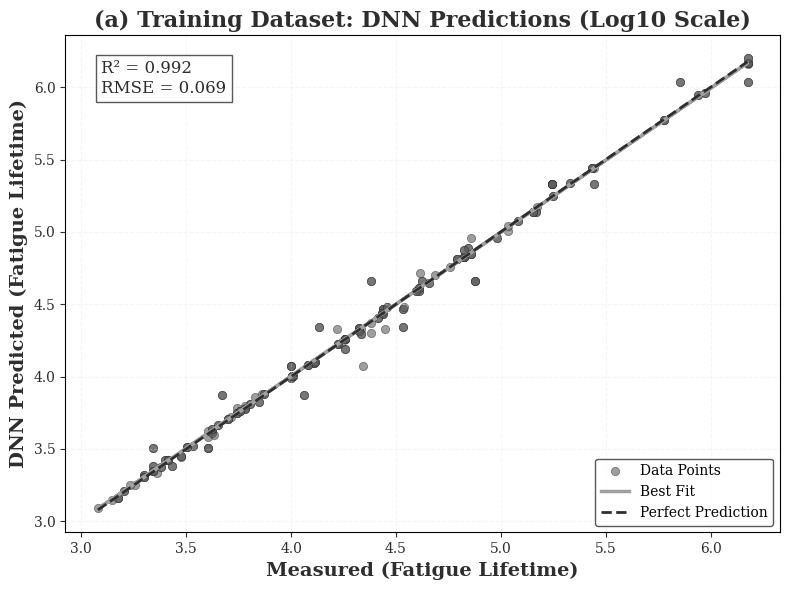

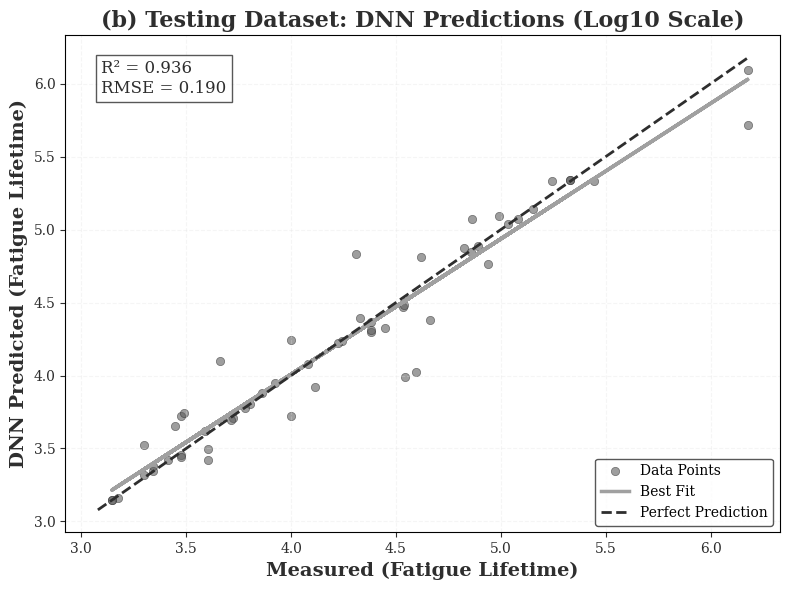

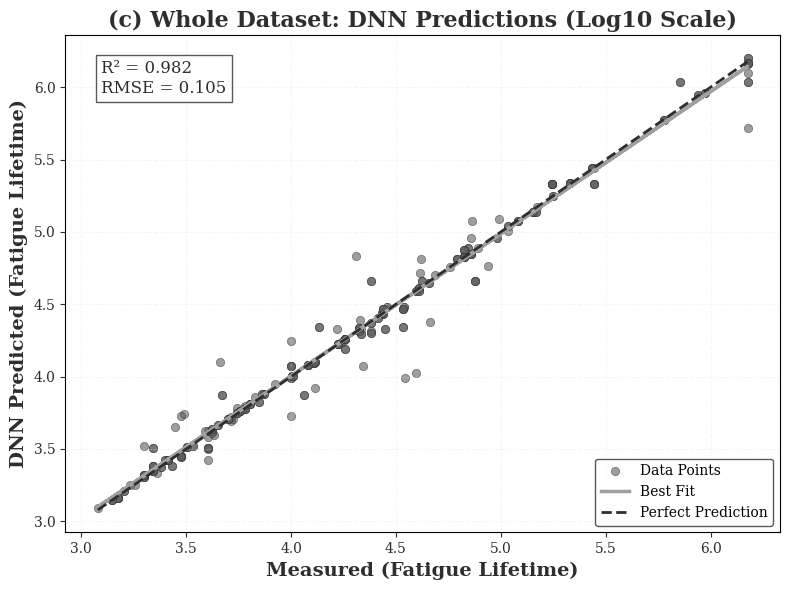


Generating combined subplot...


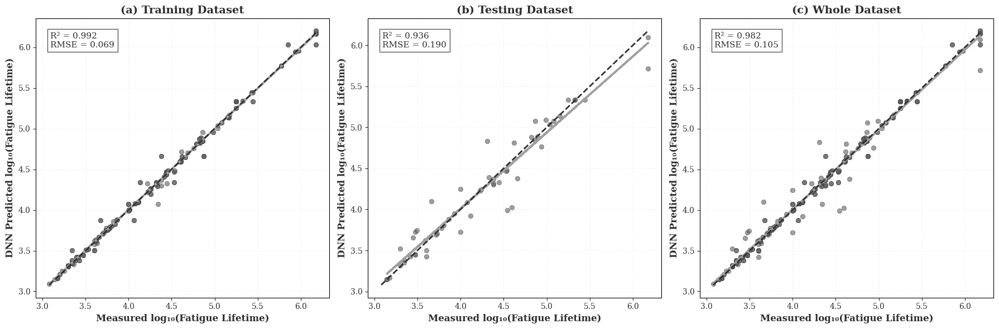


DETAILED PREDICTION STATISTICS - LOG10 SCALE

📈 Training Dataset (Log10):
   Samples: 222
   R² Score: 0.9921
   RMSE: 0.0695 log10(cycles)
   Best Fit: y = 0.9948x + 0.0237
   MAE: 0.0376 log10(cycles)
   MSE: 0.004829

📊 Testing Dataset (Log10):
   Samples: 56
   R² Score: 0.9357
   RMSE: 0.1896 log10(cycles)
   Best Fit: y = 0.9286x + 0.2935
   MAE: 0.1169 log10(cycles)
   MSE: 0.035962

📋 Whole Dataset (Log10):
   Samples: 278
   R² Score: 0.9815
   RMSE: 0.1054 log10(cycles)
   Best Fit: y = 0.9827x + 0.0739
   MAE: 0.0536 log10(cycles)
   MSE: 0.011100

RESIDUAL ANALYSIS - LOG10 SCALE

📊 Residual Statistics (Log10):
Training - Mean: -0.001348, Std: 0.069475
Testing  - Mean: 0.009306, Std: 0.189408
All Data - Mean: 0.000798, Std: 0.105354


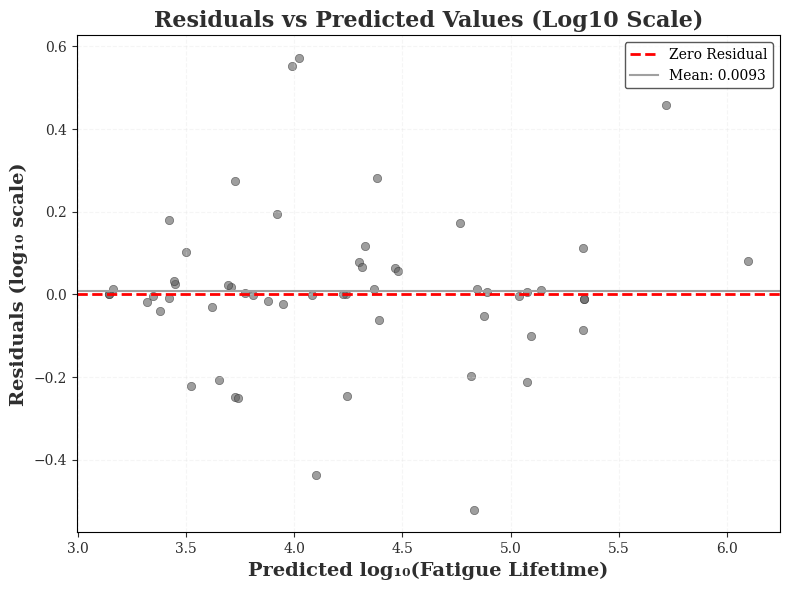


💾 LOG10 PREDICTION PLOTS SAVED:
1. dnn_training_predictions_log10.png
2. dnn_testing_predictions_log10.png
3. dnn_all_predictions_log10.png
4. dnn_combined_predictions_log10.png
5. dnn_residuals_log10.png

✅ DNN PREDICTION ANALYSIS (LOG10 SCALE) COMPLETED!


In [ ]:
# =============================================================================
# DNN PREDICTION PLOTS - LOG10 SCALE
# =============================================================================

# Define color palette
charcoal = '#2E2E2E'
dark_grey = '#5D5D5D'
ash_grey = '#A0A0A0'
light_grey = '#E0E0E0'

# Set font properties - Fixed for Colab compatibility
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['DejaVu Serif', 'Liberation Serif', 'Times New Roman']

print("\n" + "=" * 70)
print("DNN PREDICTION PLOTS - LOG10 SCALE")
print("=" * 70)

# Get predictions for training, testing, and all data (already in log10 scale)
print("Generating predictions for training, testing, and all data...")
y_train_pred_scaled = dnn_model.predict(X_train_scaled, verbose=0).flatten()
y_train_pred_log = scaler_y.inverse_transform(y_train_pred_scaled.reshape(-1, 1)).flatten()

y_test_pred_scaled = dnn_model.predict(X_test_scaled, verbose=0).flatten()
y_test_pred_log = scaler_y.inverse_transform(y_test_pred_scaled.reshape(-1, 1)).flatten()

# Predictions for all data
X_all_scaled = scaler_X.transform(X)
y_all_pred_scaled = dnn_model.predict(X_all_scaled, verbose=0).flatten()
y_all_pred_log = scaler_y.inverse_transform(y_all_pred_scaled.reshape(-1, 1)).flatten()

# Note: y_train, y_test, y_all are already in log10 scale from your preprocessing
y_train_log = y_train
y_test_log = y_test
y_all_log = y

# Calculate R² scores and RMSE for each dataset in log10 scale
r2_train_log = r2_score(y_train_log, y_train_pred_log)
r2_test_log = r2_score(y_test_log, y_test_pred_log)
r2_all_log = r2_score(y_all_log, y_all_pred_log)

rmse_train_log = np.sqrt(mean_squared_error(y_train_log, y_train_pred_log))
rmse_test_log = np.sqrt(mean_squared_error(y_test_log, y_test_pred_log))
rmse_all_log = np.sqrt(mean_squared_error(y_all_log, y_all_pred_log))

print(f"\n📊 R² Scores and RMSE in Log10 Scale:")
print(f"Training R²: {r2_train_log:.4f}, RMSE: {rmse_train_log:.4f}")
print(f"Testing R²:  {r2_test_log:.4f}, RMSE: {rmse_test_log:.4f}")
print(f"All Data R²: {r2_all_log:.4f}, RMSE: {rmse_all_log:.4f}")

# =============================================================================
# PLOT 1: Training Dataset Predictions (Log10)
# =============================================================================
plt.figure(figsize=(8, 6))
plt.scatter(y_train_log, y_train_pred_log, alpha=0.6, color=dark_grey,
           label='Data Points', edgecolors=charcoal, linewidth=0.5)

# Calculate best fit line
m_train, b_train = np.polyfit(y_train_log, y_train_pred_log, 1)
plt.plot(y_train_log, m_train*y_train_log + b_train, color=ash_grey,
         linewidth=2.5, label=f'Best Fit')

# Perfect prediction line
plt.plot([y_all_log.min(), y_all_log.max()],
         [y_all_log.min(), y_all_log.max()], '--', color=charcoal,
         linewidth=2, label='Perfect Prediction')

plt.xlabel('Measured (Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('DNN Predicted (Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('(a) Training Dataset: DNN Predictions (Log10 Scale)', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)

# Add R² and RMSE text box
textstr = f'R² = {r2_train_log:.3f}\nRMSE = {rmse_train_log:.3f}'
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
         fontfamily=plt.rcParams['font.family'], color=charcoal, verticalalignment='top')

plt.tight_layout()
plt.savefig('dnn_training_predictions_log10.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 2: Testing Dataset Predictions (Log10)
# =============================================================================
plt.figure(figsize=(8, 6))
plt.scatter(y_test_log, y_test_pred_log, alpha=0.6, color=dark_grey,
           label='Data Points', edgecolors=charcoal, linewidth=0.5)

# Calculate best fit line
m_test, b_test = np.polyfit(y_test_log, y_test_pred_log, 1)
plt.plot(y_test_log, m_test*y_test_log + b_test, color=ash_grey,
         linewidth=2.5, label=f'Best Fit')

# Perfect prediction line
plt.plot([y_all_log.min(), y_all_log.max()],
         [y_all_log.min(), y_all_log.max()], '--', color=charcoal,
         linewidth=2, label='Perfect Prediction')

plt.xlabel('Measured (Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('DNN Predicted (Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('(b) Testing Dataset: DNN Predictions (Log10 Scale)', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)

# Add R² and RMSE text box
textstr = f'R² = {r2_test_log:.3f}\nRMSE = {rmse_test_log:.3f}'
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
         fontfamily=plt.rcParams['font.family'], color=charcoal, verticalalignment='top')

plt.tight_layout()
plt.savefig('dnn_testing_predictions_log10.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# PLOT 3: Whole Dataset Predictions (Log10)
# =============================================================================
plt.figure(figsize=(8, 6))
plt.scatter(y_all_log, y_all_pred_log, alpha=0.6, color=dark_grey,
           label='Data Points', edgecolors=charcoal, linewidth=0.5)

# Calculate best fit line
m_all, b_all = np.polyfit(y_all_log, y_all_pred_log, 1)
plt.plot(y_all_log, m_all*y_all_log + b_all, color=ash_grey,
         linewidth=2.5, label=f'Best Fit')

# Perfect prediction line
plt.plot([y_all_log.min(), y_all_log.max()],
         [y_all_log.min(), y_all_log.max()], '--', color=charcoal,
         linewidth=2, label='Perfect Prediction')

plt.xlabel('Measured (Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('DNN Predicted (Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('(c) Whole Dataset: DNN Predictions (Log10 Scale)', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)

# Add R² and RMSE text box
textstr = f'R² = {r2_all_log:.3f}\nRMSE = {rmse_all_log:.3f}'
plt.text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
         fontfamily=plt.rcParams['font.family'], color=charcoal, verticalalignment='top')

plt.tight_layout()
plt.savefig('dnn_all_predictions_log10.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# Additional: Combined subplot version (Log10)
# =============================================================================
print("\nGenerating combined subplot...")
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Training data
axes[0].scatter(y_train_log, y_train_pred_log, alpha=0.6, color=dark_grey,
               edgecolors=charcoal, linewidth=0.5)
axes[0].plot(y_train_log, m_train*y_train_log + b_train, color=ash_grey, linewidth=2.5)
axes[0].plot([y_all_log.min(), y_all_log.max()],
            [y_all_log.min(), y_all_log.max()], '--', color=charcoal, linewidth=2)
axes[0].set_xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[0].set_ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[0].set_title('(a) Training Dataset', fontsize=14, fontweight='bold', color=charcoal)
axes[0].grid(linestyle='--', alpha=0.3, color=light_grey)
axes[0].tick_params(colors=charcoal)
textstr_train = f'R² = {r2_train_log:.3f}\nRMSE = {rmse_train_log:.3f}'
axes[0].text(0.05, 0.95, textstr_train, transform=axes[0].transAxes,
            fontsize=11, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
            fontfamily=plt.rcParams['font.family'], color=charcoal, verticalalignment='top')

# Testing data
axes[1].scatter(y_test_log, y_test_pred_log, alpha=0.6, color=dark_grey,
               edgecolors=charcoal, linewidth=0.5)
axes[1].plot(y_test_log, m_test*y_test_log + b_test, color=ash_grey, linewidth=2.5)
axes[1].plot([y_all_log.min(), y_all_log.max()],
            [y_all_log.min(), y_all_log.max()], '--', color=charcoal, linewidth=2)
axes[1].set_xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[1].set_ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[1].set_title('(b) Testing Dataset', fontsize=14, fontweight='bold', color=charcoal)
axes[1].grid(linestyle='--', alpha=0.3, color=light_grey)
axes[1].tick_params(colors=charcoal)
textstr_test = f'R² = {r2_test_log:.3f}\nRMSE = {rmse_test_log:.3f}'
axes[1].text(0.05, 0.95, textstr_test, transform=axes[1].transAxes,
            fontsize=11, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
            fontfamily=plt.rcParams['font.family'], color=charcoal, verticalalignment='top')

# All data
axes[2].scatter(y_all_log, y_all_pred_log, alpha=0.6, color=dark_grey,
               edgecolors=charcoal, linewidth=0.5)
axes[2].plot(y_all_log, m_all*y_all_log + b_all, color=ash_grey, linewidth=2.5)
axes[2].plot([y_all_log.min(), y_all_log.max()],
            [y_all_log.min(), y_all_log.max()], '--', color=charcoal, linewidth=2)
axes[2].set_xlabel('Measured log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[2].set_ylabel('DNN Predicted log₁₀(Fatigue Lifetime)', fontsize=12, fontweight='bold', color=charcoal)
axes[2].set_title('(c) Whole Dataset', fontsize=14, fontweight='bold', color=charcoal)
axes[2].grid(linestyle='--', alpha=0.3, color=light_grey)
axes[2].tick_params(colors=charcoal)
textstr_all = f'R² = {r2_all_log:.3f}\nRMSE = {rmse_all_log:.3f}'
axes[2].text(0.05, 0.95, textstr_all, transform=axes[2].transAxes,
            fontsize=11, bbox=dict(facecolor='white', alpha=0.8, edgecolor=charcoal),
            fontfamily=plt.rcParams['font.family'], color=charcoal, verticalalignment='top')

plt.tight_layout()
plt.savefig('dnn_combined_predictions_log10.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# Print detailed statistics (Log10 Scale)
# =============================================================================
print("\n" + "=" * 70)
print("DETAILED PREDICTION STATISTICS - LOG10 SCALE")
print("=" * 70)

print(f"\n📈 Training Dataset (Log10):")
print(f"   Samples: {len(y_train_log)}")
print(f"   R² Score: {r2_train_log:.4f}")
print(f"   RMSE: {rmse_train_log:.4f} log10(cycles)")
print(f"   Best Fit: y = {m_train:.4f}x + {b_train:.4f}")
print(f"   MAE: {mean_absolute_error(y_train_log, y_train_pred_log):.4f} log10(cycles)")
print(f"   MSE: {mean_squared_error(y_train_log, y_train_pred_log):.6f}")

print(f"\n📊 Testing Dataset (Log10):")
print(f"   Samples: {len(y_test_log)}")
print(f"   R² Score: {r2_test_log:.4f}")
print(f"   RMSE: {rmse_test_log:.4f} log10(cycles)")
print(f"   Best Fit: y = {m_test:.4f}x + {b_test:.4f}")
print(f"   MAE: {mean_absolute_error(y_test_log, y_test_pred_log):.4f} log10(cycles)")
print(f"   MSE: {mean_squared_error(y_test_log, y_test_pred_log):.6f}")

print(f"\n📋 Whole Dataset (Log10):")
print(f"   Samples: {len(y_all_log)}")
print(f"   R² Score: {r2_all_log:.4f}")
print(f"   RMSE: {rmse_all_log:.4f} log10(cycles)")
print(f"   Best Fit: y = {m_all:.4f}x + {b_all:.4f}")
print(f"   MAE: {mean_absolute_error(y_all_log, y_all_pred_log):.4f} log10(cycles)")
print(f"   MSE: {mean_squared_error(y_all_log, y_all_pred_log):.6f}")

# =============================================================================
# Additional: Residual Analysis in Log10 Scale
# =============================================================================
print("\n" + "=" * 70)
print("RESIDUAL ANALYSIS - LOG10 SCALE")
print("=" * 70)

# Calculate residuals in log10 scale
residuals_train_log = y_train_log - y_train_pred_log
residuals_test_log = y_test_log - y_test_pred_log
residuals_all_log = y_all_log - y_all_pred_log

print(f"\n📊 Residual Statistics (Log10):")
print(f"Training - Mean: {np.mean(residuals_train_log):.6f}, Std: {np.std(residuals_train_log):.6f}")
print(f"Testing  - Mean: {np.mean(residuals_test_log):.6f}, Std: {np.std(residuals_test_log):.6f}")
print(f"All Data - Mean: {np.mean(residuals_all_log):.6f}, Std: {np.std(residuals_all_log):.6f}")

# Residual plot for test data
plt.figure(figsize=(8, 6))
plt.scatter(y_test_pred_log, residuals_test_log, alpha=0.6, color=dark_grey,
           edgecolors=charcoal, linewidth=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2, label='Zero Residual')
plt.axhline(y=np.mean(residuals_test_log), color=ash_grey, linestyle='-',
           linewidth=1.5, label=f'Mean: {np.mean(residuals_test_log):.4f}')
plt.xlabel('Predicted log₁₀(Fatigue Lifetime)', fontsize=14, fontweight='bold', color=charcoal)
plt.ylabel('Residuals (log₁₀ scale)', fontsize=14, fontweight='bold', color=charcoal)
plt.title('Residuals vs Predicted Values (Log10 Scale)', fontsize=16, fontweight='bold', color=charcoal)
plt.legend(facecolor='white', edgecolor=charcoal, prop={'family': plt.rcParams['font.family']})
plt.grid(linestyle='--', alpha=0.3, color=light_grey)
plt.tick_params(colors=charcoal)
plt.tight_layout()
plt.savefig('dnn_residuals_log10.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n💾 LOG10 PREDICTION PLOTS SAVED:")
print(f"1. dnn_training_predictions_log10.png")
print(f"2. dnn_testing_predictions_log10.png")
print(f"3. dnn_all_predictions_log10.png")
print(f"4. dnn_combined_predictions_log10.png")
print(f"5. dnn_residuals_log10.png")

print(f"\n✅ DNN PREDICTION ANALYSIS (LOG10 SCALE) COMPLETED!")
print("=" * 70)